In [1]:
import nibabel as nib
import numpy as np

In [2]:
class Namespace:
    """
    a class generate parser for cmd line args
    """
    def __init__(self, **kwargs):
        self.__dict__.update(kwargs)

In [3]:
"""
packages that generate train/test dataset
"""
from FormatData import generate_data, parser as data_parser

2022-03-20 22:46:28.161628: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1


In [4]:
"""
packages that trains network
"""
from Training import train_network
from utils.model import parser as model_parser

In [5]:
"""
packages that test network
"""
from Testing import test_model

In [6]:
"""
packages that handle graphs
"""
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm
from skimage.metrics import structural_similarity as compare_ssim
from utils import calc_ssim
%matplotlib inline
def plot_loss(cmd):
    """
    A function that used to plot the loss curve for the trained network.
    Args:
        cmd: String, the command line in the terminal
    """
    args = model_parser().parse_args(cmd.split())
    history = train_network(args)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()

def show_slices(slices, grayscale=True):
    """
    Function to display the slices

    Args:
        slices (list): a list of 2d ndarray that contains the data to be displayed
        grayscale (bool, optional): True, if diplay grayscale img. Defaults to True.
    """    
    # define the colormap
    cmap = plt.get_cmap('seismic')

    # extract all colors from the .jet map
    cmaplist = [cmap(i) for i in range(cmap.N)]
    # create the new map
    cmap = cmap.from_list('Custom cmap', cmaplist, cmap.N)

    fig, axes = plt.subplots(1, len(slices), figsize=(10,10))
    cax = fig.add_axes([0, 0, .3, .3])
    for i, slice in enumerate(slices):
        # use grayscale for displaying ref and pred imgs:
        if grayscale:
            im = axes[i].imshow(slice.T, cmap='gray', origin="lower", interpolation='none')
        else:
            # define the bins and normalize and forcing 0 to be part of the colorbar
            # define the min and max to be -1 and +1 respectively
            bounds = np.arange(-1, +1, .01)
            idx = np.searchsorted(bounds, 0)
            bounds = np.insert(bounds, idx, 0)
            norm = BoundaryNorm(bounds, cmap.N)
            im = axes[i].imshow(slice.T, cmap=cmap, origin="lower", interpolation='none', norm=norm)
        fig.colorbar(im, cax=cax, orientation='vertical')

def scale(img):
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            img[i][j] = ((img[i][j]+1)/2)*255
    return img

def compare_simi(pred, ref):
    return calc_ssim(pred, ref)

In [7]:
# A simple test to verify the algorithm mask_nii_data from utils.nii_utils correctly generates the 1x1 patch from (a) given volume(s) DWI
from utils.nii_utils import mask_nii_data
s02_mask_path = '../Net/datasets/mask/mask_s02_still.nii'
s02_mask_data = nib.load(s02_mask_path).get_fdata()
print(s02_mask_data.shape)
# generate a random mask
random_mask = np.zeros((s02_mask_data.shape[0],s02_mask_data.shape[1], s02_mask_data.shape[2]))
print(random_mask.shape)
# select some pixels' values in the random_mask turn into 1
# randomly select 4 paris of x, y value
for i in range(4):
    rand_x = np.random.randint(low=0, high=s02_mask_data.shape[0])
    rand_y = np.random.randint(low=0, high=s02_mask_data.shape[1])
    rand_z = np.random.randint(low=0, high=s02_mask_data.shape[2])
    # set the corresponding pixel to have value 1
    random_mask[rand_x][rand_y][rand_z] = 1
# by this, we know the ground truth for this test. The number of 1s in the mask = the number of 1x1 pacth generated from the algorithm
# we apply the random mask onto the s02_mask
data = mask_nii_data(data=s02_mask_data, mask=random_mask)

(84, 84, 50)
(84, 84, 50)
mask has shape: (352800,)
data befor masking has shape: (352800, 1)
data after masking has shape: (4, 1) the ratio of masked voxel is: 1.1337868480725624e-05


<strong>Interpret the result from the algorithm test.</strong>
The s02_mask has only one volume of shape (84,84,50). The random mask has a shape (84,84,50).</br>
We randomly turned 4 pixels in the random mask to 1. Then apply the random mask to the s02_mask.</br>
<strong>What we expect to see, there should be 4 patches generated for each volume of s02_mask.</strong></br>
Results show that the data afer masking (by the random mask) has a shape (4,1). Where 4 represents the number of 1x1 patches and 1 represent the volume of s02_mask.</br>
Therefore, it suggests the algorithm works fine.

(10332, 3, 3, 96)
(10332, 3, 3, 96)


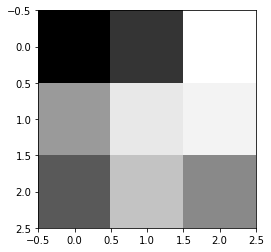

In [8]:
# generate a 2d patch
from utils.data_utils import gen_2d_patches
mask = nib.load('../Net/datasets/mask/mask_s01_still.nii')
data = nib.load('/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s01_still/diffusion.nii')
mask = np.array(mask.dataobj)
data = np.array(data.dataobj)
data = data / data.mean() - 1.0

base = 1
patch_size = 3
label_size = 3
mask = mask[base:-base, base:-base, base:-base]
data = data[:, :, base:-base, :]

pacthes = gen_2d_patches(data, mask, patch_size, label_size)
print(pacthes.shape)
plt.imshow(pacthes[9,:,:,0], cmap='gray')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(84, 84, 48, 96) (82, 82, 48)
(3640, 3, 3, 3, 96)
(3640, 3, 3, 3, 96)


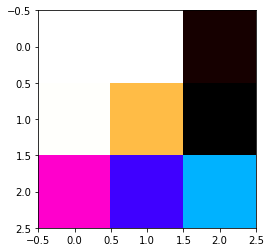

In [9]:
# generate a 3d patch
from utils.data_utils import gen_3d_patches
mask = nib.load('../Net/datasets/mask/mask_s01_still.nii')
data = nib.load('/home/vw/Desktop/IndividualProject/MedICSS2021_/Data-NODDI/s01_still/diffusion.nii')
mask = np.array(mask.dataobj)
data = np.array(data.dataobj)
data = data / data.mean() - 1.0

base = 1
patch_size = 3
label_size = 3
mask = mask[base:-base, base:-base, base:-base]
data = data[:, :, base:-base, :]

pacthes = gen_3d_patches(data, mask, patch_size, label_size)
print(pacthes.shape)
plt.imshow(pacthes[0,:,:,:,0], cmap='gray')

_______

<h3>Experiment 1. Discover the number of hidden acquired to produce promising each NODDI measure.</h3>

___

<h4>Test NDI</h4>
<strong>Training subject: s01_still<br/>

Test subject: s02_still<br/>

Outcome: NDI<br/></strong>


<h4>Data Preprocessing</h4>

In [10]:
"""
Generate the base dataset for s01_still and s02_still first.
"""
cmd = "--base --label_type N --subjects s01_still s02_still"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
base data dataset has shape: (84, 84, 50, 96)
base label dataset has shape: (84, 84, 50, 1)
Generating for s02_still ...
base data dataset has shape: (84, 84, 50, 96)
base label dataset has shape: (84, 84, 50, 1)


<strong>Interpret the result. </strong><br/>
The base dataset for s01_still and s02_still has the same shape.<br/>
The data has shape (84, 84, 50, 96); where (84, 84, 50) is the width, height and slice of each volume of DWI; where 96 is the volume of DWI<br/>
The label has shape (84, 84, 50, 1); where (84, 84, 50) is the width, height and slice of each volume of label; where 1 is the volume of label (because we are predicting NDI only in this case)


In [11]:
"""
Generate training dataset NDI for ANN.
"""
cmd = "--subjects s01_still --fc1d --label_type N"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (352800,)
data befor masking has shape: (352800, 96)
data after masking has shape: (82889, 96) the ratio of masked voxel is: 0.23494614512471657
training dataset has shape:(82889, 96)
mask has shape: (352800,)
data befor masking has shape: (352800, 1)
data after masking has shape: (82889, 1) the ratio of masked voxel is: 0.23494614512471657
training label has shape:(82889, 1)


<strong>
Interpret this result.
</strong> 
After the mask is applied to 96 volumes of DWI imgs, for each volume of img, there are 82889 1x1 patches (i.e. voxels) generated. Therefore, in total there are 82889x96=7957344 values as training dataset. <br/>
For each masked voxel, there is a corresponding NDI value. Therefore, the number of NDI values is the same as the number of masked voxels (82889). Becasue we are examine NDI only, hence only one value associated with each masked voxel.

<img src="/home/vw/Desktop/IndividualProject/Graphs/ANN Graphs/ANN Data Preprocessing.png" width="800" height="400">

In [12]:
# Generate the dataset for 2D CNN
cmd = "--subjects s01_still --conv2d --label_type N"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (82, 82, 48)
data has shape: (84, 84, 48, 96)
label has shape: (82, 82, 48, 1)
(82641, 3, 3, 96)
saved patches has shape: (82641, 3, 3, 96)
(82641, 1, 1, 1)
svaed labels has shape: (82641, 1, 1, 1)


<strong>
Interpret the result
</strong>
The masked voxels are 82641. For each masked voxel, there is a 3x3 patch which includes this masked voxel at the centre of the patch; but also including its 8 neighbouring voxels. Each masked voxel has 96 volumes of the 3x3 patch. Therefore, in total there are 82641 x 3 x 3 x 96 = 71401824 values as the training dataset.<br/>
Herein, because we only examine NDI. For each masked voxel, there is a corresponded predicted NDI value. Hence the number of masked voxels is the same for label and data. The label size is 1x1 because it is the NDI parameter for the masked voxel. The masked voxel has a size 1x1. And there is only one of this value for each masked voxel, since only NDI is considered.

<img src="/home/vw/Desktop/IndividualProject/Graphs/2D CNN graphs/2D CNN Data Preprocessing.png" width="800" height="400">

In [13]:
# Generate the dataset for 3D CNN
cmd = "--subjects s01_still --conv3d --label_type N"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (82, 82, 48)
data has shape: (84, 84, 50, 96)
label has shape: (82, 82, 48, 1)
(84, 84, 50, 96) (82, 82, 48)
(82641, 3, 3, 3, 96)
saved patches has shape: (82641, 2592)
(82, 82, 48, 1) (82, 82, 48)
(82641, 1, 1, 1, 1)
svaed labels has shape: (82641, 1, 1, 1, 1)


<strong>
Interpret the result
</strong>
The masked voxels are 82641. For each masked voxel, there is a 3x3x3 patch which includes this masked voxel at the centre of the patch; but also including its 26 neighbouring voxels. Each masked voxel has 96 volumes of 3x3x3 patch. Therefore, in total there are 82641 x 3 x 3 x 3 x 96 = 214205472 values as the training dataset.<br/>
Herein, because we only examine NDI. For each masked voxel, there is a corresponded predicted NDI value. Hence the number of masked voxels is the same for label and data. The label size is 1x1x1 because it is the NDI parameter for the masked voxel. The masked voxel has a size 1x1x1. And there is only one of this value for each masked voxel, since only NDI is considered.

In [14]:
"""
Using nib to fetch the ground truth img
"""
s02_NDI_path = '../Data-NODDI/s02_still/s02_still_NDI.nii'
s02_mask_path = '../Net/datasets/mask/mask_s02_still.nii'
s02_NDI_img = nib.load(s02_NDI_path)
s02_NDI_img_data = s02_NDI_img.get_fdata()
s02_mask_img = nib.load(s02_mask_path)
s02_mask_img_data = s02_mask_img.get_fdata()

<h4>Training</h4>

<strong>
The split between validation dataset and the training dataset is 5:5<br/>
The learning rate is 0.0001 to ensure a smooth learning<br/>
Herein, at most 6 hidden fully connected layers are trained.<br/>
Loss curve for each training is plotted.<br/>
The test result is also generated -- evaluating the RMSE and SSIM between pred and reference.<br/>
The reference image and the genereated image are displayed side by side.</br>
The difference map between the ref img and the pred img is also generated
</strong>

<strong>1 layer</strong>

ANN

2022-03-20 16:44:18.296694: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2022-03-20 16:44:18.328420: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-20 16:44:18.328529: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce RTX 3060 computeCapability: 8.6
coreClock: 1.777GHz coreCount: 28 deviceMemorySize: 11.76GiB deviceMemoryBandwidth: 335.32GiB/s
2022-03-20 16:44:18.328551: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2022-03-20 16:44:18.331216: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2022-03-20 16:44:18.355486: I tensorflow/stream_executor/pl

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 96)]              0         
_________________________________________________________________
dense (Dense)                (None, 150)               14550     
_________________________________________________________________
dropout (Dropout)            (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 14,701
Trainable params: 14,701
Non-trainable params: 0
_________________________________________________________________
['N']
(82889, 96)
(82889, 150)
(82889, 150)
(82889, 1)
Training start ...


2022-03-20 16:44:18.684908: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:44:18.684953: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1391] Profiler found 1 GPUs
2022-03-20 16:44:18.686340: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcupti.so.10.1
2022-03-20 16:44:18.686967: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


2022-03-20 16:44:18.968532: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:44:18.971123: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:44:18.971515: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:44:18.973046: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_44_18
2022-03-20 16:44:18.973602: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_44_18/vw.trace.json.gz
2022-03-20 16:44:18.973660: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:44:18.975357: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

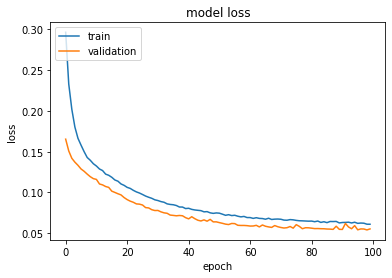

In [15]:
# 1 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 1 --train --label_type N"
plot_loss(cmd)

<img src="/home/vw/Desktop/IndividualProject/Graphs/ANN Graphs/ANN Input Layer.png" width="800" height="400">

To verify this, the output shape from the Input layer is [(None, 96)]. Since we are using 96 DWI images as input size. Therefore, it is true that the graph shows the correct thing. The output from the Input layer is N number of masked voxel. Each voxel has size (1,1). Therefore, in total 96 values

<img src="/home/vw/Desktop/IndividualProject/Graphs/ANN Graphs/ANN FC Layer.png" width="800" height="400">

To verify this, the output shape after the first dense layer is (None, 150). Where 150 is the output dimenstion chosen for the model. Also, to verify the number of trained parameters. In this case N=96, M=150; the number of trained parameters are (96+1)x150=14550.

<img src="/home/vw/Desktop/IndividualProject/Graphs/Dropout Layer.png" width="800" height="400">

There are no parameter trained at this layer

<img src="/home/vw/Desktop/IndividualProject/Graphs/Output Layer.png" width="800" height="400">

In this case, we only have one neuron at the output layer. Becasue we are examing the network performance on deriving NDI. Therefore, the output shape is (1x1) patch, i.e. the NDI value of the chosen voxel. To verify the number of parameters trained, M=150 and output dimension is 1. So (150+1)x1=151 trained parameters

In [16]:
# 1 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 1 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

96-fc1d-patch_1-base_1-layer_1-label_NDI
(84, 50, 96)
Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 96)]              0         
_________________________________________________________________
dense_1 (Dense)              (None, 150)               14550     
_________________________________________________________________
dropout_1 (Dropout)          (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 14,701
Trainable params: 14,701
Non-trainable params: 0
_________________________________________________________________
testing data shape: (84, 84, 50, 96)
prediction has shape: (84, 84, 50, 1)
(84, 84, 50, 1)
prediction after repack has shape: (84, 84, 50, 1)
pred shape: (93643, 1)
gt has shape: (93643, 1)
the 

/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/nipy/io/files.py:145: FutureWarning: Default `strict` currently False; this will change to True in a future version of nipy
  ni_img = nipy2nifti(img, data_dtype = io_dtype)


2D CNN

Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d (Conv2D)              (None, 1, 1, 150)         129750    
_________________________________________________________________
dropout_2 (Dropout)          (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 1, 1, 1)           151       
Total params: 129,901
Trainable params: 129,901
Non-trainable params: 0
_________________________________________________________________
['N']
(82641, 3, 3, 96)
(82641, 1, 1, 150)
(82641, 1, 1, 150)
(82641, 1, 1, 1)
Training start ...


2022-03-20 16:44:42.623596: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:44:42.623688: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 16:44:43.011565: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:44:43.029327: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:44:43.029661: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:44:43.030927: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_44_43
2022-03-20 16:44:43.031439: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_44_43/vw.trace.json.gz
2022-03-20 16:44:43.031514: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:44:43.032233: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

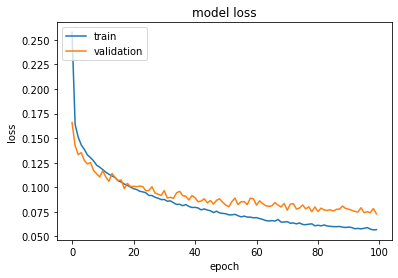

In [17]:
# 1 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 1 --train --label_type N"
plot_loss(cmd)

<img src="/home/vw/Desktop/IndividualProject/Graphs/2D CNN graphs/2D CNN Input Layer.png" width="800" height="400">

To verify this, the output shape from the Input layer is [(None, 3, 3, 96)]. Since we are using 96 DWI images as input size. Therefore, it is true that the graph shows the correct thing. The output from the Input layer is N number of 3x3 patches contains the masked voxel at the centre and it neighbouring 8 voxels. Each voxel has size (1,1), suggest the information at this voxel.

<img src="/home/vw/Desktop/IndividualProject/Graphs/2D CNN graphs/2D CNN Conv Layer.png" width="800" height="400">

To verify this, the output shape after the first dense layer is (None, 1, 1, 150). Where 150 is the output dimenstion chosen for the model. Also, to verify the number of trained parameters. In this case N=96, M=150; the number of trained parameters are (3x3x96+1)x150=129750.

<img src="/home/vw/Desktop/IndividualProject/Graphs/Dropout Layer.png" width="800" height="400">

<img src="/home/vw/Desktop/IndividualProject/Graphs/2D CNN graphs/2D CNN Output Layer.png" width="800" height="400">

In this case, we only have one neuron at the output layer. Becasue we are examing the network performance on deriving NDI. Therefore, the output shape is (1x1) patch, i.e. the NDI value of the central masked voxel. To verify the number of parameters trained, M=150 and output dimension is 1. So (150+1)x1=151 trained parameters

In [18]:
# 1 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 1 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

96-conv2d-patch_3-base_1-layer_1-label_NDI
(84, 84, 96)
Model: "functional_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 82, 82, 150)       129750    
_________________________________________________________________
dropout_3 (Dropout)          (None, 82, 82, 150)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 82, 82, 1)         151       
Total params: 129,901
Trainable params: 129,901
Non-trainable params: 0
_________________________________________________________________
testing data shape: (50, 84, 84, 96)
prediction has shape: (50, 82, 82, 1)
(84, 84, 50, 1)
prediction after repack has shape: (84, 84, 50, 1)
pred shape: (93643, 1)
gt has shape: (93643, 1)

3D CNN

Model: "functional_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d (Conv3D)              (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
dropout_4 (Dropout)          (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_1 (Conv3D)            (None, 1, 1, 1, 1)        151       
Total params: 389,101
Trainable params: 389,101
Non-trainable params: 0
_________________________________________________________________
['N']
(82641, 3, 3, 3, 96)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 1)


2022-03-20 16:45:29.998571: W tensorflow/core/framework/cpu_allocator_impl.cc:81] Allocation of 856821888 exceeds 10% of free system memory.
2022-03-20 16:45:30.415712: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:45:30.415802: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


Training start ...


2022-03-20 16:45:30.837404: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:45:30.857421: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:45:30.857691: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:45:30.858692: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_45_30
2022-03-20 16:45:30.859203: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_45_30/vw.trace.json.gz
2022-03-20 16:45:30.859273: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:45:30.859990: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

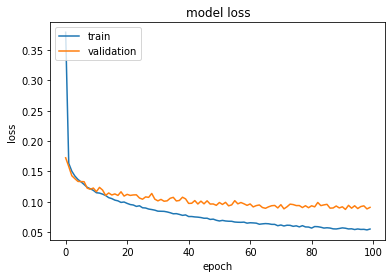

In [19]:
# 1 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 1 --train --label_type N"
plot_loss(cmd)

In [20]:
# 1 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 1 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

96-conv3d-patch_3-base_1-layer_1-label_NDI
(84, 84, 50)
Model: "functional_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_2 (Conv3D)            (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
dropout_5 (Dropout)          (None, 82, 82, 48, 150)   0         
_________________________________________________________________
conv3d_3 (Conv3D)            (None, 82, 82, 48, 1)     151       
Total params: 389,101
Trainable params: 389,101
Non-trainable params: 0
_________________________________________________________________
testing data shape: (1, 84, 84, 50, 96)
prediction has shape: (1, 82, 82, 48, 1)
(84, 84, 50, 1)
prediction after repack has shape: (84, 84, 50, 1)
pred shape: (93643, 1)
gt has shape: (936

the ssim score for ann is: 0.9776985685262414
the ssim score for 2d cnn is: 0.9569986975774049
the ssim score for 3d cnn is: 0.9388051191408453


Text(0.5, 0.98, 'Difference map 3D CNN')

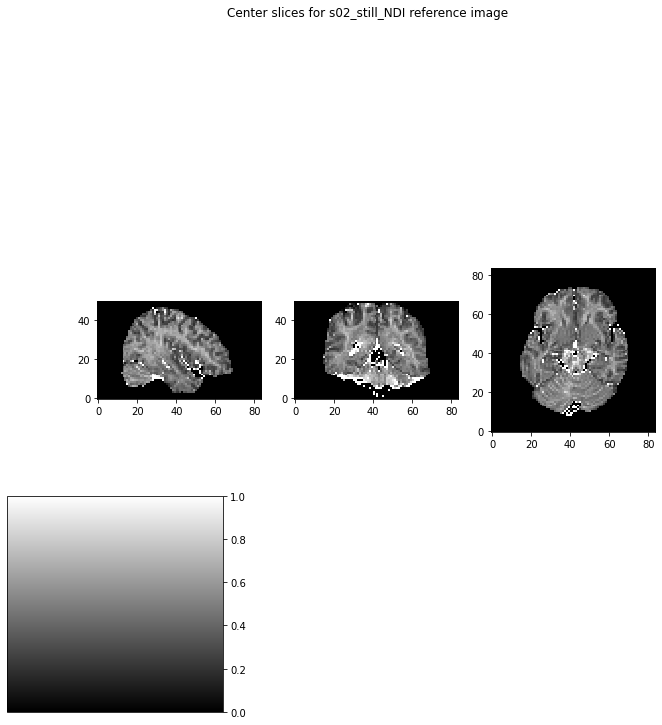

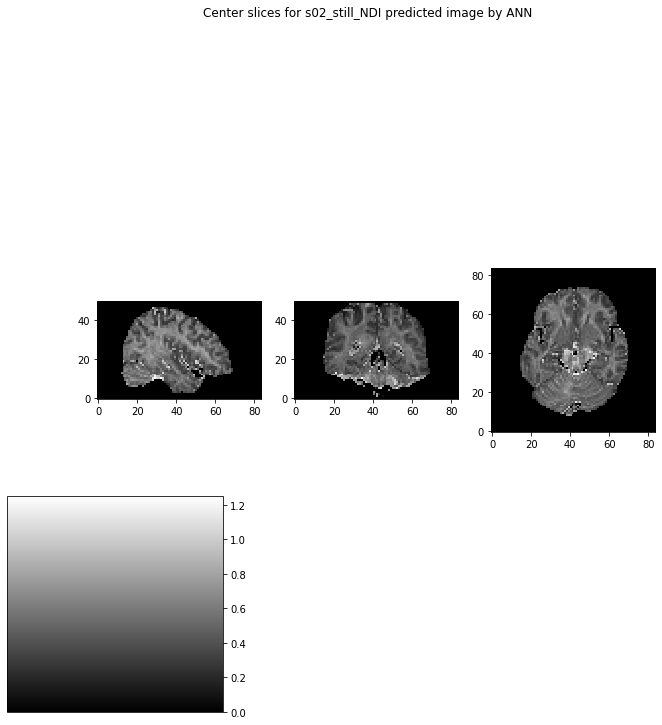

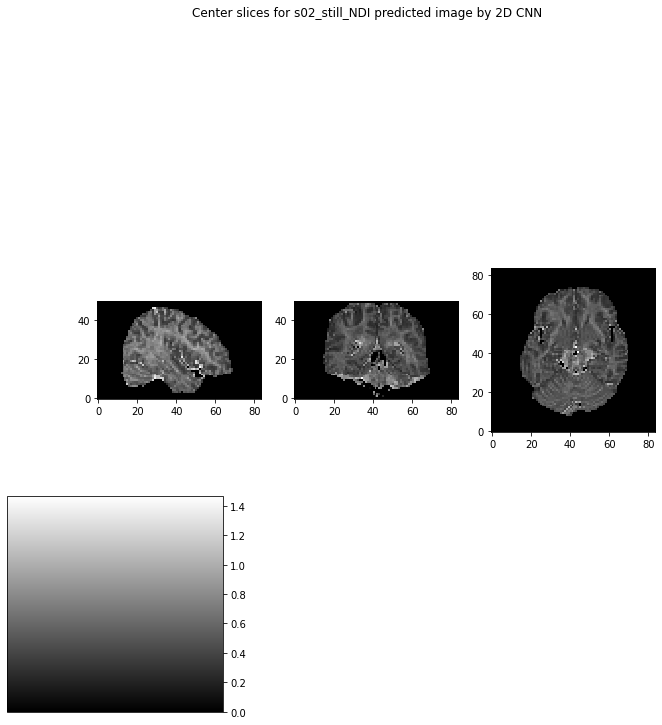

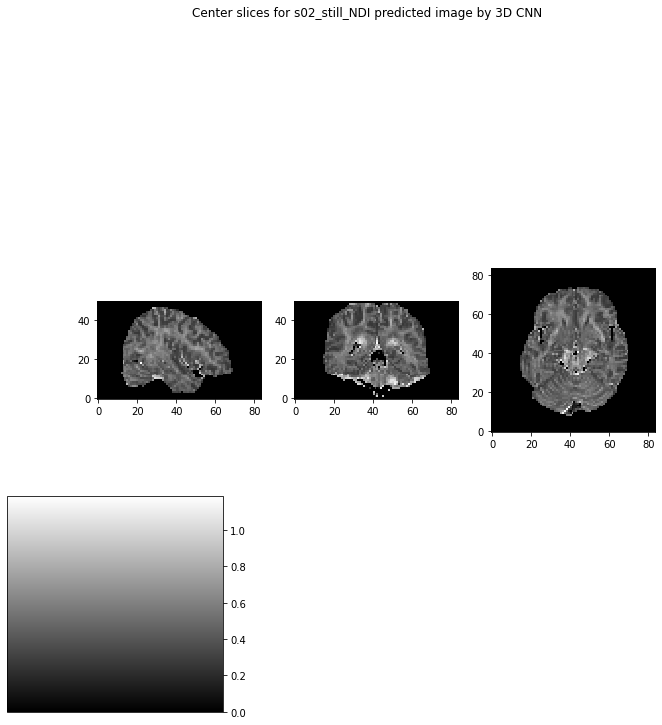

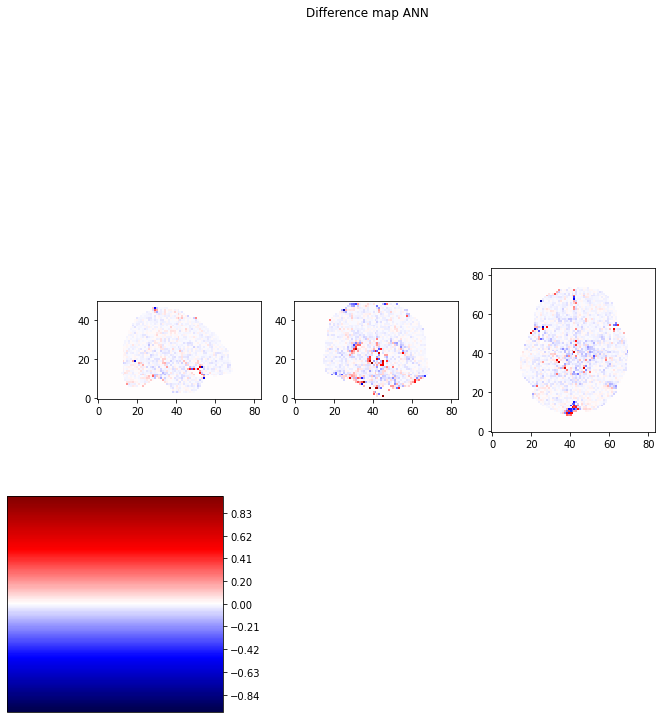

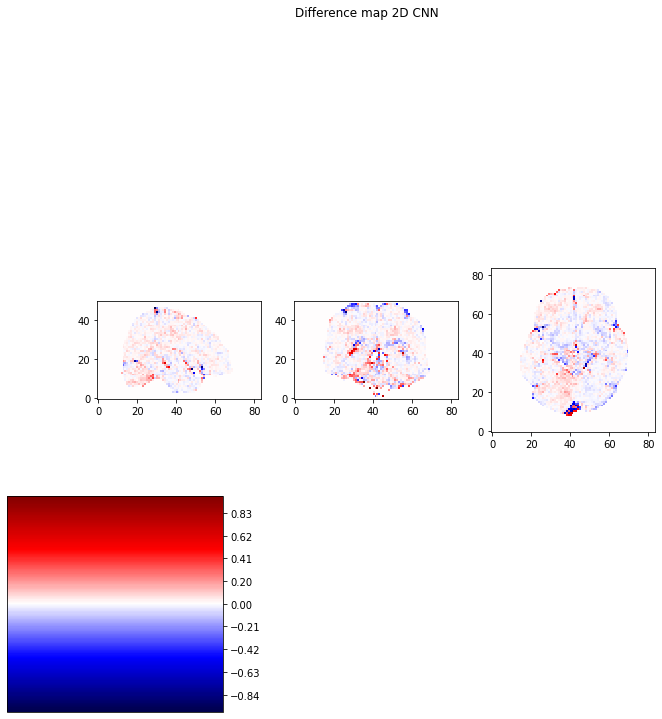

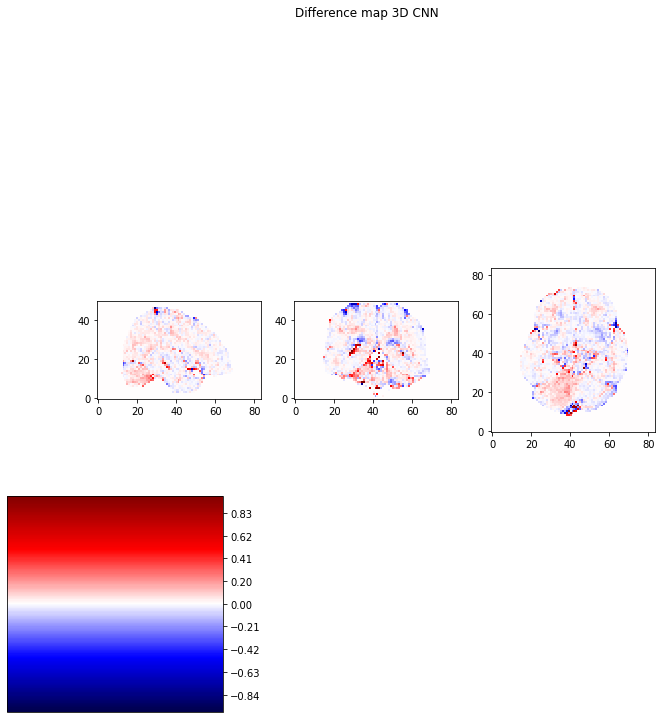

In [21]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_1-label_NDI.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_1-label_NDI.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_1-label_NDI.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_NDI_img_data[26, :, :]
ref_slice_1 = s02_NDI_img_data[:, 30, :]
ref_slice_2 = s02_NDI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_NDI reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_NDI predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_NDI_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))


cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_NDI predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_NDI_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))


cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_NDI predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_NDI_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))


# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>2 layer</strong>

ANN

Model: "functional_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 96)]              0         
_________________________________________________________________
dense_2 (Dense)              (None, 150)               14550     
_________________________________________________________________
dense_3 (Dense)              (None, 150)               22650     
_________________________________________________________________
dropout_6 (Dropout)          (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 37,351
Trainable params: 37,351
Non-trainable params: 0
_________________________________________________________________
['N']
(82889, 96)
(82889, 150)
(82889, 150)
(82889, 150)
(82889, 1)
Training start ...


2022-03-20 16:47:29.436212: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:47:29.436308: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 16:47:29.704068: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:47:29.724014: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:47:29.724329: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:47:29.725486: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_47_29
2022-03-20 16:47:29.726103: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_47_29/vw.trace.json.gz
2022-03-20 16:47:29.726175: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:47:29.727030: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

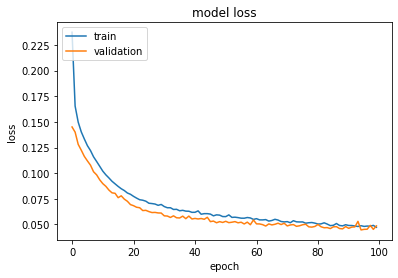

96-fc1d-patch_1-base_1-layer_2-label_NDI
(84, 50, 96)
Model: "functional_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 96)]              0         
_________________________________________________________________
dense_4 (Dense)              (None, 150)               14550     
_________________________________________________________________
dense_5 (Dense)              (None, 150)               22650     
_________________________________________________________________
dropout_7 (Dropout)          (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 37,351
Trainable params: 37,351
Non-trainable params: 0
_________________________________________________________________
testing data shape: (84, 84, 50, 96)
prediction has shape: (8

In [22]:
# 2 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 2 --train --label_type N"
plot_loss(cmd)
# 2 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 2 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_8 (Dropout)          (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 1, 1, 1)           151       
Total params: 152,551
Trainable params: 152,551
Non-trainable params: 0
_________________________________________________________________
['N']
(82641, 3, 3, 96)
(82641, 1, 1, 150)
(82641, 1, 1, 150)
(82641, 1, 1, 150)
(82641, 1, 1, 1)
Training start 

2022-03-20 16:48:00.011926: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:48:00.012007: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 16:48:00.450615: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:48:00.471470: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:48:00.471737: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:48:00.472747: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_48_00
2022-03-20 16:48:00.473281: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_48_00/vw.trace.json.gz
2022-03-20 16:48:00.473357: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:48:00.474135: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

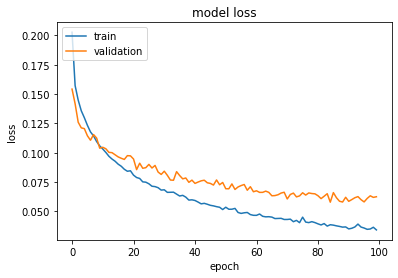

96-conv2d-patch_3-base_1-layer_2-label_NDI
(84, 84, 96)
Model: "functional_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_9 (Dropout)          (None, 82, 82, 150)       0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 82, 82, 1)         151       
Total params: 152,551
Trainable params: 152,551
Non-trainable params: 0
_________________________________________________________________
testing data shape: (50, 84, 84, 96)
prediction has shape

In [23]:
# 2 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 2 --train --label_type N"
plot_loss(cmd)
# 2 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 2 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_4 (Conv3D)            (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_5 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_10 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_6 (Conv3D)            (None, 1, 1, 1, 1)        151       
Total params: 411,751
Trainable params: 411,751
Non-trainable params: 0
_________________________________________________________________
['N']
(82641, 3, 3, 3, 96)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 1)


2022-03-20 16:48:58.029386: W tensorflow/core/framework/cpu_allocator_impl.cc:81] Allocation of 856821888 exceeds 10% of free system memory.
2022-03-20 16:48:58.469426: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:48:58.469535: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


Training start ...


2022-03-20 16:48:58.909274: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:48:58.933454: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:48:58.933728: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:48:58.934808: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_48_58
2022-03-20 16:48:58.935361: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_48_58/vw.trace.json.gz
2022-03-20 16:48:58.935437: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:48:58.936213: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

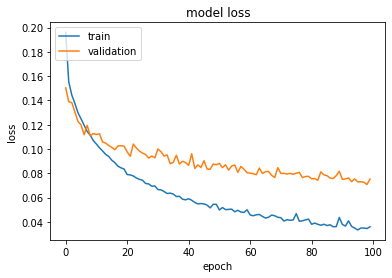

96-conv3d-patch_3-base_1-layer_2-label_NDI
(84, 84, 50)
Model: "functional_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_7 (Conv3D)            (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_8 (Conv3D)            (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_11 (Dropout)         (None, 82, 82, 48, 150)   0         
_________________________________________________________________
conv3d_9 (Conv3D)            (None, 82, 82, 48, 1)     151       
Total params: 411,751
Trainable params: 411,751
Non-trainable params: 0
_________________________________________________________________
testing data shape: (1, 84, 84, 50, 96)
prediction has sh

In [24]:
# 2 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 2 --train --label_type N"
plot_loss(cmd)
# 2 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 2 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9832162050181108
the ssim score for 2d cnn is: 0.967438818471837
the ssim score for 3d cnn is: 0.9577126228080535


Text(0.5, 0.98, 'Difference map 3D CNN')

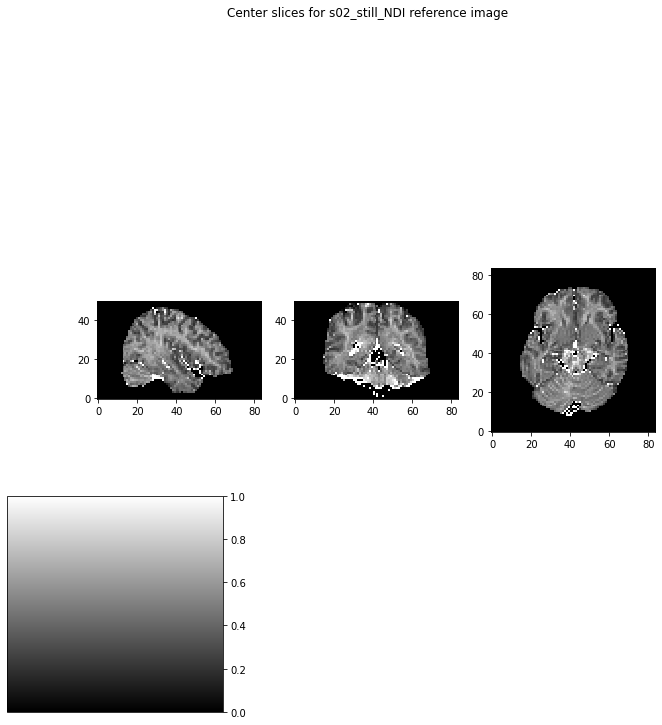

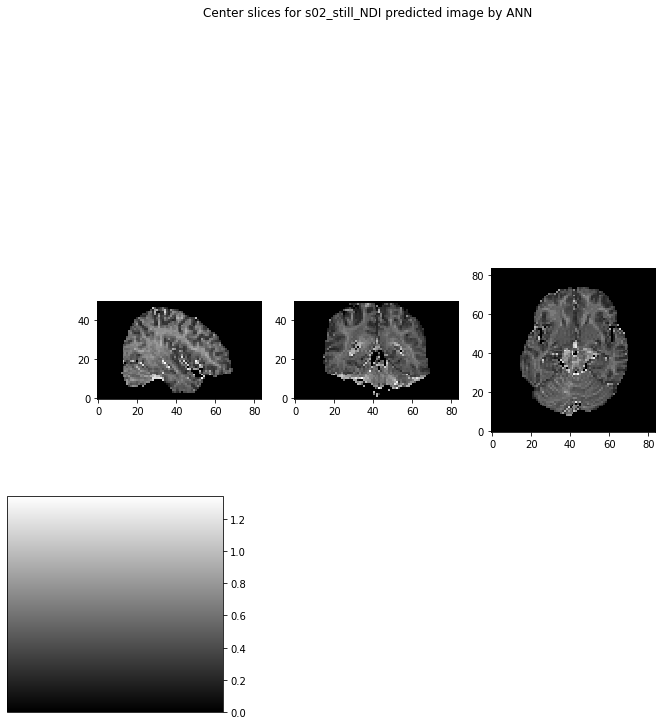

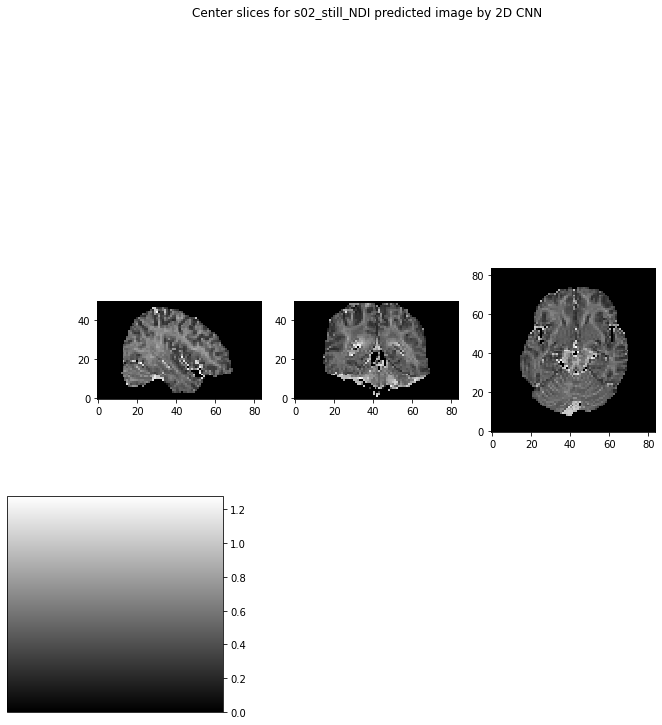

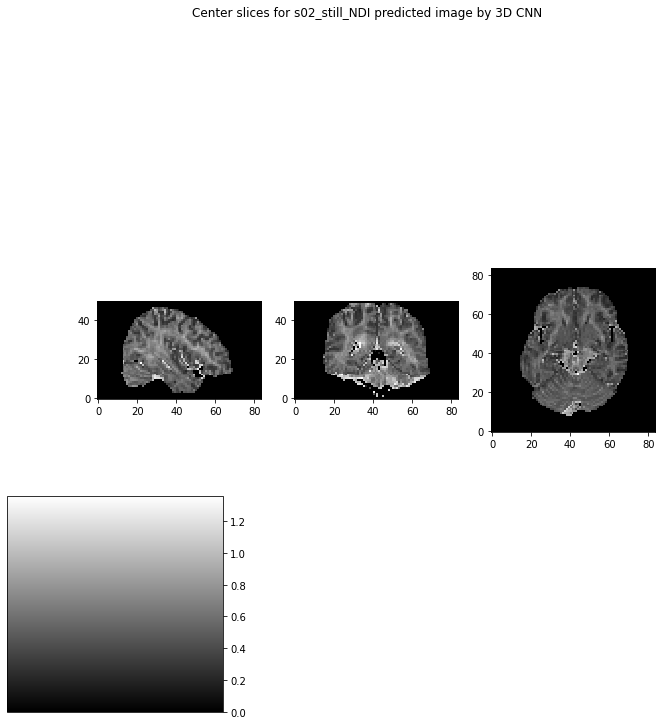

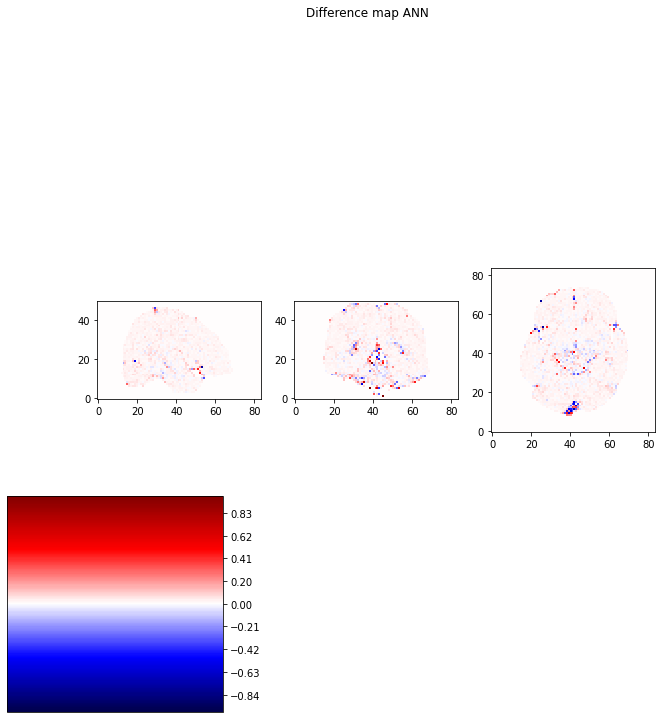

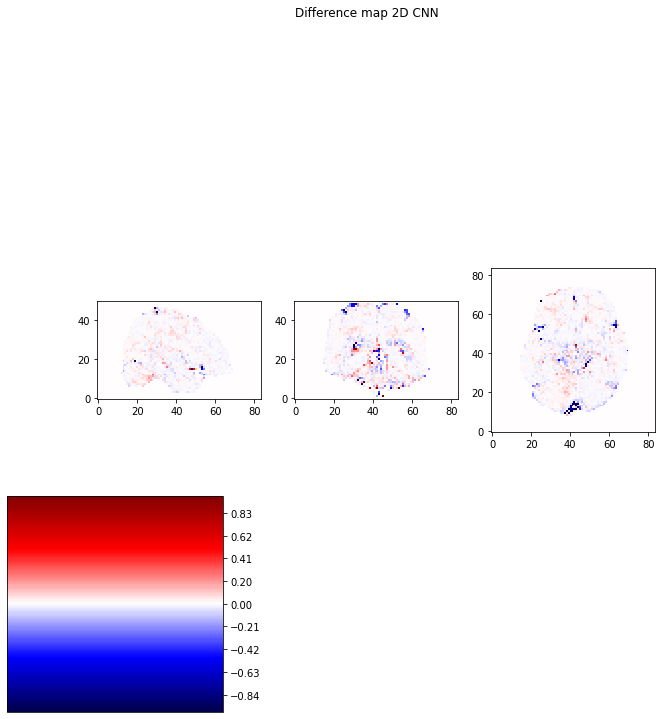

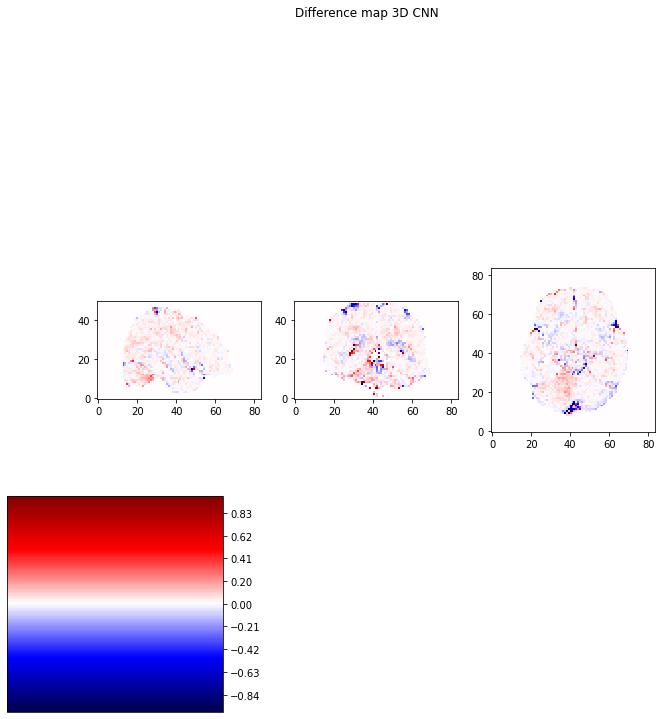

In [25]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_2-label_NDI.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_2-label_NDI.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_2-label_NDI.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_NDI_img_data[26, :, :]
ref_slice_1 = s02_NDI_img_data[:, 30, :]
ref_slice_2 = s02_NDI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_NDI reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_NDI predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_NDI_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_NDI predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_NDI_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_NDI predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_NDI_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>3 layer</strong>

ANN

Model: "functional_37"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_6 (Dense)              (None, 150)               14550     
_________________________________________________________________
dense_7 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_8 (Dense)              (None, 150)               22650     
_________________________________________________________________
dropout_12 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 60,001
Trainable params: 60,001
Non-trainable params: 0
_________________________________________________

2022-03-20 16:51:05.637458: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:51:05.637624: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 16:51:05.933246: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:51:05.955717: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:51:05.955989: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:51:05.957050: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_51_05
2022-03-20 16:51:05.957648: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_51_05/vw.trace.json.gz
2022-03-20 16:51:05.957733: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:51:05.958530: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

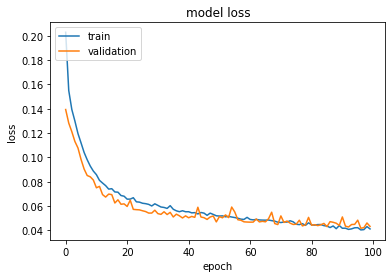

96-fc1d-patch_1-base_1-layer_3-label_NDI
(84, 50, 96)
Model: "functional_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_14 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_9 (Dense)              (None, 150)               14550     
_________________________________________________________________
dense_10 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_11 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_13 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 60,001
Trainable params: 60,001
Non-trainable param

In [26]:
# 3 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 3 --train --label_type N"
plot_loss(cmd)
# 2 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 3 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_43"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_15 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_14 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 1, 1, 1)           151       
Total params: 175,201
Trainable params: 175,201
Non-trainable params: 0
_______________________________________________

2022-03-20 16:51:41.571706: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:51:41.571787: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 16:51:42.017124: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:51:42.041994: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:51:42.042284: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:51:42.043517: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_51_42
2022-03-20 16:51:42.044205: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_51_42/vw.trace.json.gz
2022-03-20 16:51:42.044309: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:51:42.045287: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

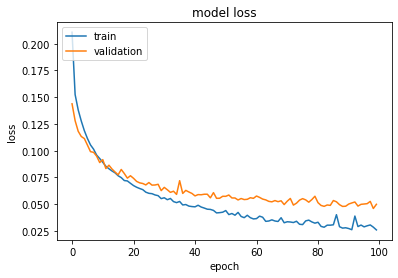

96-conv2d-patch_3-base_1-layer_3-label_NDI
(84, 84, 96)
Model: "functional_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_15 (Dropout)         (None, 82, 82, 150)       0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 82, 82, 1)         151       
Total params: 175,201
Trainable params: 175,201
Non-trainable p

In [27]:
# 3 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 3 --train --label_type N"
plot_loss(cmd)
# 3 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 3 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_10 (Conv3D)           (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_11 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_12 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_16 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_13 (Conv3D)           (None, 1, 1, 1, 1)        151       
Total params: 434,401
Trainable params: 434,401
Non-trainable params: 0
_______________________________________________

2022-03-20 16:52:49.653314: W tensorflow/core/framework/cpu_allocator_impl.cc:81] Allocation of 856821888 exceeds 10% of free system memory.
2022-03-20 16:52:50.103010: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:52:50.103101: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


Training start ...


2022-03-20 16:52:50.606350: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:52:50.632673: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:52:50.632995: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:52:50.634135: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_52_50
2022-03-20 16:52:50.634766: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_52_50/vw.trace.json.gz
2022-03-20 16:52:50.634847: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:52:50.635681: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

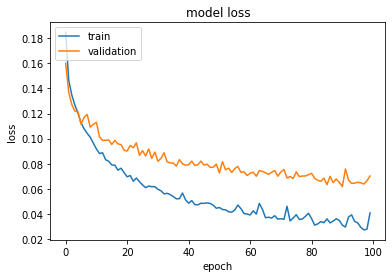

96-conv3d-patch_3-base_1-layer_3-label_NDI
(84, 84, 50)
Model: "functional_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_18 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_14 (Conv3D)           (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_15 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_16 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_17 (Dropout)         (None, 82, 82, 48, 150)   0         
_________________________________________________________________
conv3d_17 (Conv3D)           (None, 82, 82, 48, 1)     151       
Total params: 434,401
Trainable params: 434,401
Non-trainable p

In [28]:
# 3 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 3 --train --label_type N"
plot_loss(cmd)
# 3 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 3 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9848904895435766
the ssim score for 2d cnn is: 0.9740474325257386
the ssim score for 3d cnn is: 0.9607067200393911


Text(0.5, 0.98, 'Difference map 3D CNN')

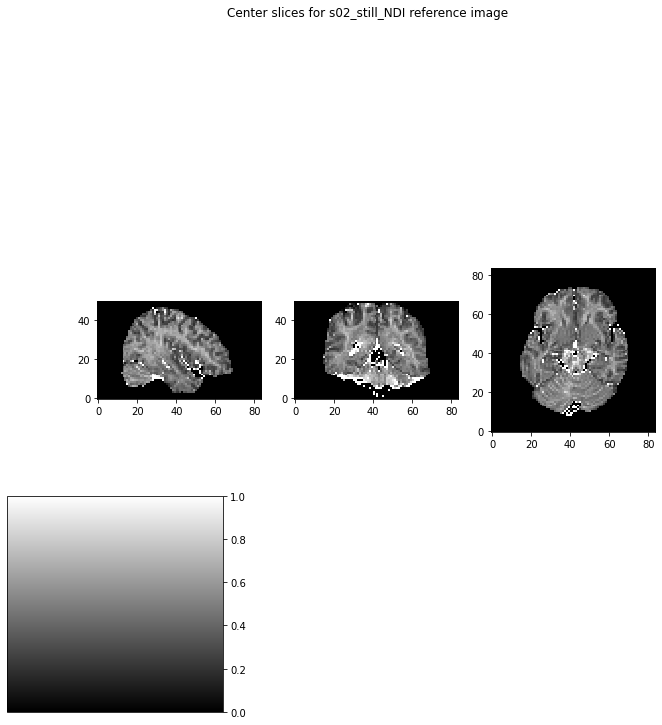

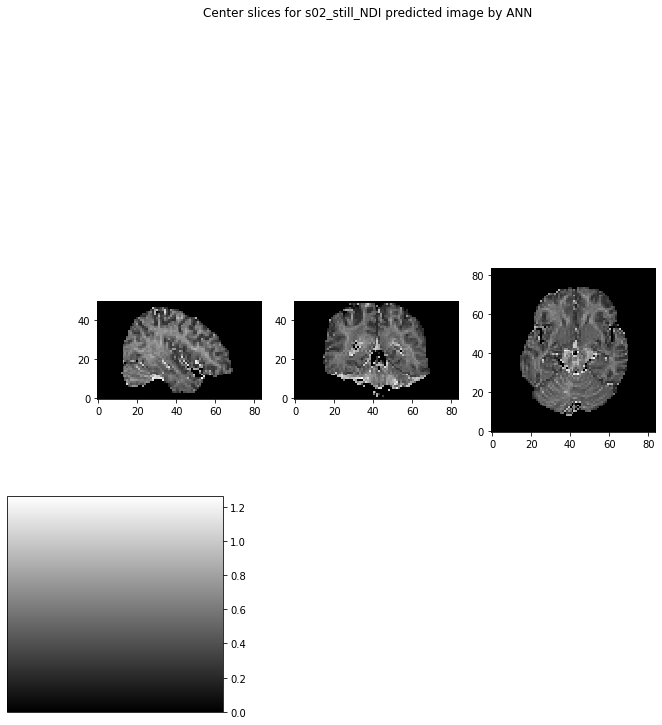

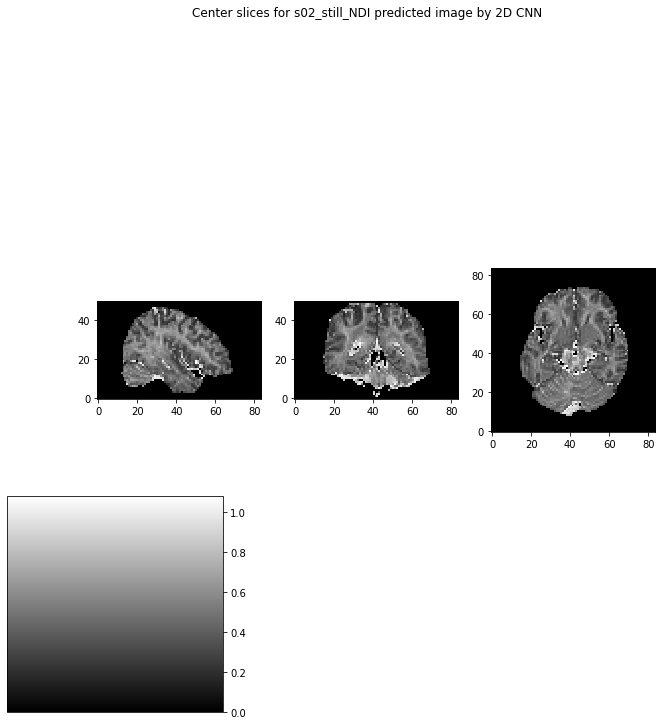

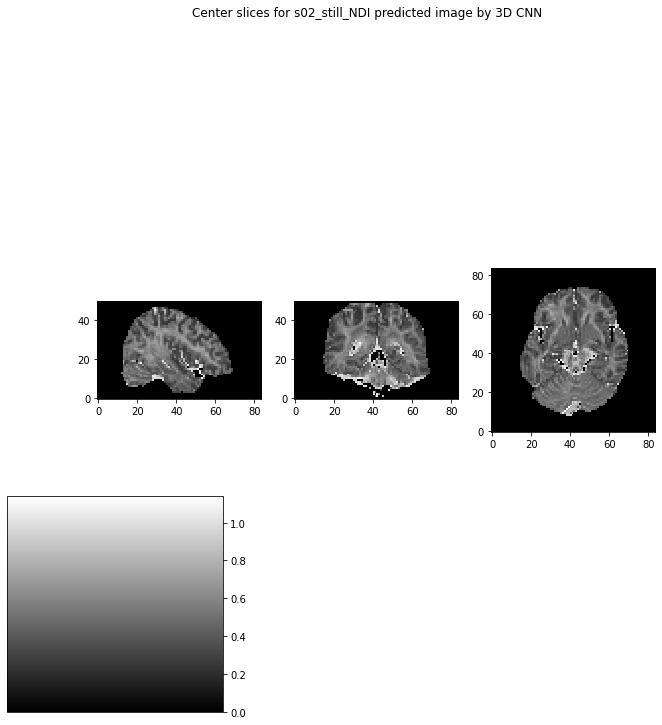

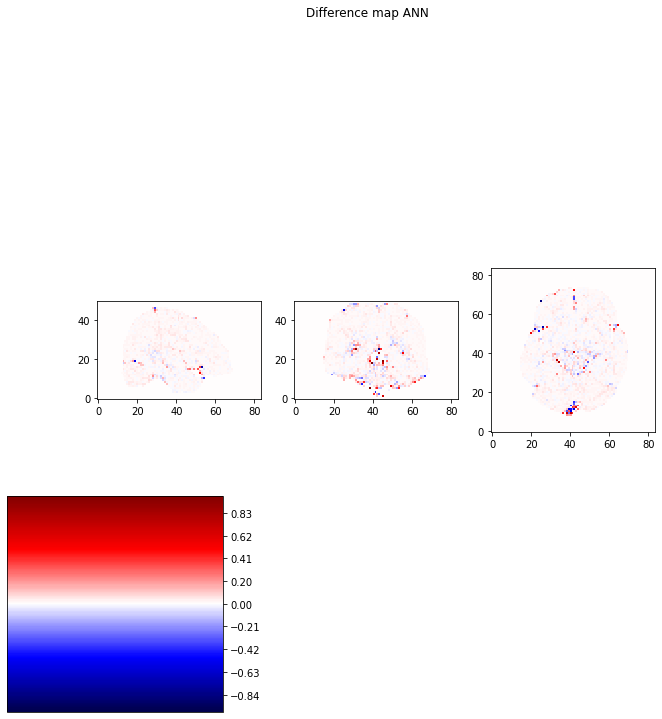

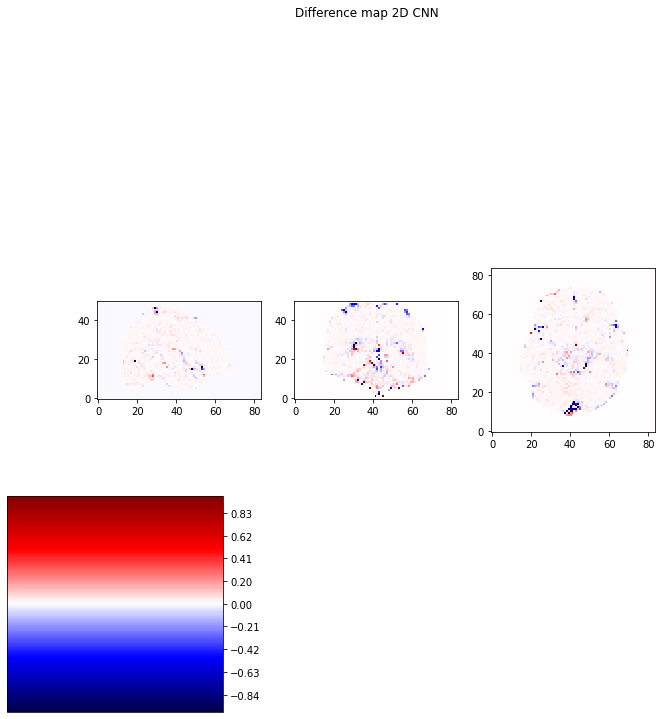

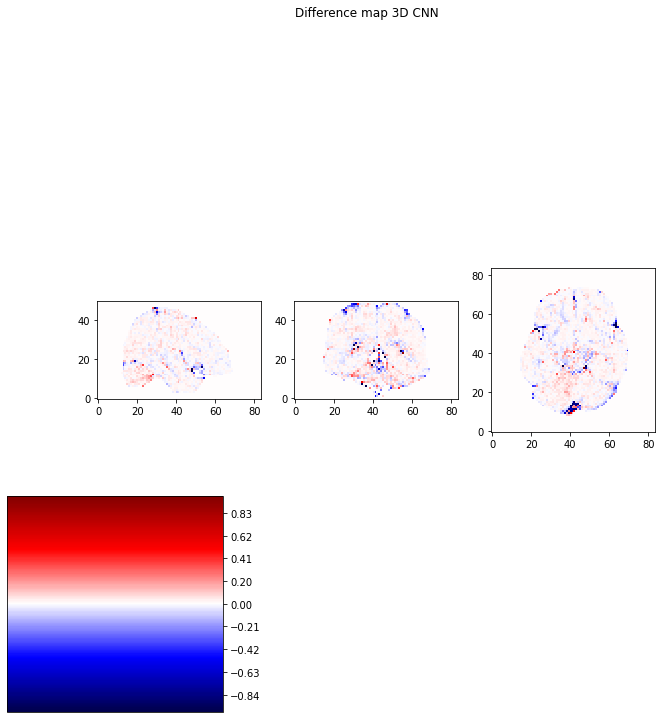

In [29]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_3-label_NDI.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_3-label_NDI.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_3-label_NDI.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_NDI_img_data[26, :, :]
ref_slice_1 = s02_NDI_img_data[:, 30, :]
ref_slice_2 = s02_NDI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_NDI reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_NDI predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_NDI_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_NDI predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_NDI_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_NDI predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_NDI_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>4 layer</strong>

ANN

Model: "functional_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_12 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_13 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_14 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_15 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_18 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)               

2022-03-20 16:55:06.942048: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:55:06.942139: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 16:55:07.255416: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:55:07.278116: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:55:07.278421: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:55:07.279574: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_55_07
2022-03-20 16:55:07.280181: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_55_07/vw.trace.json.gz
2022-03-20 16:55:07.280269: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:55:07.281238: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

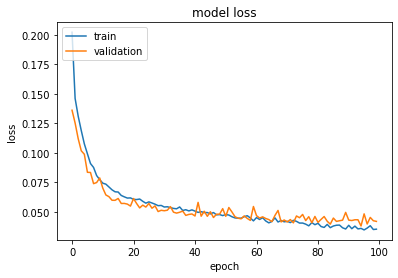

96-fc1d-patch_1-base_1-layer_4-label_NDI
(84, 50, 96)
Model: "functional_59"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_20 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_16 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_17 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_18 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_19 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_19 (Dropout)         (None, 150)               0         
_________________________________________________________________

In [30]:
# 4 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 4 --train --label_type N"
plot_loss(cmd)
# 4 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 4 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_21 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_20 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 1, 1, 1)         

2022-03-20 16:55:49.052472: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:55:49.052559: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 16:55:49.539807: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:55:49.568427: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:55:49.568736: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:55:49.570345: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_55_49
2022-03-20 16:55:49.571005: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_55_49/vw.trace.json.gz
2022-03-20 16:55:49.571128: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:55:49.572010: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

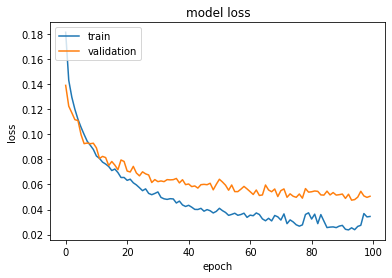

96-conv2d-patch_3-base_1-layer_4-label_NDI
(84, 84, 96)
Model: "functional_65"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_22 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_21 (Dropout)         (None, 82, 82, 150)       0         
_______________________________________________________________

In [31]:
# 4 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 4 --train --label_type N"
plot_loss(cmd)
# 4 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 4 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_67"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_23 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_18 (Conv3D)           (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_19 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_20 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_21 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_22 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_22 (Conv3D)           (None, 1, 1, 1, 1)      

2022-03-20 16:57:07.312831: W tensorflow/core/framework/cpu_allocator_impl.cc:81] Allocation of 856821888 exceeds 10% of free system memory.
2022-03-20 16:57:07.781285: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.


Training start ...


2022-03-20 16:57:07.781379: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 16:57:08.303813: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:57:08.331749: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:57:08.332079: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:57:08.333290: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_57_08
2022-03-20 16:57:08.333947: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_57_08/vw.trace.json.gz
2022-03-20 16:57:08.334039: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:57:08.334961: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

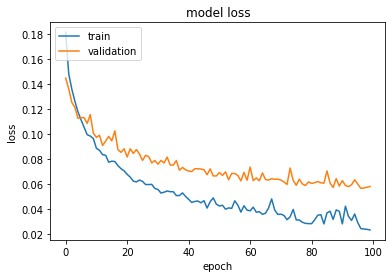

96-conv3d-patch_3-base_1-layer_4-label_NDI
(84, 84, 50)
Model: "functional_71"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_24 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_23 (Conv3D)           (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_24 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_25 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_26 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_23 (Dropout)         (None, 82, 82, 48, 150)   0         
_______________________________________________________________

In [32]:
# 4 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 4 --train --label_type N"
plot_loss(cmd)
# 4 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 4 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.983421892166916
the ssim score for 2d cnn is: 0.9744549774911737
the ssim score for 3d cnn is: 0.968462061577595


Text(0.5, 0.98, 'Difference map 3D CNN')

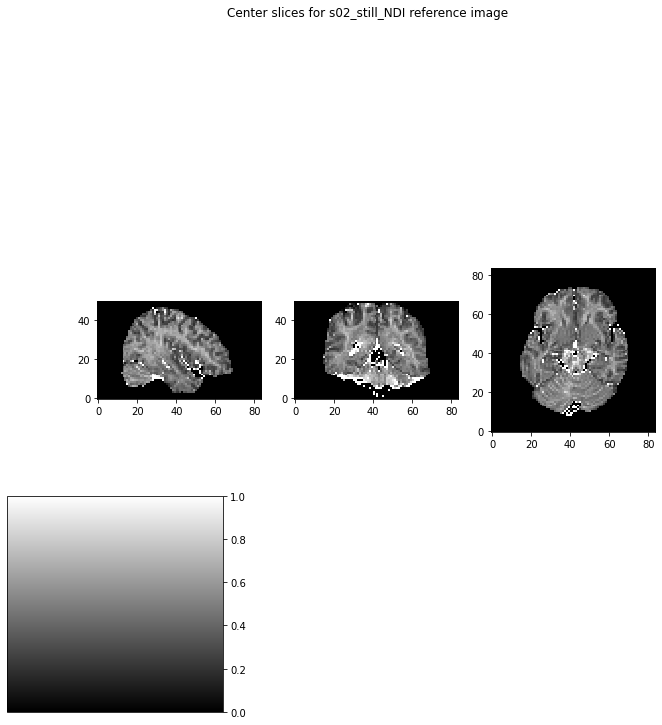

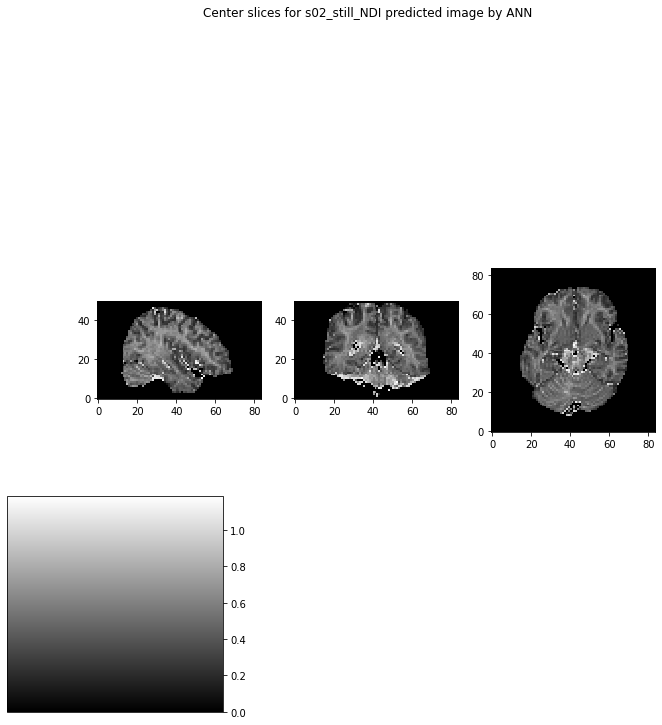

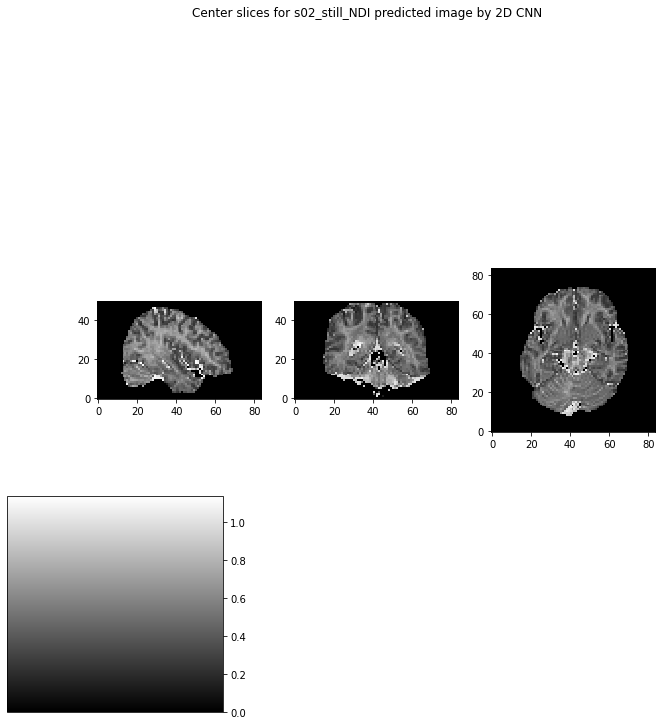

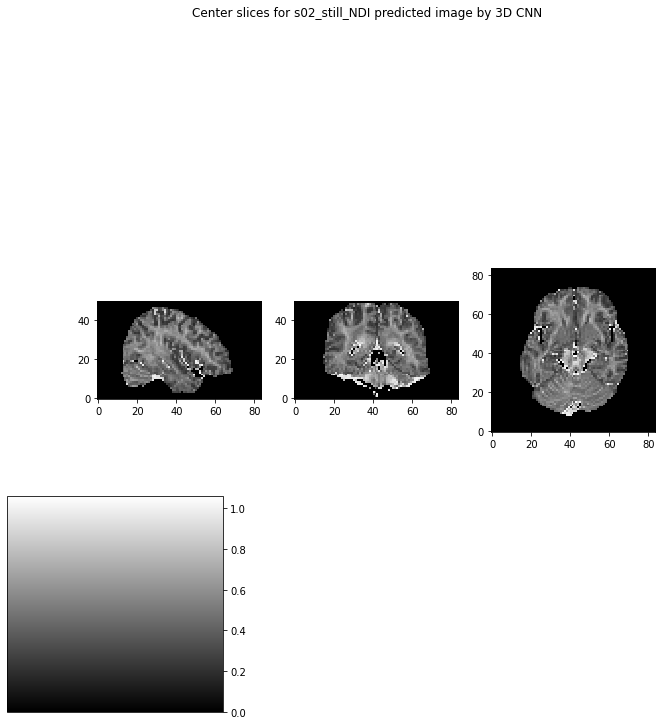

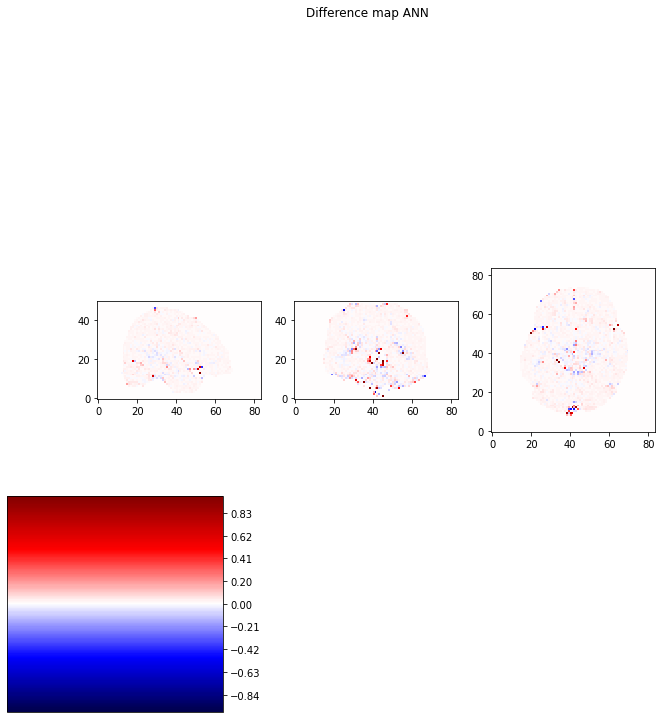

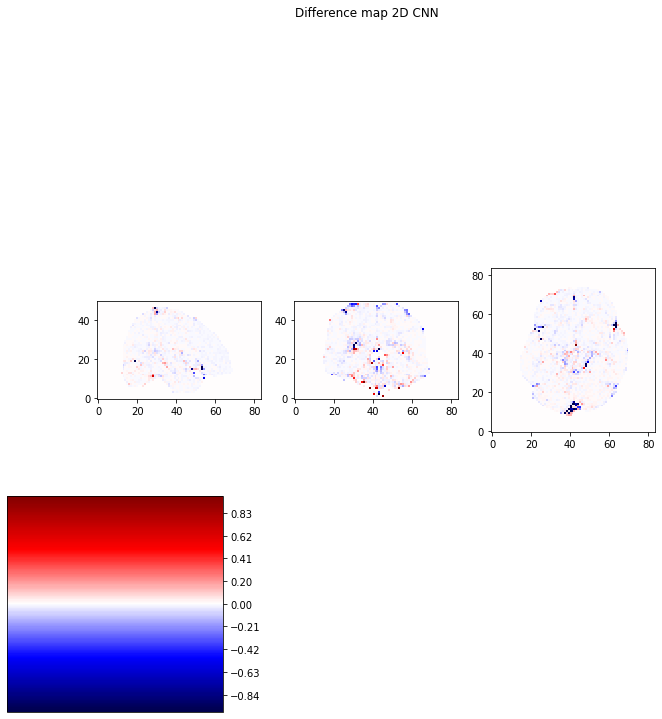

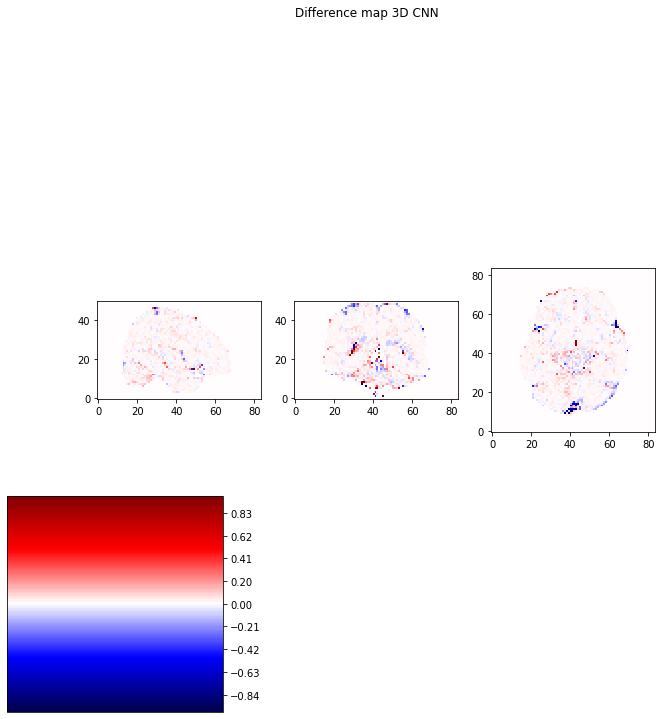

In [33]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_4-label_NDI.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_4-label_NDI.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_4-label_NDI.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_NDI_img_data[26, :, :]
ref_slice_1 = s02_NDI_img_data[:, 30, :]
ref_slice_2 = s02_NDI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_NDI reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_NDI predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_NDI_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_NDI predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_NDI_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_NDI predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_NDI_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>5 layer</strong>

ANN

Model: "functional_73"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_25 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_20 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_21 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_22 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_23 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_24 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_24 (Dropout)         (None, 150)             

2022-03-20 16:59:32.183342: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:59:32.183428: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 16:59:32.571782: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 16:59:32.598474: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 16:59:32.598792: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 16:59:32.600001: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_16_59_32
2022-03-20 16:59:32.600663: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_16_59_32/vw.trace.json.gz
2022-03-20 16:59:32.600767: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 16:59:32.601657: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

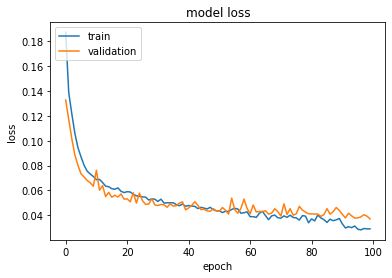

96-fc1d-patch_1-base_1-layer_5-label_NDI
(84, 50, 96)
Model: "functional_77"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_26 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_25 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_26 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_27 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_28 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_29 (Dense)             (None, 150)               22650     
_________________________________________________________________

In [34]:
# 5 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 5 --train --label_type N"
plot_loss(cmd)
# 5 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 5 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_79"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_27 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_26 (Dropout)         (None, 1, 1, 150)       

2022-03-20 17:00:19.517102: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:00:19.517220: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:00:20.046151: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:00:20.082735: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:00:20.083070: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:00:20.084343: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_00_20
2022-03-20 17:00:20.085016: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_00_20/vw.trace.json.gz
2022-03-20 17:00:20.085127: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:00:20.086077: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

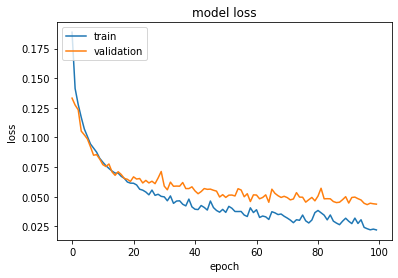

96-conv2d-patch_3-base_1-layer_5-label_NDI
(84, 84, 96)
Model: "functional_83"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_28 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_35 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 82, 82, 150)       22650     
_______________________________________________________________

In [35]:
# 5 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 5 --train --label_type N"
plot_loss(cmd)
# 5 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 5 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_85"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_29 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_28 (Conv3D)           (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_29 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_30 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_31 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_32 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_28 (Dropout)         (None, 1, 1, 1, 150)    

2022-03-20 17:01:47.367996: W tensorflow/core/framework/cpu_allocator_impl.cc:81] Allocation of 856821888 exceeds 10% of free system memory.


Training start ...


2022-03-20 17:01:47.865373: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:01:47.865462: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:01:48.454034: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:01:48.489743: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:01:48.490195: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:01:48.491776: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_01_48
2022-03-20 17:01:48.492573: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_01_48/vw.trace.json.gz
2022-03-20 17:01:48.492701: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:01:48.493864: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

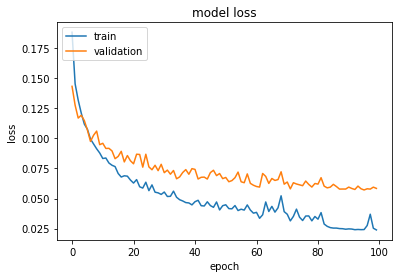

96-conv3d-patch_3-base_1-layer_5-label_NDI
(84, 84, 50)
Model: "functional_89"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_30 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_34 (Conv3D)           (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_35 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_36 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_37 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_38 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_______________________________________________________________

In [36]:
# 5 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 5 --train --label_type N"
plot_loss(cmd)
# 5 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 5 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9866233138233139
the ssim score for 2d cnn is: 0.9777428098064538
the ssim score for 3d cnn is: 0.9677417934743879


Text(0.5, 0.98, 'Difference map 3D CNN')

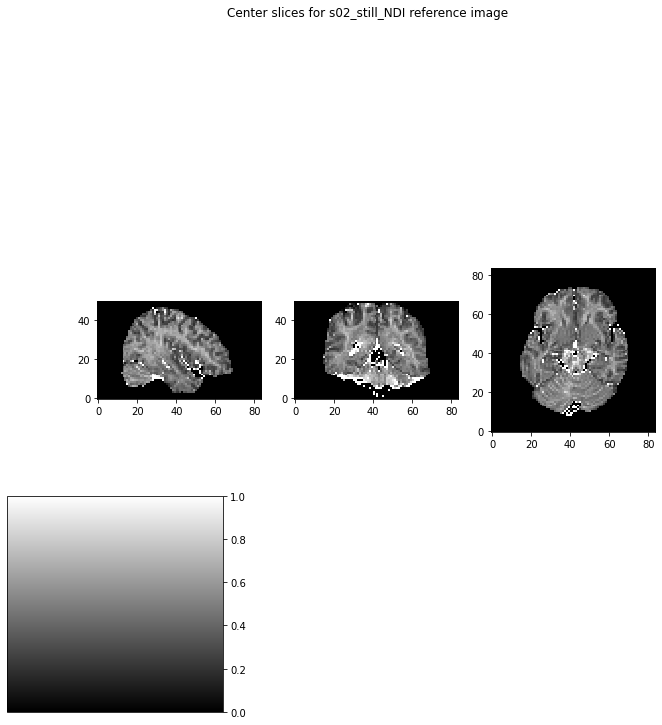

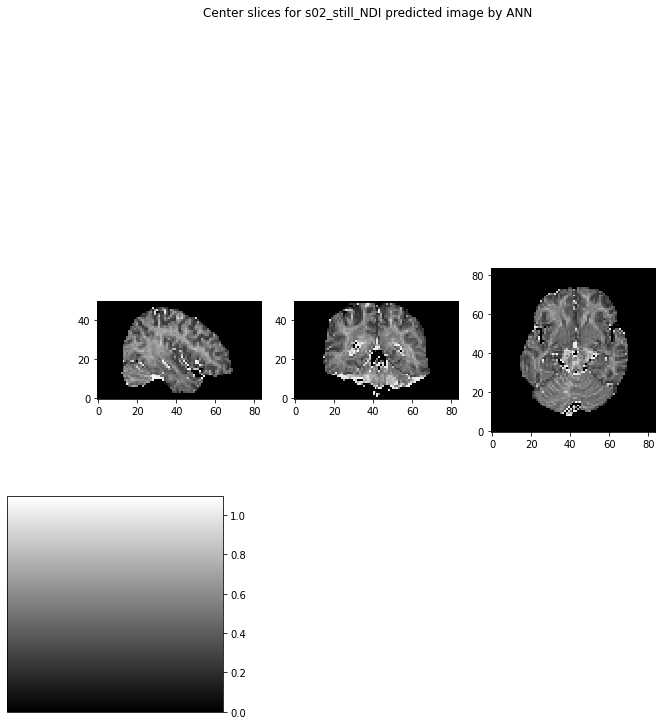

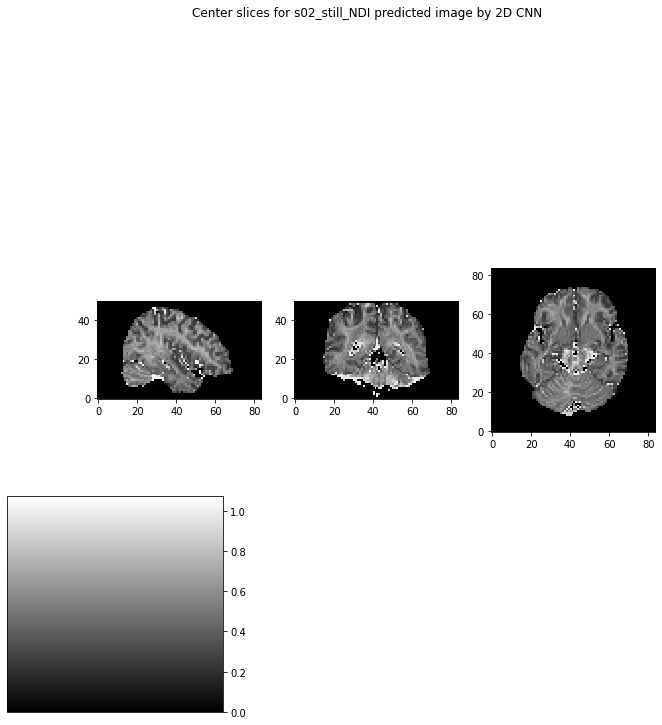

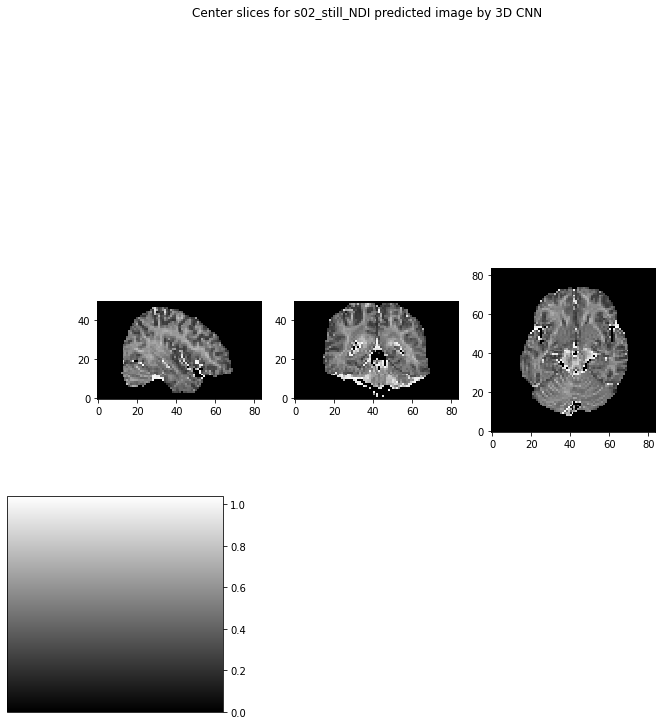

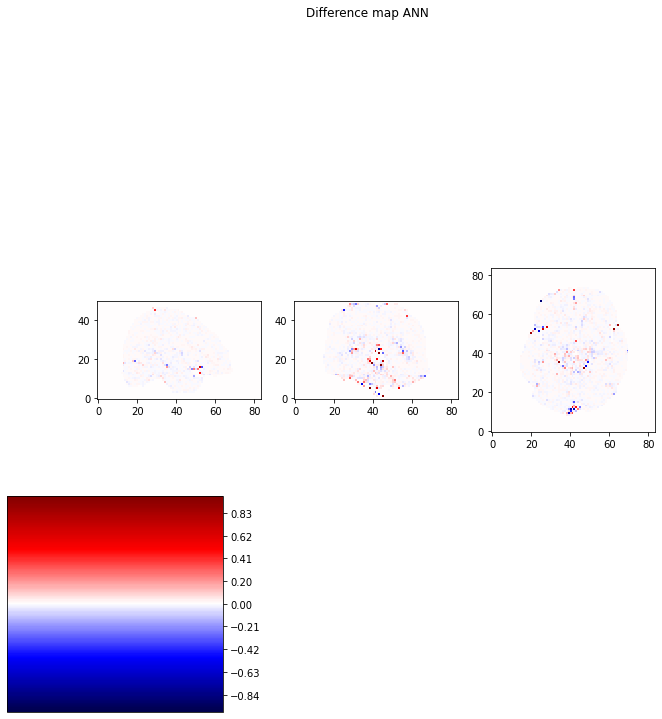

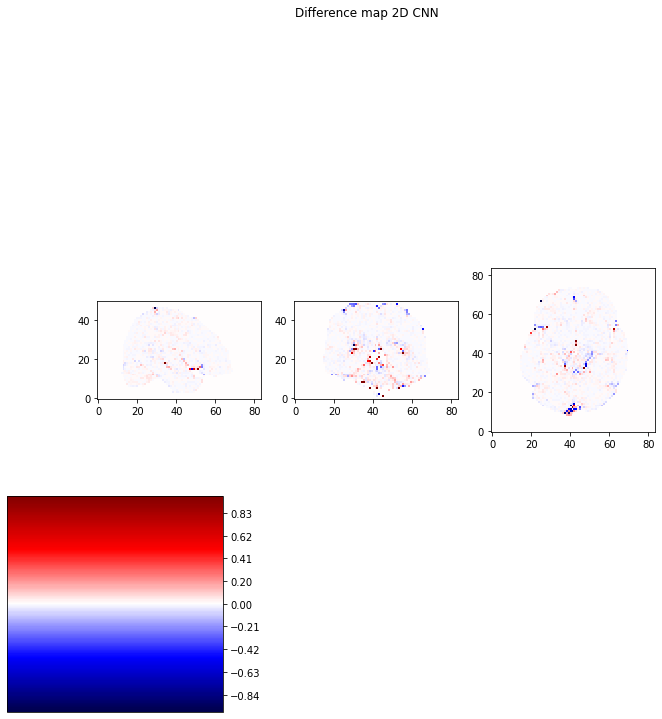

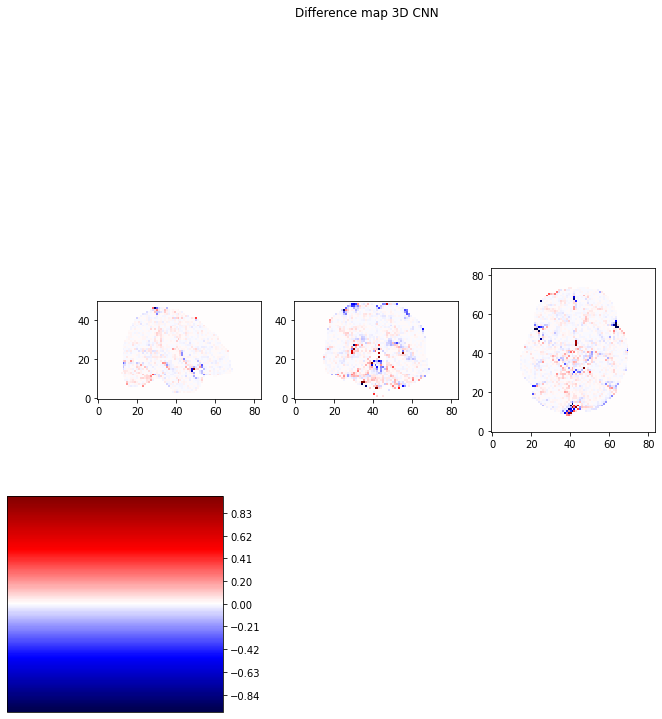

In [37]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_5-label_NDI.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_5-label_NDI.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_5-label_NDI.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_NDI_img_data[26, :, :]
ref_slice_1 = s02_NDI_img_data[:, 30, :]
ref_slice_2 = s02_NDI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_NDI reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_NDI predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_NDI_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_NDI predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_NDI_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_NDI predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_NDI_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>6 layer</strong>

ANN

Model: "functional_91"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_31 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_30 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_31 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_32 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_33 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_34 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_35 (Dense)             (None, 150)             

2022-03-20 17:04:22.423819: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:04:22.423904: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:04:22.831878: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:04:22.865278: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:04:22.865700: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:04:22.867273: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_04_22
2022-03-20 17:04:22.868039: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_04_22/vw.trace.json.gz
2022-03-20 17:04:22.868176: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:04:22.869266: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

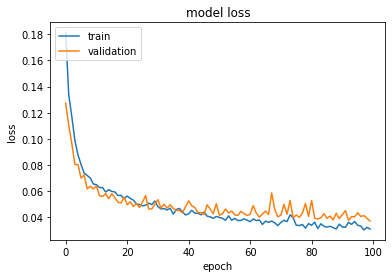

96-fc1d-patch_1-base_1-layer_6-label_NDI
(84, 50, 96)
Model: "functional_95"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_32 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_36 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_37 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_38 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_39 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_40 (Dense)             (None, 150)               22650     
_________________________________________________________________

In [38]:
# 6 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 6 --train --label_type N"
plot_loss(cmd)
# 6 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 6 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_97"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_33 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_40 (Conv2D)           (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_41 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_42 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_43 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 1, 1, 150)       

2022-03-20 17:05:15.049558: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:05:15.049654: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:05:15.584547: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:05:15.620009: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:05:15.620368: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:05:15.621645: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_05_15
2022-03-20 17:05:15.622370: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_05_15/vw.trace.json.gz
2022-03-20 17:05:15.622471: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:05:15.623388: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

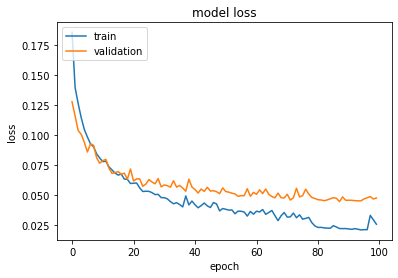

96-conv2d-patch_3-base_1-layer_6-label_NDI
(84, 84, 96)
Model: "functional_101"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_34 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_47 (Conv2D)           (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_48 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_49 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_50 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_51 (Conv2D)           (None, 82, 82, 150)       22650     
______________________________________________________________

In [39]:
# 6 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 6 --train --label_type N"
plot_loss(cmd)
# 6 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 6 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_103"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_35 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_40 (Conv3D)           (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_41 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_42 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_43 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_44 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_45 (Conv3D)           (None, 1, 1, 1, 150)   

2022-03-20 17:06:53.853040: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:06:53.853131: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:06:54.466247: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:06:54.504413: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:06:54.504877: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:06:54.506626: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_06_54
2022-03-20 17:06:54.507470: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_06_54/vw.trace.json.gz
2022-03-20 17:06:54.507596: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:06:54.508764: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

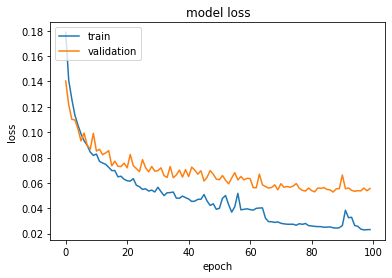

96-conv3d-patch_3-base_1-layer_6-label_NDI
(84, 84, 50)
Model: "functional_107"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_36 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_47 (Conv3D)           (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_48 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_49 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_50 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_51 (Conv3D)           (None, 82, 82, 48, 150)   22650     
______________________________________________________________

In [40]:
# 6 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 6 --train --label_type N"
plot_loss(cmd)
# 6 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 6 --label_type N"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9863839359544466
the ssim score for 2d cnn is: 0.9721119982966441
the ssim score for 3d cnn is: 0.968384830489598


Text(0.5, 0.98, 'Difference map 3D CNN')

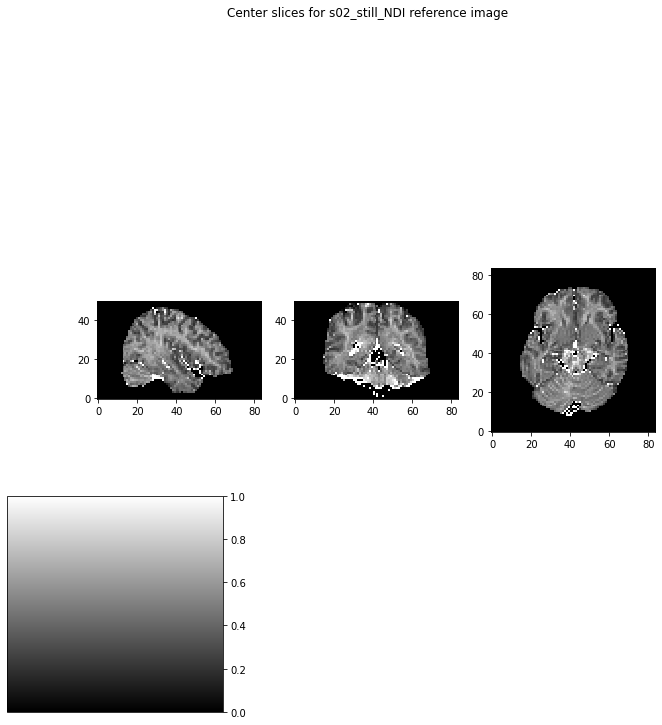

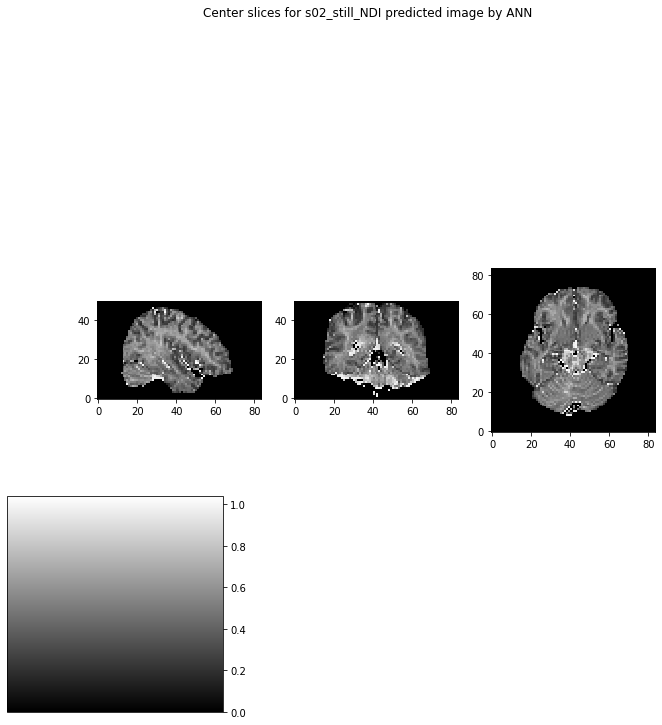

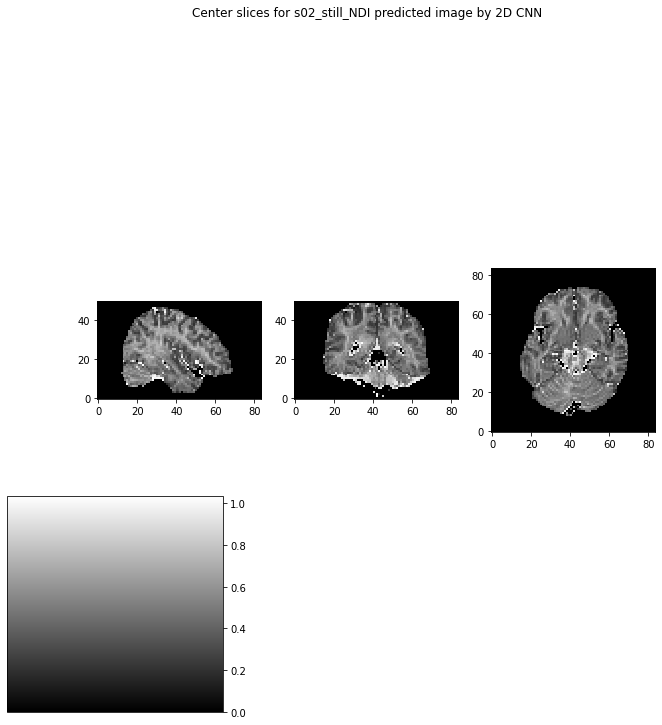

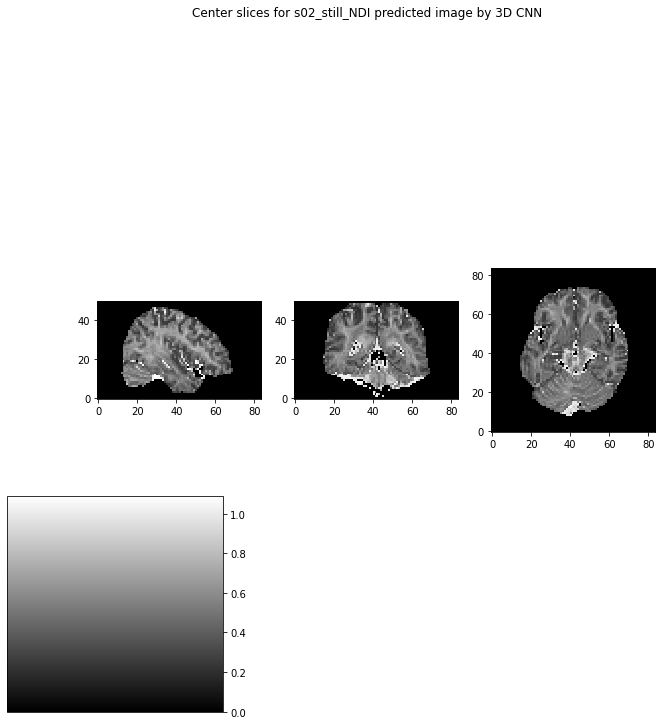

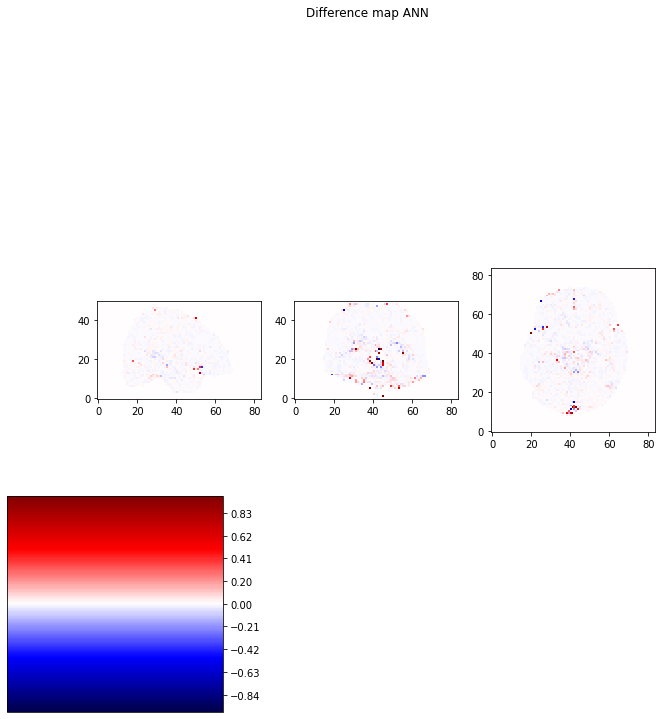

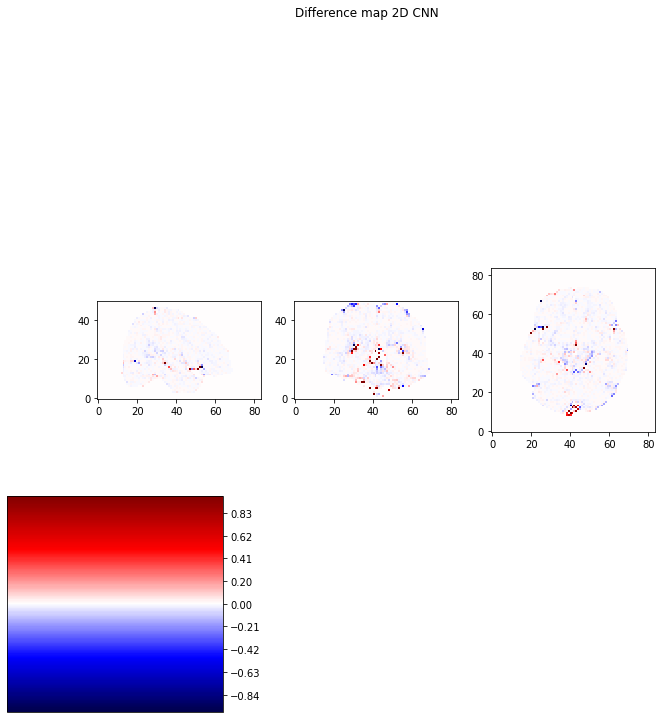

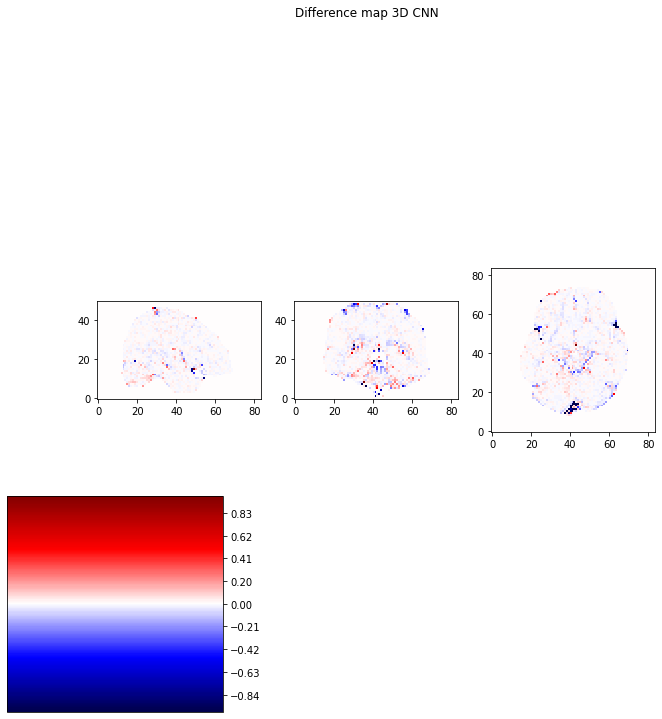

In [41]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_6-label_NDI.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_6-label_NDI.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_6-label_NDI.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_NDI_img_data[26, :, :]
ref_slice_1 = s02_NDI_img_data[:, 30, :]
ref_slice_2 = s02_NDI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_NDI reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_NDI predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_NDI_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_NDI predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_NDI_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_NDI predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_NDI_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

___

Training subject: s01_still</br>
Test subject: s02_still</br>
Outcome: ODI</br>


<h4>Data Preprocessing</h4>

In [42]:
"""
Generate the base dataset for s01_still and s02_still first.
"""
cmd = "--base --label_type O --subjects s01_still s02_still"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
base data dataset has shape: (84, 84, 50, 96)
base label dataset has shape: (84, 84, 50, 1)
Generating for s02_still ...
base data dataset has shape: (84, 84, 50, 96)
base label dataset has shape: (84, 84, 50, 1)


In [43]:
"""
Generate training dataset ODI for ANN.
"""
cmd = "--subjects s01_still --fc1d --label_type O"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (352800,)
data befor masking has shape: (352800, 96)
data after masking has shape: (82889, 96) the ratio of masked voxel is: 0.23494614512471657
training dataset has shape:(82889, 96)
mask has shape: (352800,)
data befor masking has shape: (352800, 1)
data after masking has shape: (82889, 1) the ratio of masked voxel is: 0.23494614512471657
training label has shape:(82889, 1)


In [44]:
"""
Generate training dataset ODI for 2D CNN.
"""
cmd = "--subjects s01_still --conv2d --label_type O"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (82, 82, 48)
data has shape: (84, 84, 48, 96)
label has shape: (82, 82, 48, 1)
(82641, 3, 3, 96)
saved patches has shape: (82641, 3, 3, 96)
(82641, 1, 1, 1)
svaed labels has shape: (82641, 1, 1, 1)


In [45]:
"""
Generate training dataset ODI for 3D CNN.
"""
cmd = "--subjects s01_still --conv3d --label_type O"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (82, 82, 48)
data has shape: (84, 84, 50, 96)
label has shape: (82, 82, 48, 1)
(84, 84, 50, 96) (82, 82, 48)
(82641, 3, 3, 3, 96)
saved patches has shape: (82641, 2592)
(82, 82, 48, 1) (82, 82, 48)
(82641, 1, 1, 1, 1)
svaed labels has shape: (82641, 1, 1, 1, 1)


In [46]:
"""
Using nib to fetch the  data, used for evaluation
"""
s02_ODI_path = '../Data-NODDI/s02_still/s02_still_ODI.nii'
s02_mask_path = '../Net/datasets/mask/mask_s02_still.nii'
s02_ODI_img = nib.load(s02_ODI_path)
s02_ODI_img_data = s02_ODI_img.get_fdata()
s02_mask_img = nib.load(s02_mask_path)
s02_mask_img_data = s02_mask_img.get_fdata()

<strong>1 layer</strong>

ANN

Model: "functional_109"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_37 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_42 (Dense)             (None, 150)               14550     
_________________________________________________________________
dropout_36 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 14,701
Trainable params: 14,701
Non-trainable params: 0
_________________________________________________________________
['O']
(82889, 96)
(82889, 150)
(82889, 150)
(82889, 1)
Training start ...


2022-03-20 17:10:00.420920: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:10:00.421022: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:10:00.732975: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:10:00.757747: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:10:00.758010: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:10:00.759067: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_10_00
2022-03-20 17:10:00.759594: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_10_00/vw.trace.json.gz
2022-03-20 17:10:00.759707: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:10:00.760723: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

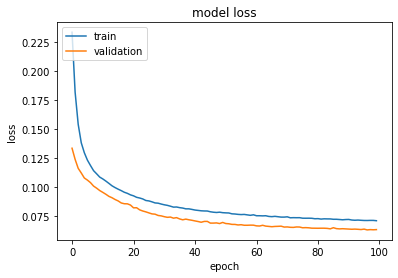

96-fc1d-patch_1-base_1-layer_1-label_ODI
(84, 50, 96)
Model: "functional_113"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_38 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_43 (Dense)             (None, 150)               14550     
_________________________________________________________________
dropout_37 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 14,701
Trainable params: 14,701
Non-trainable params: 0
_________________________________________________________________
testing data shape: (84, 84, 50, 96)
prediction has shape: (84, 84, 50, 1)
(84, 84, 50, 1)
prediction after repack has shape: (84, 84, 50, 1)
pred shape: (93643, 1)
gt has shape: (93643, 1)
th

In [47]:
# 1 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 1 --train --label_type O"
plot_loss(cmd)
# 1 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 1 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_115"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_39 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_54 (Conv2D)           (None, 1, 1, 150)         129750    
_________________________________________________________________
dropout_38 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_55 (Conv2D)           (None, 1, 1, 1)           151       
Total params: 129,901
Trainable params: 129,901
Non-trainable params: 0
_________________________________________________________________
['O']
(82641, 3, 3, 96)
(82641, 1, 1, 150)
(82641, 1, 1, 150)
(82641, 1, 1, 1)
Training start ...


2022-03-20 17:10:25.422051: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:10:25.422140: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:10:25.903685: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:10:25.925135: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:10:25.925420: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:10:25.926580: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_10_25
2022-03-20 17:10:25.927129: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_10_25/vw.trace.json.gz
2022-03-20 17:10:25.927229: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:10:25.928056: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

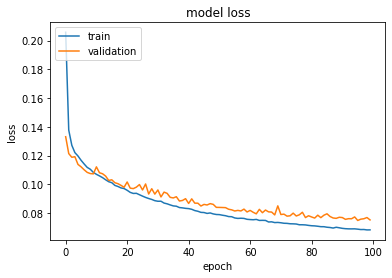

96-conv2d-patch_3-base_1-layer_1-label_ODI
(84, 84, 96)
Model: "functional_119"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_40 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_56 (Conv2D)           (None, 82, 82, 150)       129750    
_________________________________________________________________
dropout_39 (Dropout)         (None, 82, 82, 150)       0         
_________________________________________________________________
conv2d_57 (Conv2D)           (None, 82, 82, 1)         151       
Total params: 129,901
Trainable params: 129,901
Non-trainable params: 0
_________________________________________________________________
testing data shape: (50, 84, 84, 96)
prediction has shape: (50, 82, 82, 1)
(84, 84, 50, 1)
prediction after repack has shape: (84, 84, 50, 1)
pred shape: (93643, 1)
gt has shape: (93643, 1

In [48]:
# 1 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 1 --train --label_type O"
plot_loss(cmd)
# 1 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 1 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_121"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_41 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_54 (Conv3D)           (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
dropout_40 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_55 (Conv3D)           (None, 1, 1, 1, 1)        151       
Total params: 389,101
Trainable params: 389,101
Non-trainable params: 0
_________________________________________________________________
['O']
(82641, 3, 3, 3, 96)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 1)
Training start ...


2022-03-20 17:11:12.964215: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:11:12.964303: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:11:13.417195: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:11:13.436730: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:11:13.436980: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:11:13.437916: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_11_13
2022-03-20 17:11:13.438418: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_11_13/vw.trace.json.gz
2022-03-20 17:11:13.438485: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:11:13.439173: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

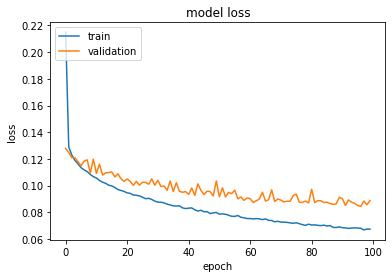

96-conv3d-patch_3-base_1-layer_1-label_ODI
(84, 84, 50)
Model: "functional_125"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_42 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_56 (Conv3D)           (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
dropout_41 (Dropout)         (None, 82, 82, 48, 150)   0         
_________________________________________________________________
conv3d_57 (Conv3D)           (None, 82, 82, 48, 1)     151       
Total params: 389,101
Trainable params: 389,101
Non-trainable params: 0
_________________________________________________________________
testing data shape: (1, 84, 84, 50, 96)
prediction has shape: (1, 82, 82, 48, 1)
(84, 84, 50, 1)
prediction after repack has shape: (84, 84, 50, 1)
pred shape: (93643, 1)
gt has shape: (93

In [49]:
# 1 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 1 --train --label_type O"
plot_loss(cmd)
# 1 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 1 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9706229837165239
the ssim score for 2d cnn is: 0.9604664465629242
the ssim score for 3d cnn is: 0.9515749046078764


Text(0.5, 0.98, 'Difference map 3D CNN')

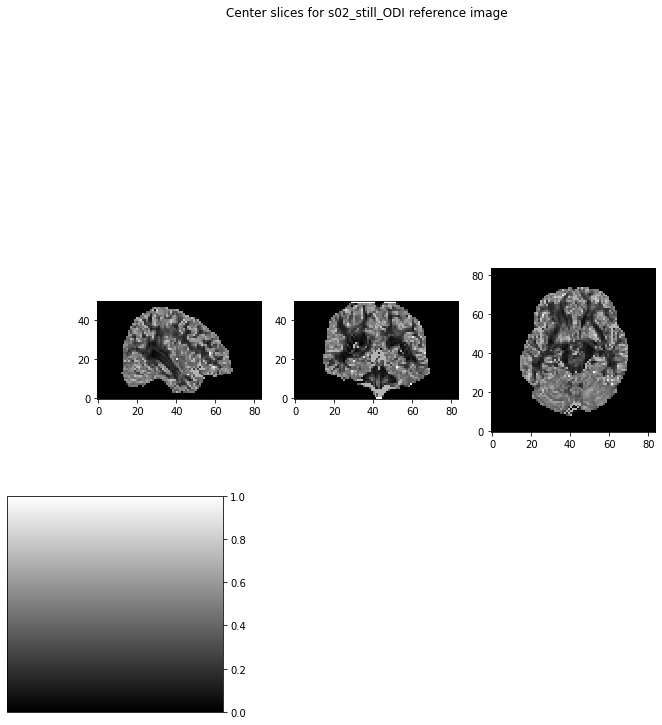

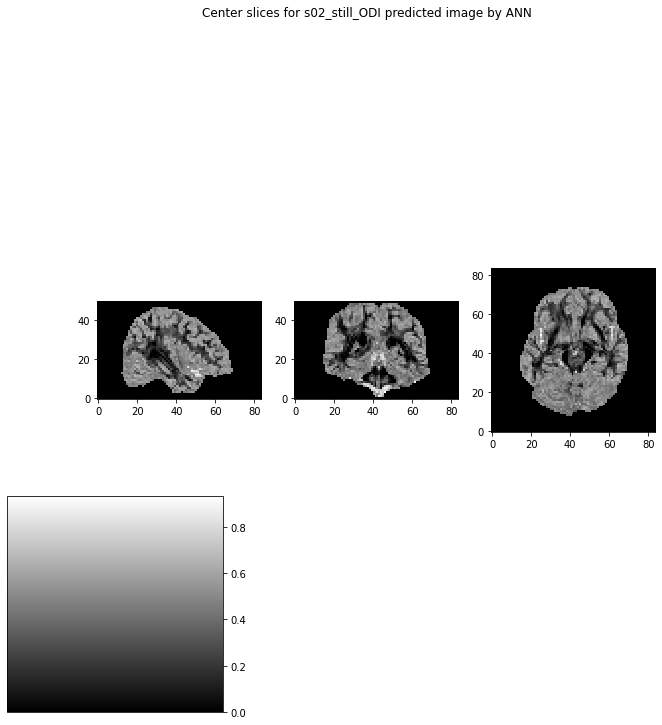

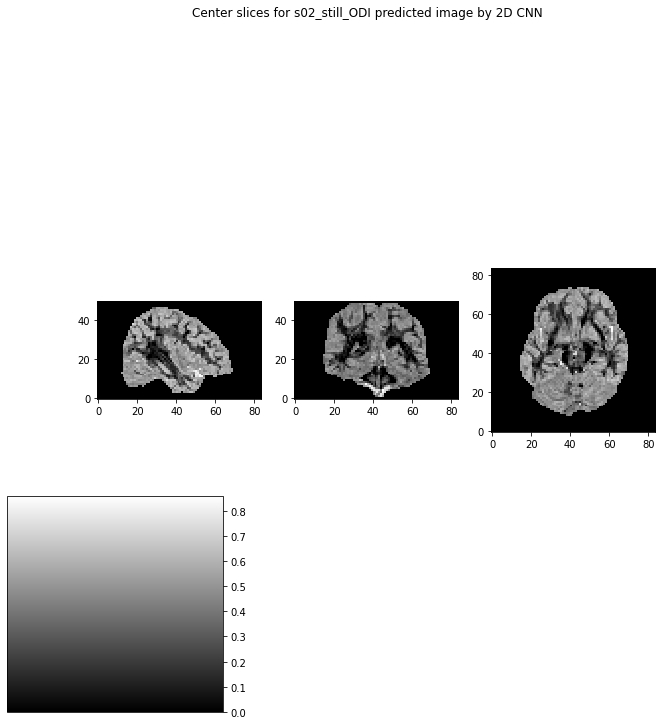

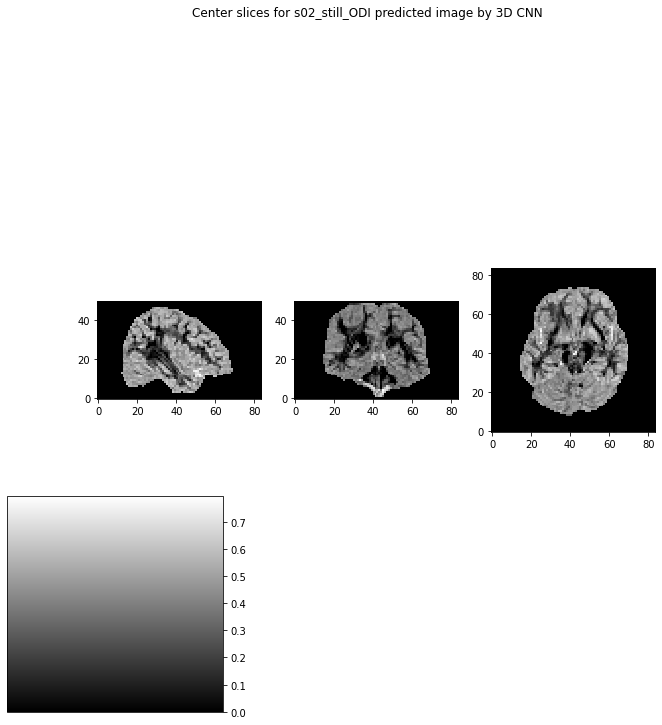

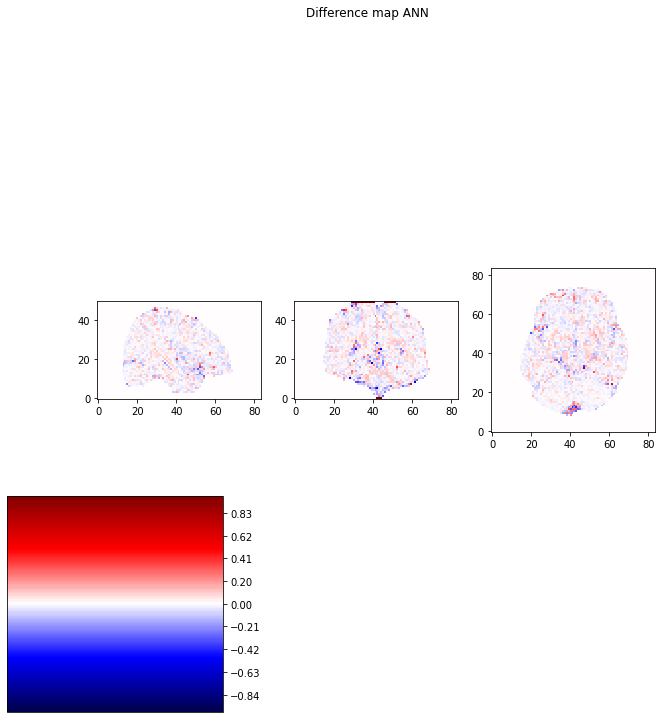

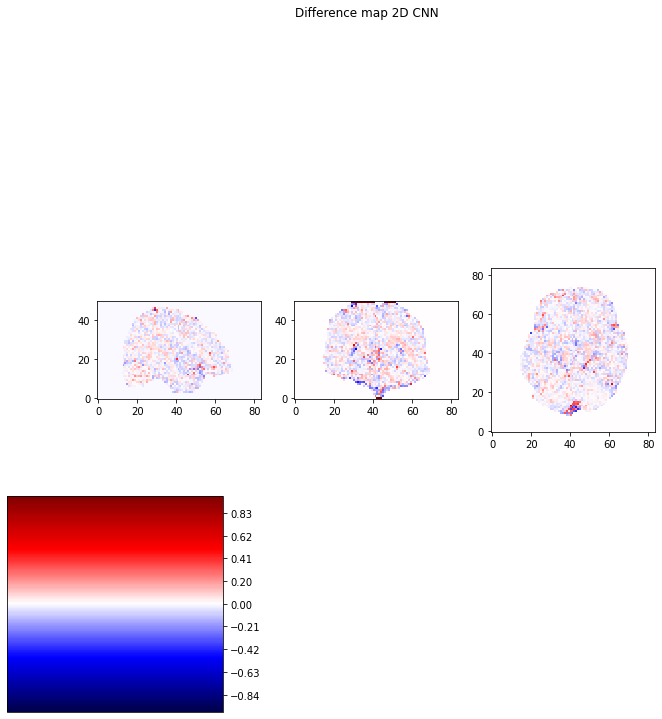

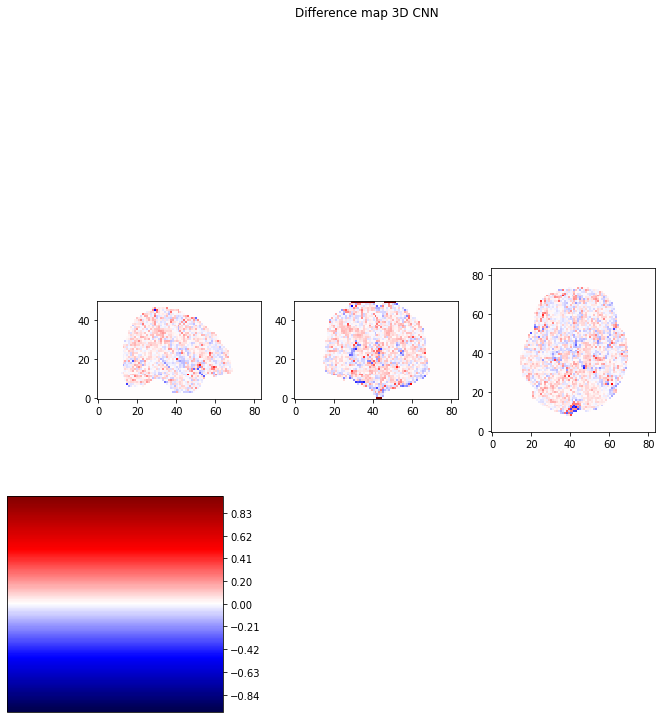

In [50]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_1-label_ODI.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_1-label_ODI.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_1-label_ODI.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_ODI_img_data[26, :, :]
ref_slice_1 = s02_ODI_img_data[:, 30, :]
ref_slice_2 = s02_ODI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_ODI reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_ODI predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_ODI_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))


cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_ODI predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_ODI_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_ODI predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_ODI_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>2 layer</strong>

ANN

Model: "functional_127"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_43 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_44 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_45 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_42 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 37,351
Trainable params: 37,351
Non-trainable params: 0
_________________________________________________________________
['O']
(82889, 96)
(82889, 150)
(82889, 150)
(82889, 150)
(82889, 1)
Training start ...


2022-03-20 17:13:10.606846: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:13:10.606931: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:13:10.962979: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:13:10.984694: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:13:10.984971: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:13:10.986015: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_13_10
2022-03-20 17:13:10.986566: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_13_10/vw.trace.json.gz
2022-03-20 17:13:10.986649: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:13:10.987406: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

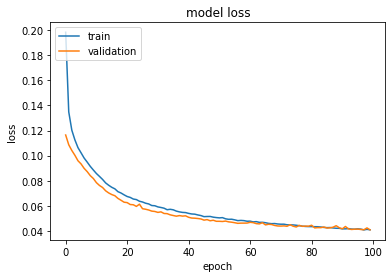

96-fc1d-patch_1-base_1-layer_2-label_ODI
(84, 50, 96)
Model: "functional_131"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_44 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_46 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_47 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_43 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 37,351
Trainable params: 37,351
Non-trainable params: 0
_________________________________________________________________
testing data shape: (84, 84, 50, 96)
prediction has shape: (

In [51]:
# 2 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 2 --train --label_type O"
plot_loss(cmd)
# 2 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 2 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_133"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_45 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_58 (Conv2D)           (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_59 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_44 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_60 (Conv2D)           (None, 1, 1, 1)           151       
Total params: 152,551
Trainable params: 152,551
Non-trainable params: 0
_________________________________________________________________
['O']
(82641, 3, 3, 96)
(82641, 1, 1, 150)
(82641, 1, 1, 150)
(82641, 1, 1, 150)
(82641, 1, 1, 1)
Training start

2022-03-20 17:13:41.522540: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:13:41.522620: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:13:41.988646: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:13:42.011283: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:13:42.011557: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:13:42.012604: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_13_42
2022-03-20 17:13:42.013157: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_13_42/vw.trace.json.gz
2022-03-20 17:13:42.013239: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:13:42.014007: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

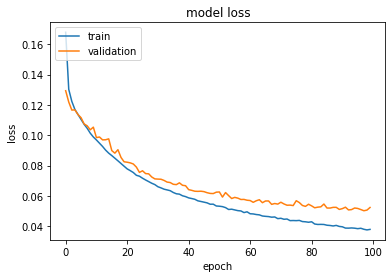

96-conv2d-patch_3-base_1-layer_2-label_ODI
(84, 84, 96)
Model: "functional_137"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_46 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_61 (Conv2D)           (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_62 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_45 (Dropout)         (None, 82, 82, 150)       0         
_________________________________________________________________
conv2d_63 (Conv2D)           (None, 82, 82, 1)         151       
Total params: 152,551
Trainable params: 152,551
Non-trainable params: 0
_________________________________________________________________
testing data shape: (50, 84, 84, 96)
prediction has shap

In [52]:
# 2 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 2 --train --label_type O"
plot_loss(cmd)
# 2 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 2 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_139"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_47 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_58 (Conv3D)           (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_59 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_46 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_60 (Conv3D)           (None, 1, 1, 1, 1)        151       
Total params: 411,751
Trainable params: 411,751
Non-trainable params: 0
_________________________________________________________________
['O']
(82641, 3, 3, 3, 96)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 1)

2022-03-20 17:14:40.375655: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:14:40.375741: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:14:40.897618: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:14:40.921834: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:14:40.922138: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:14:40.923217: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_14_40
2022-03-20 17:14:40.923802: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_14_40/vw.trace.json.gz
2022-03-20 17:14:40.923928: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:14:40.925069: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

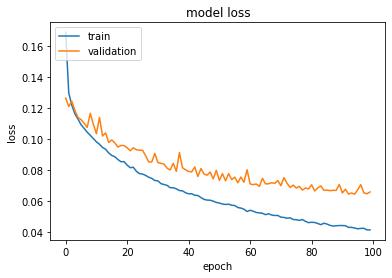

96-conv3d-patch_3-base_1-layer_2-label_ODI
(84, 84, 50)
Model: "functional_143"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_48 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_61 (Conv3D)           (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_62 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_47 (Dropout)         (None, 82, 82, 48, 150)   0         
_________________________________________________________________
conv3d_63 (Conv3D)           (None, 82, 82, 48, 1)     151       
Total params: 411,751
Trainable params: 411,751
Non-trainable params: 0
_________________________________________________________________
testing data shape: (1, 84, 84, 50, 96)
prediction has s

In [53]:
# 2 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 2 --train --label_type O"
plot_loss(cmd)
# 2 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 2 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9834043024687548
the ssim score for 2d cnn is: 0.9757644582864293
the ssim score for 3d cnn is: 0.9652818116836034


Text(0.5, 0.98, 'Difference map 3D CNN')

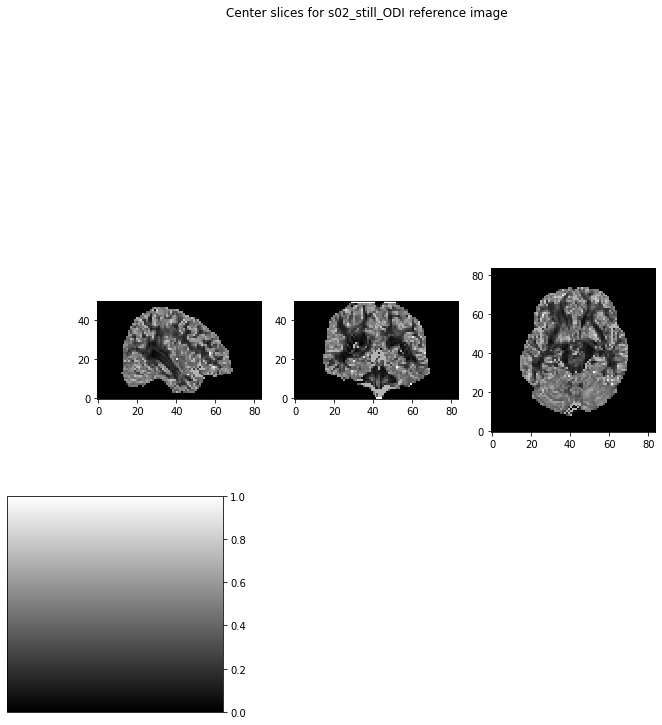

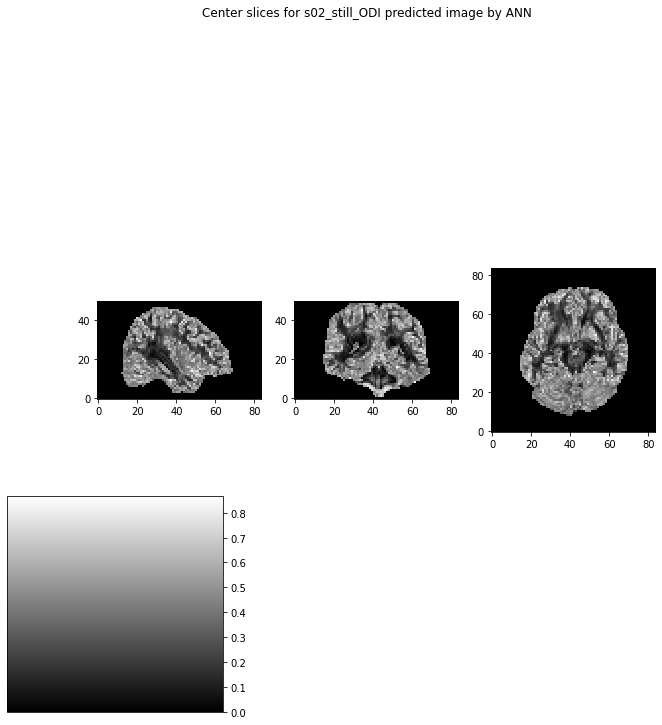

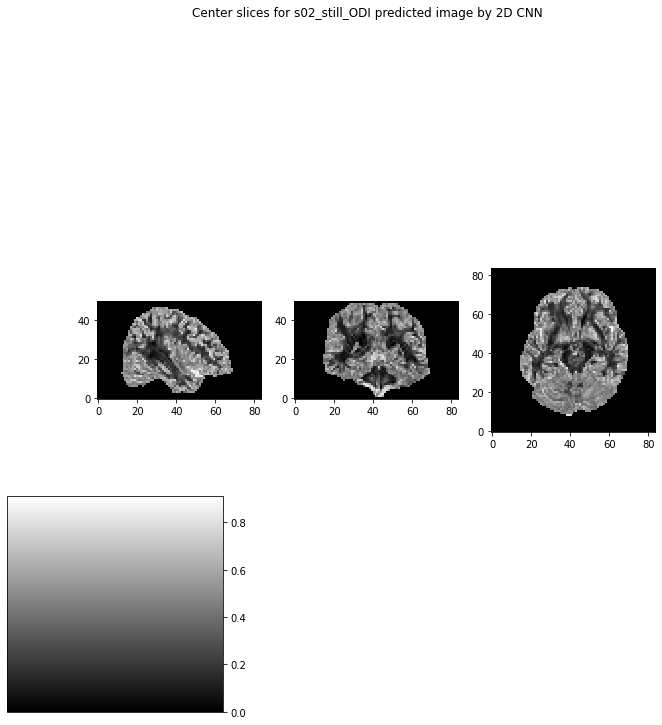

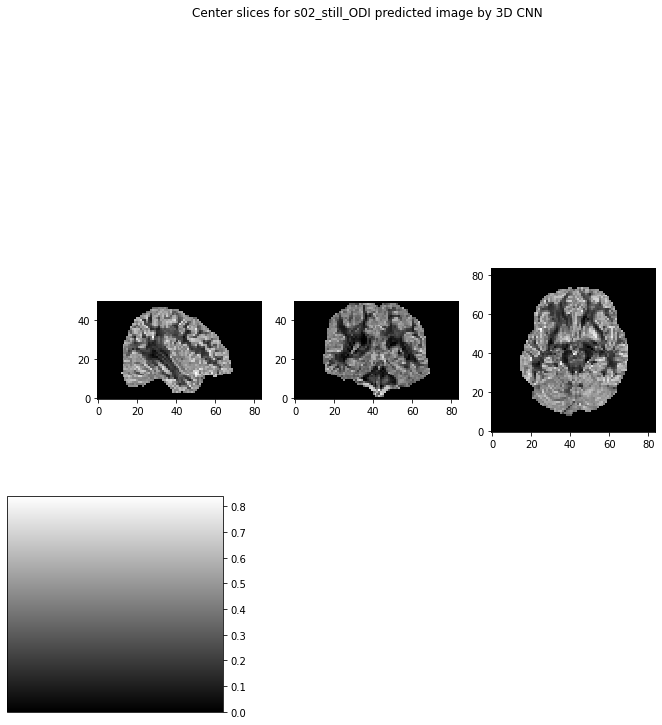

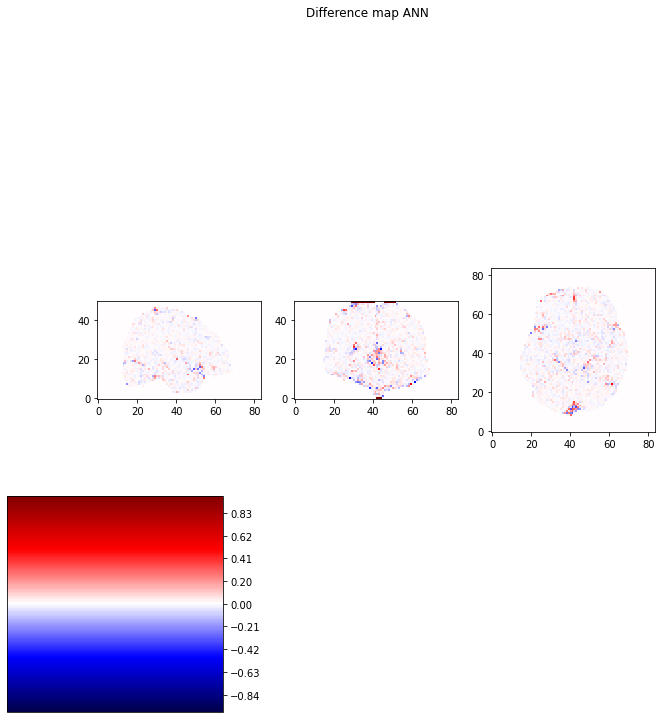

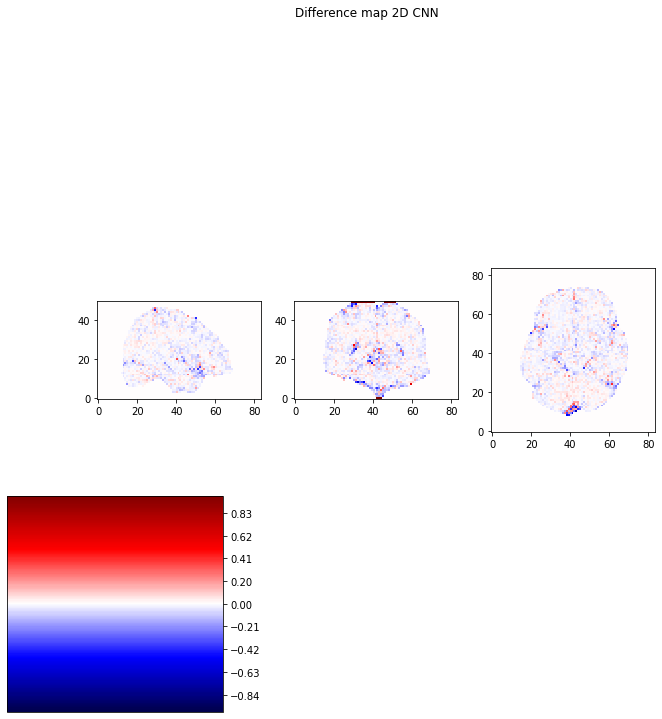

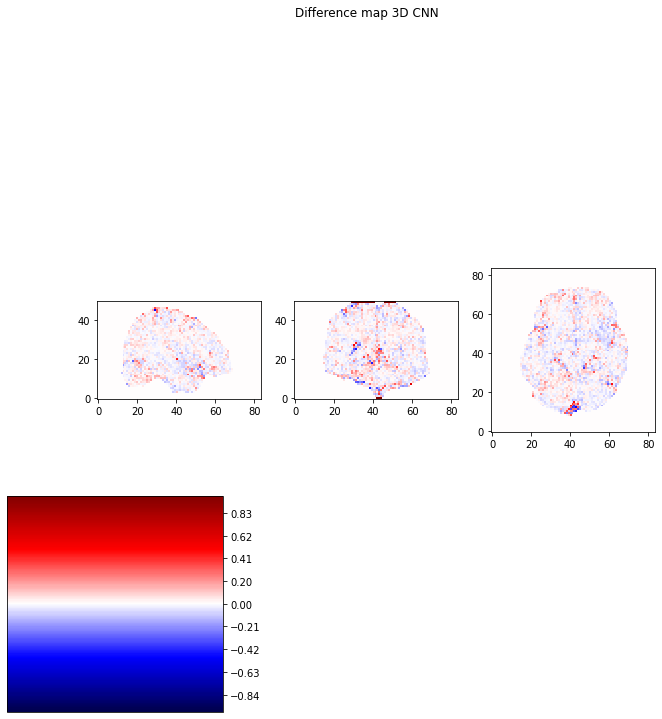

In [54]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_2-label_ODI.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_2-label_ODI.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_2-label_ODI.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_ODI_img_data[26, :, :]
ref_slice_1 = s02_ODI_img_data[:, 30, :]
ref_slice_2 = s02_ODI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_ODI reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_ODI predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_ODI_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_ODI predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_ODI_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_ODI predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_ODI_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>3 layer</strong>

ANN

Model: "functional_145"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_49 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_48 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_49 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_50 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_48 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 60,001
Trainable params: 60,001
Non-trainable params: 0
________________________________________________

2022-03-20 17:16:48.301843: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:16:48.301952: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:16:48.680978: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:16:48.705459: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:16:48.705775: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:16:48.706911: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_16_48
2022-03-20 17:16:48.707496: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_16_48/vw.trace.json.gz
2022-03-20 17:16:48.707580: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:16:48.708397: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

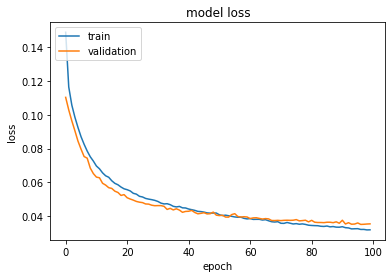

96-fc1d-patch_1-base_1-layer_3-label_ODI
(84, 50, 96)
Model: "functional_149"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_50 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_51 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_52 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_53 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_49 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 60,001
Trainable params: 60,001
Non-trainable para

In [55]:
# 3 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 3 --train --label_type O"
plot_loss(cmd)
# 3 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 3 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_151"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_51 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_64 (Conv2D)           (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_65 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_66 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_50 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_67 (Conv2D)           (None, 1, 1, 1)           151       
Total params: 175,201
Trainable params: 175,201
Non-trainable params: 0
______________________________________________

2022-03-20 17:17:24.793087: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:17:24.793172: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:17:25.300758: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:17:25.328105: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:17:25.328403: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:17:25.329544: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_17_25
2022-03-20 17:17:25.330149: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_17_25/vw.trace.json.gz
2022-03-20 17:17:25.330242: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:17:25.331059: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

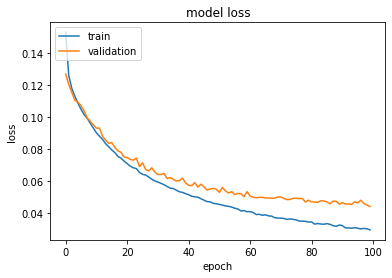

96-conv2d-patch_3-base_1-layer_3-label_ODI
(84, 84, 96)
Model: "functional_155"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_52 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_68 (Conv2D)           (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_69 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_70 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_51 (Dropout)         (None, 82, 82, 150)       0         
_________________________________________________________________
conv2d_71 (Conv2D)           (None, 82, 82, 1)         151       
Total params: 175,201
Trainable params: 175,201
Non-trainable 

In [56]:
# 3 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 3 --train --label_type O"
plot_loss(cmd)
# 3 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 3 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_157"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_53 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_64 (Conv3D)           (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_65 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_66 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_52 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_67 (Conv3D)           (None, 1, 1, 1, 1)        151       
Total params: 434,401
Trainable params: 434,401
Non-trainable params: 0
______________________________________________

2022-03-20 17:18:34.013237: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:18:34.013327: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:18:34.566443: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:18:34.594801: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:18:34.595101: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:18:34.596207: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_18_34
2022-03-20 17:18:34.596809: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_18_34/vw.trace.json.gz
2022-03-20 17:18:34.596889: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:18:34.597711: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

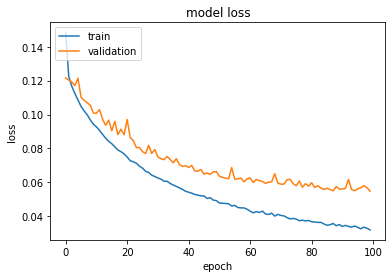

96-conv3d-patch_3-base_1-layer_3-label_ODI
(84, 84, 50)
Model: "functional_161"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_54 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_68 (Conv3D)           (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_69 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_70 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_53 (Dropout)         (None, 82, 82, 48, 150)   0         
_________________________________________________________________
conv3d_71 (Conv3D)           (None, 82, 82, 48, 1)     151       
Total params: 434,401
Trainable params: 434,401
Non-trainable 

In [57]:
# 3 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 3 --train --label_type O"
plot_loss(cmd)
# 3 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 3 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9865547318096558
the ssim score for 2d cnn is: 0.9800036070568016
the ssim score for 3d cnn is: 0.9729769761658928


Text(0.5, 0.98, 'Difference map 3D CNN')

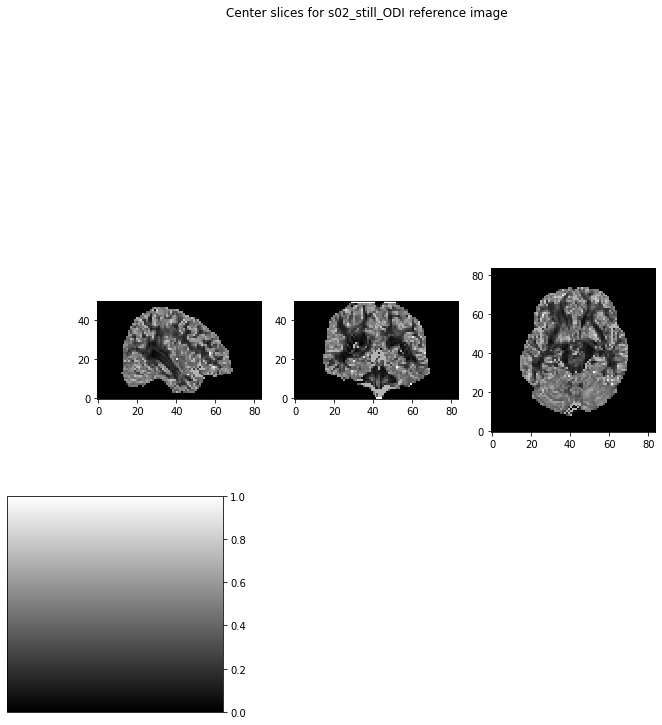

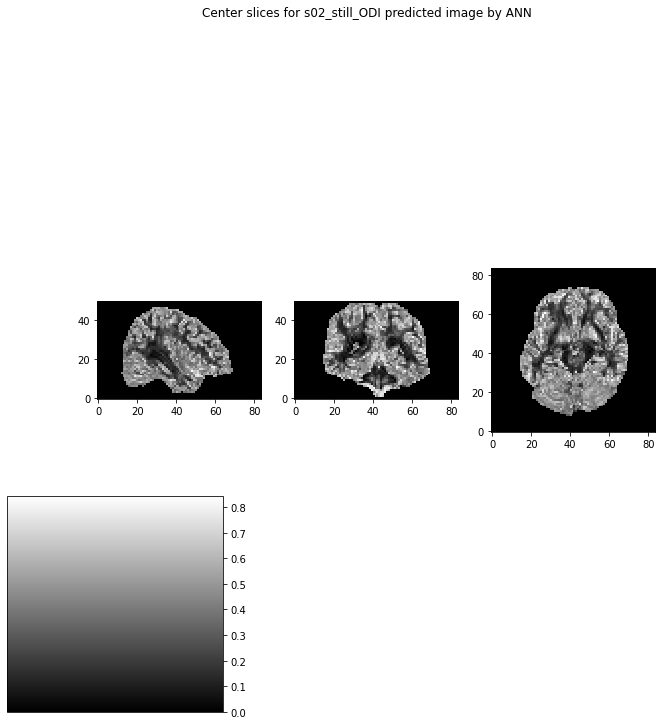

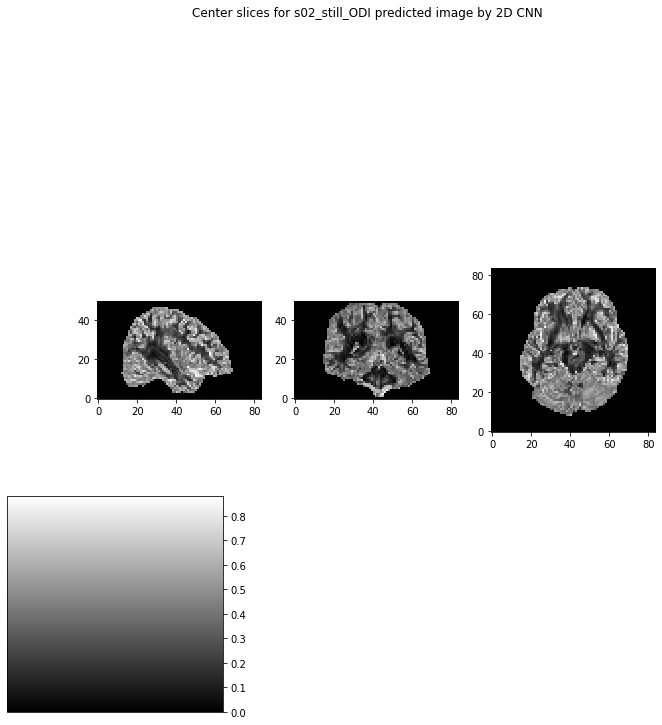

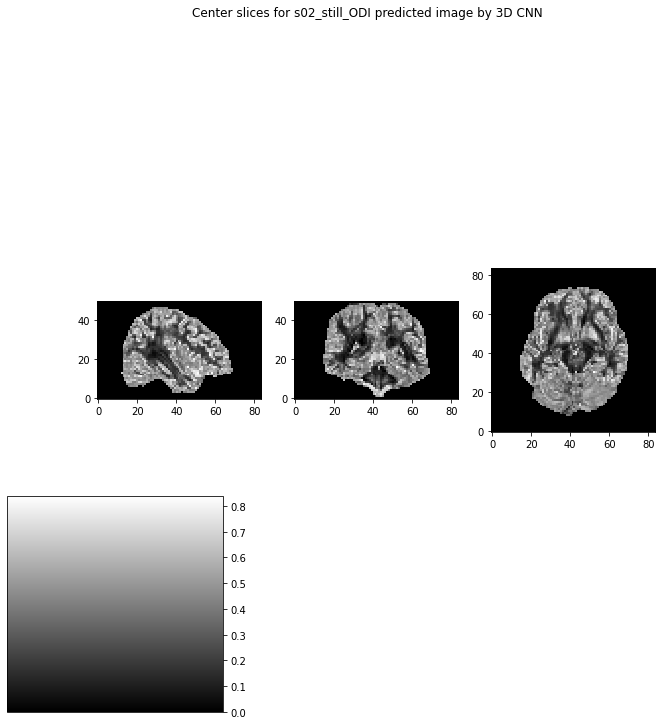

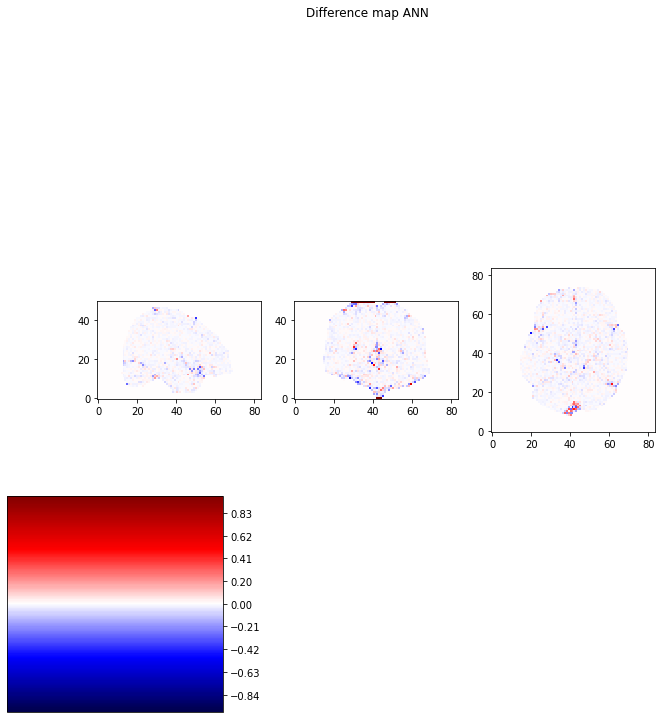

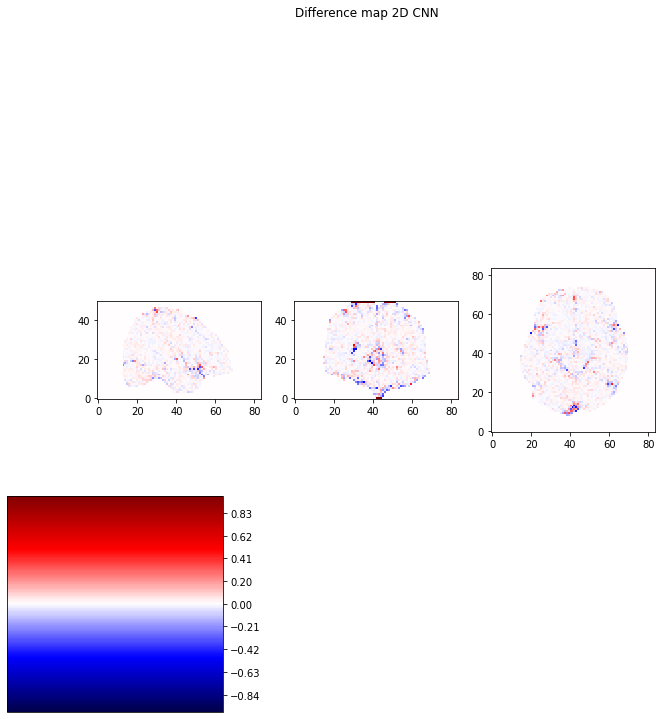

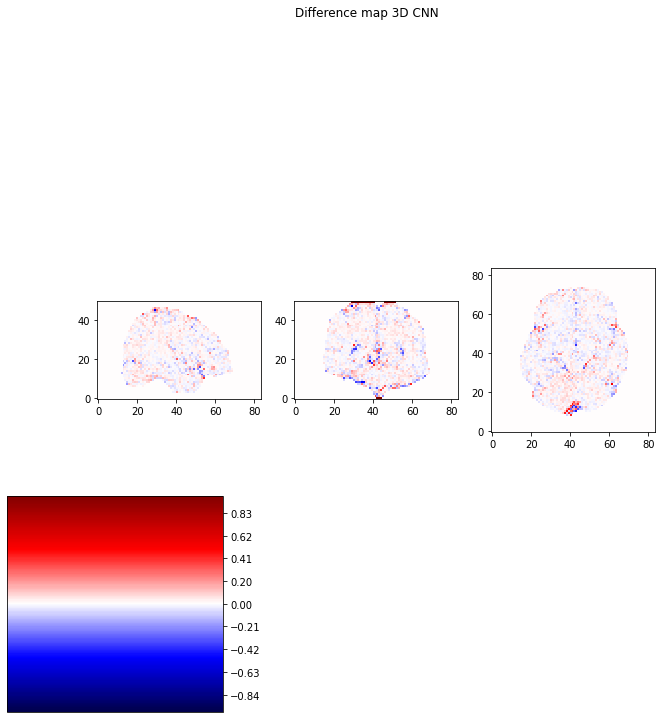

In [58]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_3-label_ODI.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_3-label_ODI.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_3-label_ODI.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_ODI_img_data[26, :, :]
ref_slice_1 = s02_ODI_img_data[:, 30, :]
ref_slice_2 = s02_ODI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_ODI reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_ODI predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_ODI_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_ODI predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_ODI_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_ODI predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_ODI_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>4 layer</strong>

ANN

Model: "functional_163"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_55 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_54 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_55 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_56 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_57 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_54 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 17:20:51.726816: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:20:51.726918: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:20:52.154230: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:20:52.182258: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:20:52.182554: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:20:52.183696: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_20_52
2022-03-20 17:20:52.184310: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_20_52/vw.trace.json.gz
2022-03-20 17:20:52.184396: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:20:52.185238: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

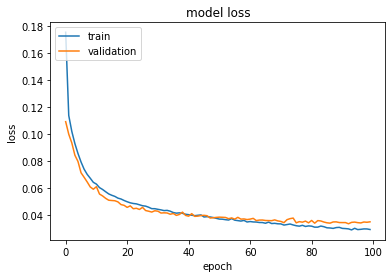

96-fc1d-patch_1-base_1-layer_4-label_ODI
(84, 50, 96)
Model: "functional_167"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_56 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_58 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_59 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_60 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_61 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_55 (Dropout)         (None, 150)               0         
________________________________________________________________

In [59]:
# 4 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 4 --train --label_type O"
plot_loss(cmd)
# 4 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 4 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_169"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_57 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_72 (Conv2D)           (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_73 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_74 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_75 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_56 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_76 (Conv2D)           (None, 1, 1, 1)        

2022-03-20 17:21:34.071787: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:21:34.071870: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:21:34.601963: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:21:34.632997: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:21:34.633308: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:21:34.634506: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_21_34
2022-03-20 17:21:34.635152: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_21_34/vw.trace.json.gz
2022-03-20 17:21:34.635247: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:21:34.636123: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

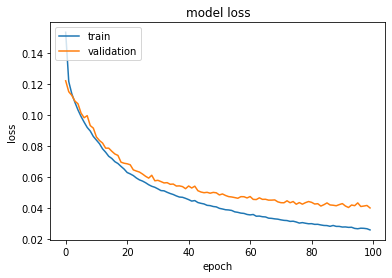

96-conv2d-patch_3-base_1-layer_4-label_ODI
(84, 84, 96)
Model: "functional_173"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_58 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_77 (Conv2D)           (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_78 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_79 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_80 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_57 (Dropout)         (None, 82, 82, 150)       0         
______________________________________________________________

In [60]:
# 4 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 4 --train --label_type O"
plot_loss(cmd)
# 4 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 4 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_175"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_59 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_72 (Conv3D)           (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_73 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_74 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_75 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_58 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_76 (Conv3D)           (None, 1, 1, 1, 1)     

2022-03-20 17:22:53.063611: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:22:53.063714: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:22:53.639057: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:22:53.667985: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:22:53.668323: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:22:53.669554: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_22_53
2022-03-20 17:22:53.670252: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_22_53/vw.trace.json.gz
2022-03-20 17:22:53.670349: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:22:53.671306: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

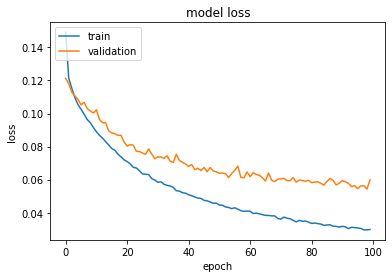

96-conv3d-patch_3-base_1-layer_4-label_ODI
(84, 84, 50)
Model: "functional_179"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_60 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_77 (Conv3D)           (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_78 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_79 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_80 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_59 (Dropout)         (None, 82, 82, 48, 150)   0         
______________________________________________________________

In [61]:
# 4 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 4 --train --label_type O"
plot_loss(cmd)
# 4 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 4 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9868103464071303
the ssim score for 2d cnn is: 0.9811021380128978
the ssim score for 3d cnn is: 0.9715359667716353


Text(0.5, 0.98, 'Difference map 3D CNN')

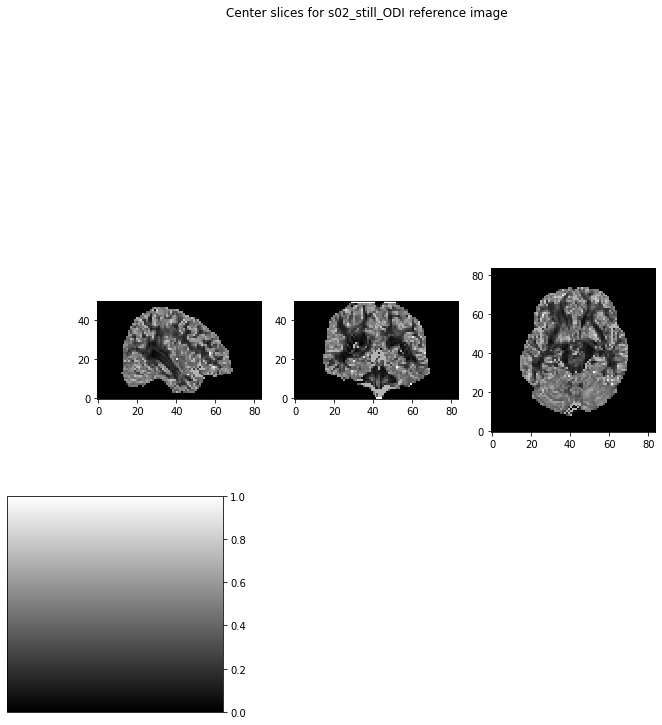

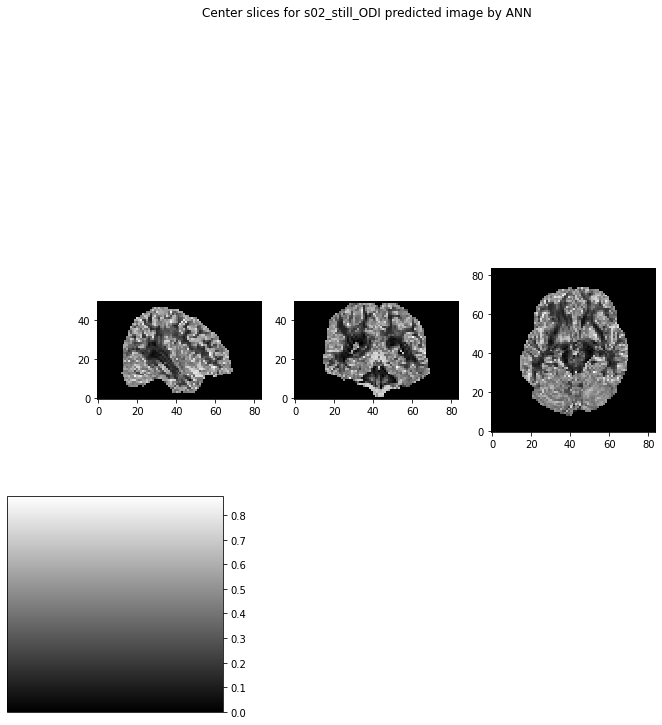

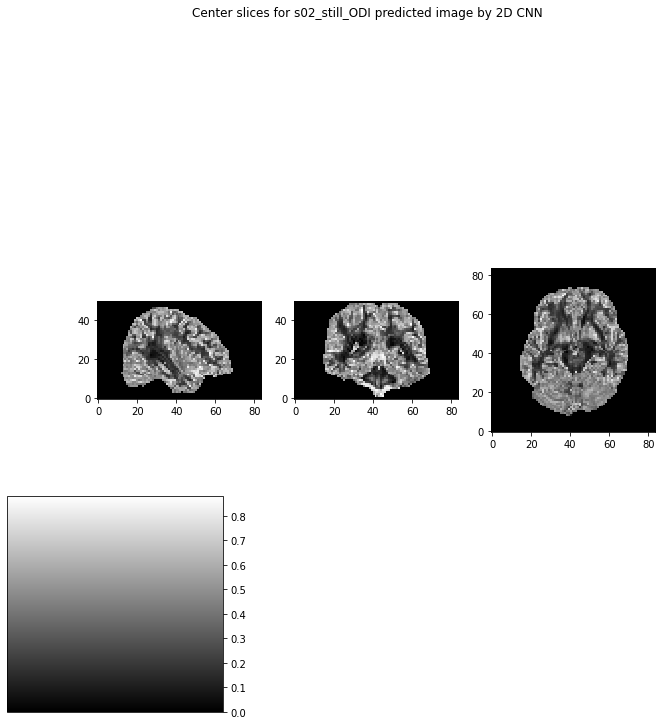

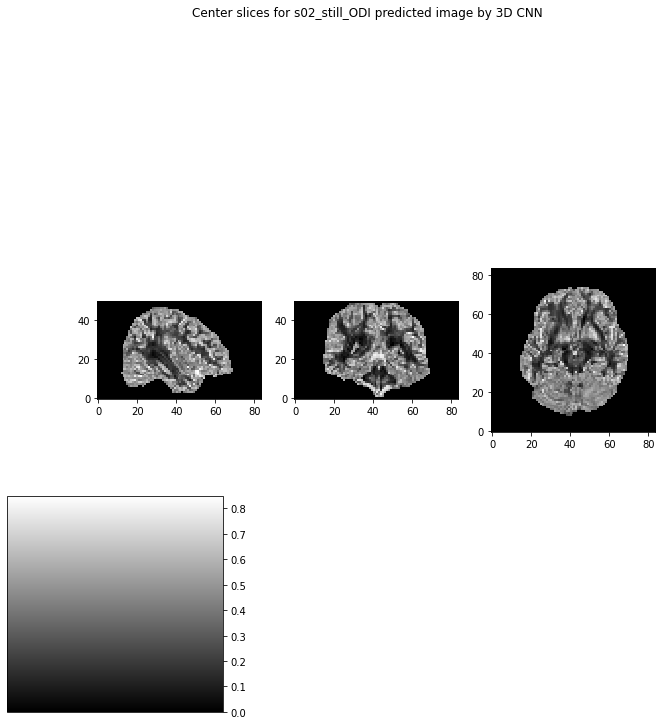

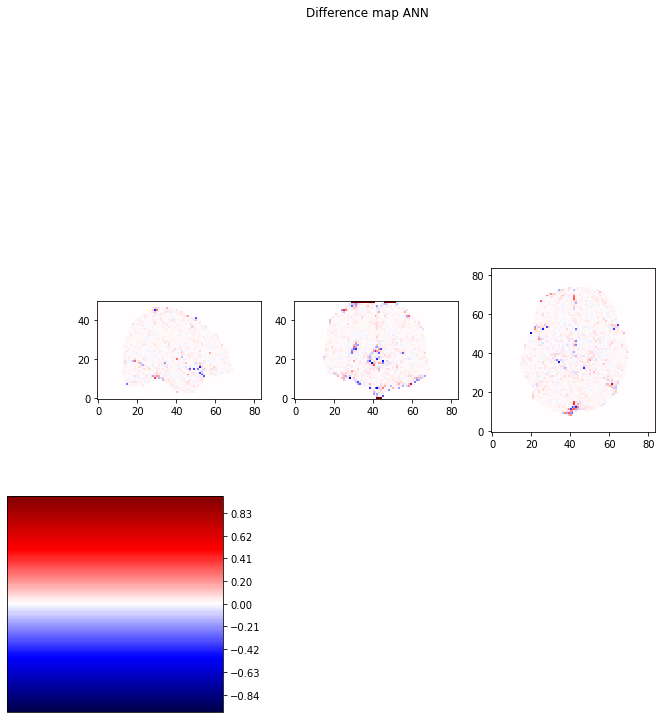

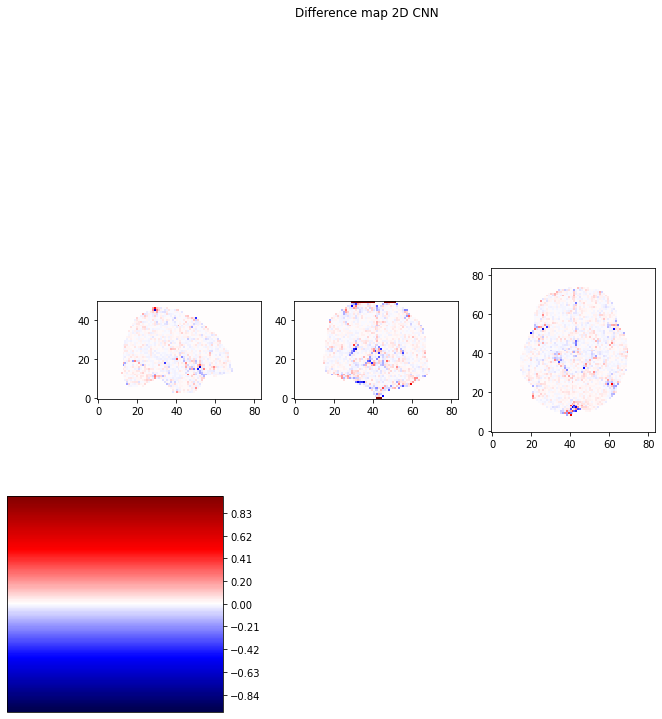

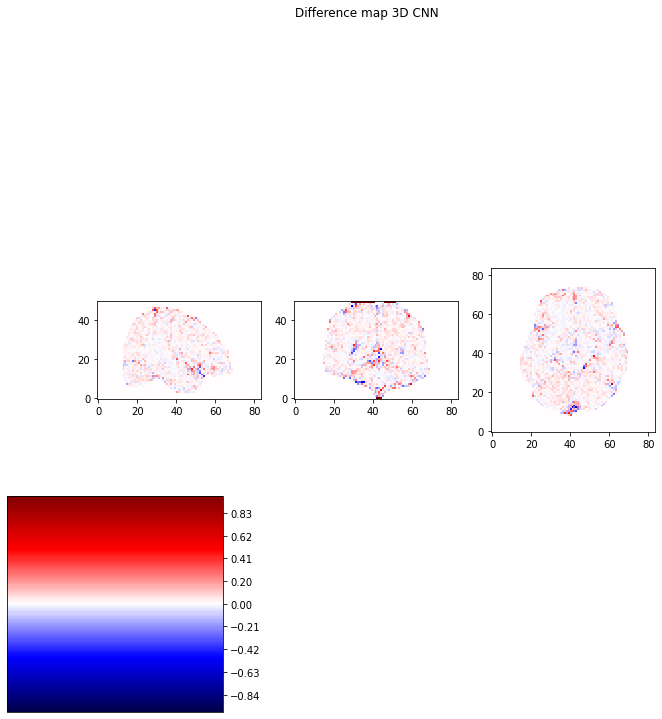

In [62]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_4-label_ODI.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_4-label_ODI.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_4-label_ODI.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_ODI_img_data[26, :, :]
ref_slice_1 = s02_ODI_img_data[:, 30, :]
ref_slice_2 = s02_ODI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_ODI reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_ODI predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_ODI_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_ODI predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_ODI_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_ODI predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_ODI_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>5 layer</strong>

Model: "functional_181"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_61 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_62 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_63 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_64 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_65 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_66 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_60 (Dropout)         (None, 150)            

2022-03-20 17:25:18.248744: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:25:18.248845: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:25:18.679739: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:25:18.704005: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:25:18.704335: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:25:18.705546: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_25_18
2022-03-20 17:25:18.706212: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_25_18/vw.trace.json.gz
2022-03-20 17:25:18.706302: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:25:18.707194: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

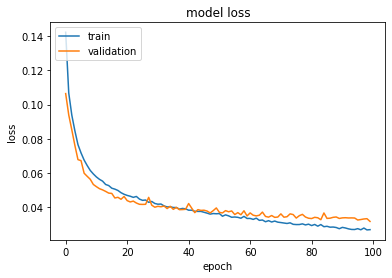

96-fc1d-patch_1-base_1-layer_5-label_ODI
(84, 50, 96)
Model: "functional_185"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_62 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_67 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_68 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_69 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_70 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_71 (Dense)             (None, 150)               22650     
________________________________________________________________

In [63]:
# 5 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 5 --train --label_type O"
plot_loss(cmd)
# 5 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 5 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

Model: "functional_187"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_63 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_82 (Conv2D)           (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_83 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_84 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_85 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_86 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_62 (Dropout)         (None, 1, 1, 150)      

2022-03-20 17:26:05.811841: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:26:05.811935: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:26:06.422972: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:26:06.472885: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:26:06.473299: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:26:06.474968: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_26_06
2022-03-20 17:26:06.475743: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_26_06/vw.trace.json.gz
2022-03-20 17:26:06.475893: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:26:06.477112: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

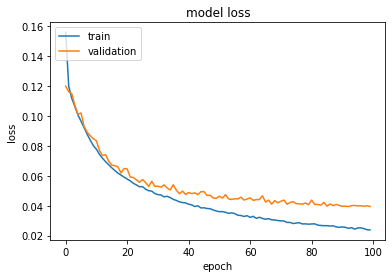

96-conv2d-patch_3-base_1-layer_5-label_ODI
(84, 84, 96)
Model: "functional_191"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_64 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_88 (Conv2D)           (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_89 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_90 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_91 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_92 (Conv2D)           (None, 82, 82, 150)       22650     
______________________________________________________________

In [64]:
# 5 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 5 --train --label_type O"
plot_loss(cmd)
# 5 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 5 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

Model: "functional_193"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_65 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_82 (Conv3D)           (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_83 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_84 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_85 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_86 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_64 (Dropout)         (None, 1, 1, 1, 150)   

2022-03-20 17:27:35.403352: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:27:35.403459: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:27:36.022821: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:27:36.058063: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:27:36.058415: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:27:36.059721: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_27_36
2022-03-20 17:27:36.060444: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_27_36/vw.trace.json.gz
2022-03-20 17:27:36.060603: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:27:36.061655: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

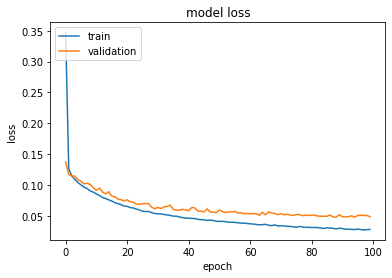

96-conv3d-patch_3-base_1-layer_5-label_ODI
(84, 84, 50)
Model: "functional_197"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_66 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_88 (Conv3D)           (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_89 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_90 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_91 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_92 (Conv3D)           (None, 82, 82, 48, 150)   22650     
______________________________________________________________

In [65]:
# 5 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 5 --train --label_type O"
plot_loss(cmd)
# 5 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 5 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.988174768689283
the ssim score for 2d cnn is: 0.9822932893706745
the ssim score for 3d cnn is: 0.9765772222574275


Text(0.5, 0.98, 'Difference map 3D CNN')

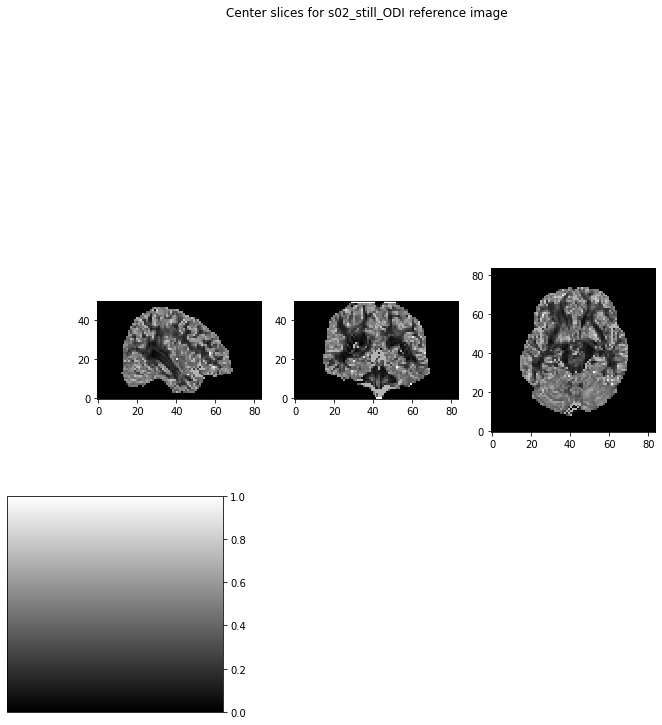

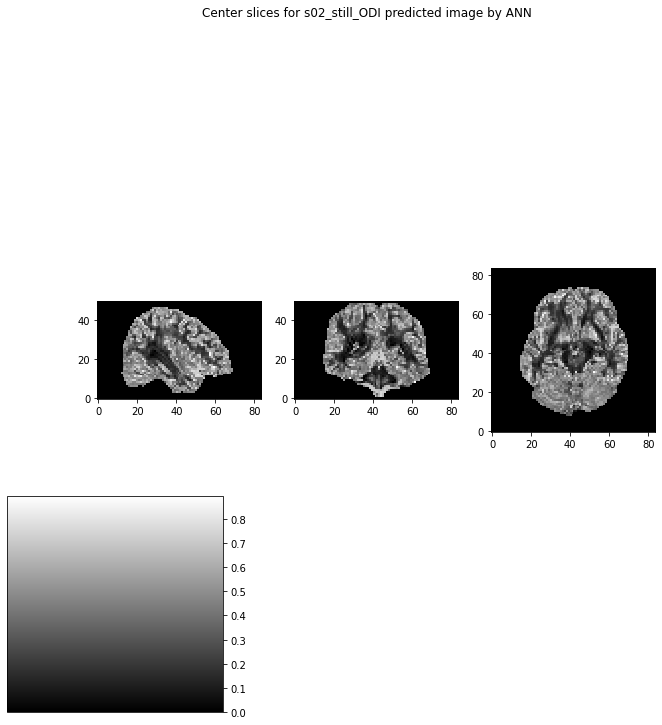

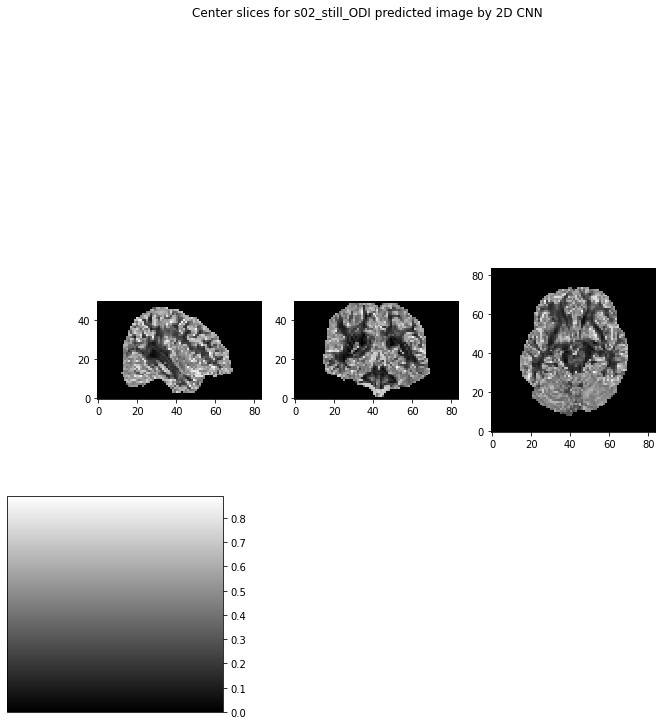

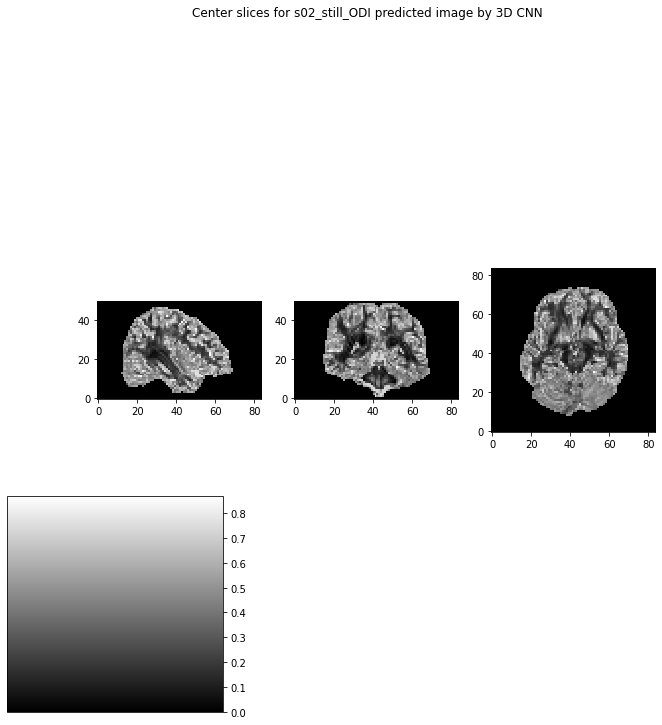

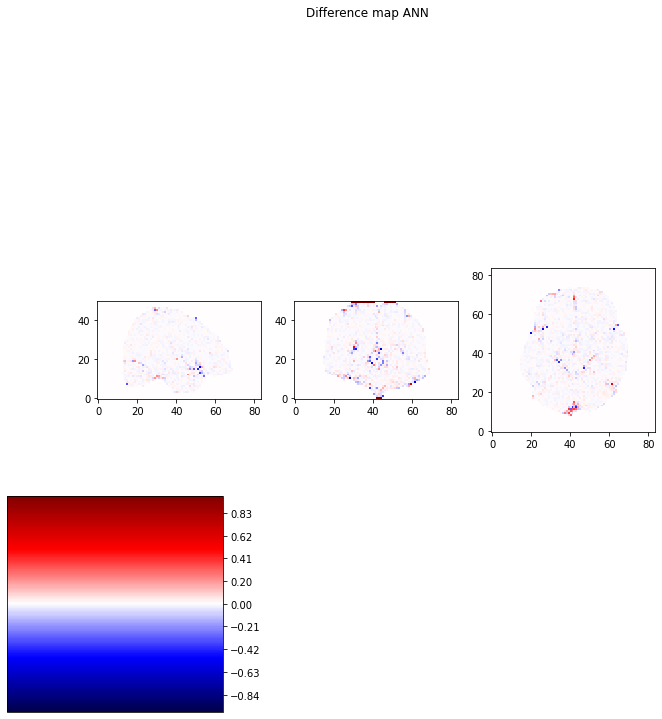

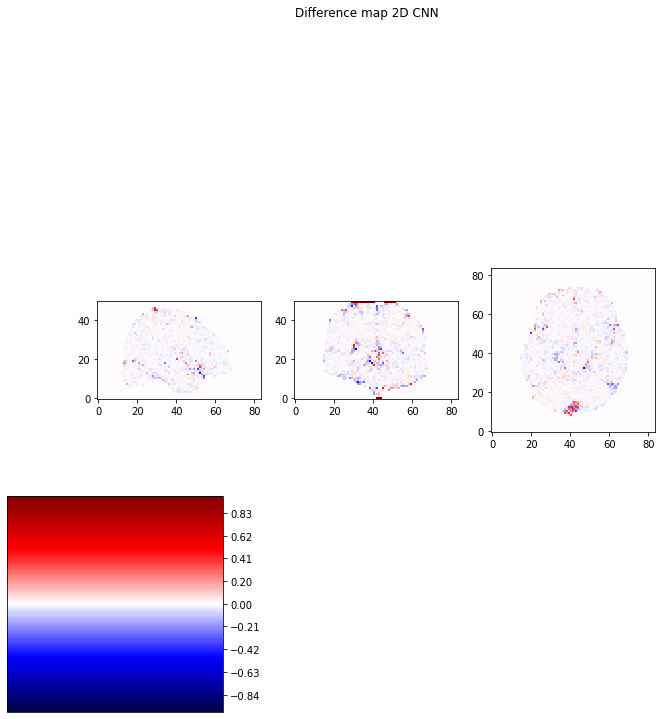

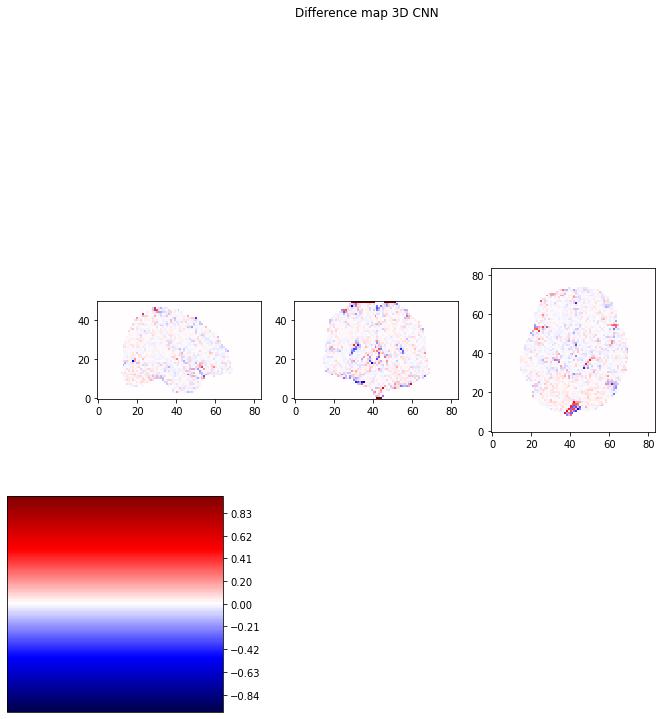

In [66]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_5-label_ODI.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_5-label_ODI.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_5-label_ODI.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_ODI_img_data[26, :, :]
ref_slice_1 = s02_ODI_img_data[:, 30, :]
ref_slice_2 = s02_ODI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_ODI reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_ODI predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_ODI_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_ODI predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_ODI_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_ODI predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_ODI_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>6 layer</strong>

ANN

Model: "functional_199"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_67 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_72 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_73 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_74 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_75 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_76 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_77 (Dense)             (None, 150)            

2022-03-20 17:30:09.315386: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:30:09.315478: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:30:09.736424: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:30:09.764139: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:30:09.764487: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:30:09.765743: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_30_09
2022-03-20 17:30:09.766447: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_30_09/vw.trace.json.gz
2022-03-20 17:30:09.766556: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:30:09.767470: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

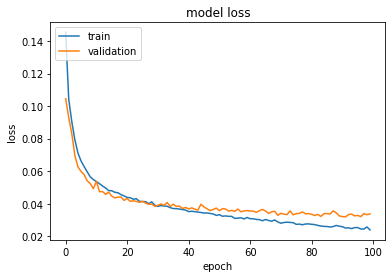

96-fc1d-patch_1-base_1-layer_6-label_ODI
(84, 50, 96)
Model: "functional_203"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_68 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_78 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_79 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_80 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_81 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_82 (Dense)             (None, 150)               22650     
________________________________________________________________

In [67]:
# 6 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 6 --train --label_type O"
plot_loss(cmd)
# 6 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 6 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_205"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_69 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_94 (Conv2D)           (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_95 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_96 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_97 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_98 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_99 (Conv2D)           (None, 1, 1, 150)      

2022-03-20 17:31:02.300309: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:31:02.300392: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:31:02.958527: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:31:03.002181: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:31:03.002579: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:31:03.004120: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_31_03
2022-03-20 17:31:03.004879: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_31_03/vw.trace.json.gz
2022-03-20 17:31:03.005035: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:31:03.006168: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

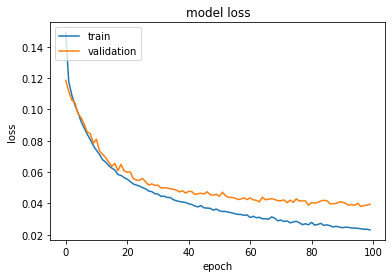

96-conv2d-patch_3-base_1-layer_6-label_ODI
(84, 84, 96)
Model: "functional_209"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_70 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_101 (Conv2D)          (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_102 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_103 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_104 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_105 (Conv2D)          (None, 82, 82, 150)       22650     
______________________________________________________________

In [68]:
# 6 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 6 --train --label_type O"
plot_loss(cmd)
# 6 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 6 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_211"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_71 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_94 (Conv3D)           (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_95 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_96 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_97 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_98 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_99 (Conv3D)           (None, 1, 1, 1, 150)   

2022-03-20 17:32:41.817454: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:32:41.817544: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:32:42.470224: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:32:42.505929: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:32:42.506480: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:32:42.508356: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_32_42
2022-03-20 17:32:42.509241: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_32_42/vw.trace.json.gz
2022-03-20 17:32:42.509390: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:32:42.510679: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

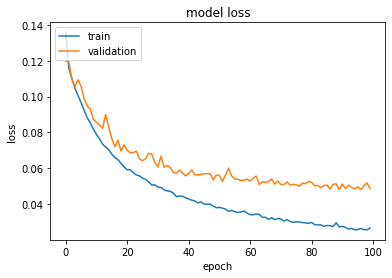

96-conv3d-patch_3-base_1-layer_6-label_ODI
(84, 84, 50)
Model: "functional_215"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_72 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_101 (Conv3D)          (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_102 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_103 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_104 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_105 (Conv3D)          (None, 82, 82, 48, 150)   22650     
______________________________________________________________

In [69]:
# 6 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 6 --train --label_type O"
plot_loss(cmd)
# 6 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 6 --label_type O"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9873329540012206
the ssim score for 2d cnn is: 0.9816819900072323
the ssim score for 3d cnn is: 0.976801106693728


Text(0.5, 0.98, 'Difference map 3D CNN')

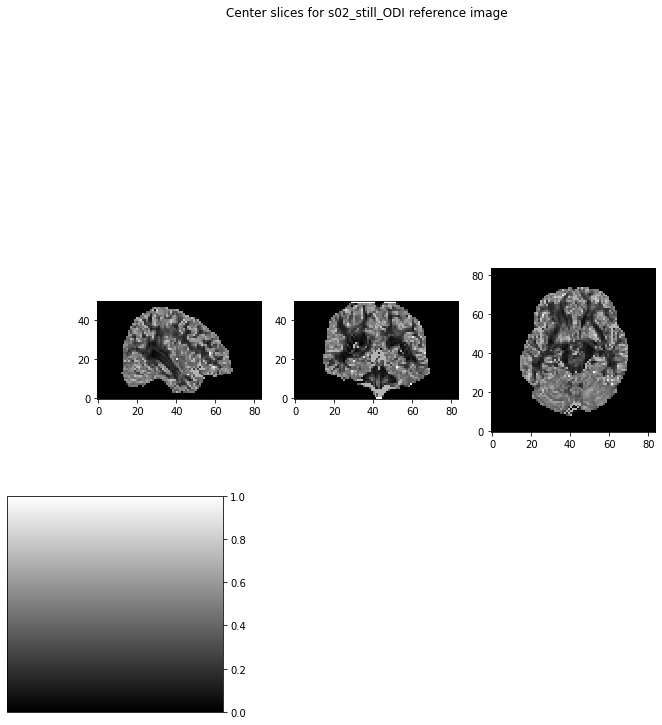

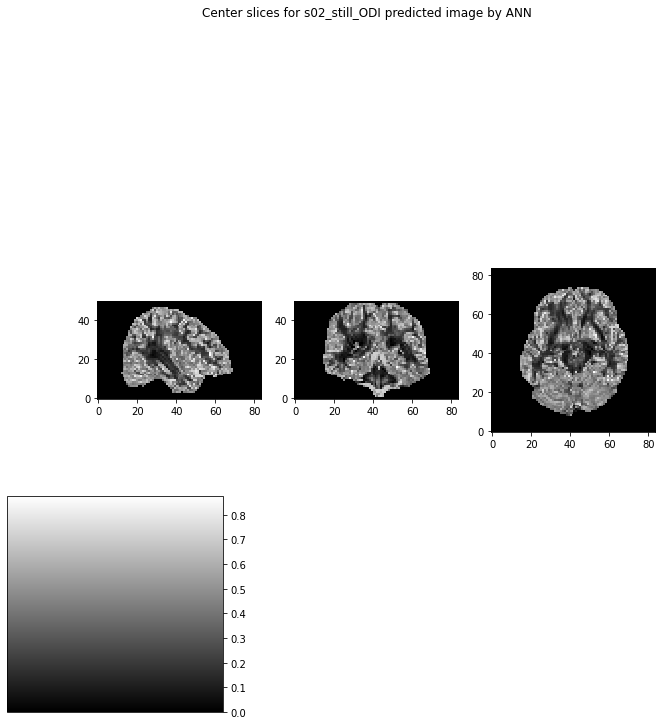

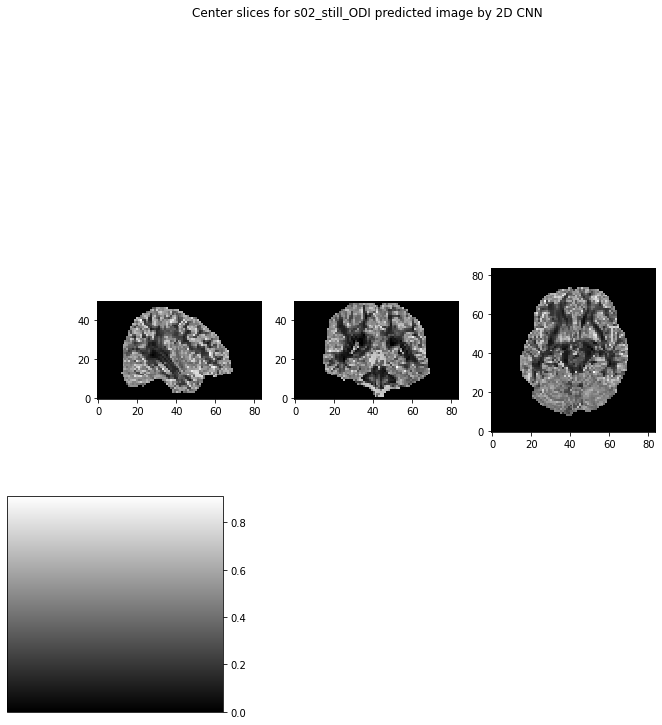

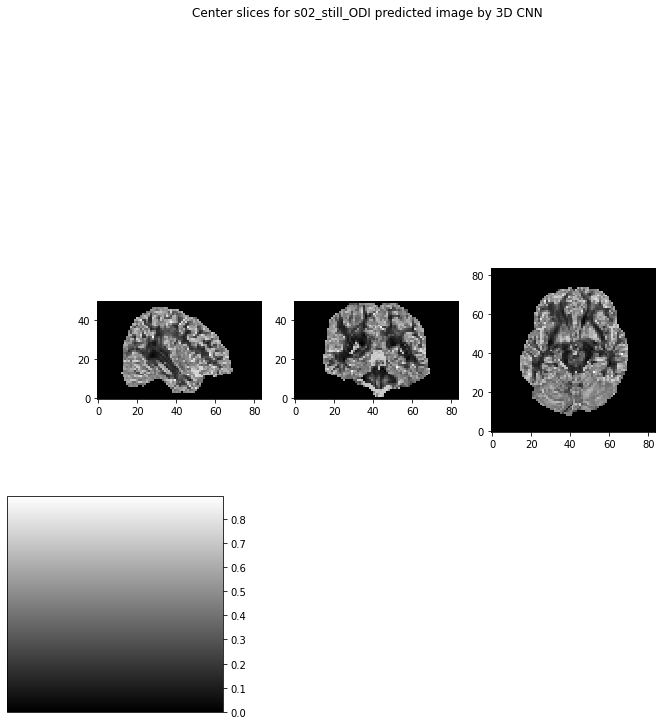

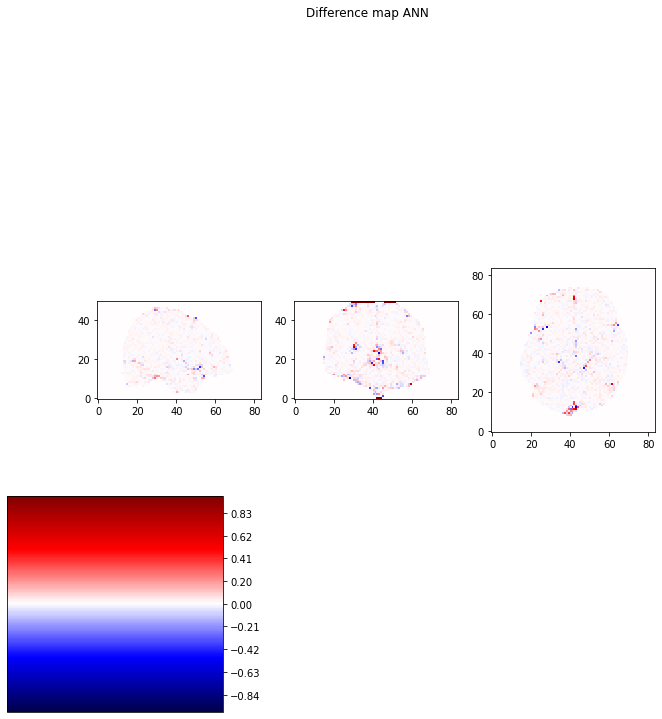

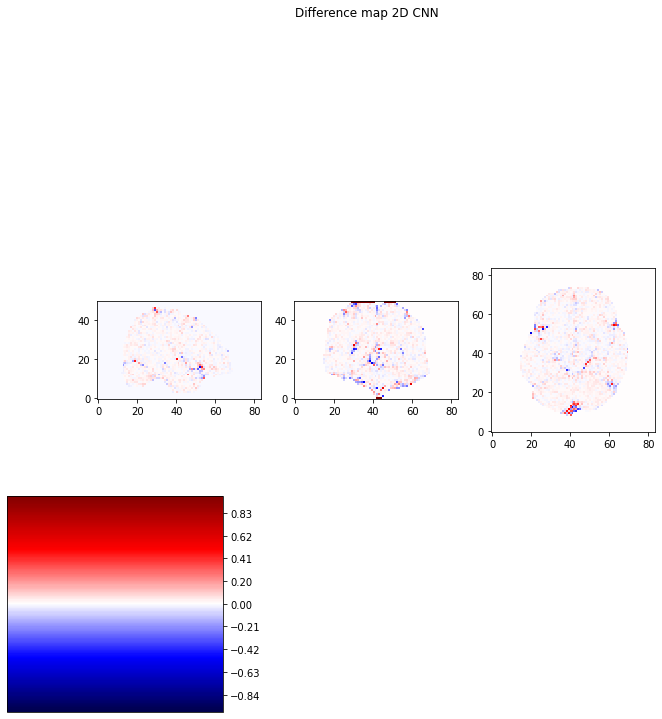

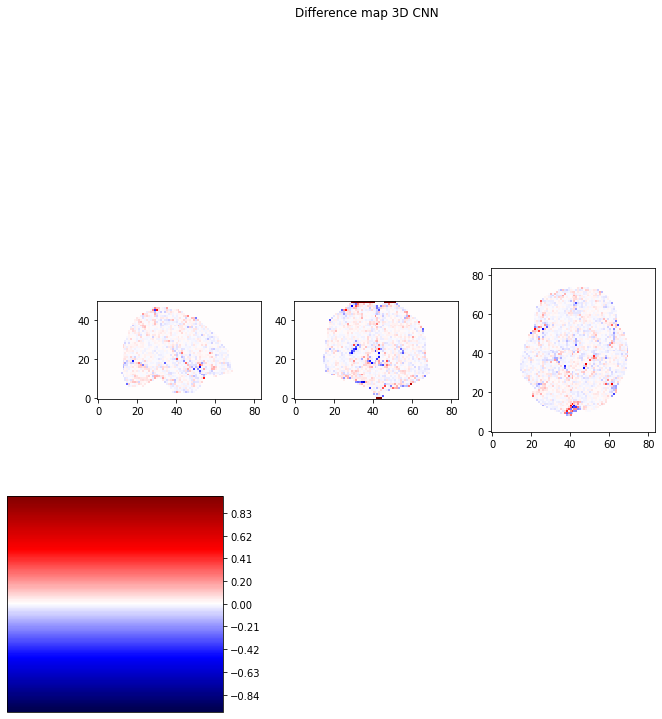

In [70]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_6-label_ODI.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_6-label_ODI.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_6-label_ODI.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_ODI_img_data[26, :, :]
ref_slice_1 = s02_ODI_img_data[:, 30, :]
ref_slice_2 = s02_ODI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_ODI reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_ODI predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_ODI_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_ODI predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_ODI_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_ODI predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_ODI_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

Training subject: s01_still</br>
Test subject: s02_still</br>
Outcome: FWF</br>

<h4>Data Preprocessing</h4>

In [71]:
"""
Generate the base dataset for s01_still and s02_still first.
"""
cmd = "--base --label_type F --subjects s01_still s02_still"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
base data dataset has shape: (84, 84, 50, 96)
base label dataset has shape: (84, 84, 50, 1)
Generating for s02_still ...
base data dataset has shape: (84, 84, 50, 96)
base label dataset has shape: (84, 84, 50, 1)


In [72]:
"""
Generate training dataset FWF for ANN.
"""
cmd = "--subjects s01_still --fc1d --label_type F"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (352800,)
data befor masking has shape: (352800, 96)
data after masking has shape: (82889, 96) the ratio of masked voxel is: 0.23494614512471657
training dataset has shape:(82889, 96)
mask has shape: (352800,)
data befor masking has shape: (352800, 1)
data after masking has shape: (82889, 1) the ratio of masked voxel is: 0.23494614512471657
training label has shape:(82889, 1)


In [73]:
"""
Generate training dataset FWF for 2D CNN.
"""
cmd = "--subjects s01_still --conv2d --label_type F"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (82, 82, 48)
data has shape: (84, 84, 48, 96)
label has shape: (82, 82, 48, 1)
(82641, 3, 3, 96)
saved patches has shape: (82641, 3, 3, 96)
(82641, 1, 1, 1)
svaed labels has shape: (82641, 1, 1, 1)


In [74]:
"""
Generate training dataset FWF for 3D CNN.
"""
cmd = "--subjects s01_still --conv3d --label_type F"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (82, 82, 48)
data has shape: (84, 84, 50, 96)
label has shape: (82, 82, 48, 1)
(84, 84, 50, 96) (82, 82, 48)
(82641, 3, 3, 3, 96)
saved patches has shape: (82641, 2592)
(82, 82, 48, 1) (82, 82, 48)
(82641, 1, 1, 1, 1)
svaed labels has shape: (82641, 1, 1, 1, 1)


In [75]:
"""
Using nib to fetch the  data, used for evaluation
"""
s02_FWF_path = '../Data-NODDI/s02_still/s02_still_FWF.nii'
s02_mask_path = '../Net/datasets/mask/mask_s02_still.nii'
s02_FWF_img = nib.load(s02_FWF_path)
s02_FWF_img_data = s02_FWF_img.get_fdata()
s02_mask_img = nib.load(s02_mask_path)
s02_mask_img_data = s02_mask_img.get_fdata()

<strong>1 layer</strong>

ANN

Model: "functional_217"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_73 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_84 (Dense)             (None, 150)               14550     
_________________________________________________________________
dropout_72 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 14,701
Trainable params: 14,701
Non-trainable params: 0
_________________________________________________________________
['F']
(82889, 96)
(82889, 150)
(82889, 150)
(82889, 1)
Training start ...


2022-03-20 17:35:49.434771: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:35:49.434896: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:35:49.744898: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:35:49.764736: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:35:49.764967: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:35:49.765890: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_35_49
2022-03-20 17:35:49.766380: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_35_49/vw.trace.json.gz
2022-03-20 17:35:49.766450: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:35:49.767134: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

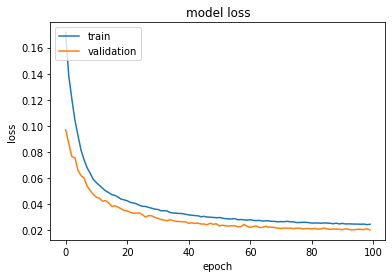

96-fc1d-patch_1-base_1-layer_1-label_FWF
(84, 50, 96)
Model: "functional_221"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_74 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_85 (Dense)             (None, 150)               14550     
_________________________________________________________________
dropout_73 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 14,701
Trainable params: 14,701
Non-trainable params: 0
_________________________________________________________________
testing data shape: (84, 84, 50, 96)
prediction has shape: (84, 84, 50, 1)
(84, 84, 50, 1)
prediction after repack has shape: (84, 84, 50, 1)
pred shape: (93643, 1)
gt has shape: (93643, 1)
th

In [76]:
# 1 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 1 --train --label_type F"
plot_loss(cmd)
# 1 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 1 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_223"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_75 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_108 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
dropout_74 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_109 (Conv2D)          (None, 1, 1, 1)           151       
Total params: 129,901
Trainable params: 129,901
Non-trainable params: 0
_________________________________________________________________
['F']
(82641, 3, 3, 96)
(82641, 1, 1, 150)
(82641, 1, 1, 150)
(82641, 1, 1, 1)
Training start ...


2022-03-20 17:36:12.568932: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:36:12.569028: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:36:13.381052: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:36:13.408711: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:36:13.408999: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:36:13.410053: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_36_13
2022-03-20 17:36:13.410566: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_36_13/vw.trace.json.gz
2022-03-20 17:36:13.410641: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:36:13.411382: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

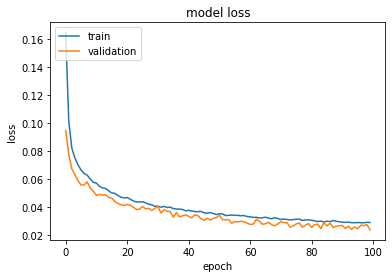

96-conv2d-patch_3-base_1-layer_1-label_FWF
(84, 84, 96)
Model: "functional_227"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_76 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_110 (Conv2D)          (None, 82, 82, 150)       129750    
_________________________________________________________________
dropout_75 (Dropout)         (None, 82, 82, 150)       0         
_________________________________________________________________
conv2d_111 (Conv2D)          (None, 82, 82, 1)         151       
Total params: 129,901
Trainable params: 129,901
Non-trainable params: 0
_________________________________________________________________
testing data shape: (50, 84, 84, 96)
prediction has shape: (50, 82, 82, 1)
(84, 84, 50, 1)
prediction after repack has shape: (84, 84, 50, 1)
pred shape: (93643, 1)
gt has shape: (93643, 1

In [77]:
# 1 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 1 --train --label_type F"
plot_loss(cmd)
# 1 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 1 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_229"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_77 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_108 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
dropout_76 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_109 (Conv3D)          (None, 1, 1, 1, 1)        151       
Total params: 389,101
Trainable params: 389,101
Non-trainable params: 0
_________________________________________________________________
['F']
(82641, 3, 3, 3, 96)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 1)
Training start ...


2022-03-20 17:37:01.018830: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:37:01.018930: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:37:01.582459: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:37:01.603772: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:37:01.604041: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:37:01.605064: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_37_01
2022-03-20 17:37:01.605563: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_37_01/vw.trace.json.gz
2022-03-20 17:37:01.605639: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:37:01.606387: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

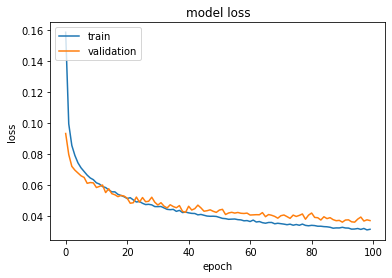

96-conv3d-patch_3-base_1-layer_1-label_FWF
(84, 84, 50)
Model: "functional_233"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_78 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_110 (Conv3D)          (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
dropout_77 (Dropout)         (None, 82, 82, 48, 150)   0         
_________________________________________________________________
conv3d_111 (Conv3D)          (None, 82, 82, 48, 1)     151       
Total params: 389,101
Trainable params: 389,101
Non-trainable params: 0
_________________________________________________________________
testing data shape: (1, 84, 84, 50, 96)
prediction has shape: (1, 82, 82, 48, 1)
(84, 84, 50, 1)
prediction after repack has shape: (84, 84, 50, 1)
pred shape: (93643, 1)
gt has shape: (93

In [78]:
# 1 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 1 --train --label_type F --lr 0.00005"
plot_loss(cmd)
# 1 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 1 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9964714604777891
the ssim score for 2d cnn is: 0.9919186277931886
the ssim score for 3d cnn is: 0.9809641646726989


Text(0.5, 0.98, 'Difference map 3D CNN')

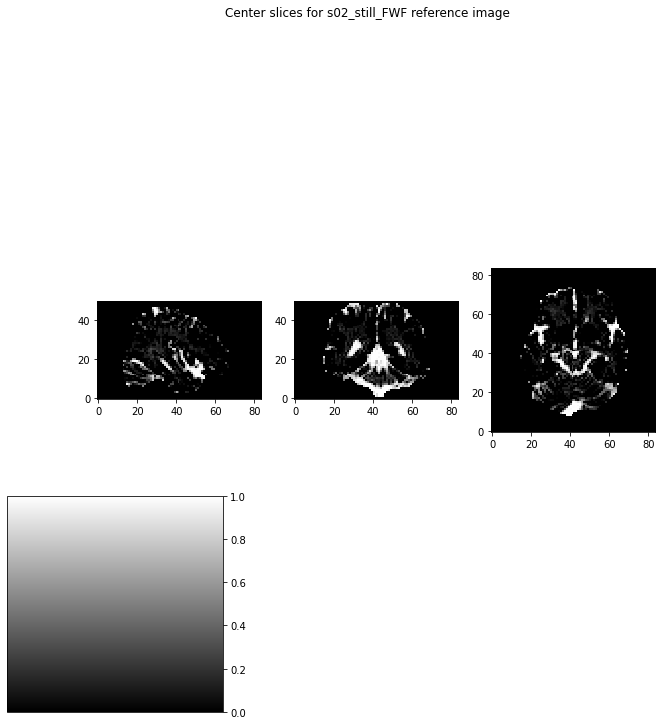

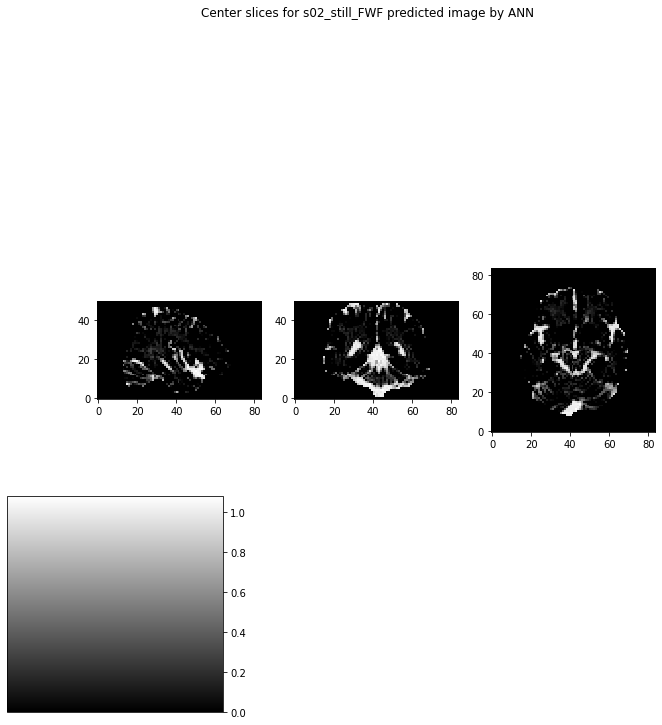

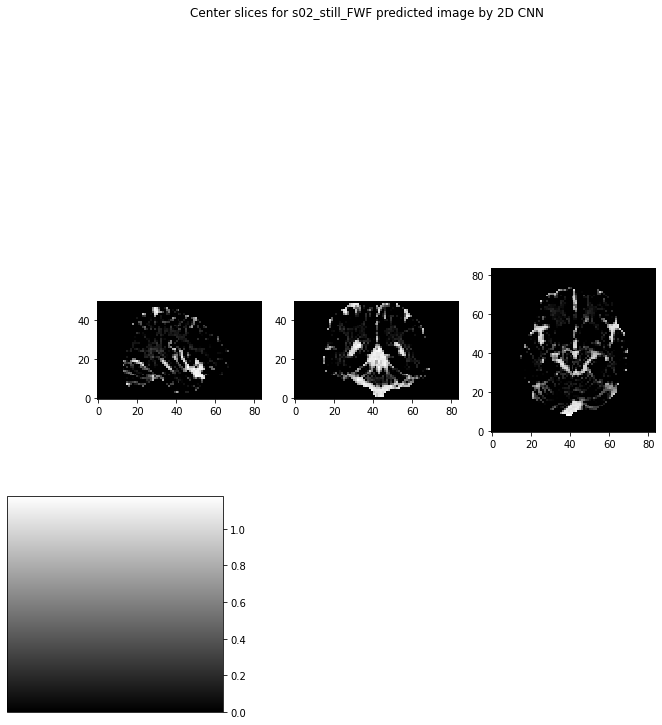

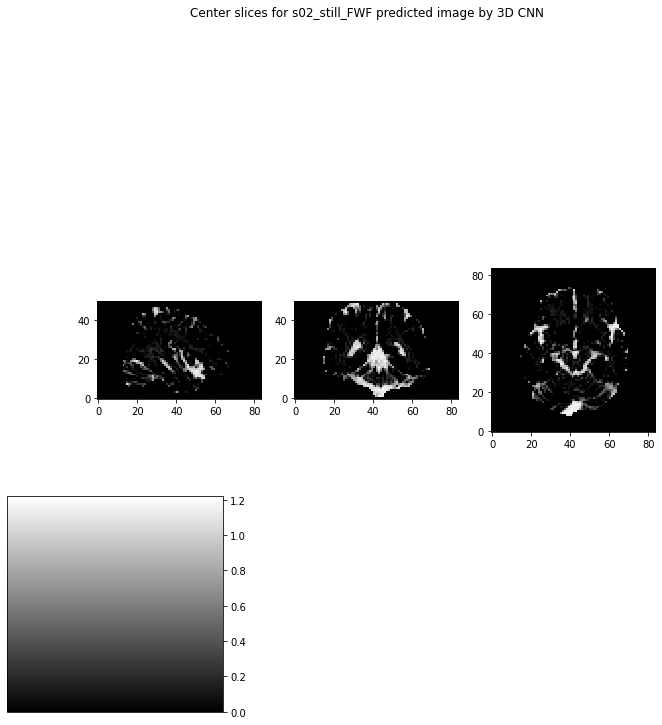

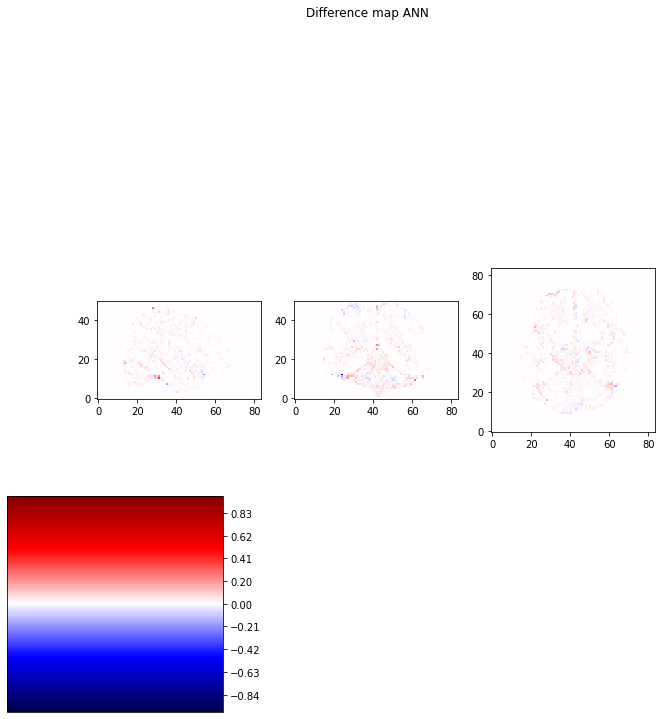

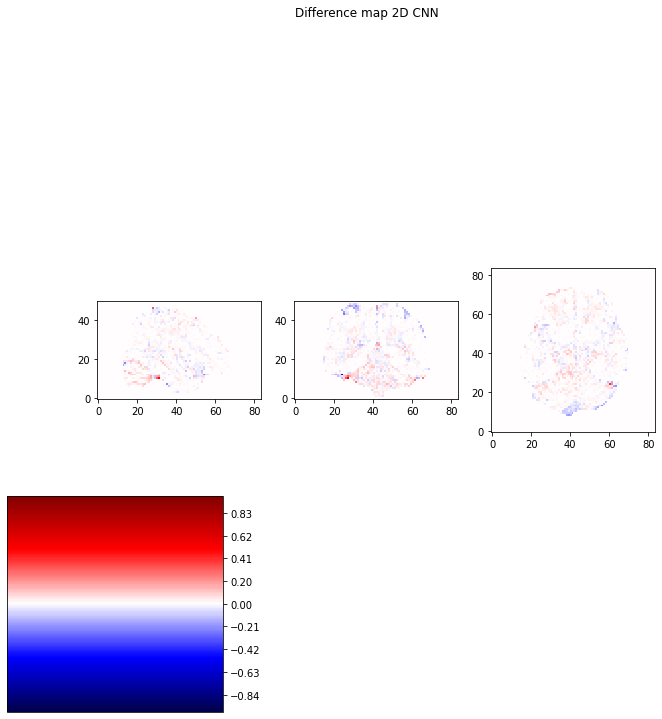

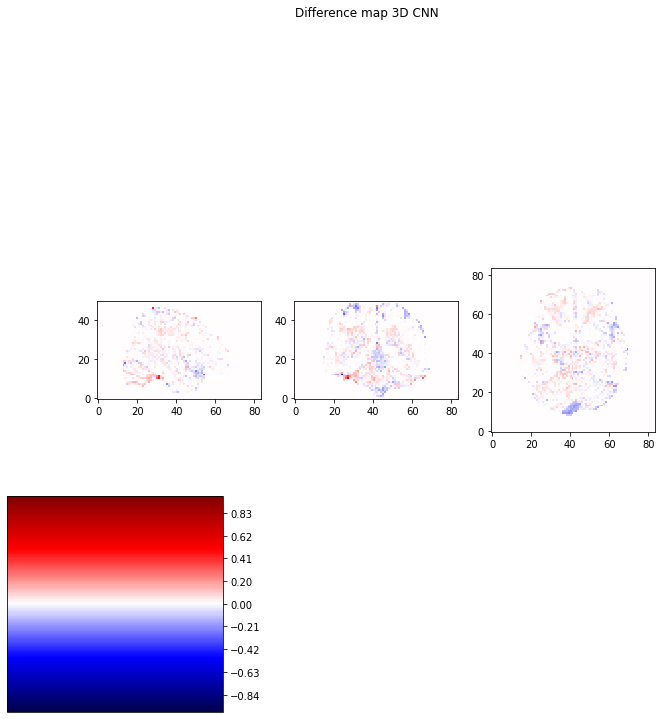

In [79]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_1-label_FWF.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_1-label_FWF.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_1-label_FWF.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_FWF_img_data[26, :, :]
ref_slice_1 = s02_FWF_img_data[:, 30, :]
ref_slice_2 = s02_FWF_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_FWF reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_FWF predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_FWF_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_FWF predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_FWF_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_FWF predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_FWF_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>2 layer</strong>

ANN

Model: "functional_235"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_79 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_86 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_87 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_78 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 37,351
Trainable params: 37,351
Non-trainable params: 0
_________________________________________________________________
['F']
(82889, 96)
(82889, 150)
(82889, 150)
(82889, 150)
(82889, 1)
Training start ...


2022-03-20 17:39:01.161204: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:39:01.161287: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:39:01.532039: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:39:01.549372: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:39:01.549664: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:39:01.550747: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_39_01
2022-03-20 17:39:01.551273: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_39_01/vw.trace.json.gz
2022-03-20 17:39:01.551351: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:39:01.552113: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

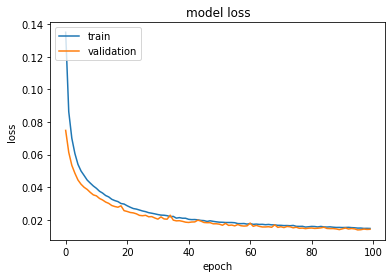

96-fc1d-patch_1-base_1-layer_2-label_FWF
(84, 50, 96)
Model: "functional_239"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_80 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_88 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_89 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_79 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 37,351
Trainable params: 37,351
Non-trainable params: 0
_________________________________________________________________
testing data shape: (84, 84, 50, 96)
prediction has shape: (

In [80]:
# 2 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 2 --train --label_type F"
plot_loss(cmd)
# 2 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 2 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_241"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_81 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_112 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_113 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_80 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_114 (Conv2D)          (None, 1, 1, 1)           151       
Total params: 152,551
Trainable params: 152,551
Non-trainable params: 0
_________________________________________________________________
['F']
(82641, 3, 3, 96)
(82641, 1, 1, 150)
(82641, 1, 1, 150)
(82641, 1, 1, 150)
(82641, 1, 1, 1)
Training start

2022-03-20 17:39:32.088952: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:39:32.089038: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:39:32.602361: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:39:32.623889: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:39:32.624164: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:39:32.625197: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_39_32
2022-03-20 17:39:32.625745: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_39_32/vw.trace.json.gz
2022-03-20 17:39:32.625820: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:39:32.626590: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

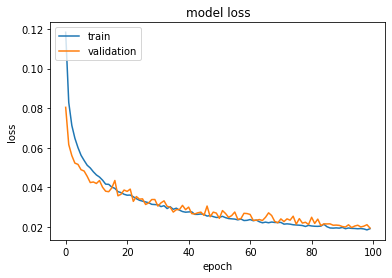

96-conv2d-patch_3-base_1-layer_2-label_FWF
(84, 84, 96)
Model: "functional_245"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_82 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_115 (Conv2D)          (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_116 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_81 (Dropout)         (None, 82, 82, 150)       0         
_________________________________________________________________
conv2d_117 (Conv2D)          (None, 82, 82, 1)         151       
Total params: 152,551
Trainable params: 152,551
Non-trainable params: 0
_________________________________________________________________
testing data shape: (50, 84, 84, 96)
prediction has shap

In [81]:
# 2 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 2 --train --label_type F"
plot_loss(cmd)
# 2 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 2 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_247"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_83 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_112 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_113 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_82 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_114 (Conv3D)          (None, 1, 1, 1, 1)        151       
Total params: 411,751
Trainable params: 411,751
Non-trainable params: 0
_________________________________________________________________
['F']
(82641, 3, 3, 3, 96)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 150)
(82641, 1, 1, 1, 1)

2022-03-20 17:40:31.150514: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:40:31.150618: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:40:31.699731: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:40:31.722320: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:40:31.722608: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:40:31.723677: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_40_31
2022-03-20 17:40:31.724259: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_40_31/vw.trace.json.gz
2022-03-20 17:40:31.724335: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:40:31.725128: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

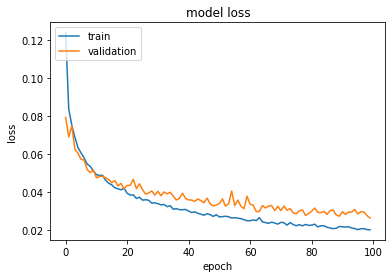

96-conv3d-patch_3-base_1-layer_2-label_FWF
(84, 84, 50)
Model: "functional_251"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_84 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_115 (Conv3D)          (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_116 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_83 (Dropout)         (None, 82, 82, 48, 150)   0         
_________________________________________________________________
conv3d_117 (Conv3D)          (None, 82, 82, 48, 1)     151       
Total params: 411,751
Trainable params: 411,751
Non-trainable params: 0
_________________________________________________________________
testing data shape: (1, 84, 84, 50, 96)
prediction has s

In [82]:
# 2 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 2 --train --label_type F"
plot_loss(cmd)
# 2 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 2 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.998303300946647
the ssim score for 2d cnn is: 0.9947648070744477
the ssim score for 3d cnn is: 0.9905157348931136


Text(0.5, 0.98, 'Difference map 3D CNN')

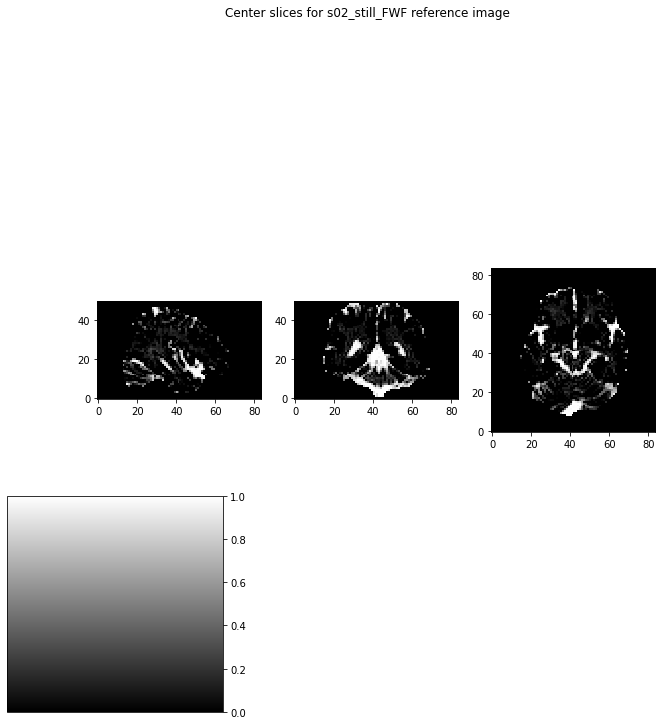

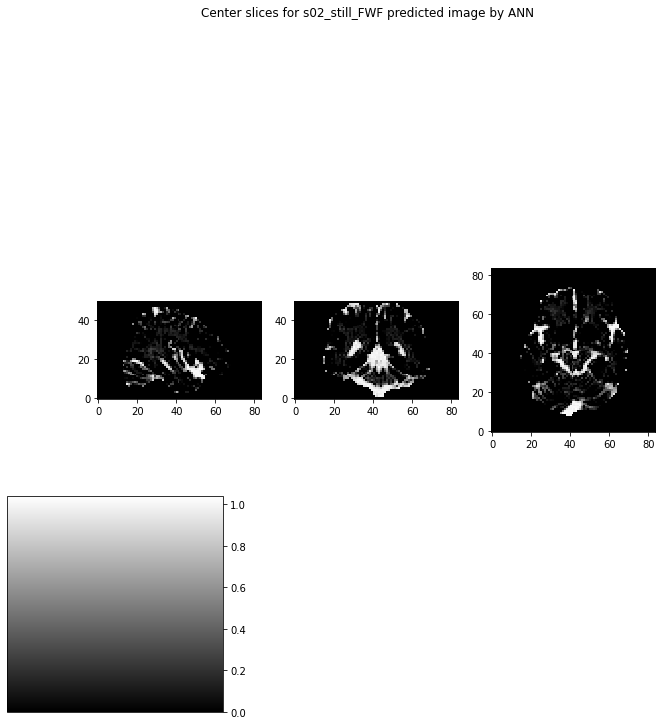

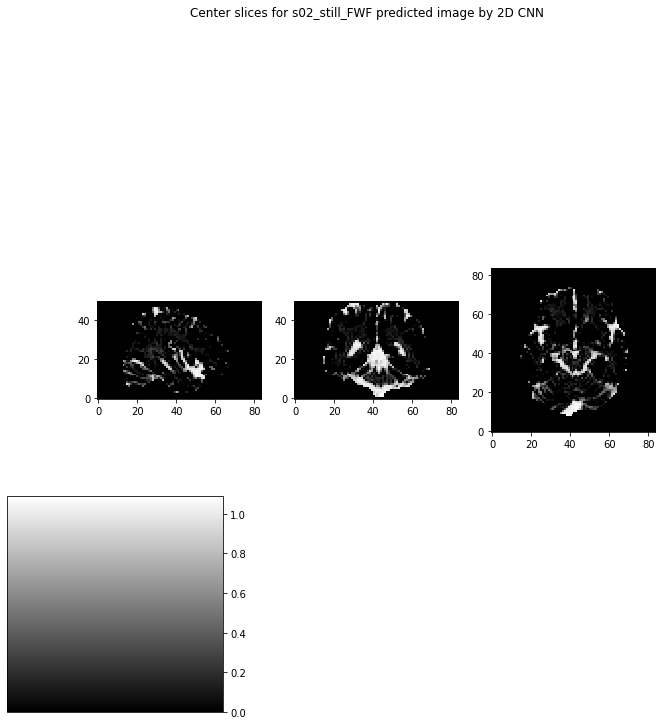

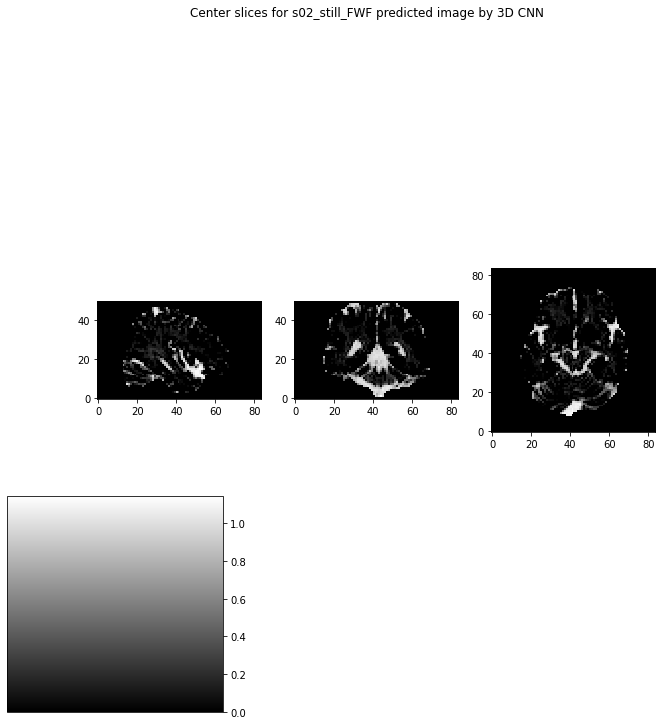

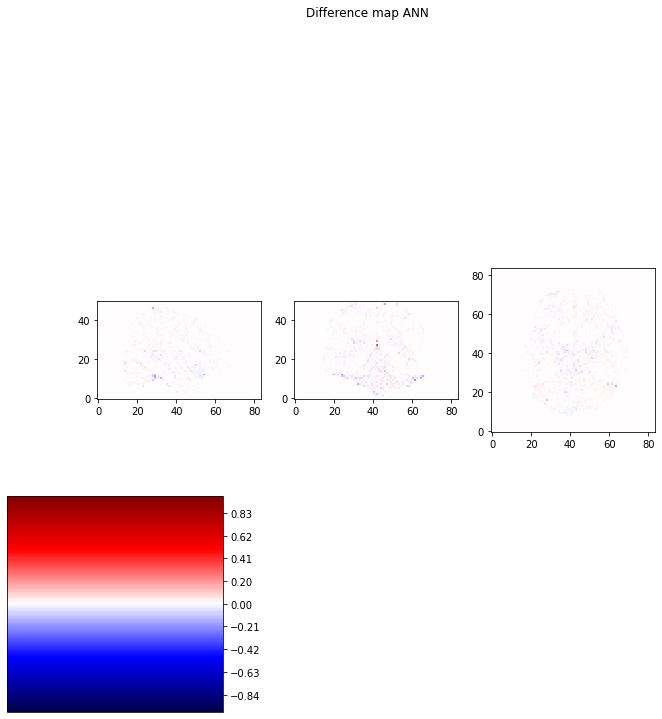

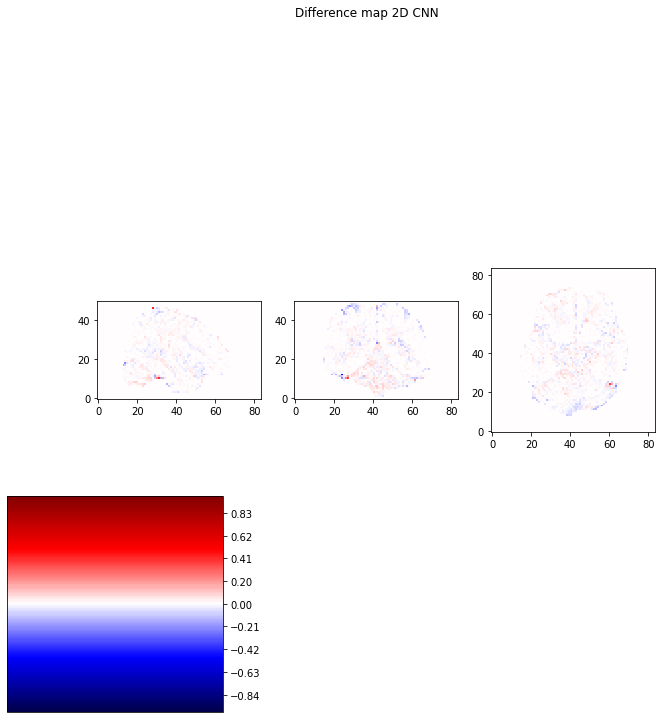

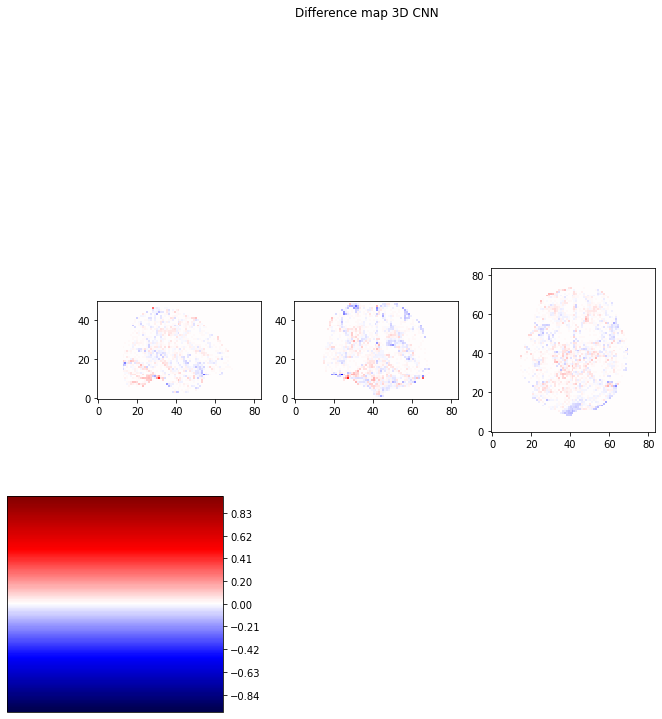

In [83]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_2-label_FWF.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_2-label_FWF.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_2-label_FWF.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_FWF_img_data[26, :, :]
ref_slice_1 = s02_FWF_img_data[:, 30, :]
ref_slice_2 = s02_FWF_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_FWF reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_FWF predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_FWF_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_FWF predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_FWF_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_FWF predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_FWF_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>3 layer</strong>

ANN

Model: "functional_253"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_85 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_90 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_91 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_92 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_84 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 60,001
Trainable params: 60,001
Non-trainable params: 0
________________________________________________

2022-03-20 17:42:38.688726: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:42:38.688811: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:42:39.150455: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:42:39.176823: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:42:39.177138: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:42:39.178337: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_42_39
2022-03-20 17:42:39.178918: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_42_39/vw.trace.json.gz
2022-03-20 17:42:39.179016: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:42:39.179857: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

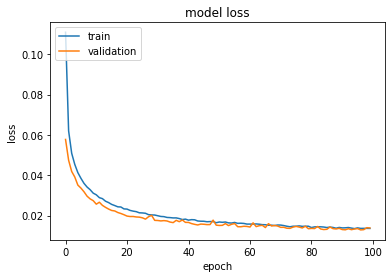

96-fc1d-patch_1-base_1-layer_3-label_FWF
(84, 50, 96)
Model: "functional_257"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_86 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_93 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_94 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_95 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_85 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 151       
Total params: 60,001
Trainable params: 60,001
Non-trainable para

In [84]:
# 3 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 3 --train --label_type F"
plot_loss(cmd)
# 3 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 3 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_259"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_87 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_118 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_119 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_120 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_86 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_121 (Conv2D)          (None, 1, 1, 1)           151       
Total params: 175,201
Trainable params: 175,201
Non-trainable params: 0
______________________________________________

2022-03-20 17:43:15.387664: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:43:15.387751: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:43:15.965719: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:43:15.995988: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:43:15.996284: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:43:15.997445: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_43_15
2022-03-20 17:43:15.998040: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_43_15/vw.trace.json.gz
2022-03-20 17:43:15.998158: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:43:15.998990: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

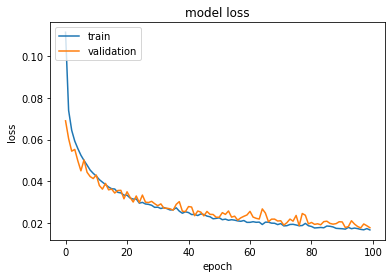

96-conv2d-patch_3-base_1-layer_3-label_FWF
(84, 84, 96)
Model: "functional_263"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_88 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_122 (Conv2D)          (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_123 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_124 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_87 (Dropout)         (None, 82, 82, 150)       0         
_________________________________________________________________
conv2d_125 (Conv2D)          (None, 82, 82, 1)         151       
Total params: 175,201
Trainable params: 175,201
Non-trainable 

In [85]:
# 3 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 3 --train --label_type F"
plot_loss(cmd)
# 3 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 3 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_265"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_89 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_118 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_119 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_120 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_88 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_121 (Conv3D)          (None, 1, 1, 1, 1)        151       
Total params: 434,401
Trainable params: 434,401
Non-trainable params: 0
______________________________________________

2022-03-20 17:44:24.371111: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:44:24.371201: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:44:24.958352: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:44:24.983975: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:44:24.984289: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:44:24.985434: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_44_24
2022-03-20 17:44:24.986068: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_44_24/vw.trace.json.gz
2022-03-20 17:44:24.986160: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:44:24.987061: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

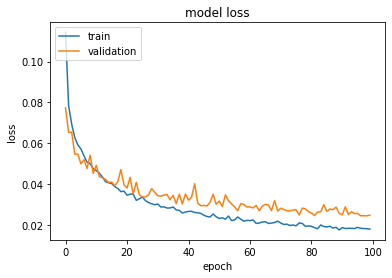

96-conv3d-patch_3-base_1-layer_3-label_FWF
(84, 84, 50)
Model: "functional_269"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_90 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_122 (Conv3D)          (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_123 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_124 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_89 (Dropout)         (None, 82, 82, 48, 150)   0         
_________________________________________________________________
conv3d_125 (Conv3D)          (None, 82, 82, 48, 1)     151       
Total params: 434,401
Trainable params: 434,401
Non-trainable 

In [86]:
# 3 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 3 --train --label_type F"
plot_loss(cmd)
# 3 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 3 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9982578008619026
the ssim score for 2d cnn is: 0.9957196603170735
the ssim score for 3d cnn is: 0.9910692360149456


Text(0.5, 0.98, 'Difference map 3D CNN')

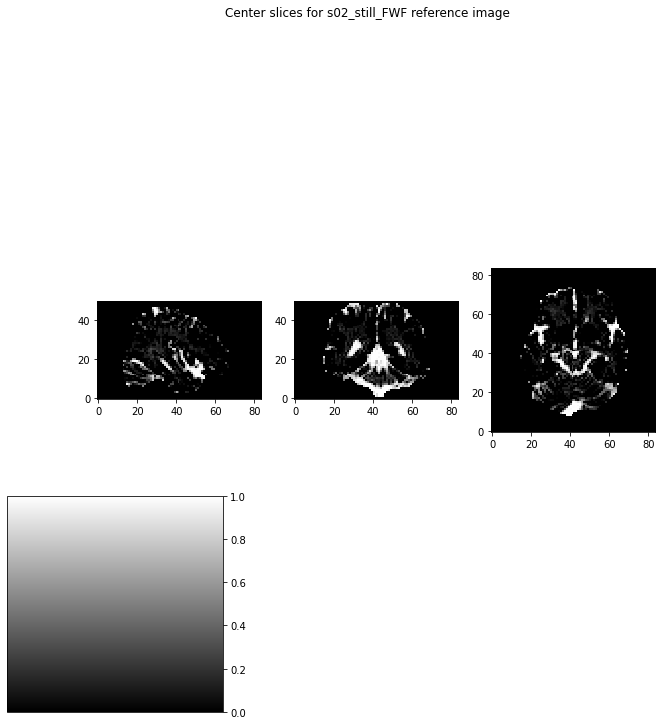

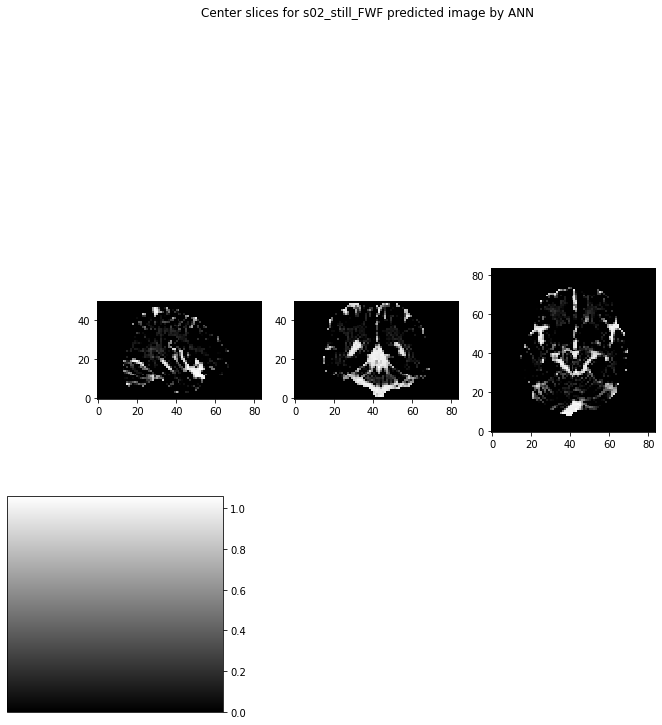

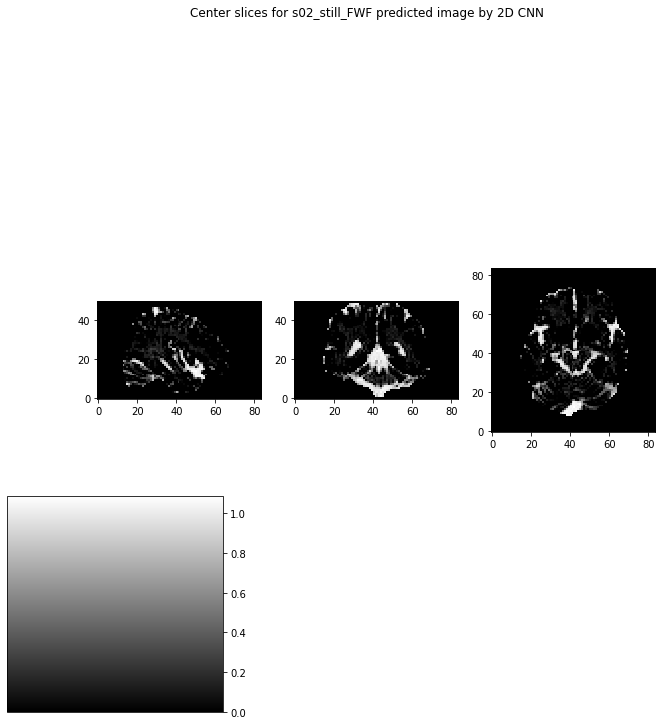

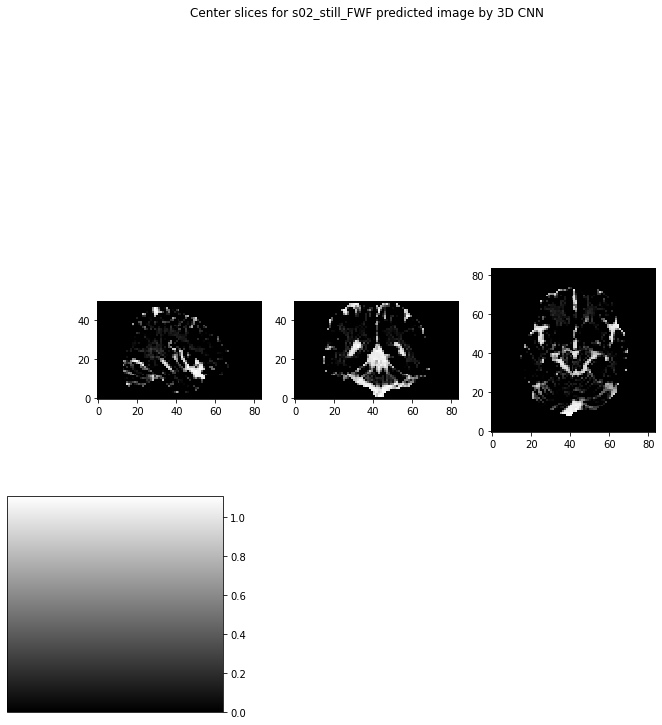

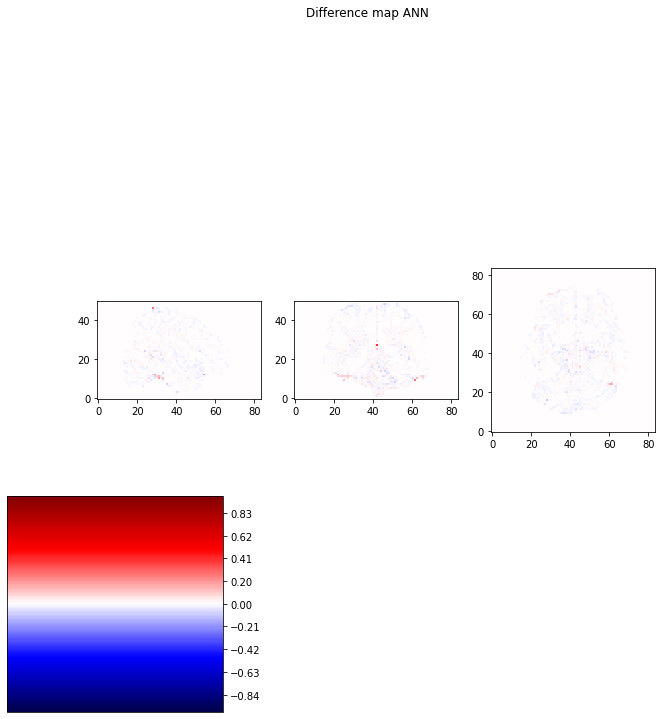

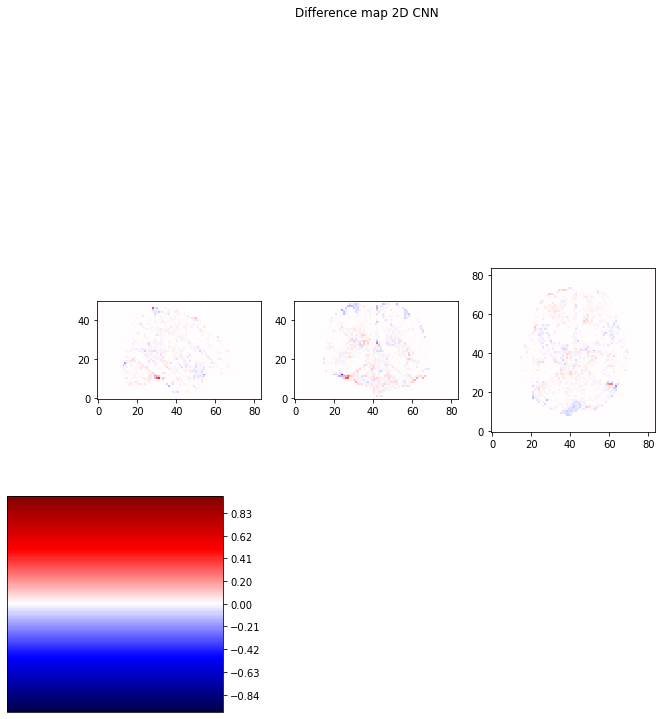

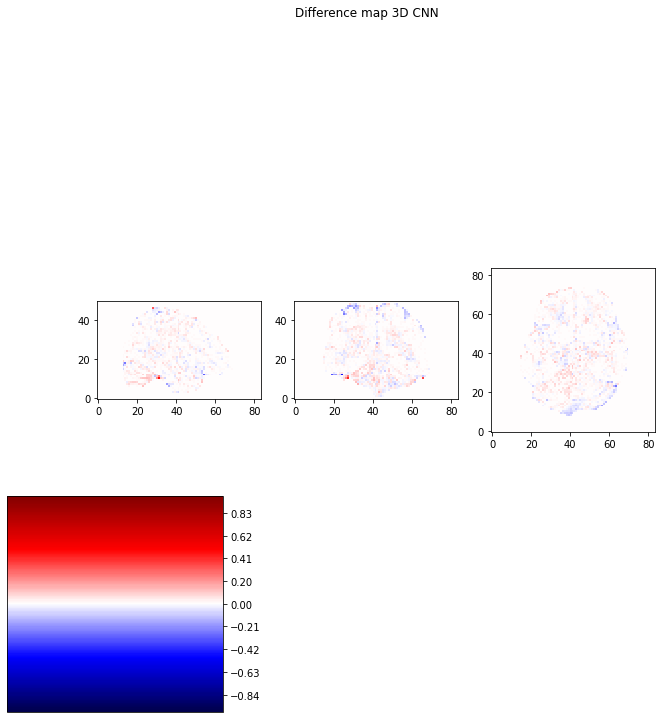

In [87]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_3-label_FWF.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_3-label_FWF.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_3-label_FWF.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_FWF_img_data[26, :, :]
ref_slice_1 = s02_FWF_img_data[:, 30, :]
ref_slice_2 = s02_FWF_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_FWF reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_FWF predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_FWF_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_FWF predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_FWF_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_FWF predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_FWF_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>4 layer</strong>

ANN

Model: "functional_271"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_91 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_96 (Dense)             (None, 150)               14550     
_________________________________________________________________
dense_97 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_98 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_99 (Dense)             (None, 150)               22650     
_________________________________________________________________
dropout_90 (Dropout)         (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 17:46:42.059855: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:46:42.060003: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:46:42.548702: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:46:42.577108: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:46:42.577419: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:46:42.578604: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_46_42
2022-03-20 17:46:42.579215: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_46_42/vw.trace.json.gz
2022-03-20 17:46:42.579306: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:46:42.580195: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

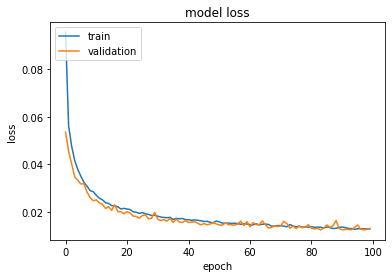

96-fc1d-patch_1-base_1-layer_4-label_FWF
(84, 50, 96)
Model: "functional_275"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_92 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_100 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_101 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_102 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_103 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_91 (Dropout)         (None, 150)               0         
________________________________________________________________

In [88]:
# 4 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 4 --train --label_type F"
plot_loss(cmd)
# 4 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 4 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_277"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_93 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_126 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_127 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_128 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_129 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_92 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_130 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 17:47:24.012932: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:47:24.013033: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:47:24.636819: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:47:24.673949: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:47:24.674332: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:47:24.675844: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_47_24
2022-03-20 17:47:24.676567: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_47_24/vw.trace.json.gz
2022-03-20 17:47:24.676693: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:47:24.677772: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

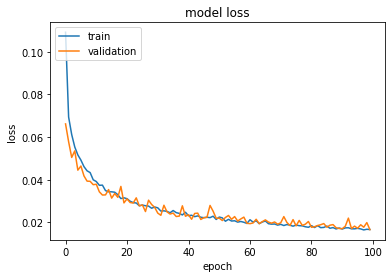

96-conv2d-patch_3-base_1-layer_4-label_FWF
(84, 84, 96)
Model: "functional_281"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_94 (InputLayer)        [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_131 (Conv2D)          (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_132 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_133 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_134 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_93 (Dropout)         (None, 82, 82, 150)       0         
______________________________________________________________

In [89]:
# 4 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 4 --train --label_type F"
plot_loss(cmd)
# 4 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 4 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_283"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_95 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_126 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_127 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_128 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_129 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_94 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_130 (Conv3D)          (None, 1, 1, 1, 1)     

2022-03-20 17:48:43.279182: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:48:43.279274: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:48:43.903931: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:48:43.933267: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:48:43.933592: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:48:43.934818: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_48_43
2022-03-20 17:48:43.935479: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_48_43/vw.trace.json.gz
2022-03-20 17:48:43.935565: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:48:43.936446: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

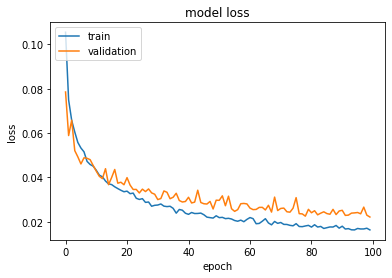

96-conv3d-patch_3-base_1-layer_4-label_FWF
(84, 84, 50)
Model: "functional_287"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_96 (InputLayer)        [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_131 (Conv3D)          (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_132 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_133 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_134 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_95 (Dropout)         (None, 82, 82, 48, 150)   0         
______________________________________________________________

In [90]:
# 4 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 4 --train --label_type F"
plot_loss(cmd)
# 4 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 4 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9983284254053475
the ssim score for 2d cnn is: 0.9961158250588344
the ssim score for 3d cnn is: 0.9929006263743526


Text(0.5, 0.98, 'Difference map 3D CNN')

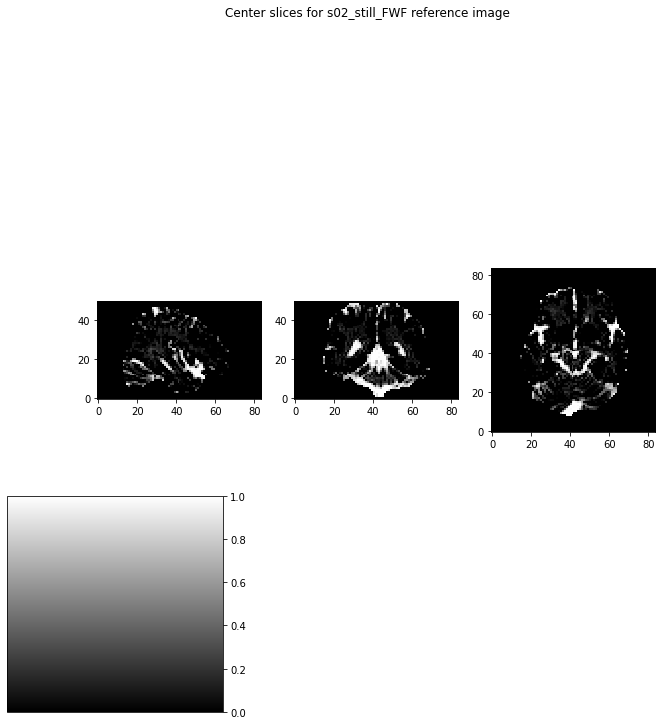

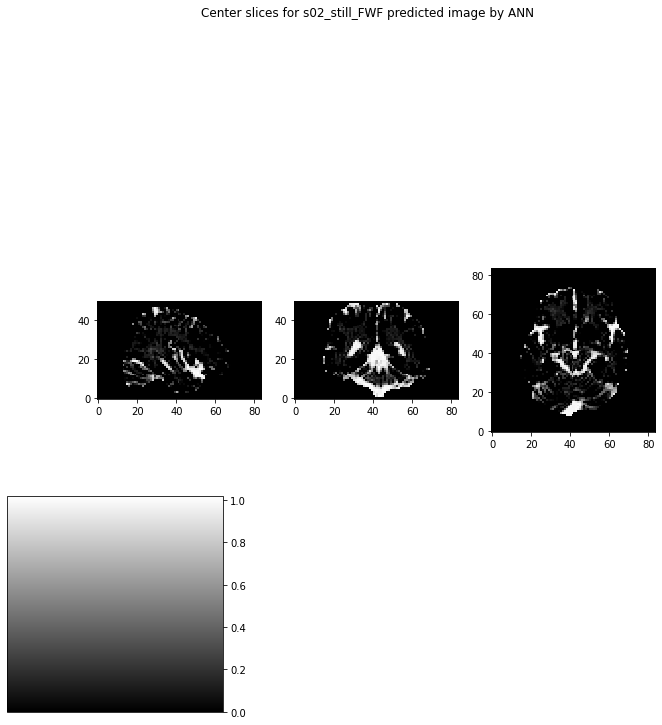

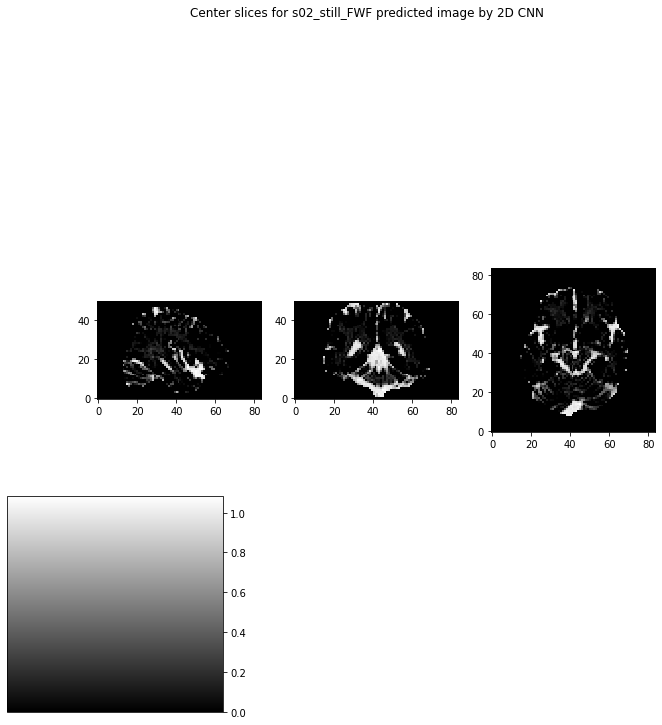

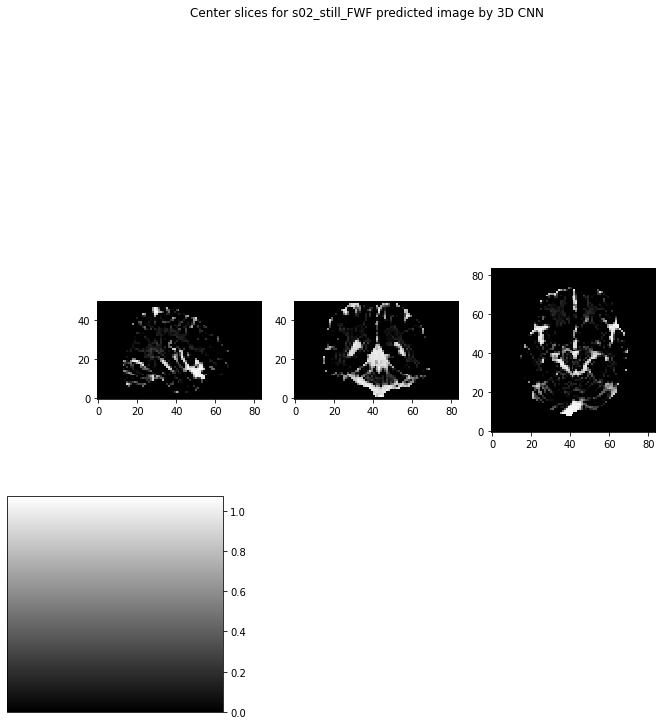

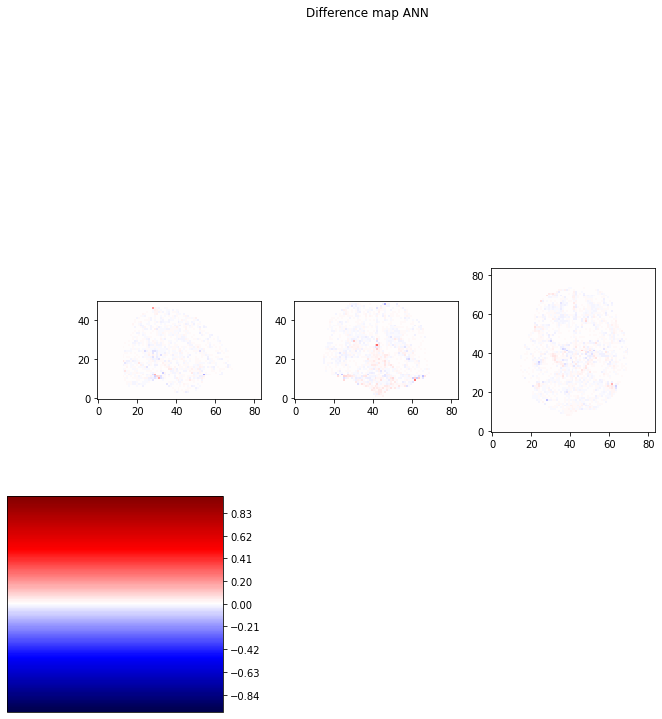

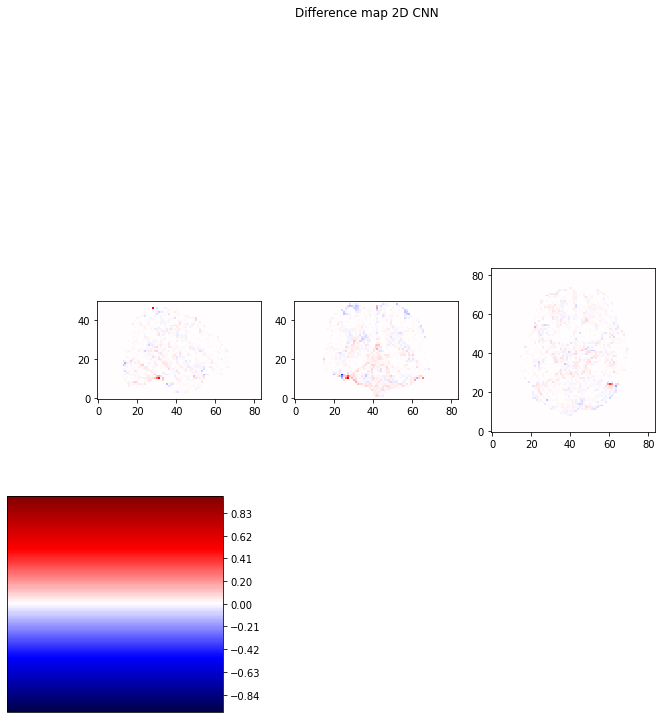

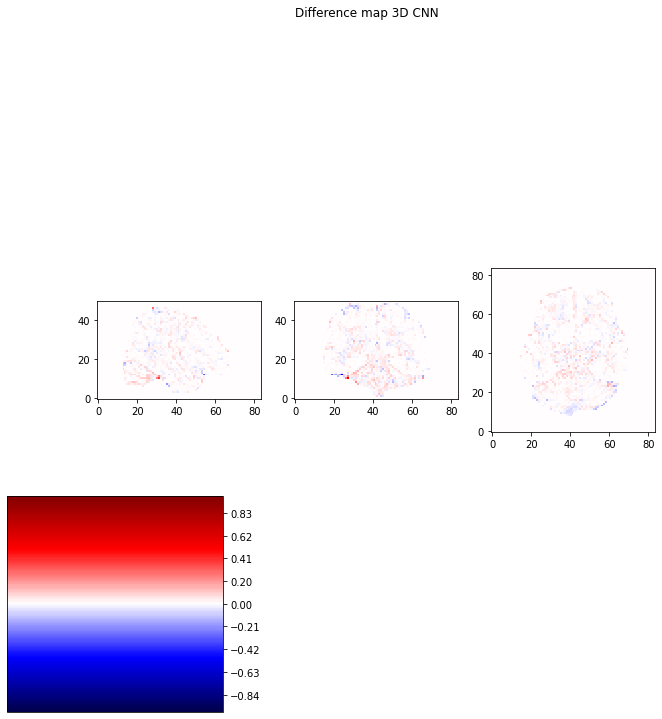

In [91]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_4-label_FWF.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_4-label_FWF.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_4-label_FWF.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_FWF_img_data[26, :, :]
ref_slice_1 = s02_FWF_img_data[:, 30, :]
ref_slice_2 = s02_FWF_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_FWF reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_FWF predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_FWF_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_FWF predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_FWF_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_FWF predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_FWF_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>5 layer</strong>

ANN

Model: "functional_289"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_97 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_104 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_105 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_106 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_107 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_108 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_96 (Dropout)         (None, 150)            

2022-03-20 17:51:10.266259: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:51:10.266350: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:51:10.787089: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:51:10.817562: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:51:10.817898: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:51:10.819274: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_51_10
2022-03-20 17:51:10.819964: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_51_10/vw.trace.json.gz
2022-03-20 17:51:10.820089: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:51:10.821093: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

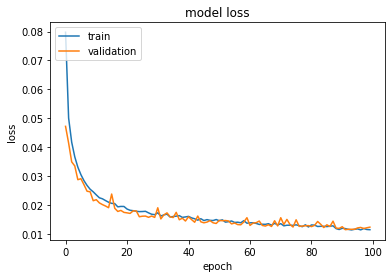

96-fc1d-patch_1-base_1-layer_5-label_FWF
(84, 50, 96)
Model: "functional_293"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_98 (InputLayer)        [(None, 96)]              0         
_________________________________________________________________
dense_109 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_110 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_111 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_112 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_113 (Dense)            (None, 150)               22650     
________________________________________________________________

In [92]:
# 5 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 5 --train --label_type F"
plot_loss(cmd)
# 5 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 5 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_295"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_99 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_136 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_137 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_138 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_139 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_140 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_98 (Dropout)         (None, 1, 1, 150)      

2022-03-20 17:51:57.616410: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:51:57.616504: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:51:58.267428: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:51:58.304100: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:51:58.304453: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:51:58.305752: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_51_58
2022-03-20 17:51:58.306441: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_51_58/vw.trace.json.gz
2022-03-20 17:51:58.306554: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:51:58.307503: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

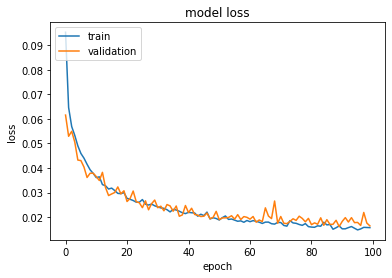

96-conv2d-patch_3-base_1-layer_5-label_FWF
(84, 84, 96)
Model: "functional_299"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_100 (InputLayer)       [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_142 (Conv2D)          (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_143 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_144 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_145 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_146 (Conv2D)          (None, 82, 82, 150)       22650     
______________________________________________________________

In [93]:
# 5 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 5 --train --label_type F"
plot_loss(cmd)
# 5 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 5 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_301"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_101 (InputLayer)       [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_136 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_137 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_138 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_139 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_140 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_100 (Dropout)        (None, 1, 1, 1, 150)   

2022-03-20 17:53:26.507178: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:53:26.507304: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:53:27.235910: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:53:27.271245: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:53:27.271685: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:53:27.273206: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_53_27
2022-03-20 17:53:27.273984: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_53_27/vw.trace.json.gz
2022-03-20 17:53:27.274100: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:53:27.275225: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

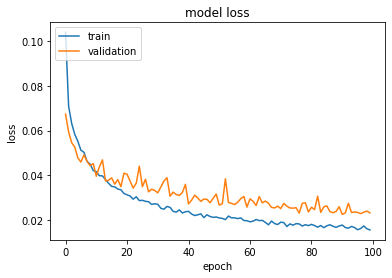

96-conv3d-patch_3-base_1-layer_5-label_FWF
(84, 84, 50)
Model: "functional_305"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_102 (InputLayer)       [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_142 (Conv3D)          (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_143 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_144 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_145 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_146 (Conv3D)          (None, 82, 82, 48, 150)   22650     
______________________________________________________________

In [94]:
# 5 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 5 --train --label_type F"
plot_loss(cmd)
# 5 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 5 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9984406625724488
the ssim score for 2d cnn is: 0.9963432069207698
the ssim score for 3d cnn is: 0.9926437802640229


Text(0.5, 0.98, 'Difference map 3D CNN')

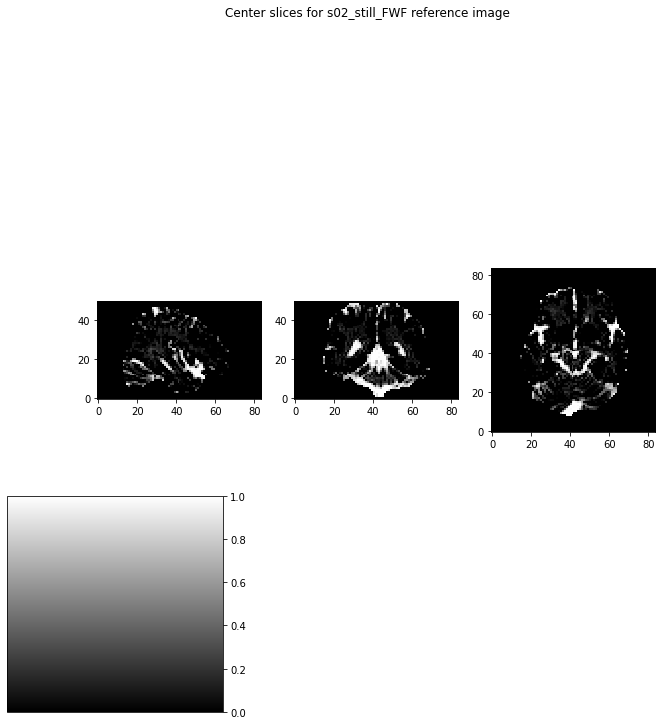

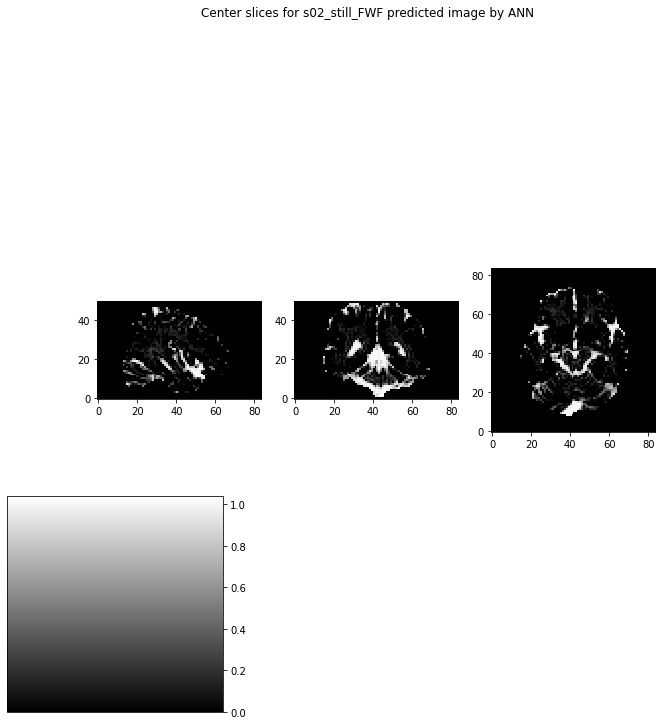

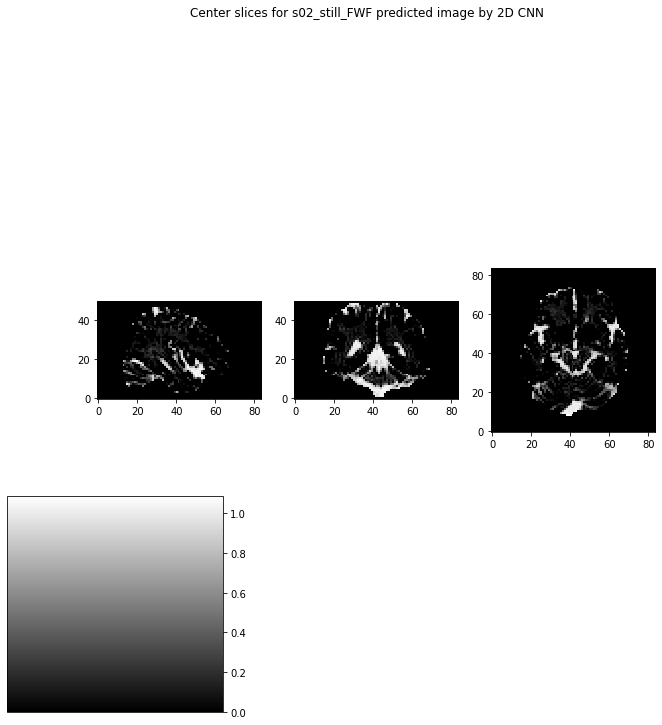

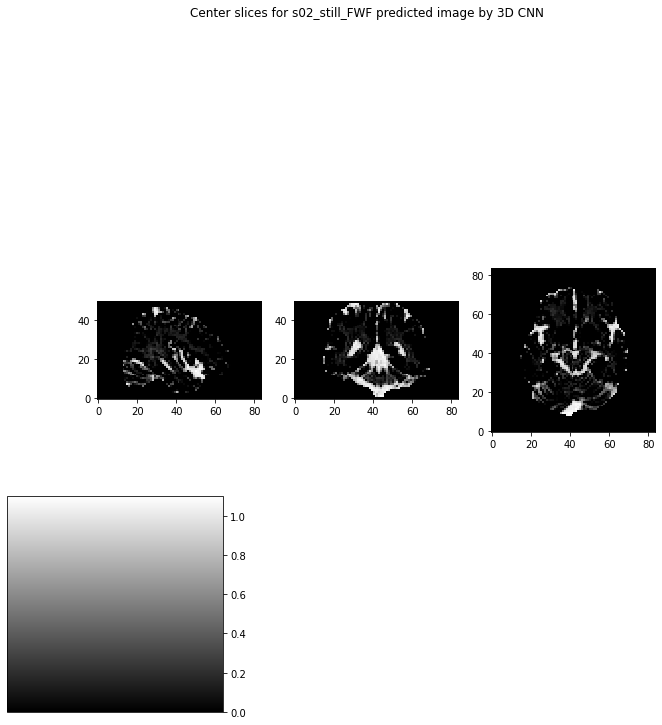

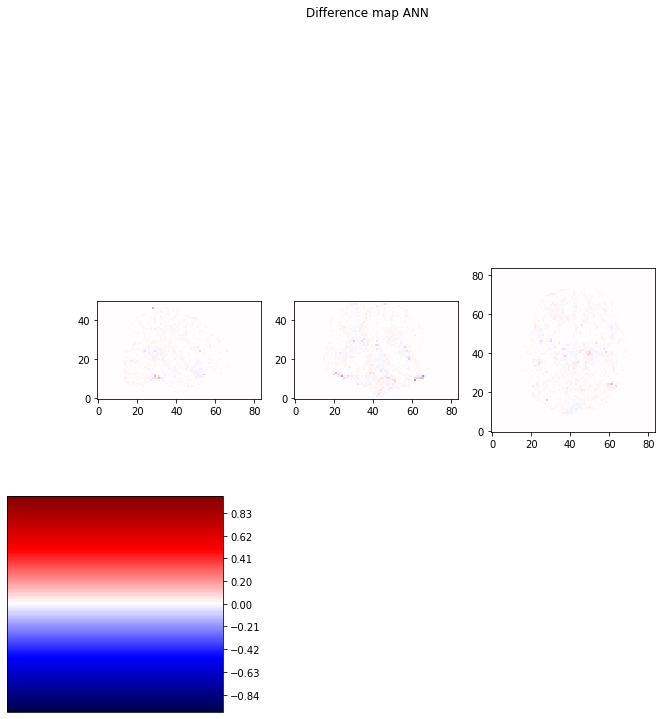

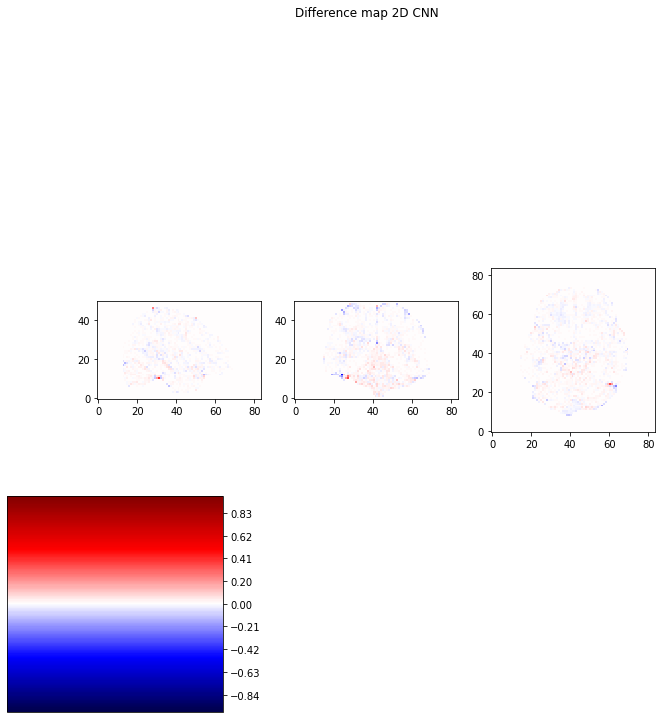

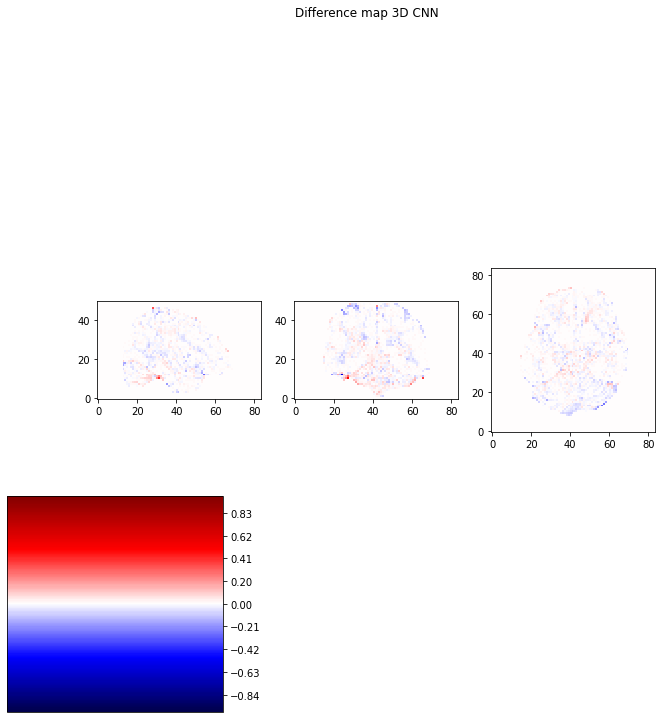

In [95]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_5-label_FWF.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_5-label_FWF.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_5-label_FWF.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_FWF_img_data[26, :, :]
ref_slice_1 = s02_FWF_img_data[:, 30, :]
ref_slice_2 = s02_FWF_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_FWF reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_FWF predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_FWF_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_FWF predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_FWF_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_FWF predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_FWF_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

<strong>6 layer</strong>

ANN

Model: "functional_307"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_103 (InputLayer)       [(None, 96)]              0         
_________________________________________________________________
dense_114 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_115 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_116 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_117 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_118 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_119 (Dense)            (None, 150)            

2022-03-20 17:56:01.079251: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:56:01.079391: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:56:01.886466: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:56:01.926810: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:56:01.927261: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:56:01.928734: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_56_01
2022-03-20 17:56:01.929415: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_56_01/vw.trace.json.gz
2022-03-20 17:56:01.929528: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:56:01.930557: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

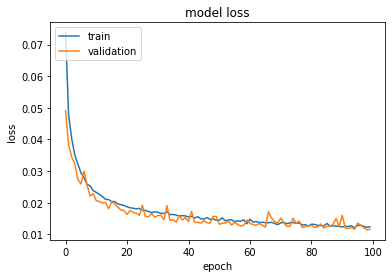

96-fc1d-patch_1-base_1-layer_6-label_FWF
(84, 50, 96)
Model: "functional_311"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_104 (InputLayer)       [(None, 96)]              0         
_________________________________________________________________
dense_120 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_121 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_122 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_123 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_124 (Dense)            (None, 150)               22650     
________________________________________________________________

In [96]:
# 6 layer training
cmd = "--train_subjects s01_still --model fc1d --layer 6 --train --label_type F"
plot_loss(cmd)
# 6 layer testing
cmd = "--test_subjects s02_still --model fc1d --layer 6 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

2D CNN

Model: "functional_313"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_105 (InputLayer)       [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_148 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_149 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_150 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_151 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_152 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_153 (Conv2D)          (None, 1, 1, 150)      

2022-03-20 17:56:54.588168: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:56:54.588270: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:56:55.324415: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:56:55.366792: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:56:55.367147: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:56:55.368503: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_56_55
2022-03-20 17:56:55.369217: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_56_55/vw.trace.json.gz
2022-03-20 17:56:55.369334: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:56:55.370370: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

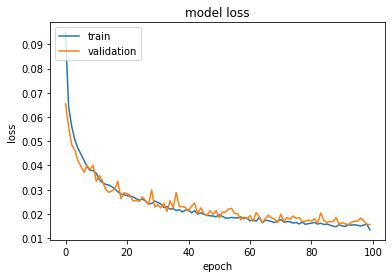

96-conv2d-patch_3-base_1-layer_6-label_FWF
(84, 84, 96)
Model: "functional_317"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_106 (InputLayer)       [(None, 84, 84, 96)]      0         
_________________________________________________________________
conv2d_155 (Conv2D)          (None, 82, 82, 150)       129750    
_________________________________________________________________
conv2d_156 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_157 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_158 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_159 (Conv2D)          (None, 82, 82, 150)       22650     
______________________________________________________________

In [97]:
# 6 layer training
cmd = "--train_subjects s01_still --model conv2d --layer 6 --train --label_type F"
plot_loss(cmd)
# 6 layer testing
cmd = "--test_subjects s02_still --model conv2d --layer 6 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

3D CNN

Model: "functional_319"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_107 (InputLayer)       [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_148 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_149 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_150 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_151 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_152 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_153 (Conv3D)          (None, 1, 1, 1, 150)   

2022-03-20 17:58:34.272971: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:58:34.273068: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 17:58:34.979563: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 17:58:35.014590: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 17:58:35.015004: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 17:58:35.016453: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_17_58_35
2022-03-20 17:58:35.017199: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_17_58_35/vw.trace.json.gz
2022-03-20 17:58:35.017313: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 17:58:35.018342: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

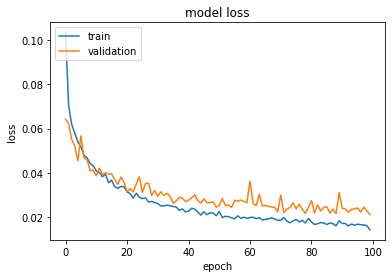

96-conv3d-patch_3-base_1-layer_6-label_FWF
(84, 84, 50)
Model: "functional_323"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_108 (InputLayer)       [(None, 84, 84, 50, 96)]  0         
_________________________________________________________________
conv3d_155 (Conv3D)          (None, 82, 82, 48, 150)   388950    
_________________________________________________________________
conv3d_156 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_157 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_158 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_159 (Conv3D)          (None, 82, 82, 48, 150)   22650     
______________________________________________________________

In [98]:
# 6 layer training
cmd = "--train_subjects s01_still --model conv3d --layer 6 --train --label_type F"
plot_loss(cmd)
# 6 layer testing
cmd = "--test_subjects s02_still --model conv3d --layer 6 --label_type F"
args = model_parser().parse_args(cmd.split())
test_model(args)

the ssim score for ann is: 0.9987171851945245
the ssim score for 2d cnn is: 0.9967692061634066
the ssim score for 3d cnn is: 0.9936917549459443


Text(0.5, 0.98, 'Difference map 3D CNN')

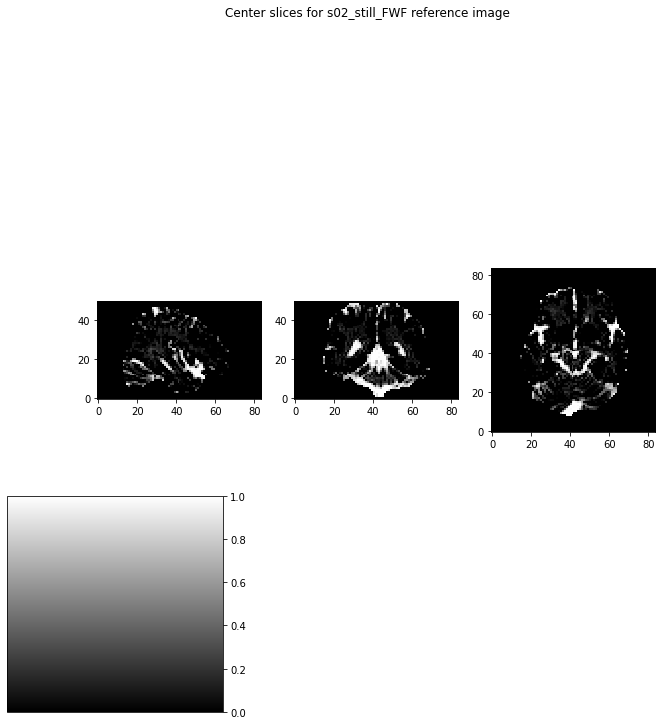

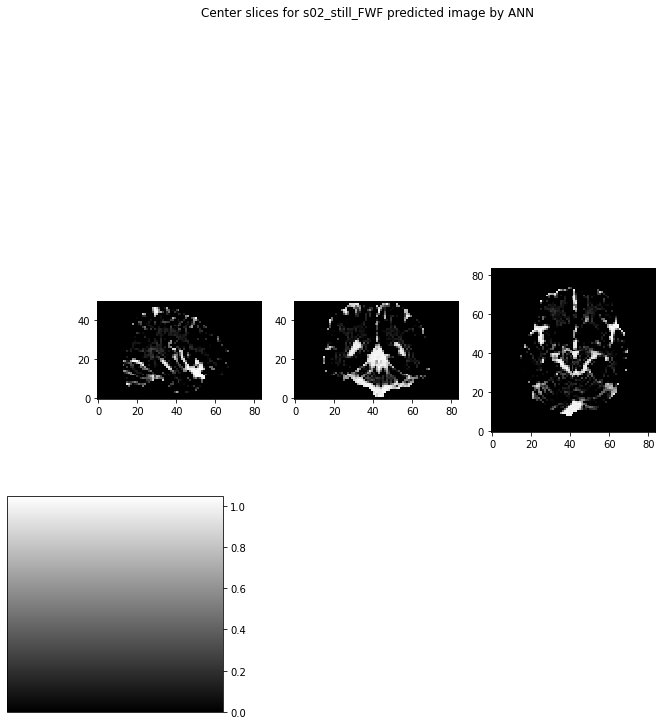

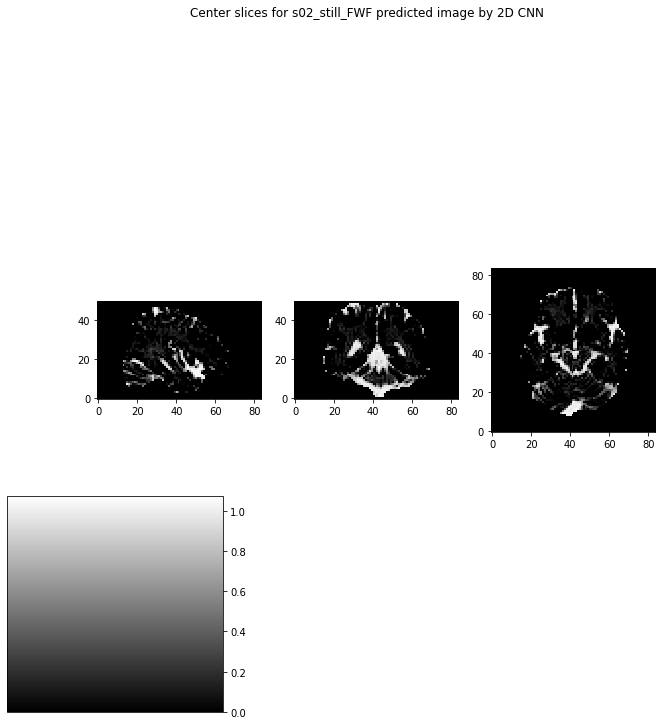

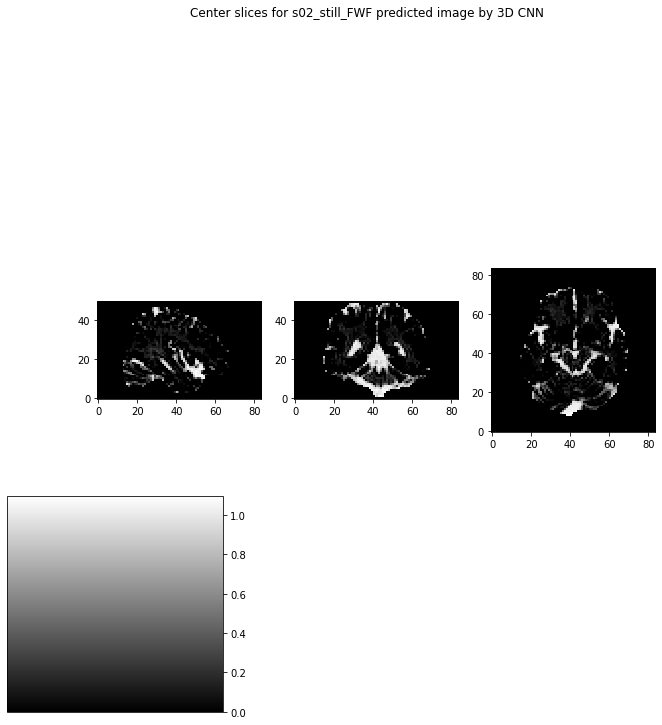

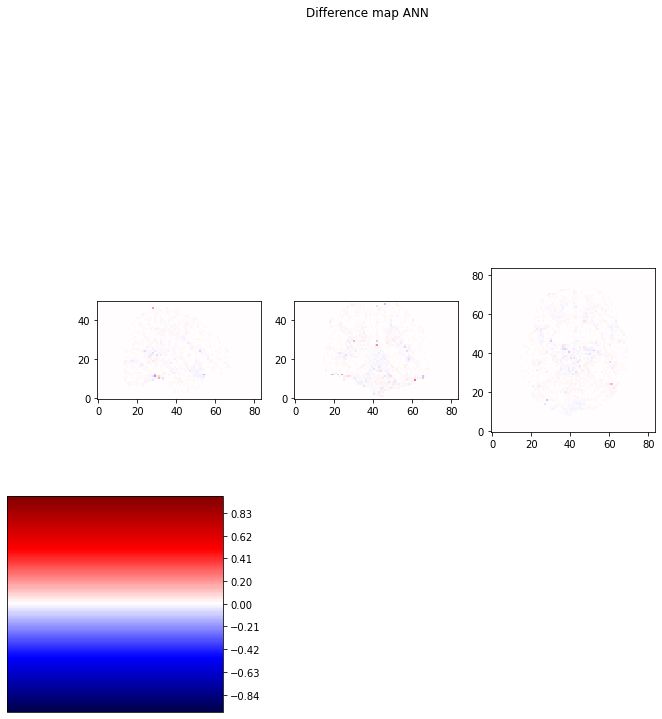

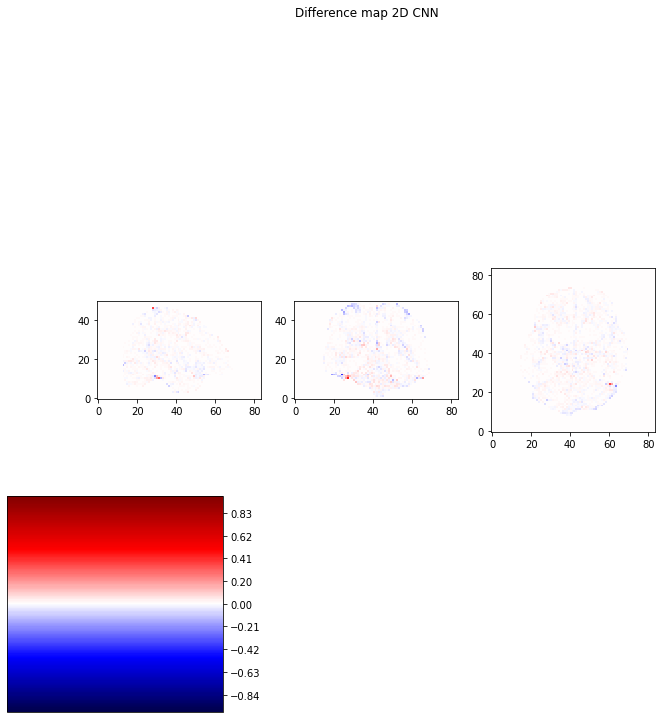

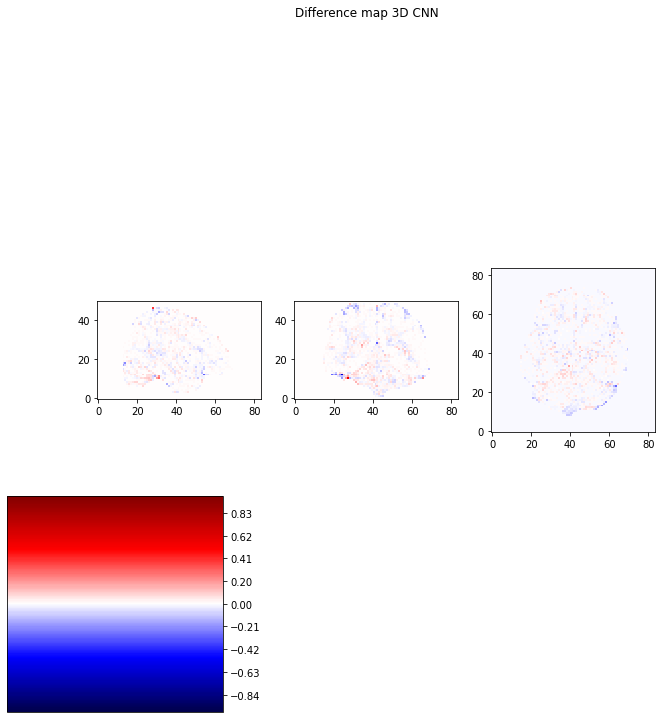

In [99]:
# load the reference img and pred img
ann_path = '../Net/nii/s02_still-96-fc1d-patch_1-base_1-layer_6-label_FWF.nii'
cnn2d_path = '../Net/nii/s02_still-96-conv2d-patch_3-base_1-layer_6-label_FWF.nii'
cnn3d_path = '../Net/nii/s02_still-96-conv3d-patch_3-base_1-layer_6-label_FWF.nii'
ann_img = nib.load(ann_path)
ann_data = ann_img.get_fdata()
cnn2d_img = nib.load(cnn2d_path)
cnn2d_data = cnn2d_img.get_fdata()
cnn3d_img = nib.load(cnn3d_path)
cnn3d_data = cnn3d_img.get_fdata()

# visualise both ref img and pred img
ref_slice_0 = s02_FWF_img_data[26, :, :]
ref_slice_1 = s02_FWF_img_data[:, 30, :]
ref_slice_2 = s02_FWF_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_FWF reference image")

ann0 = ann_data[26, :, :]
ann1 = ann_data[:, 30, :]
ann2 = ann_data[:, :, 16]
show_slices([ann0, ann1, ann2])
plt.suptitle("Center slices for s02_still_FWF predicted image by ANN")
(annscore, anndiff) = compare_ssim(ann_data, s02_FWF_img_data, full=True)
print('the ssim score for ann is: ' + str(annscore))

cnn2d0 = cnn2d_data[26, :, :]
cnn2d1 = cnn2d_data[:, 30, :]
cnn2d2 = cnn2d_data[:, :, 16]
show_slices([cnn2d0, cnn2d1, cnn2d2])
plt.suptitle("Center slices for s02_still_FWF predicted image by 2D CNN")
(cnn2dscore, cnn2ddiff) = compare_ssim(cnn2d_data, s02_FWF_img_data, full=True)
print('the ssim score for 2d cnn is: ' + str(cnn2dscore))

cnn3d0 = cnn3d_data[26, :, :]
cnn3d1 = cnn3d_data[:, 30, :]
cnn3d2 = cnn3d_data[:, :, 16]
show_slices([cnn3d0, cnn3d1, cnn3d2])
plt.suptitle("Center slices for s02_still_FWF predicted image by 3D CNN")
(cnn3dscore, cnn3ddiff) = compare_ssim(cnn3d_data, s02_FWF_img_data, full=True)
print('the ssim score for 3d cnn is: ' + str(cnn3dscore))

# plot the difference map
anndiff0 = ref_slice_0 - ann0
anndiff1 = ref_slice_1 - ann1
anndiff2 = ref_slice_2 - ann2
show_slices([anndiff0, anndiff1, anndiff2], grayscale=False)
plt.suptitle("Difference map ANN")

cnn2ddiff0 = ref_slice_0 - cnn2d0
cnn2ddiff1 = ref_slice_1 - cnn2d1
cnn2ddiff2 = ref_slice_2 - cnn2d2
show_slices([cnn2ddiff0, cnn2ddiff1, cnn2ddiff2], grayscale=False)
plt.suptitle("Difference map 2D CNN")

cnn3ddiff0 = ref_slice_0 - cnn3d0
cnn3ddiff1 = ref_slice_1 - cnn3d1
cnn3ddiff2 = ref_slice_2 - cnn3d2
show_slices([cnn3ddiff0, cnn3ddiff1, cnn3ddiff2], grayscale=False)
plt.suptitle("Difference map 3D CNN")

___

<h4>Test the performace of each network to generate each parameter with varied number of DWI as input size</h4>

Each network (ANN, 2D CNN and 3D CNN) should be implemented with 4 hidden layers. The choice is suggested from the obtained results from the previous experiment

<h4>Data Preprocessing</h4><br/>
The data is already preprocessed.<br/>
The training dataset for ANN, 2D CNN and 3D CNN is already store in /datasets/data<br/>
The training labels are stored in /datasets/label

<h4>Training</h4><br/>
ANN

Model: "functional_325"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_109 (InputLayer)       [(None, 6)]               0         
_________________________________________________________________
dense_126 (Dense)            (None, 150)               1050      
_________________________________________________________________
dense_127 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_128 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_129 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_108 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:01:17.116019: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:01:17.116111: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:01:17.544601: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:01:17.568740: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:01:17.569045: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:01:17.570215: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_01_17
2022-03-20 18:01:17.570827: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_01_17/vw.trace.json.gz
2022-03-20 18:01:17.570914: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:01:17.571802: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

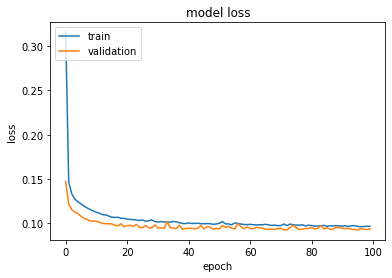

Model: "functional_329"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_110 (InputLayer)       [(None, 16)]              0         
_________________________________________________________________
dense_130 (Dense)            (None, 150)               2550      
_________________________________________________________________
dense_131 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_132 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_133 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_109 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:01:53.027116: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:01:53.027210: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:01:53.521830: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:01:53.545623: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:01:53.546040: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:01:53.547558: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_01_53
2022-03-20 18:01:53.548278: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_01_53/vw.trace.json.gz
2022-03-20 18:01:53.548419: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:01:53.549587: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

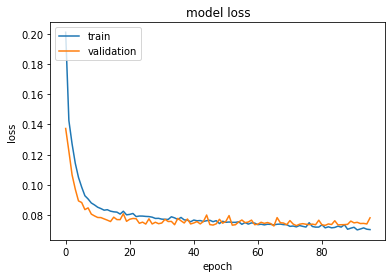

Model: "functional_333"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_111 (InputLayer)       [(None, 26)]              0         
_________________________________________________________________
dense_134 (Dense)            (None, 150)               4050      
_________________________________________________________________
dense_135 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_136 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_137 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_110 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:02:28.155744: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:02:28.155861: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:02:28.695846: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:02:28.716711: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:02:28.717059: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:02:28.718306: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_02_28
2022-03-20 18:02:28.718970: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_02_28/vw.trace.json.gz
2022-03-20 18:02:28.719068: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:02:28.719989: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

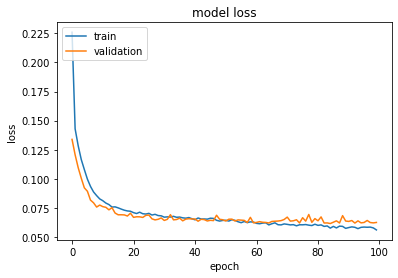

Model: "functional_337"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_112 (InputLayer)       [(None, 36)]              0         
_________________________________________________________________
dense_138 (Dense)            (None, 150)               5550      
_________________________________________________________________
dense_139 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_140 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_141 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_111 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:03:06.166340: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:03:06.166499: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:03:06.752055: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:03:06.780928: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:03:06.781265: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:03:06.782539: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_03_06
2022-03-20 18:03:06.783153: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_03_06/vw.trace.json.gz
2022-03-20 18:03:06.783249: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:03:06.784162: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

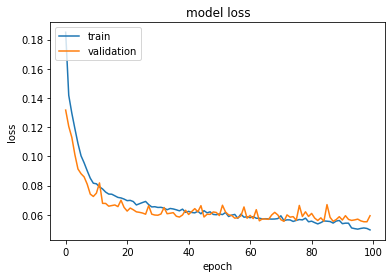

Model: "functional_341"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_113 (InputLayer)       [(None, 46)]              0         
_________________________________________________________________
dense_142 (Dense)            (None, 150)               7050      
_________________________________________________________________
dense_143 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_144 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_145 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_112 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:03:44.233301: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:03:44.233391: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:03:44.738035: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:03:44.758028: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:03:44.758339: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:03:44.759473: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_03_44
2022-03-20 18:03:44.760089: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_03_44/vw.trace.json.gz
2022-03-20 18:03:44.760172: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:03:44.761019: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

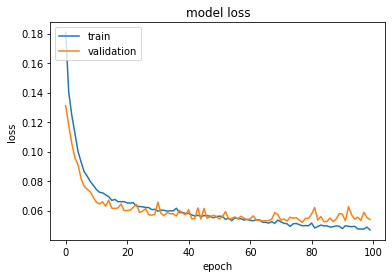

Model: "functional_345"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_114 (InputLayer)       [(None, 56)]              0         
_________________________________________________________________
dense_146 (Dense)            (None, 150)               8550      
_________________________________________________________________
dense_147 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_148 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_149 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_113 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:04:22.271091: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:04:22.271190: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:04:22.799915: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:04:22.823961: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:04:22.824365: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:04:22.825822: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_04_22
2022-03-20 18:04:22.826540: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_04_22/vw.trace.json.gz
2022-03-20 18:04:22.826669: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:04:22.827778: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

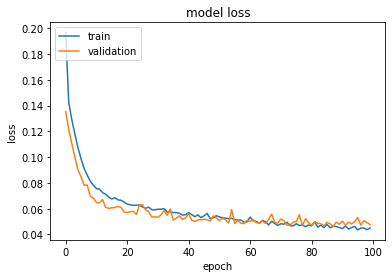

Model: "functional_349"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_115 (InputLayer)       [(None, 66)]              0         
_________________________________________________________________
dense_150 (Dense)            (None, 150)               10050     
_________________________________________________________________
dense_151 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_152 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_153 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_114 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:05:00.625928: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:05:00.626018: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:05:01.162489: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:05:01.182426: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:05:01.182746: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:05:01.183897: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_05_01
2022-03-20 18:05:01.184519: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_05_01/vw.trace.json.gz
2022-03-20 18:05:01.184601: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:05:01.185471: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

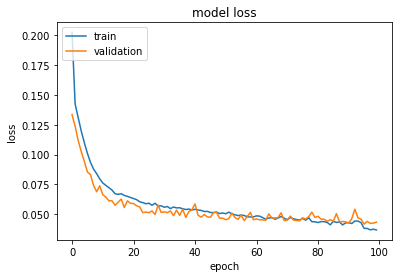

Model: "functional_353"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_116 (InputLayer)       [(None, 76)]              0         
_________________________________________________________________
dense_154 (Dense)            (None, 150)               11550     
_________________________________________________________________
dense_155 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_156 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_157 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_115 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:05:39.005188: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:05:39.005301: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:05:39.540640: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:05:39.566668: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:05:39.567130: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:05:39.568735: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_05_39
2022-03-20 18:05:39.569526: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_05_39/vw.trace.json.gz
2022-03-20 18:05:39.569695: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:05:39.570884: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

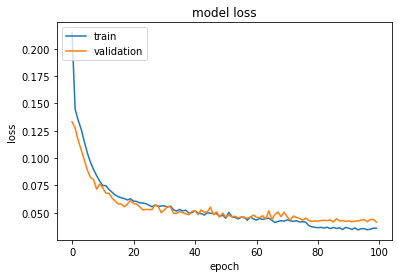

Model: "functional_357"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_117 (InputLayer)       [(None, 86)]              0         
_________________________________________________________________
dense_158 (Dense)            (None, 150)               13050     
_________________________________________________________________
dense_159 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_160 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_161 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_116 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:06:17.306733: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:06:17.306828: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:06:17.791355: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:06:17.811281: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:06:17.811606: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:06:17.812782: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_06_17
2022-03-20 18:06:17.813425: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_06_17/vw.trace.json.gz
2022-03-20 18:06:17.813518: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:06:17.814405: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

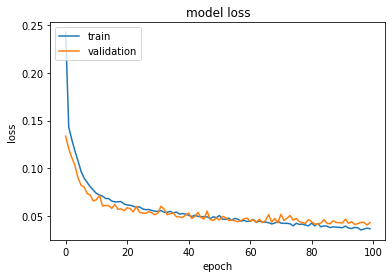

Model: "functional_361"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_118 (InputLayer)       [(None, 96)]              0         
_________________________________________________________________
dense_162 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_163 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_164 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_165 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_117 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:06:55.633587: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:06:55.633702: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:06:56.139923: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:06:56.160310: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:06:56.160623: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:06:56.161790: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_06_56
2022-03-20 18:06:56.162412: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_06_56/vw.trace.json.gz
2022-03-20 18:06:56.162495: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:06:56.163348: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

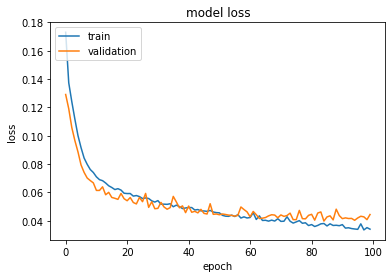

Model: "functional_365"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_119 (InputLayer)       [(None, 6)]               0         
_________________________________________________________________
dense_166 (Dense)            (None, 150)               1050      
_________________________________________________________________
dense_167 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_168 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_169 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_118 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:07:34.583377: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:07:34.583480: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:07:35.067709: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:07:35.091838: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:07:35.092246: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:07:35.093654: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_07_35
2022-03-20 18:07:35.094373: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_07_35/vw.trace.json.gz
2022-03-20 18:07:35.094490: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:07:35.095572: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

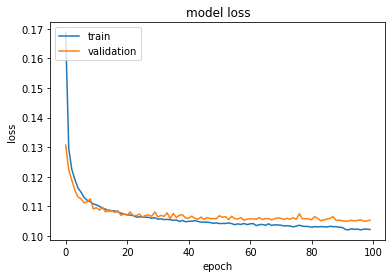

Model: "functional_369"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_120 (InputLayer)       [(None, 16)]              0         
_________________________________________________________________
dense_170 (Dense)            (None, 150)               2550      
_________________________________________________________________
dense_171 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_172 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_173 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_119 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:08:10.574211: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:08:10.574320: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:08:11.074735: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:08:11.099772: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:08:11.100151: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:08:11.101388: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_08_11
2022-03-20 18:08:11.102014: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_08_11/vw.trace.json.gz
2022-03-20 18:08:11.102133: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:08:11.103036: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

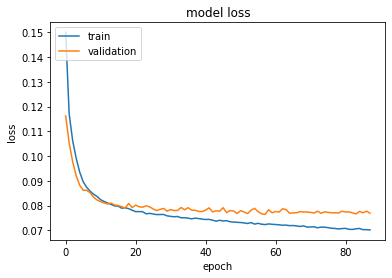

Model: "functional_373"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_121 (InputLayer)       [(None, 26)]              0         
_________________________________________________________________
dense_174 (Dense)            (None, 150)               4050      
_________________________________________________________________
dense_175 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_176 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_177 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_120 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:08:42.866503: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:08:42.866598: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:08:43.354001: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:08:43.376997: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:08:43.377389: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:08:43.378798: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_08_43
2022-03-20 18:08:43.379482: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_08_43/vw.trace.json.gz
2022-03-20 18:08:43.379607: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:08:43.380706: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

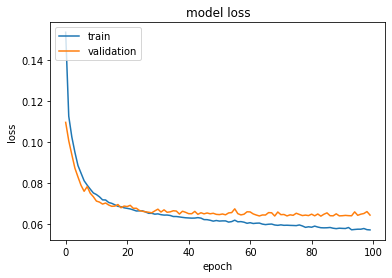

Model: "functional_377"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_122 (InputLayer)       [(None, 36)]              0         
_________________________________________________________________
dense_178 (Dense)            (None, 150)               5550      
_________________________________________________________________
dense_179 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_180 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_181 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_121 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:09:20.643560: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:09:20.643673: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:09:21.170298: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:09:21.189477: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:09:21.189798: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:09:21.190975: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_09_21
2022-03-20 18:09:21.191605: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_09_21/vw.trace.json.gz
2022-03-20 18:09:21.191688: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:09:21.192542: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

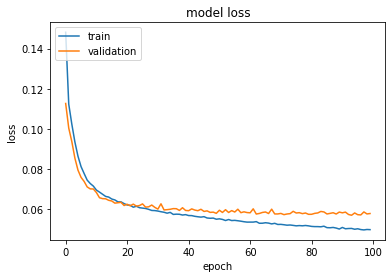

Model: "functional_381"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_123 (InputLayer)       [(None, 46)]              0         
_________________________________________________________________
dense_182 (Dense)            (None, 150)               7050      
_________________________________________________________________
dense_183 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_184 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_185 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_122 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:09:57.959587: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:09:57.959679: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:09:58.472159: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:09:58.492325: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:09:58.492639: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:09:58.493805: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_09_58
2022-03-20 18:09:58.494438: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_09_58/vw.trace.json.gz
2022-03-20 18:09:58.494521: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:09:58.495377: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

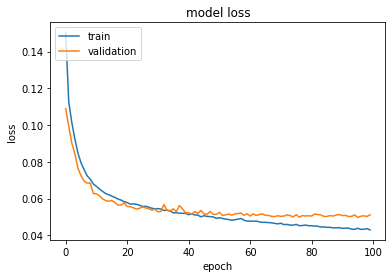

Model: "functional_385"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_124 (InputLayer)       [(None, 56)]              0         
_________________________________________________________________
dense_186 (Dense)            (None, 150)               8550      
_________________________________________________________________
dense_187 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_188 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_189 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_123 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:10:35.601118: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:10:35.601216: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:10:36.118805: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:10:36.139016: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:10:36.139344: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:10:36.140587: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_10_36
2022-03-20 18:10:36.141226: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_10_36/vw.trace.json.gz
2022-03-20 18:10:36.141327: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:10:36.142212: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

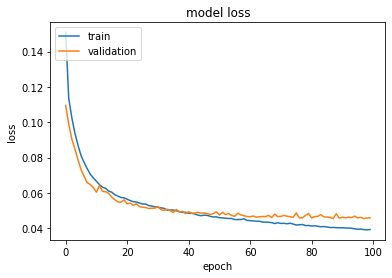

Model: "functional_389"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_125 (InputLayer)       [(None, 66)]              0         
_________________________________________________________________
dense_190 (Dense)            (None, 150)               10050     
_________________________________________________________________
dense_191 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_192 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_193 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_124 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:11:13.901638: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:11:13.901739: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:11:14.796265: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:11:14.839314: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:11:14.839825: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:11:14.841730: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_11_14
2022-03-20 18:11:14.842430: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_11_14/vw.trace.json.gz
2022-03-20 18:11:14.842617: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:11:14.844142: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

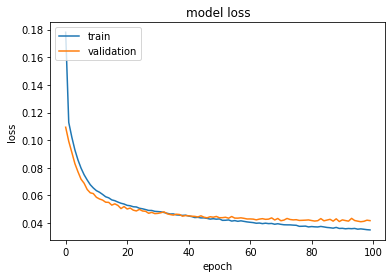

Model: "functional_393"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_126 (InputLayer)       [(None, 76)]              0         
_________________________________________________________________
dense_194 (Dense)            (None, 150)               11550     
_________________________________________________________________
dense_195 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_196 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_197 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_125 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:11:53.261588: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:11:53.261693: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:11:53.886471: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:11:53.917338: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:11:53.917673: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:11:53.918978: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_11_53
2022-03-20 18:11:53.919629: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_11_53/vw.trace.json.gz
2022-03-20 18:11:53.919734: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:11:53.920819: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

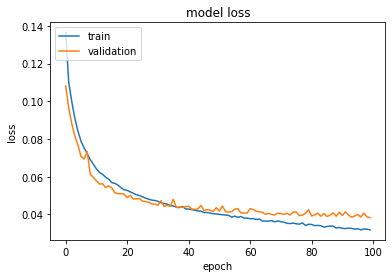

Model: "functional_397"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_127 (InputLayer)       [(None, 86)]              0         
_________________________________________________________________
dense_198 (Dense)            (None, 150)               13050     
_________________________________________________________________
dense_199 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_200 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_201 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_126 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:12:32.685934: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:12:32.686028: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:12:33.292120: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:12:33.317204: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:12:33.317535: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:12:33.318817: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_12_33
2022-03-20 18:12:33.319476: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_12_33/vw.trace.json.gz
2022-03-20 18:12:33.319613: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:12:33.320651: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

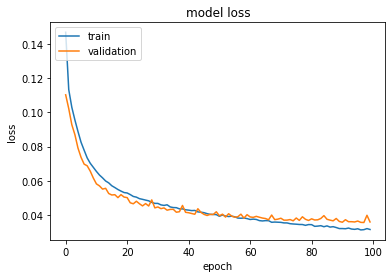

Model: "functional_401"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_128 (InputLayer)       [(None, 96)]              0         
_________________________________________________________________
dense_202 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_203 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_204 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_205 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_127 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:13:11.681350: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:13:11.681428: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:13:12.240906: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:13:12.264133: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:13:12.264468: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:13:12.265694: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_13_12
2022-03-20 18:13:12.266344: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_13_12/vw.trace.json.gz
2022-03-20 18:13:12.266439: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:13:12.267404: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

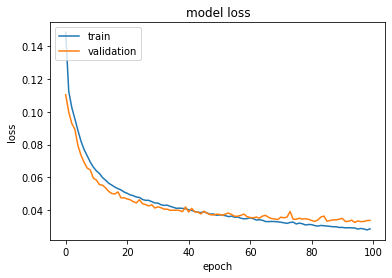

Model: "functional_405"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_129 (InputLayer)       [(None, 6)]               0         
_________________________________________________________________
dense_206 (Dense)            (None, 150)               1050      
_________________________________________________________________
dense_207 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_208 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_209 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_128 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:13:51.149780: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:13:51.149925: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:13:51.676632: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:13:51.700439: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:13:51.700775: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:13:51.702008: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_13_51
2022-03-20 18:13:51.702648: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_13_51/vw.trace.json.gz
2022-03-20 18:13:51.702743: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:13:51.703668: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

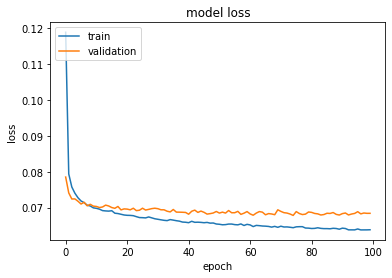

Model: "functional_409"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_130 (InputLayer)       [(None, 16)]              0         
_________________________________________________________________
dense_210 (Dense)            (None, 150)               2550      
_________________________________________________________________
dense_211 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_212 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_213 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_129 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:14:27.685595: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:14:27.685696: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:14:28.223303: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:14:28.244122: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:14:28.244456: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:14:28.245703: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_14_28
2022-03-20 18:14:28.246342: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_14_28/vw.trace.json.gz
2022-03-20 18:14:28.246434: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:14:28.247368: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

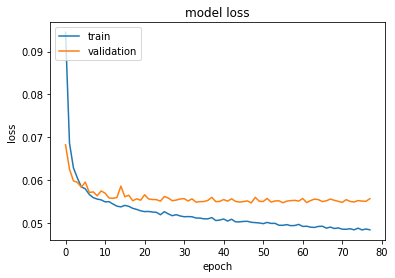

Model: "functional_413"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_131 (InputLayer)       [(None, 26)]              0         
_________________________________________________________________
dense_214 (Dense)            (None, 150)               4050      
_________________________________________________________________
dense_215 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_216 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_217 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_130 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:14:57.050795: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:14:57.050894: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:14:57.582316: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:14:57.602756: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:14:57.603078: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:14:57.604255: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_14_57
2022-03-20 18:14:57.604878: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_14_57/vw.trace.json.gz
2022-03-20 18:14:57.604963: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:14:57.605830: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

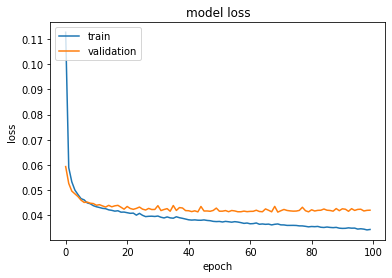

Model: "functional_417"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_132 (InputLayer)       [(None, 36)]              0         
_________________________________________________________________
dense_218 (Dense)            (None, 150)               5550      
_________________________________________________________________
dense_219 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_220 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_221 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_131 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:15:34.361665: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:15:34.361768: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:15:34.869763: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:15:34.889627: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:15:34.889949: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:15:34.891125: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_15_34
2022-03-20 18:15:34.891756: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_15_34/vw.trace.json.gz
2022-03-20 18:15:34.891841: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:15:34.892716: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

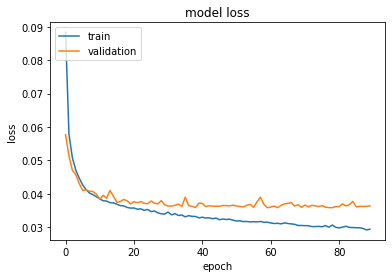

Model: "functional_421"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_133 (InputLayer)       [(None, 46)]              0         
_________________________________________________________________
dense_222 (Dense)            (None, 150)               7050      
_________________________________________________________________
dense_223 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_224 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_225 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_132 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:16:09.045393: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:16:09.045491: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:16:09.616651: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:16:09.636512: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:16:09.636834: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:16:09.638028: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_16_09
2022-03-20 18:16:09.638666: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_16_09/vw.trace.json.gz
2022-03-20 18:16:09.638759: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:16:09.639644: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

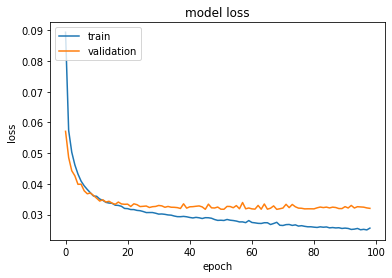

Model: "functional_425"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_134 (InputLayer)       [(None, 56)]              0         
_________________________________________________________________
dense_226 (Dense)            (None, 150)               8550      
_________________________________________________________________
dense_227 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_228 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_229 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_133 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:16:45.974485: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:16:45.974584: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:16:46.486906: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:16:46.506252: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:16:46.506576: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:16:46.507756: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_16_46
2022-03-20 18:16:46.508376: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_16_46/vw.trace.json.gz
2022-03-20 18:16:46.508476: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:16:46.509400: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

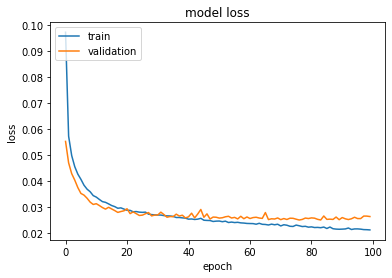

Model: "functional_429"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_135 (InputLayer)       [(None, 66)]              0         
_________________________________________________________________
dense_230 (Dense)            (None, 150)               10050     
_________________________________________________________________
dense_231 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_232 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_233 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_134 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:17:24.044616: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:17:24.044727: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:17:24.594818: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:17:24.616250: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:17:24.616569: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:17:24.617741: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_17_24
2022-03-20 18:17:24.618372: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_17_24/vw.trace.json.gz
2022-03-20 18:17:24.618455: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:17:24.619326: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

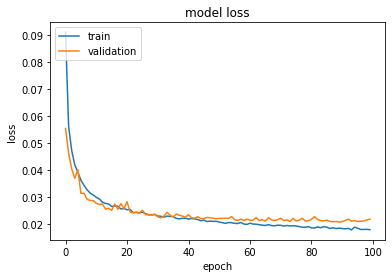

Model: "functional_433"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_136 (InputLayer)       [(None, 76)]              0         
_________________________________________________________________
dense_234 (Dense)            (None, 150)               11550     
_________________________________________________________________
dense_235 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_236 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_237 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_135 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:18:02.489764: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:18:02.489849: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:18:03.037727: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:18:03.059875: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:18:03.060260: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:18:03.061667: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_18_03
2022-03-20 18:18:03.062397: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_18_03/vw.trace.json.gz
2022-03-20 18:18:03.062547: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:18:03.063629: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

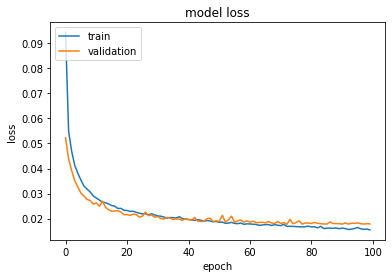

Model: "functional_437"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_137 (InputLayer)       [(None, 86)]              0         
_________________________________________________________________
dense_238 (Dense)            (None, 150)               13050     
_________________________________________________________________
dense_239 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_240 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_241 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_136 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:18:40.863082: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:18:40.863182: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:18:41.391013: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:18:41.410784: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:18:41.411097: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:18:41.412264: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_18_41
2022-03-20 18:18:41.412890: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_18_41/vw.trace.json.gz
2022-03-20 18:18:41.412985: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:18:41.413877: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

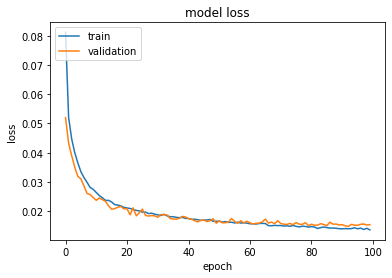

Model: "functional_441"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_138 (InputLayer)       [(None, 96)]              0         
_________________________________________________________________
dense_242 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_243 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_244 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_245 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_137 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 1)              

2022-03-20 18:19:19.159114: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:19:19.159202: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:19:19.685572: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:19:19.709469: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:19:19.709888: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:19:19.711472: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_19_19
2022-03-20 18:19:19.712203: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_19_19/vw.trace.json.gz
2022-03-20 18:19:19.712328: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:19:19.713403: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

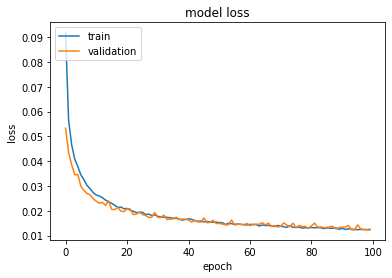

In [100]:
# define the list of parameters required to be trained and tested
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
# train
for param in params:
    # vary the input size; in this case becasue I know the max input size is 96
    for i in np.arange(start=6, stop=97, step=10):
        # specify the param to be trained and the size of the input
        train_cmd = "--train_subjects s01_still --model fc1d --layer 4 --train --label_type " + param[0] + " --DWI " + str(i)
        # for each training, plot the corresponding loss graph
        plot_loss(train_cmd)

In [101]:
# define the list of parameters required to be trained and tested
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
# test
for param in params:
    # vary the input size; in this case becasue I know the max input size is 96
    for i in np.arange(start=6, stop=97, step=10):
        # specify the param to be tested and the size of the test data
        print(i)
        test_cmd = "--test_subjects s02_still --model fc1d --layer 4 --label_type " + param[0] + " --DWI " + str(i)
        args = model_parser().parse_args(test_cmd.split())
        # test the trained model
        test_model(args) 

6
6-fc1d-patch_1-base_1-layer_4-label_NDI
(84, 50, 6)
Model: "functional_445"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_139 (InputLayer)       [(None, 6)]               0         
_________________________________________________________________
dense_246 (Dense)            (None, 150)               1050      
_________________________________________________________________
dense_247 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_248 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_249 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_138 (Dropout)        (None, 150)               0         
________________________________________________________________

/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


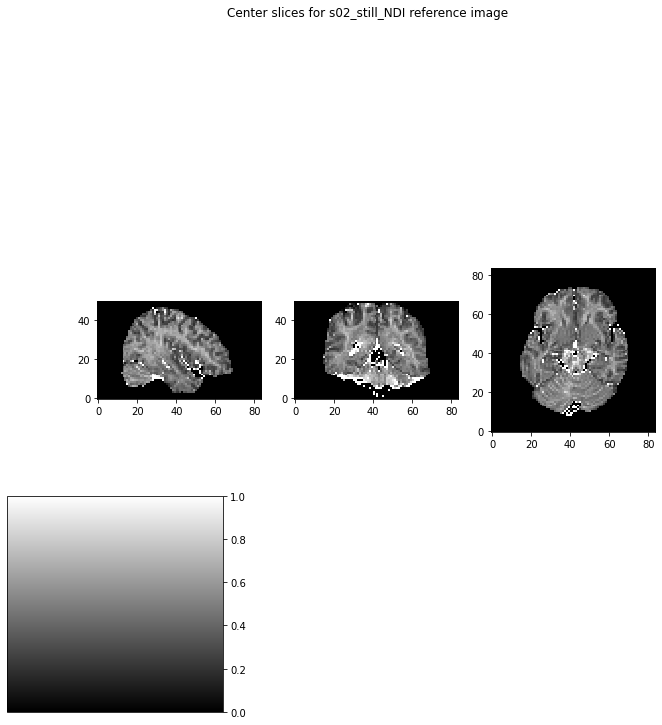

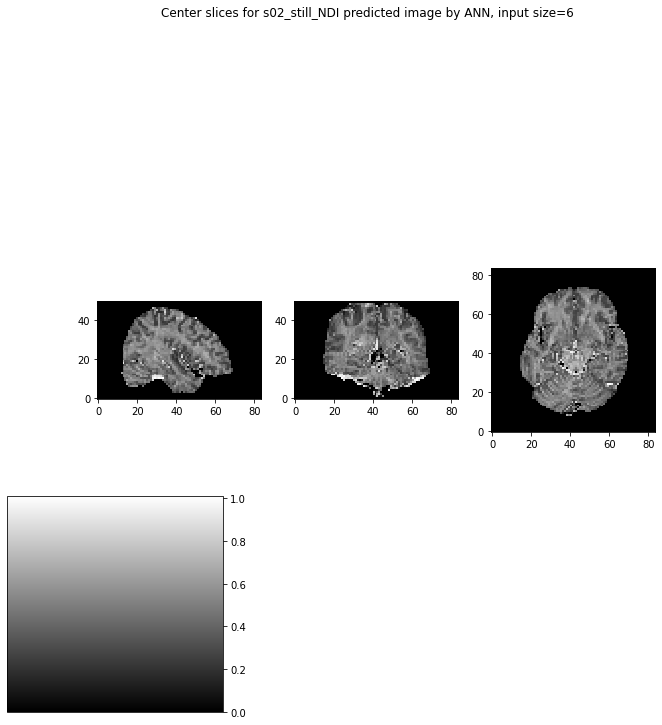

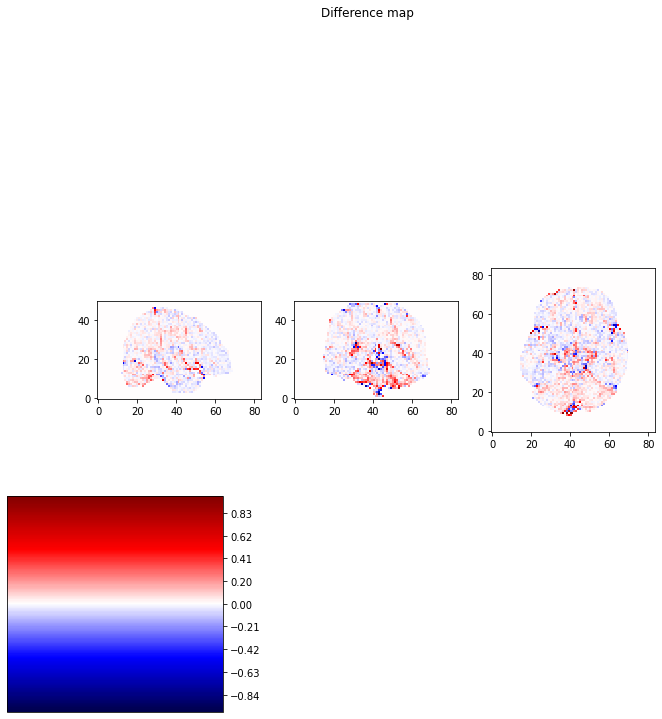

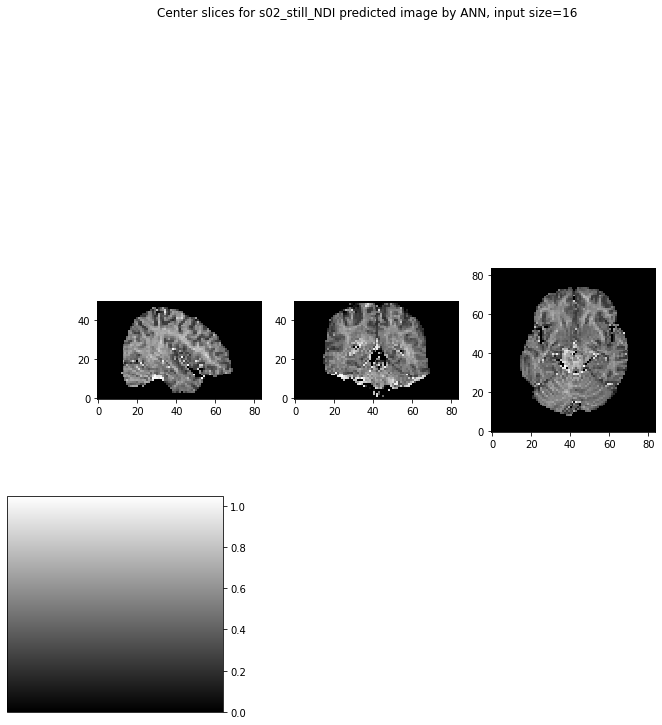

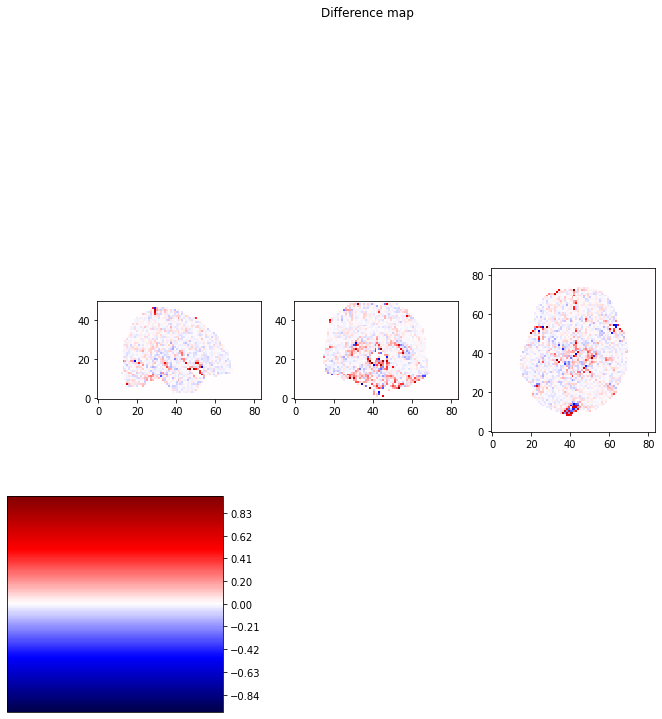

...

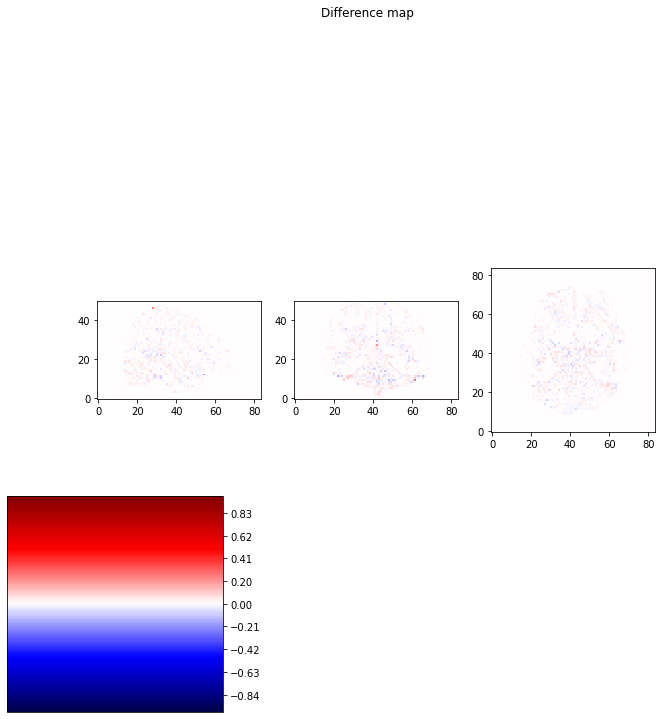

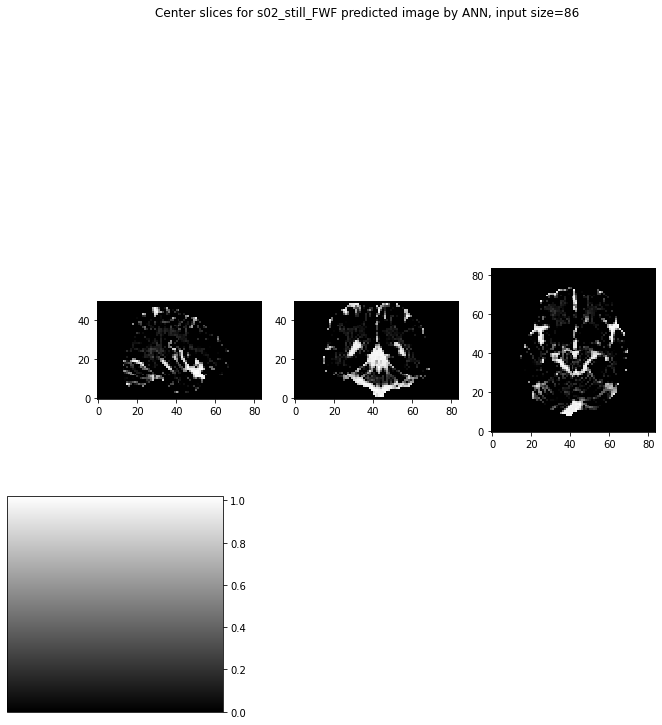

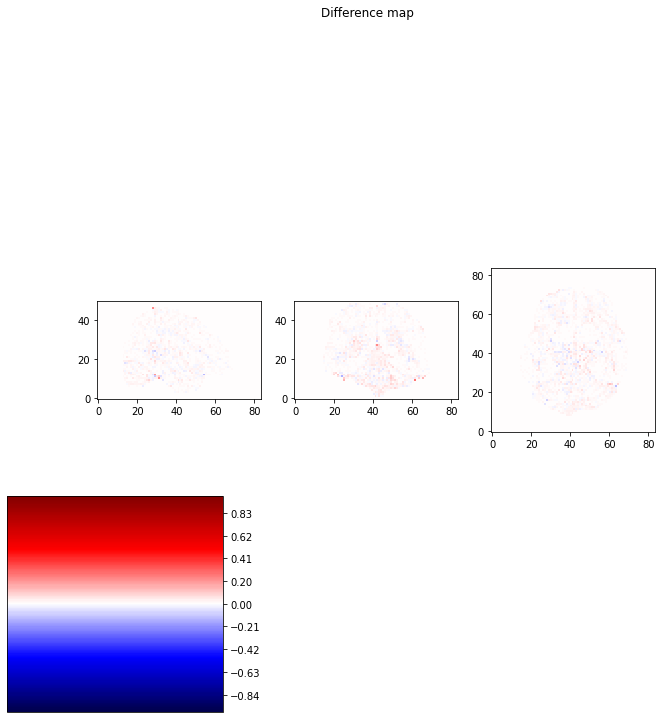

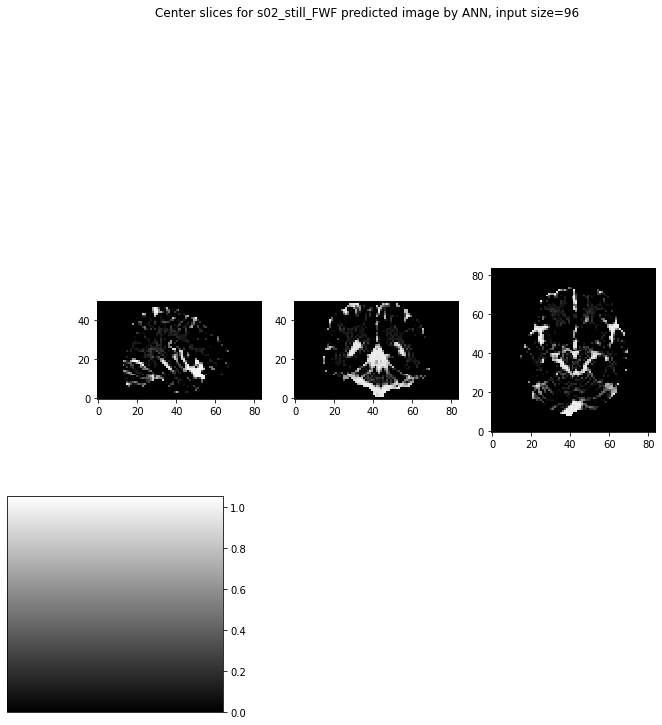

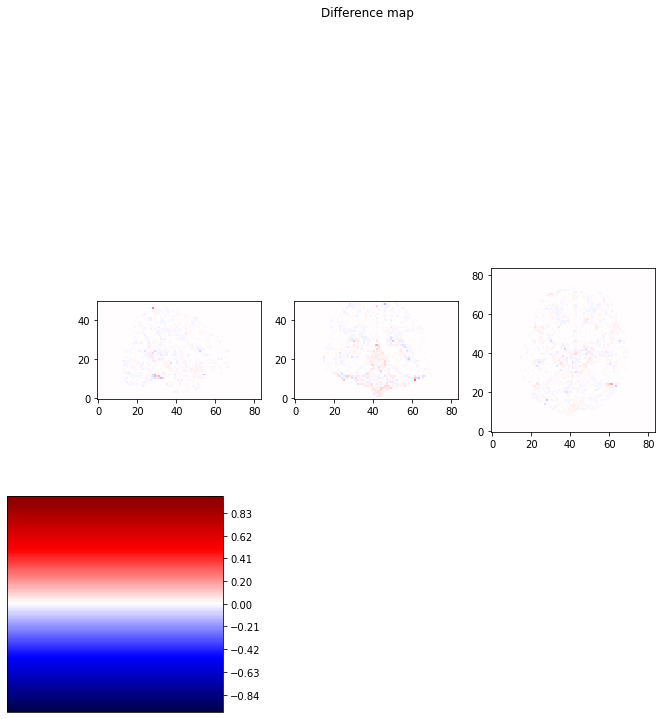

In [102]:
# plot each derived image
# specify the parameters
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
ref_img = [s02_NDI_img_data, s02_ODI_img_data, s02_FWF_img_data] # this is the ref img list
# iterate, so plot each param in order
for i in range (len(params)):
    # plot the reference img first
    ref_slice_0 = ref_img[i][26, :, :]
    ref_slice_1 = ref_img[i][:, 30, :]
    ref_slice_2 = ref_img[i][:, :, 16]
    show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
    plt.suptitle("Center slices for s02_still_" + params[i] + " reference image")
    
    for j in np.arange(start=6, stop=97, step=10):
        # plot the predicted imgs for different input size
        pred_path = '../Net/nii/s02_still-' + str(j)+'-fc1d-patch_1-base_1-layer_4-label_'+params[i]+'.nii'
        # load the img
        pred_img = nib.load(pred_path)
        # fetch the data
        pred_data = pred_img.get_fdata()

        # plot the pred img
        pred0 = pred_data[26, :, :]
        pred1 = pred_data[:, 30, :]
        pred2 = pred_data[:, :, 16]
        show_slices([pred0, pred1, pred2])
        plt.suptitle("Center slices for s02_still_" + params[i] + " predicted image by ANN, input size="+str(j))

        # plot the difference img
        diff0 = ref_slice_0 - pred0
        diff1 = ref_slice_1 - pred1
        diff2 = ref_slice_2 - pred2
        show_slices([diff0, diff1, diff2], grayscale=False)
        plt.suptitle('Difference map')

5 Layer


Model: "functional_505"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_169 (InputLayer)       [(None, 6)]               0         
_________________________________________________________________
dense_366 (Dense)            (None, 150)               1050      
_________________________________________________________________
dense_367 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_368 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_369 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_370 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_168 (Dropout)        (None, 150)            

2022-03-20 18:20:41.392393: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:20:41.392495: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:20:42.008576: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.


2022-03-20 18:20:42.288201: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:20:42.292718: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:20:42.294436: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_20_42
2022-03-20 18:20:42.295037: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_20_42/vw.trace.json.gz
2022-03-20 18:20:42.295184: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:20:42.296493: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_20_42
2022-03-20 18:20:42.296549: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped 

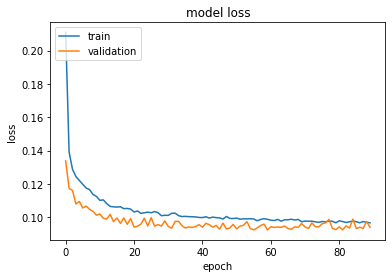

Model: "functional_509"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_170 (InputLayer)       [(None, 16)]              0         
_________________________________________________________________
dense_371 (Dense)            (None, 150)               2550      
_________________________________________________________________
dense_372 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_373 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_374 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_375 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_169 (Dropout)        (None, 150)            

2022-03-20 18:21:19.788756: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:21:19.788847: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:21:20.516173: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:21:20.549094: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:21:20.549583: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:21:20.551415: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_21_20
2022-03-20 18:21:20.552105: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_21_20/vw.trace.json.gz
2022-03-20 18:21:20.552289: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:21:20.553544: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

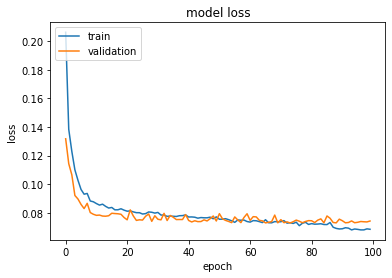

Model: "functional_513"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_171 (InputLayer)       [(None, 26)]              0         
_________________________________________________________________
dense_376 (Dense)            (None, 150)               4050      
_________________________________________________________________
dense_377 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_378 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_379 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_380 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_170 (Dropout)        (None, 150)            

2022-03-20 18:22:02.187897: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:22:02.187990: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:22:02.832954: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:22:02.861197: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:22:02.861579: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:22:02.863008: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_22_02
2022-03-20 18:22:02.863707: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_22_02/vw.trace.json.gz
2022-03-20 18:22:02.863852: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:22:02.864958: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

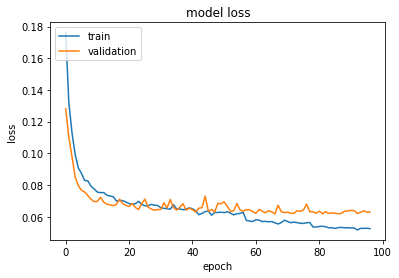

Model: "functional_517"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_172 (InputLayer)       [(None, 36)]              0         
_________________________________________________________________
dense_381 (Dense)            (None, 150)               5550      
_________________________________________________________________
dense_382 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_383 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_384 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_385 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_171 (Dropout)        (None, 150)            

2022-03-20 18:22:44.050478: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:22:44.050577: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:22:44.643696: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:22:44.666995: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:22:44.667356: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:22:44.668636: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_22_44
2022-03-20 18:22:44.669327: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_22_44/vw.trace.json.gz
2022-03-20 18:22:44.669430: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:22:44.670376: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

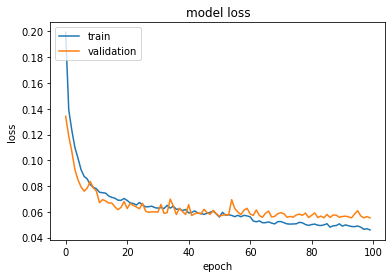

Model: "functional_521"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_173 (InputLayer)       [(None, 46)]              0         
_________________________________________________________________
dense_386 (Dense)            (None, 150)               7050      
_________________________________________________________________
dense_387 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_388 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_389 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_390 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_172 (Dropout)        (None, 150)            

2022-03-20 18:23:26.919053: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:23:26.919151: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:23:27.561855: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:23:27.582572: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:23:27.582939: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:23:27.584255: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_23_27
2022-03-20 18:23:27.584922: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_23_27/vw.trace.json.gz
2022-03-20 18:23:27.585009: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:23:27.585984: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

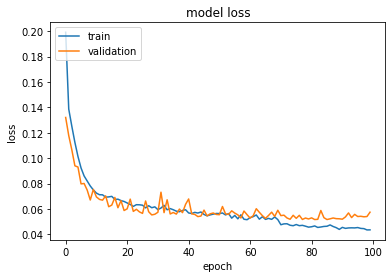

Model: "functional_525"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_174 (InputLayer)       [(None, 56)]              0         
_________________________________________________________________
dense_391 (Dense)            (None, 150)               8550      
_________________________________________________________________
dense_392 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_393 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_394 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_395 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_173 (Dropout)        (None, 150)            

2022-03-20 18:24:09.967924: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:24:09.968010: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:24:10.549217: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:24:10.571421: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:24:10.571751: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:24:10.572951: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_24_10
2022-03-20 18:24:10.573624: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_24_10/vw.trace.json.gz
2022-03-20 18:24:10.573713: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:24:10.574645: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

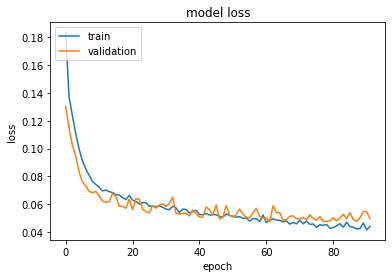

Model: "functional_529"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_175 (InputLayer)       [(None, 66)]              0         
_________________________________________________________________
dense_396 (Dense)            (None, 150)               10050     
_________________________________________________________________
dense_397 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_398 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_399 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_400 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_174 (Dropout)        (None, 150)            

2022-03-20 18:24:50.110984: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:24:50.111078: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:24:50.716974: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:24:50.737904: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:24:50.738252: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:24:50.739945: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_24_50
2022-03-20 18:24:50.740635: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_24_50/vw.trace.json.gz
2022-03-20 18:24:50.740750: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:24:50.741701: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

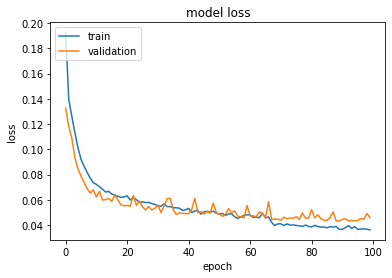

Model: "functional_533"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_176 (InputLayer)       [(None, 76)]              0         
_________________________________________________________________
dense_401 (Dense)            (None, 150)               11550     
_________________________________________________________________
dense_402 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_403 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_404 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_405 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_175 (Dropout)        (None, 150)            

2022-03-20 18:25:34.754887: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:25:34.754990: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:25:35.393332: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:25:35.414354: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:25:35.414695: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:25:35.415896: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_25_35
2022-03-20 18:25:35.416557: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_25_35/vw.trace.json.gz
2022-03-20 18:25:35.416644: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:25:35.417536: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

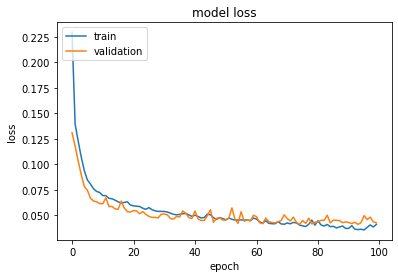

Model: "functional_537"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_177 (InputLayer)       [(None, 86)]              0         
_________________________________________________________________
dense_406 (Dense)            (None, 150)               13050     
_________________________________________________________________
dense_407 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_408 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_409 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_410 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_176 (Dropout)        (None, 150)            

2022-03-20 18:26:18.534203: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:26:18.534291: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:26:19.137686: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:26:19.158599: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:26:19.158933: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:26:19.160135: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_26_19
2022-03-20 18:26:19.160804: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_26_19/vw.trace.json.gz
2022-03-20 18:26:19.160889: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:26:19.161797: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

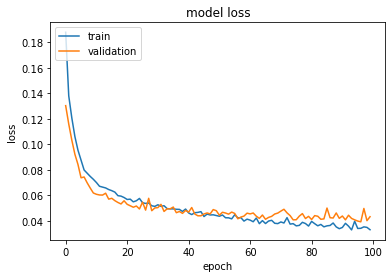

Model: "functional_541"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_178 (InputLayer)       [(None, 96)]              0         
_________________________________________________________________
dense_411 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_412 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_413 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_414 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_415 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_177 (Dropout)        (None, 150)            

2022-03-20 18:27:02.473946: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:27:02.474050: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:27:03.095997: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:27:03.117054: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:27:03.117405: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:27:03.118691: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_27_03
2022-03-20 18:27:03.119373: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_27_03/vw.trace.json.gz
2022-03-20 18:27:03.119487: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:27:03.120422: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

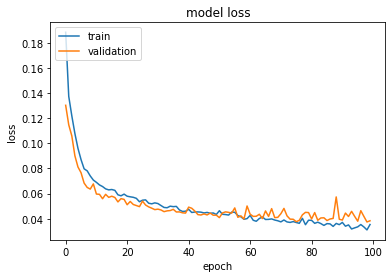

Model: "functional_545"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_179 (InputLayer)       [(None, 6)]               0         
_________________________________________________________________
dense_416 (Dense)            (None, 150)               1050      
_________________________________________________________________
dense_417 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_418 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_419 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_420 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_178 (Dropout)        (None, 150)            

2022-03-20 18:27:46.735362: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:27:46.735452: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:27:47.348426: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:27:47.372704: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:27:47.373103: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:27:47.374568: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_27_47
2022-03-20 18:27:47.375302: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_27_47/vw.trace.json.gz
2022-03-20 18:27:47.375401: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:27:47.376472: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

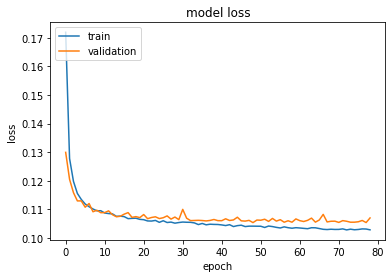

Model: "functional_549"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_180 (InputLayer)       [(None, 16)]              0         
_________________________________________________________________
dense_421 (Dense)            (None, 150)               2550      
_________________________________________________________________
dense_422 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_423 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_424 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_425 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_179 (Dropout)        (None, 150)            

2022-03-20 18:28:19.863184: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:28:19.863294: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:28:20.503992: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:28:20.525513: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:28:20.525901: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:28:20.527341: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_28_20
2022-03-20 18:28:20.528075: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_28_20/vw.trace.json.gz
2022-03-20 18:28:20.528170: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:28:20.529234: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

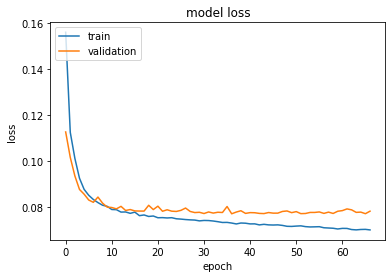

Model: "functional_553"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_181 (InputLayer)       [(None, 26)]              0         
_________________________________________________________________
dense_426 (Dense)            (None, 150)               4050      
_________________________________________________________________
dense_427 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_428 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_429 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_430 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_180 (Dropout)        (None, 150)            

2022-03-20 18:28:48.856095: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:28:48.856185: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:28:49.461556: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:28:49.483388: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:28:49.483730: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:28:49.484967: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_28_49
2022-03-20 18:28:49.485638: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_28_49/vw.trace.json.gz
2022-03-20 18:28:49.485728: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:28:49.486641: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

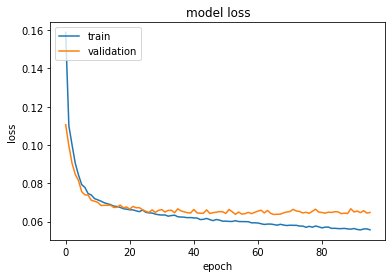

Model: "functional_557"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_182 (InputLayer)       [(None, 36)]              0         
_________________________________________________________________
dense_431 (Dense)            (None, 150)               5550      
_________________________________________________________________
dense_432 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_433 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_434 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_435 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_181 (Dropout)        (None, 150)            

2022-03-20 18:29:30.588112: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:29:30.588204: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:29:31.523354: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:29:31.569323: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:29:31.569824: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:29:31.571648: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_29_31
2022-03-20 18:29:31.572357: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_29_31/vw.trace.json.gz
2022-03-20 18:29:31.572567: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:29:31.573864: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

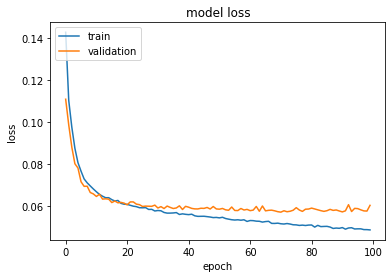

Model: "functional_561"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_183 (InputLayer)       [(None, 46)]              0         
_________________________________________________________________
dense_436 (Dense)            (None, 150)               7050      
_________________________________________________________________
dense_437 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_438 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_439 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_440 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_182 (Dropout)        (None, 150)            

2022-03-20 18:30:14.951274: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:30:14.951363: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:30:15.777266: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:30:15.813979: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:30:15.814588: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:30:15.816609: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_30_15
2022-03-20 18:30:15.817387: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_30_15/vw.trace.json.gz
2022-03-20 18:30:15.817538: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:30:15.818938: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

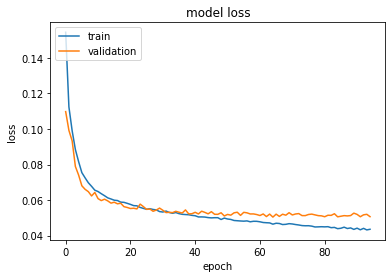

Model: "functional_565"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_184 (InputLayer)       [(None, 56)]              0         
_________________________________________________________________
dense_441 (Dense)            (None, 150)               8550      
_________________________________________________________________
dense_442 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_443 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_444 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_445 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_183 (Dropout)        (None, 150)            

2022-03-20 18:30:56.864031: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:30:56.864136: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:30:57.576001: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:30:57.606416: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:30:57.606771: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:30:57.608187: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_30_57
2022-03-20 18:30:57.608862: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_30_57/vw.trace.json.gz
2022-03-20 18:30:57.608994: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:30:57.610118: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

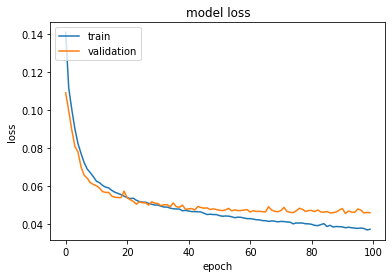

Model: "functional_569"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_185 (InputLayer)       [(None, 66)]              0         
_________________________________________________________________
dense_446 (Dense)            (None, 150)               10050     
_________________________________________________________________
dense_447 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_448 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_449 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_450 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_184 (Dropout)        (None, 150)            

2022-03-20 18:31:41.236849: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:31:41.236951: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:31:41.948366: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:31:41.979262: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:31:41.979705: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:31:41.981245: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_31_41
2022-03-20 18:31:41.981954: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_31_41/vw.trace.json.gz
2022-03-20 18:31:41.982089: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:31:41.983225: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

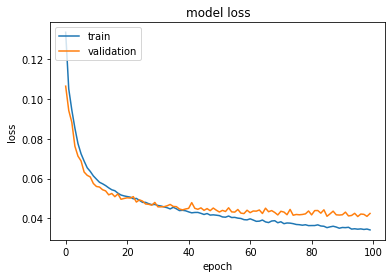

Model: "functional_573"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_186 (InputLayer)       [(None, 76)]              0         
_________________________________________________________________
dense_451 (Dense)            (None, 150)               11550     
_________________________________________________________________
dense_452 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_453 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_454 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_455 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_185 (Dropout)        (None, 150)            

2022-03-20 18:32:25.802511: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:32:25.802626: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:32:26.509745: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:32:26.535589: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:32:26.535927: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:32:26.537201: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_32_26
2022-03-20 18:32:26.537877: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_32_26/vw.trace.json.gz
2022-03-20 18:32:26.537997: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:32:26.539255: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

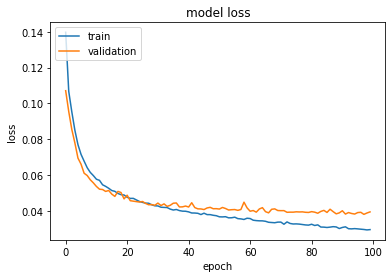

Model: "functional_577"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_187 (InputLayer)       [(None, 86)]              0         
_________________________________________________________________
dense_456 (Dense)            (None, 150)               13050     
_________________________________________________________________
dense_457 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_458 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_459 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_460 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_186 (Dropout)        (None, 150)            

2022-03-20 18:33:10.165004: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:33:10.165126: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:33:10.819005: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:33:10.841873: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:33:10.842220: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:33:10.843508: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_33_10
2022-03-20 18:33:10.844180: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_33_10/vw.trace.json.gz
2022-03-20 18:33:10.844281: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:33:10.845330: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

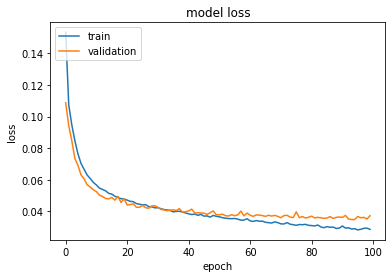

Model: "functional_581"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_188 (InputLayer)       [(None, 96)]              0         
_________________________________________________________________
dense_461 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_462 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_463 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_464 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_465 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_187 (Dropout)        (None, 150)            

2022-03-20 18:33:54.723920: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:33:54.724007: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:33:55.398008: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:33:55.420409: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:33:55.420744: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:33:55.422005: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_33_55
2022-03-20 18:33:55.422674: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_33_55/vw.trace.json.gz
2022-03-20 18:33:55.422781: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:33:55.423783: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

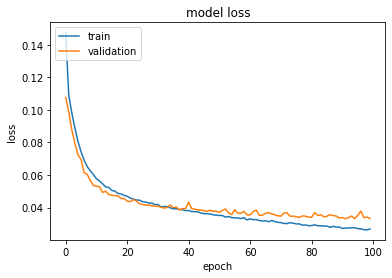

Model: "functional_585"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_189 (InputLayer)       [(None, 6)]               0         
_________________________________________________________________
dense_466 (Dense)            (None, 150)               1050      
_________________________________________________________________
dense_467 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_468 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_469 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_470 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_188 (Dropout)        (None, 150)            

2022-03-20 18:34:39.503719: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:34:39.503806: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:34:40.121891: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:34:40.146725: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:34:40.147135: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:34:40.148680: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_34_40
2022-03-20 18:34:40.149452: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_34_40/vw.trace.json.gz
2022-03-20 18:34:40.149640: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:34:40.150858: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

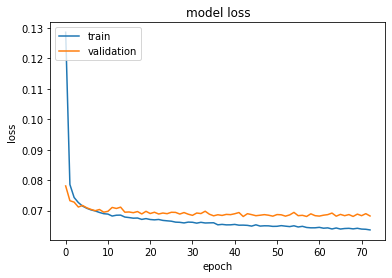

Model: "functional_589"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_190 (InputLayer)       [(None, 16)]              0         
_________________________________________________________________
dense_471 (Dense)            (None, 150)               2550      
_________________________________________________________________
dense_472 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_473 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_474 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_475 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_189 (Dropout)        (None, 150)            

2022-03-20 18:35:10.927505: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:35:10.927637: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:35:11.551321: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:35:11.573265: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:35:11.573605: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:35:11.574871: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_35_11
2022-03-20 18:35:11.575565: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_35_11/vw.trace.json.gz
2022-03-20 18:35:11.575670: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:35:11.576642: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

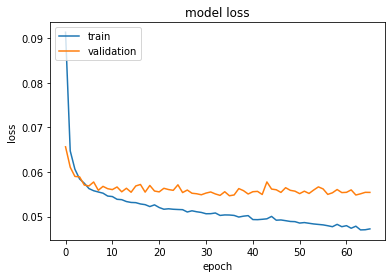

Model: "functional_593"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_191 (InputLayer)       [(None, 26)]              0         
_________________________________________________________________
dense_476 (Dense)            (None, 150)               4050      
_________________________________________________________________
dense_477 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_478 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_479 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_480 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_190 (Dropout)        (None, 150)            

2022-03-20 18:35:41.068919: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:35:41.069005: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:35:41.752995: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:35:41.775014: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:35:41.775350: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:35:41.776568: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_35_41
2022-03-20 18:35:41.777218: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_35_41/vw.trace.json.gz
2022-03-20 18:35:41.777308: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:35:41.778227: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

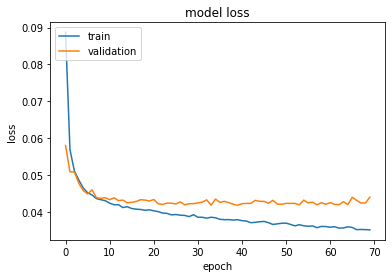

Model: "functional_597"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_192 (InputLayer)       [(None, 36)]              0         
_________________________________________________________________
dense_481 (Dense)            (None, 150)               5550      
_________________________________________________________________
dense_482 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_483 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_484 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_485 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_191 (Dropout)        (None, 150)            

2022-03-20 18:36:11.726552: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:36:11.726635: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:36:12.271621: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:36:12.289819: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:36:12.290128: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:36:12.291249: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_36_12
2022-03-20 18:36:12.291847: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_36_12/vw.trace.json.gz
2022-03-20 18:36:12.291924: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:36:12.292762: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

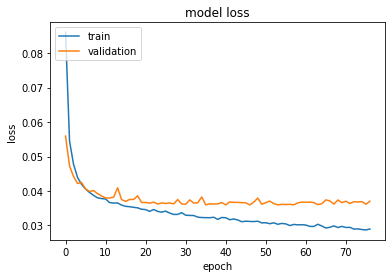

Model: "functional_601"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_193 (InputLayer)       [(None, 46)]              0         
_________________________________________________________________
dense_486 (Dense)            (None, 150)               7050      
_________________________________________________________________
dense_487 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_488 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_489 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_490 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_192 (Dropout)        (None, 150)            

2022-03-20 18:36:45.240832: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:36:45.240929: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:36:45.885529: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:36:45.907153: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:36:45.907485: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:36:45.908699: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_36_45
2022-03-20 18:36:45.909366: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_36_45/vw.trace.json.gz
2022-03-20 18:36:45.909454: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:36:45.910710: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

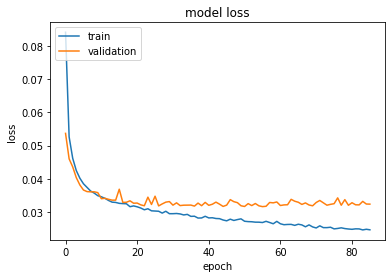

Model: "functional_605"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_194 (InputLayer)       [(None, 56)]              0         
_________________________________________________________________
dense_491 (Dense)            (None, 150)               8550      
_________________________________________________________________
dense_492 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_493 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_494 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_495 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_193 (Dropout)        (None, 150)            

2022-03-20 18:37:22.561370: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:37:22.561467: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:37:23.238579: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:37:23.263235: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:37:23.263629: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:37:23.265023: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_37_23
2022-03-20 18:37:23.265726: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_37_23/vw.trace.json.gz
2022-03-20 18:37:23.265845: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:37:23.266900: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

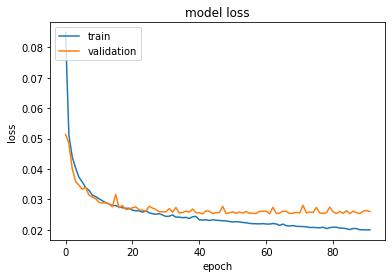

Model: "functional_609"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_195 (InputLayer)       [(None, 66)]              0         
_________________________________________________________________
dense_496 (Dense)            (None, 150)               10050     
_________________________________________________________________
dense_497 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_498 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_499 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_500 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_194 (Dropout)        (None, 150)            

2022-03-20 18:38:02.965204: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:38:02.965314: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:38:03.626433: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:38:03.647346: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:38:03.647667: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:38:03.648857: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_38_03
2022-03-20 18:38:03.649491: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_38_03/vw.trace.json.gz
2022-03-20 18:38:03.649577: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:38:03.650474: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

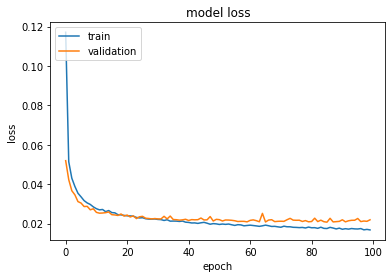

Model: "functional_613"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_196 (InputLayer)       [(None, 76)]              0         
_________________________________________________________________
dense_501 (Dense)            (None, 150)               11550     
_________________________________________________________________
dense_502 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_503 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_504 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_505 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_195 (Dropout)        (None, 150)            

2022-03-20 18:38:46.865618: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:38:46.865733: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:38:48.003528: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:38:48.054260: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:38:48.056850: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:38:48.058859: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_38_48
2022-03-20 18:38:48.059520: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_38_48/vw.trace.json.gz
2022-03-20 18:38:48.059756: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:38:48.061448: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

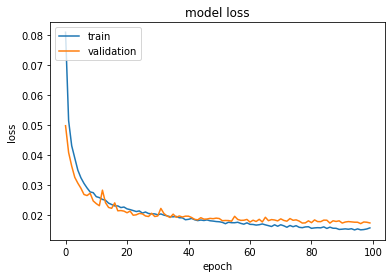

Model: "functional_617"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_197 (InputLayer)       [(None, 86)]              0         
_________________________________________________________________
dense_506 (Dense)            (None, 150)               13050     
_________________________________________________________________
dense_507 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_508 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_509 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_510 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_196 (Dropout)        (None, 150)            

2022-03-20 18:39:32.374658: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:39:32.374747: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:39:33.277750: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:39:33.325059: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:39:33.325553: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:39:33.327608: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_39_33
2022-03-20 18:39:33.328351: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_39_33/vw.trace.json.gz
2022-03-20 18:39:33.328613: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:39:33.330247: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

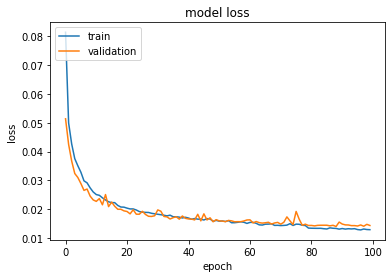

Model: "functional_621"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_198 (InputLayer)       [(None, 96)]              0         
_________________________________________________________________
dense_511 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_512 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_513 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_514 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_515 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_197 (Dropout)        (None, 150)            

2022-03-20 18:40:17.706803: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:40:17.706899: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:40:18.543868: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:40:18.584924: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:40:18.585374: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:40:18.587294: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_40_18
2022-03-20 18:40:18.588069: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_40_18/vw.trace.json.gz
2022-03-20 18:40:18.588253: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:40:18.589709: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

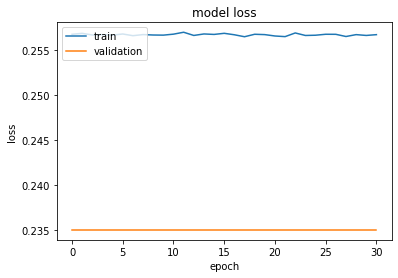

In [103]:
# define the list of parameters required to be trained and tested
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
# train
for param in params:
    # vary the input size; in this case becasue I know the max input size is 96
    for i in np.arange(start=6, stop=97, step=10):
        # specify the param to be trained and the size of the input
        train_cmd = "--train_subjects s01_still --model fc1d --layer 5 --train --label_type " + param[0] + " --DWI " + str(i)
        # for each training, plot the corresponding loss graph
        plot_loss(train_cmd)

In [104]:
# define the list of parameters required to be trained and tested
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
# test
for param in params:
    # vary the input size; in this case becasue I know the max input size is 96
    for i in np.arange(start=6, stop=97, step=10):
        # specify the param to be tested and the size of the test data
        print(i)
        test_cmd = "--test_subjects s02_still --model fc1d --layer 5 --label_type " + param[0] + " --DWI " + str(i)
        args = model_parser().parse_args(test_cmd.split())
        # test the trained model
        test_model(args) 

6
6-fc1d-patch_1-base_1-layer_5-label_NDI
(84, 50, 6)
Model: "functional_625"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_199 (InputLayer)       [(None, 6)]               0         
_________________________________________________________________
dense_516 (Dense)            (None, 150)               1050      
_________________________________________________________________
dense_517 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_518 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_519 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_520 (Dense)            (None, 150)               22650     
________________________________________________________________

2D CNN<br/>
repeat exactly the same process as above, but change the network to 2D CNN

Model: "functional_685"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_229 (InputLayer)       [(None, 3, 3, 6)]         0         
_________________________________________________________________
conv2d_162 (Conv2D)          (None, 1, 1, 150)         8250      
_________________________________________________________________
conv2d_163 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_164 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_165 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_228 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_166 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:41:03.004607: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:41:03.004700: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:41:03.611568: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.


2022-03-20 18:41:03.928626: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:41:03.931736: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:41:03.933590: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_41_03
2022-03-20 18:41:03.934205: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_41_03/vw.trace.json.gz
2022-03-20 18:41:03.934425: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:41:03.935787: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_41_03
2022-03-20 18:41:03.935858: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped 

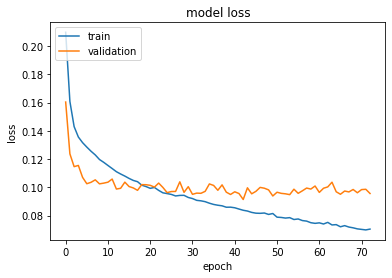

Model: "functional_689"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_230 (InputLayer)       [(None, 3, 3, 16)]        0         
_________________________________________________________________
conv2d_167 (Conv2D)          (None, 1, 1, 150)         21750     
_________________________________________________________________
conv2d_168 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_169 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_170 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_229 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_171 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:41:44.580805: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:41:44.580900: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:41:45.384803: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:41:45.415437: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:41:45.415811: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:41:45.417424: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_41_45
2022-03-20 18:41:45.418076: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_41_45/vw.trace.json.gz
2022-03-20 18:41:45.418230: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:41:45.419331: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

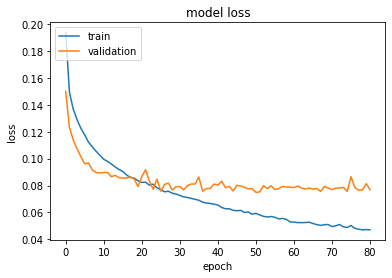

Model: "functional_693"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_231 (InputLayer)       [(None, 3, 3, 26)]        0         
_________________________________________________________________
conv2d_172 (Conv2D)          (None, 1, 1, 150)         35250     
_________________________________________________________________
conv2d_173 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_174 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_175 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_230 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_176 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:42:31.782247: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:42:31.782339: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:42:32.482456: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:42:32.510070: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:42:32.510405: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:42:32.511635: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_42_32
2022-03-20 18:42:32.512283: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_42_32/vw.trace.json.gz
2022-03-20 18:42:32.512378: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:42:32.513289: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

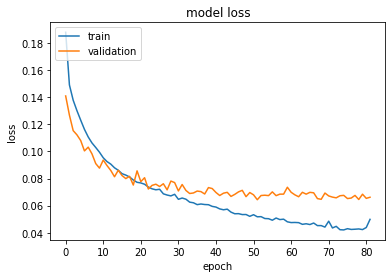

Model: "functional_697"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_232 (InputLayer)       [(None, 3, 3, 36)]        0         
_________________________________________________________________
conv2d_177 (Conv2D)          (None, 1, 1, 150)         48750     
_________________________________________________________________
conv2d_178 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_179 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_180 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_231 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_181 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:43:20.707285: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:43:20.707384: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:43:21.473744: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:43:21.496354: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:43:21.496684: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:43:21.497841: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_43_21
2022-03-20 18:43:21.498475: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_43_21/vw.trace.json.gz
2022-03-20 18:43:21.498556: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:43:21.499444: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

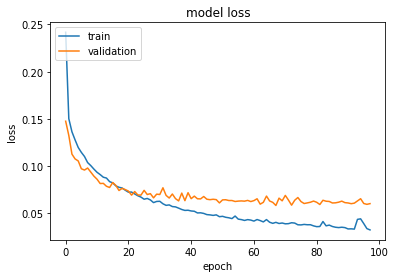

Model: "functional_701"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_233 (InputLayer)       [(None, 3, 3, 46)]        0         
_________________________________________________________________
conv2d_182 (Conv2D)          (None, 1, 1, 150)         62250     
_________________________________________________________________
conv2d_183 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_184 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_185 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_232 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_186 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:44:20.636459: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:44:20.636563: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:44:21.414042: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:44:21.438215: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:44:21.438545: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:44:21.440025: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_44_21
2022-03-20 18:44:21.440771: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_44_21/vw.trace.json.gz
2022-03-20 18:44:21.440888: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:44:21.441981: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

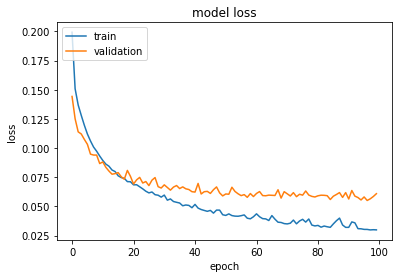

Model: "functional_705"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_234 (InputLayer)       [(None, 3, 3, 56)]        0         
_________________________________________________________________
conv2d_187 (Conv2D)          (None, 1, 1, 150)         75750     
_________________________________________________________________
conv2d_188 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_189 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_190 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_233 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_191 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:45:24.247379: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:45:24.247474: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:45:25.590067: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:45:25.672527: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:45:25.676763: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:45:25.680106: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_45_25
2022-03-20 18:45:25.681014: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_45_25/vw.trace.json.gz
2022-03-20 18:45:25.681614: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:45:25.684158: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

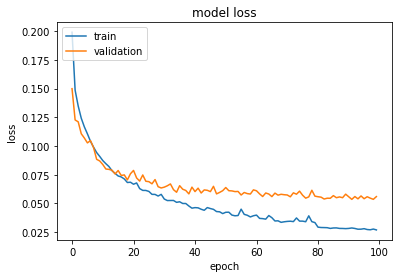

Model: "functional_709"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_235 (InputLayer)       [(None, 3, 3, 66)]        0         
_________________________________________________________________
conv2d_192 (Conv2D)          (None, 1, 1, 150)         89250     
_________________________________________________________________
conv2d_193 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_194 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_195 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_234 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_196 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:46:31.822810: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:46:31.822905: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:46:32.973999: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:46:33.020101: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:46:33.020557: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:46:33.022519: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_46_33
2022-03-20 18:46:33.023212: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_46_33/vw.trace.json.gz
2022-03-20 18:46:33.023409: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:46:33.024737: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

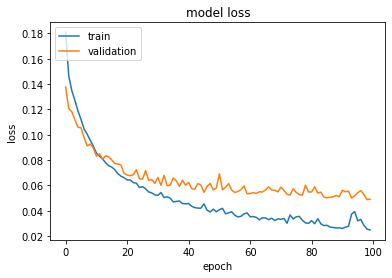

Model: "functional_713"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_236 (InputLayer)       [(None, 3, 3, 76)]        0         
_________________________________________________________________
conv2d_197 (Conv2D)          (None, 1, 1, 150)         102750    
_________________________________________________________________
conv2d_198 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_199 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_200 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_235 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_201 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:47:41.461341: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:47:41.461429: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:47:42.465534: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:47:42.517878: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:47:42.518924: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:47:42.521641: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_47_42
2022-03-20 18:47:42.522390: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_47_42/vw.trace.json.gz
2022-03-20 18:47:42.522773: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:47:42.524573: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

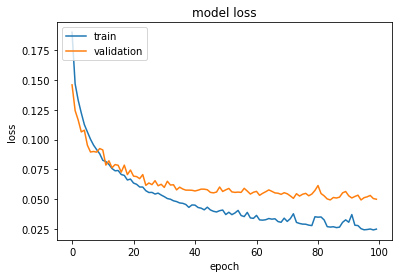

Model: "functional_717"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_237 (InputLayer)       [(None, 3, 3, 86)]        0         
_________________________________________________________________
conv2d_202 (Conv2D)          (None, 1, 1, 150)         116250    
_________________________________________________________________
conv2d_203 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_204 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_205 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_236 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_206 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:48:56.264809: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:48:56.264905: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:48:57.291523: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:48:57.331265: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:48:57.331711: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:48:57.334487: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_48_57
2022-03-20 18:48:57.335646: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_48_57/vw.trace.json.gz
2022-03-20 18:48:57.336021: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:48:57.337531: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

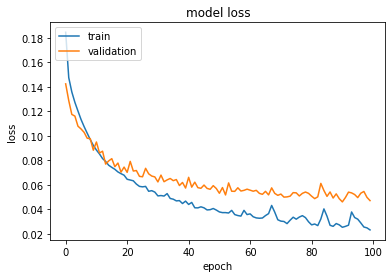

Model: "functional_721"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_238 (InputLayer)       [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_207 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_208 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_209 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_210 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_237 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_211 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:50:11.675141: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:50:11.675232: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:50:12.637623: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:50:12.671548: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:50:12.672198: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:50:12.674150: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_50_12
2022-03-20 18:50:12.674915: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_50_12/vw.trace.json.gz
2022-03-20 18:50:12.675100: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:50:12.676526: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

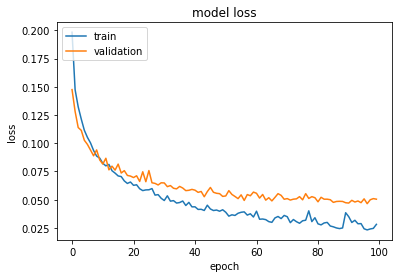

Model: "functional_725"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_239 (InputLayer)       [(None, 3, 3, 6)]         0         
_________________________________________________________________
conv2d_212 (Conv2D)          (None, 1, 1, 150)         8250      
_________________________________________________________________
conv2d_213 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_214 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_215 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_238 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_216 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:51:27.850294: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:51:27.850380: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:51:28.662705: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:51:28.692016: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:51:28.692491: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:51:28.694025: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_51_28
2022-03-20 18:51:28.694769: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_51_28/vw.trace.json.gz
2022-03-20 18:51:28.694908: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:51:28.695933: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

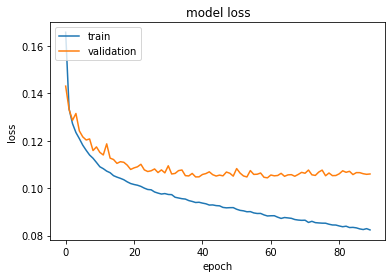

Model: "functional_729"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_240 (InputLayer)       [(None, 3, 3, 16)]        0         
_________________________________________________________________
conv2d_217 (Conv2D)          (None, 1, 1, 150)         21750     
_________________________________________________________________
conv2d_218 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_219 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_220 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_239 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_221 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:52:18.373085: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:52:18.373174: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:52:19.131176: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:52:19.157475: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:52:19.157826: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:52:19.159228: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_52_19
2022-03-20 18:52:19.159906: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_52_19/vw.trace.json.gz
2022-03-20 18:52:19.160087: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:52:19.161214: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

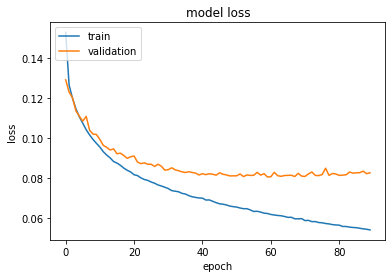

Model: "functional_733"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_241 (InputLayer)       [(None, 3, 3, 26)]        0         
_________________________________________________________________
conv2d_222 (Conv2D)          (None, 1, 1, 150)         35250     
_________________________________________________________________
conv2d_223 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_224 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_225 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_240 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_226 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:53:10.094188: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:53:10.094282: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:53:10.820804: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:53:10.848664: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:53:10.848990: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:53:10.850210: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_53_10
2022-03-20 18:53:10.850857: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_53_10/vw.trace.json.gz
2022-03-20 18:53:10.850944: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:53:10.851895: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

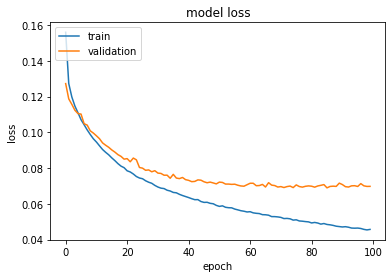

Model: "functional_737"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_242 (InputLayer)       [(None, 3, 3, 36)]        0         
_________________________________________________________________
conv2d_227 (Conv2D)          (None, 1, 1, 150)         48750     
_________________________________________________________________
conv2d_228 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_229 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_230 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_241 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_231 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:54:09.975832: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:54:09.975920: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:54:10.743635: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:54:10.770017: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:54:10.770375: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:54:10.771657: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_54_10
2022-03-20 18:54:10.772316: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_54_10/vw.trace.json.gz
2022-03-20 18:54:10.772424: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:54:10.773370: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

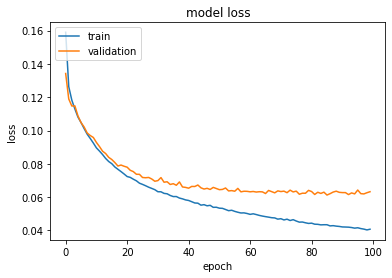

Model: "functional_741"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_243 (InputLayer)       [(None, 3, 3, 46)]        0         
_________________________________________________________________
conv2d_232 (Conv2D)          (None, 1, 1, 150)         62250     
_________________________________________________________________
conv2d_233 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_234 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_235 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_242 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_236 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:55:11.600266: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:55:11.600358: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:55:12.360165: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:55:12.385171: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:55:12.385542: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:55:12.386848: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_55_12
2022-03-20 18:55:12.387535: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_55_12/vw.trace.json.gz
2022-03-20 18:55:12.387631: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:55:12.388581: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

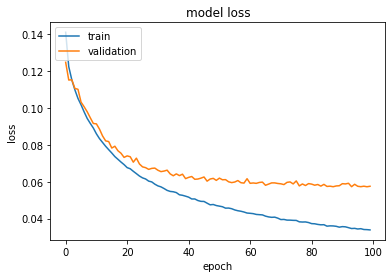

Model: "functional_745"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_244 (InputLayer)       [(None, 3, 3, 56)]        0         
_________________________________________________________________
conv2d_237 (Conv2D)          (None, 1, 1, 150)         75750     
_________________________________________________________________
conv2d_238 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_239 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_240 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_243 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_241 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:56:15.877458: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:56:15.877546: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:56:16.707354: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:56:16.737139: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:56:16.737562: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:56:16.739161: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_56_16
2022-03-20 18:56:16.739919: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_56_16/vw.trace.json.gz
2022-03-20 18:56:16.740053: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:56:16.741222: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

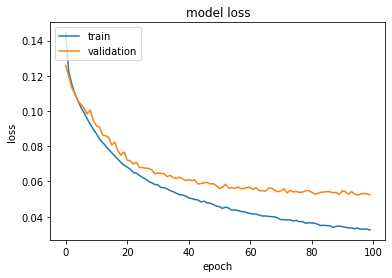

Model: "functional_749"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_245 (InputLayer)       [(None, 3, 3, 66)]        0         
_________________________________________________________________
conv2d_242 (Conv2D)          (None, 1, 1, 150)         89250     
_________________________________________________________________
conv2d_243 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_244 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_245 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_244 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_246 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:57:22.538355: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:57:22.538463: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:57:23.346233: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:57:23.371566: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:57:23.371933: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:57:23.373267: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_57_23
2022-03-20 18:57:23.373945: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_57_23/vw.trace.json.gz
2022-03-20 18:57:23.374050: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:57:23.375063: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

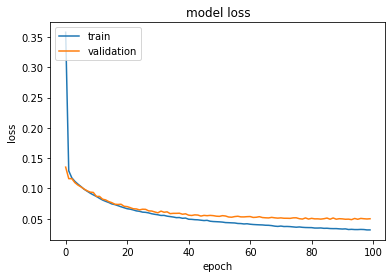

Model: "functional_753"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_246 (InputLayer)       [(None, 3, 3, 76)]        0         
_________________________________________________________________
conv2d_247 (Conv2D)          (None, 1, 1, 150)         102750    
_________________________________________________________________
conv2d_248 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_249 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_250 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_245 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_251 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:58:30.585526: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:58:30.585624: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:58:31.570813: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:58:31.612895: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:58:31.613265: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:58:31.615150: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_58_31
2022-03-20 18:58:31.615905: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_58_31/vw.trace.json.gz
2022-03-20 18:58:31.616030: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:58:31.617522: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

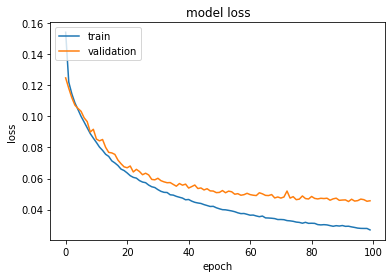

Model: "functional_757"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_247 (InputLayer)       [(None, 3, 3, 86)]        0         
_________________________________________________________________
conv2d_252 (Conv2D)          (None, 1, 1, 150)         116250    
_________________________________________________________________
conv2d_253 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_254 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_255 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_246 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_256 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 18:59:44.731903: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:59:44.732006: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 18:59:45.632531: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 18:59:45.656476: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 18:59:45.656840: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 18:59:45.658172: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_18_59_45
2022-03-20 18:59:45.658845: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_18_59_45/vw.trace.json.gz
2022-03-20 18:59:45.658940: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 18:59:45.659865: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

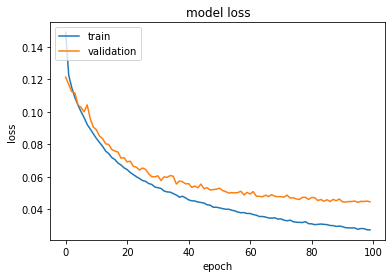

Model: "functional_761"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_248 (InputLayer)       [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_257 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_258 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_259 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_260 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_247 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_261 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 19:00:57.621292: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:00:57.621380: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:00:58.400256: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:00:58.422597: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:00:58.422909: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:00:58.424076: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_00_58
2022-03-20 19:00:58.424676: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_00_58/vw.trace.json.gz
2022-03-20 19:00:58.424757: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:00:58.425604: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

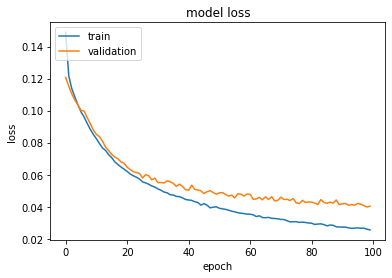

Model: "functional_765"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_249 (InputLayer)       [(None, 3, 3, 6)]         0         
_________________________________________________________________
conv2d_262 (Conv2D)          (None, 1, 1, 150)         8250      
_________________________________________________________________
conv2d_263 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_264 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_265 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_248 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_266 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 19:02:12.984805: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:02:12.984893: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:02:13.683439: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:02:13.705594: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:02:13.705920: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:02:13.707114: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_02_13
2022-03-20 19:02:13.707744: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_02_13/vw.trace.json.gz
2022-03-20 19:02:13.707824: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:02:13.708692: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

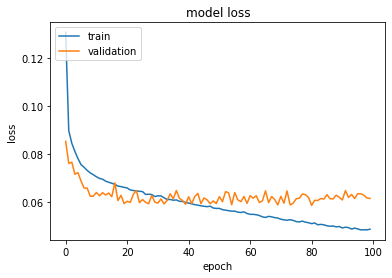

Model: "functional_769"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_250 (InputLayer)       [(None, 3, 3, 16)]        0         
_________________________________________________________________
conv2d_267 (Conv2D)          (None, 1, 1, 150)         21750     
_________________________________________________________________
conv2d_268 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_269 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_270 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_249 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_271 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 19:03:08.213343: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:03:08.213432: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:03:09.528575: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:03:09.586153: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:03:09.588401: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:03:09.590177: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_03_09
2022-03-20 19:03:09.590810: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_03_09/vw.trace.json.gz
2022-03-20 19:03:09.590983: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:03:09.592440: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

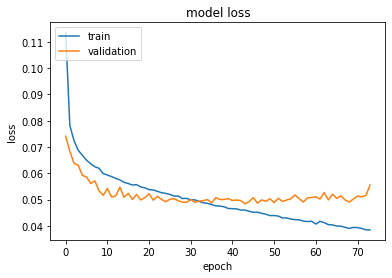

Model: "functional_773"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_251 (InputLayer)       [(None, 3, 3, 26)]        0         
_________________________________________________________________
conv2d_272 (Conv2D)          (None, 1, 1, 150)         35250     
_________________________________________________________________
conv2d_273 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_274 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_275 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_250 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_276 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 19:03:52.830543: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:03:52.830637: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:03:53.850022: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:03:53.899645: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:03:53.900188: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:03:53.902282: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_03_53
2022-03-20 19:03:53.902947: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_03_53/vw.trace.json.gz
2022-03-20 19:03:53.903270: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:03:53.904877: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

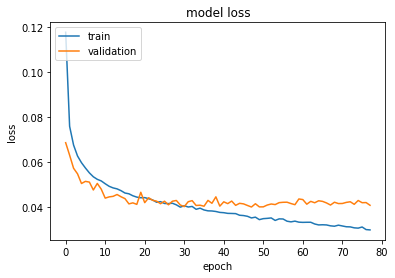

Model: "functional_777"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_252 (InputLayer)       [(None, 3, 3, 36)]        0         
_________________________________________________________________
conv2d_277 (Conv2D)          (None, 1, 1, 150)         48750     
_________________________________________________________________
conv2d_278 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_279 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_280 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_251 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_281 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 19:04:40.534412: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:04:40.534607: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:04:41.437132: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:04:41.471337: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:04:41.471698: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:04:41.473031: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_04_41
2022-03-20 19:04:41.473641: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_04_41/vw.trace.json.gz
2022-03-20 19:04:41.473746: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:04:41.474739: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

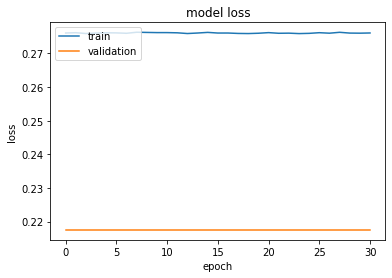

Model: "functional_781"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_253 (InputLayer)       [(None, 3, 3, 46)]        0         
_________________________________________________________________
conv2d_282 (Conv2D)          (None, 1, 1, 150)         62250     
_________________________________________________________________
conv2d_283 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_284 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_285 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_252 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_286 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 19:05:02.148409: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:05:02.148540: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:05:03.246113: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:05:03.283496: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:05:03.283975: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:05:03.285703: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_05_03
2022-03-20 19:05:03.286481: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_05_03/vw.trace.json.gz
2022-03-20 19:05:03.286629: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:05:03.287861: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

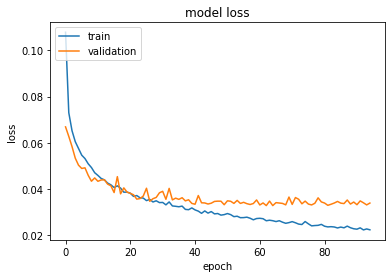

Model: "functional_785"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_254 (InputLayer)       [(None, 3, 3, 56)]        0         
_________________________________________________________________
conv2d_287 (Conv2D)          (None, 1, 1, 150)         75750     
_________________________________________________________________
conv2d_288 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_289 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_290 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_253 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_291 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 19:06:04.315923: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:06:04.316023: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:06:05.331711: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:06:05.371252: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:06:05.371722: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:06:05.373444: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_06_05
2022-03-20 19:06:05.374204: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_06_05/vw.trace.json.gz
2022-03-20 19:06:05.374374: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:06:05.375497: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

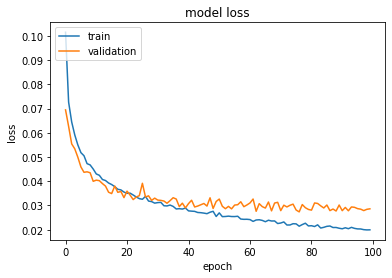

Model: "functional_789"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_255 (InputLayer)       [(None, 3, 3, 66)]        0         
_________________________________________________________________
conv2d_292 (Conv2D)          (None, 1, 1, 150)         89250     
_________________________________________________________________
conv2d_293 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_294 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_295 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_254 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_296 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 19:07:11.603469: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:07:11.603564: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:07:12.623259: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:07:12.664274: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:07:12.664737: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:07:12.666445: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_07_12
2022-03-20 19:07:12.667260: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_07_12/vw.trace.json.gz
2022-03-20 19:07:12.667400: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:07:12.668718: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

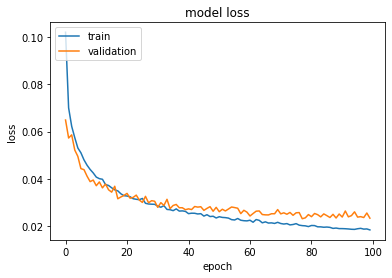

Model: "functional_793"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_256 (InputLayer)       [(None, 3, 3, 76)]        0         
_________________________________________________________________
conv2d_297 (Conv2D)          (None, 1, 1, 150)         102750    
_________________________________________________________________
conv2d_298 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_299 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_300 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_255 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_301 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 19:08:21.188234: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:08:21.188338: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:08:22.100873: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:08:22.134549: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:08:22.134939: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:08:22.136355: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_08_22
2022-03-20 19:08:22.137054: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_08_22/vw.trace.json.gz
2022-03-20 19:08:22.137176: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:08:22.138255: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

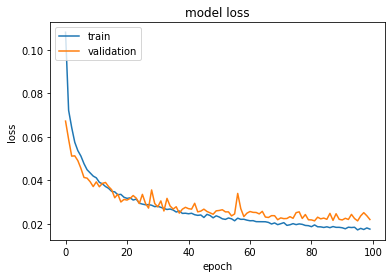

Model: "functional_797"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_257 (InputLayer)       [(None, 3, 3, 86)]        0         
_________________________________________________________________
conv2d_302 (Conv2D)          (None, 1, 1, 150)         116250    
_________________________________________________________________
conv2d_303 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_304 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_305 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_256 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_306 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 19:09:35.396193: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:09:35.396301: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:09:36.308376: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:09:36.343207: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:09:36.343697: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:09:36.345370: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_09_36
2022-03-20 19:09:36.346189: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_09_36/vw.trace.json.gz
2022-03-20 19:09:36.346318: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:09:36.347555: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

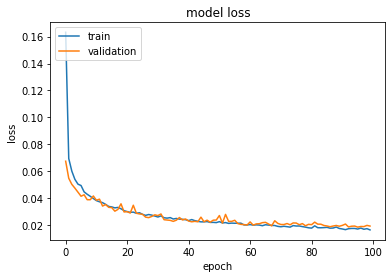

Model: "functional_801"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_258 (InputLayer)       [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_307 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_308 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_309 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_310 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_257 (Dropout)        (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_311 (Conv2D)          (None, 1, 1, 1)        

2022-03-20 19:10:49.076679: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:10:49.076777: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:10:49.995789: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:10:50.022128: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:10:50.022478: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:10:50.023790: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_10_50
2022-03-20 19:10:50.024485: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_10_50/vw.trace.json.gz
2022-03-20 19:10:50.024577: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:10:50.025577: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

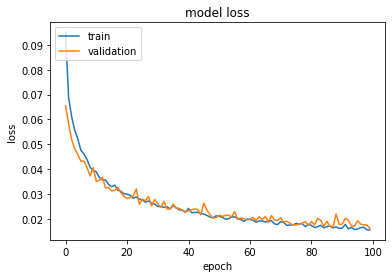

In [105]:
# define the list of parameters required to be trained and tested
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
# train
for param in params:
    # vary the input size; in this case becasue I know the max input size is 96
    for i in np.arange(start=6, stop=97, step=10):
        # specify the param to be trained and the size of the input
        train_cmd = "--train_subjects s01_still --model conv2d --layer 4 --train --label_type " + param[0] + " --DWI " + str(i)
        # for each training, plot the corresponding loss graph
        plot_loss(train_cmd)

In [106]:
# define the list of parameters required to be trained and tested
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
# test
for param in params:
    # vary the input size; in this case becasue I know the max input size is 96
    for i in np.arange(start=6, stop=97, step=10):
        # specify the param to be tested and the size of the test data
        test_cmd = "--test_subjects s02_still --model conv2d --layer 4 --label_type " + param[0] + " --DWI " + str(i)
        args = model_parser().parse_args(test_cmd.split())
        # test the trained model
        test_model(args)

6-conv2d-patch_3-base_1-layer_4-label_NDI
(84, 84, 6)
Model: "functional_805"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_259 (InputLayer)       [(None, 84, 84, 6)]       0         
_________________________________________________________________
conv2d_312 (Conv2D)          (None, 82, 82, 150)       8250      
_________________________________________________________________
conv2d_313 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_314 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_315 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_258 (Dropout)        (None, 82, 82, 150)       0         
________________________________________________________________

/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


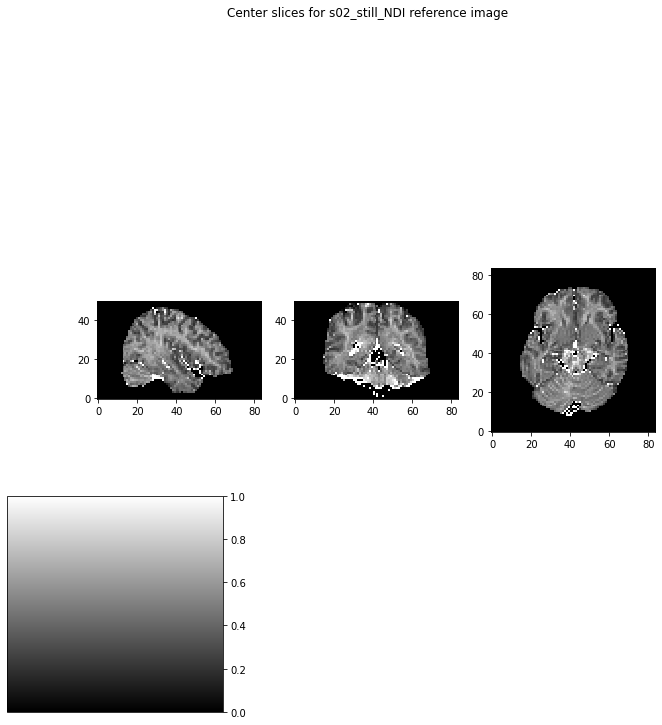

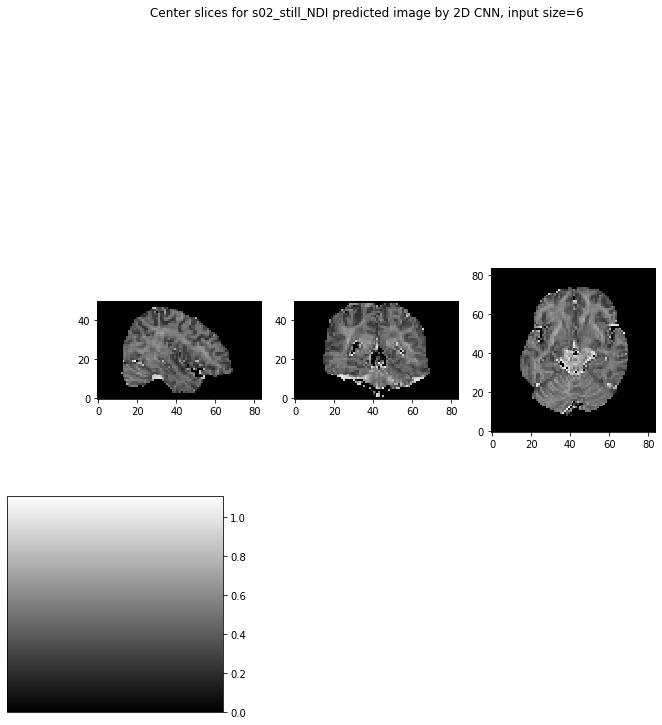

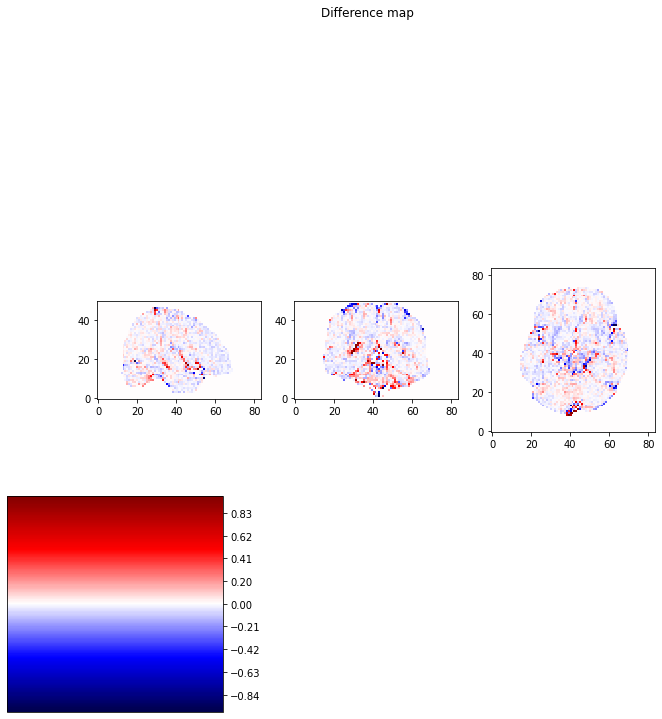

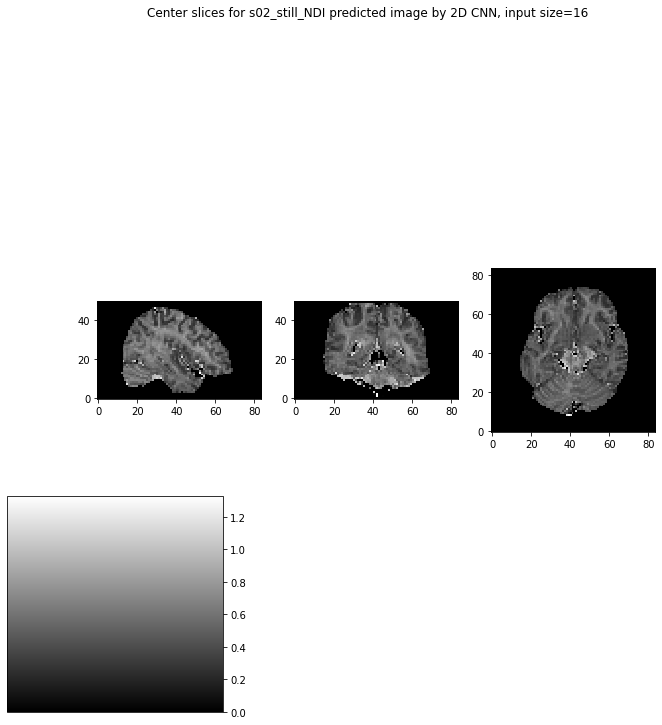

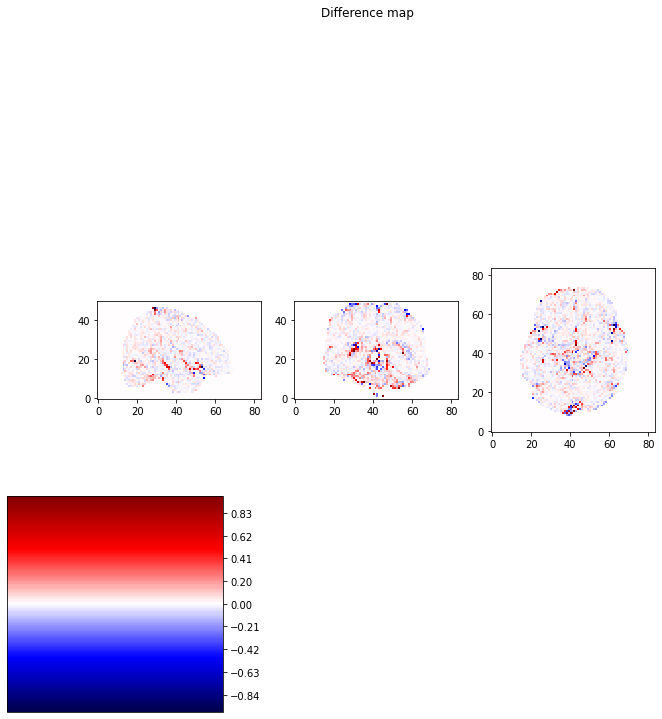

...

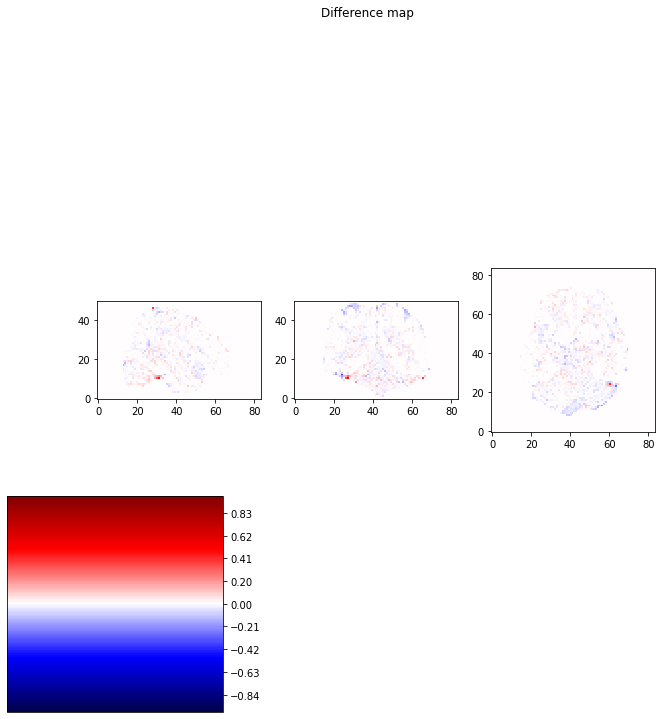

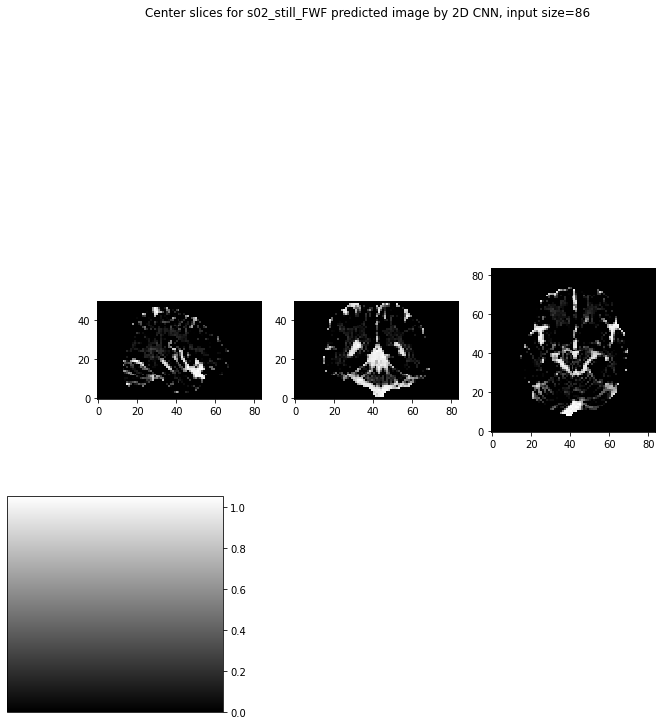

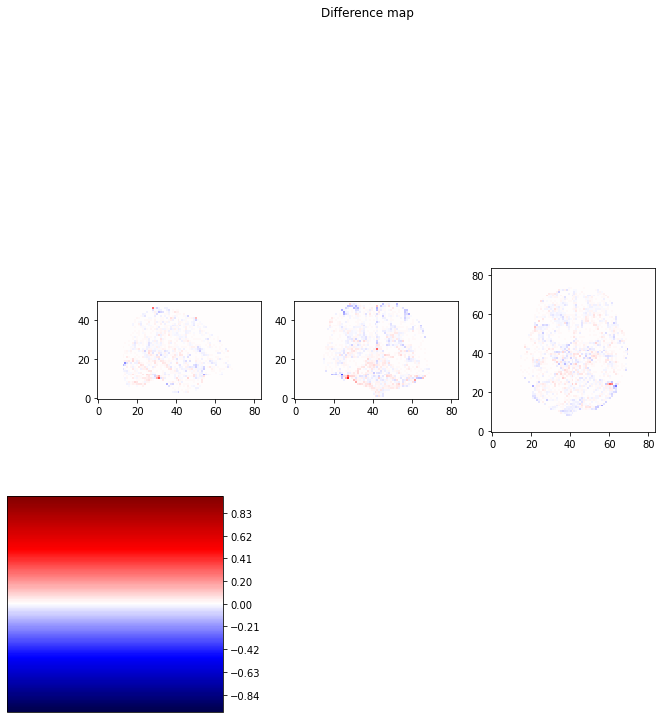

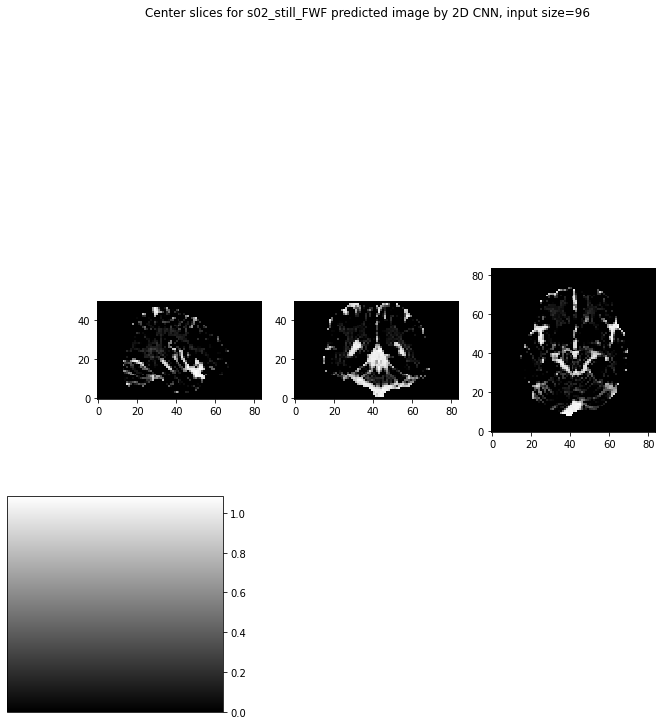

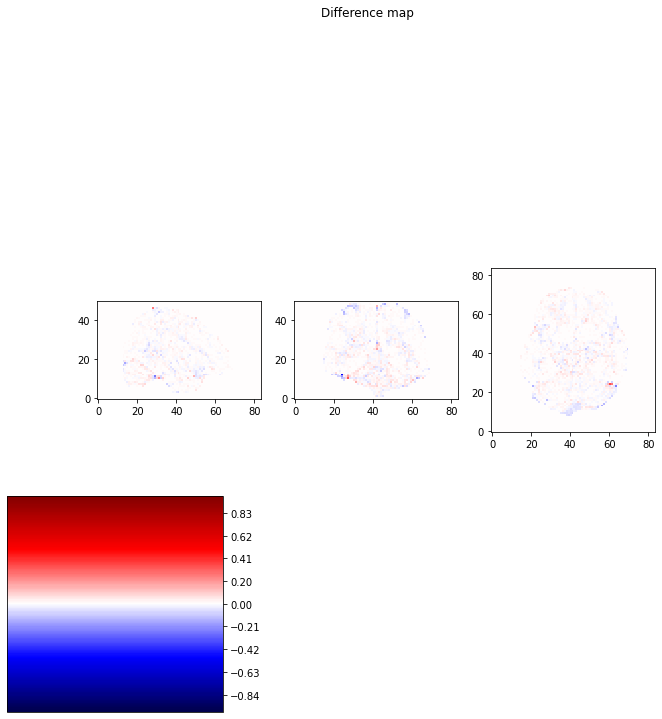

In [107]:
# plot each derived image
# specify the parameters
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
ref_img = [s02_NDI_img_data, s02_ODI_img_data, s02_FWF_img_data] # this is the ref img list
# iterate, so plot each param in order
for i in range (len(params)):
    # plot the reference img first
    ref_slice_0 = ref_img[i][26, :, :]
    ref_slice_1 = ref_img[i][:, 30, :]
    ref_slice_2 = ref_img[i][:, :, 16]
    show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
    plt.suptitle("Center slices for s02_still_" + params[i] + " reference image")
    
    for j in np.arange(start=6, stop=97, step=10):
        # plot the predicted imgs for different input size
        pred_path = '../Net/nii/s02_still-' + str(j)+'-conv2d-patch_3-base_1-layer_4-label_'+params[i]+'.nii'
        # load the img
        pred_img = nib.load(pred_path)
        # fetch the data
        pred_data = pred_img.get_fdata()

        # plot the pred img
        pred0 = pred_data[26, :, :]
        pred1 = pred_data[:, 30, :]
        pred2 = pred_data[:, :, 16]
        show_slices([pred0, pred1, pred2])
        plt.suptitle("Center slices for s02_still_" + params[i] + " predicted image by 2D CNN, input size="+str(j))

        # plot the difference img
        diff0 = ref_slice_0 - pred0
        diff1 = ref_slice_1 - pred1
        diff2 = ref_slice_2 - pred2
        show_slices([diff0, diff1, diff2], grayscale=False)
        plt.suptitle('Difference map')

5 Layer

Model: "functional_865"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_289 (InputLayer)       [(None, 3, 3, 6)]         0         
_________________________________________________________________
conv2d_462 (Conv2D)          (None, 1, 1, 150)         8250      
_________________________________________________________________
conv2d_463 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_464 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_465 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_466 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_288 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:12:42.000074: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:12:42.000154: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:12:42.997312: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.


2022-03-20 19:12:43.205480: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:12:43.208769: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:12:43.210592: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_12_43
2022-03-20 19:12:43.211306: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_12_43/vw.trace.json.gz
2022-03-20 19:12:43.211642: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:12:43.213326: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_12_43
2022-03-20 19:12:43.213414: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped 

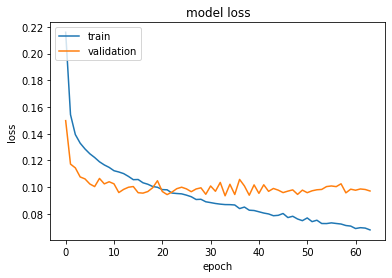

Model: "functional_869"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_290 (InputLayer)       [(None, 3, 3, 16)]        0         
_________________________________________________________________
conv2d_468 (Conv2D)          (None, 1, 1, 150)         21750     
_________________________________________________________________
conv2d_469 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_470 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_471 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_472 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_289 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:13:25.311803: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:13:25.311901: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:13:26.403297: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:13:26.452988: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:13:26.453464: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:13:26.455079: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_13_26
2022-03-20 19:13:26.455794: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_13_26/vw.trace.json.gz
2022-03-20 19:13:26.456008: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:13:26.457216: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

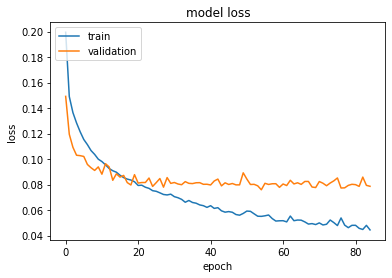

Model: "functional_873"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_291 (InputLayer)       [(None, 3, 3, 26)]        0         
_________________________________________________________________
conv2d_474 (Conv2D)          (None, 1, 1, 150)         35250     
_________________________________________________________________
conv2d_475 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_476 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_477 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_478 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_290 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:14:23.224380: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:14:23.224462: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:14:24.274051: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:14:24.314595: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:14:24.315021: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:14:24.316456: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_14_24
2022-03-20 19:14:24.317164: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_14_24/vw.trace.json.gz
2022-03-20 19:14:24.317275: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:14:24.318281: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

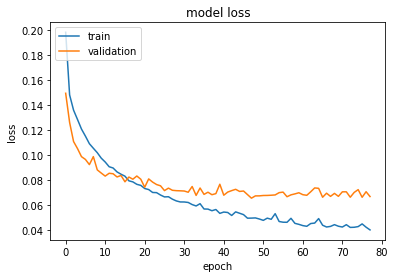

Model: "functional_877"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_292 (InputLayer)       [(None, 3, 3, 36)]        0         
_________________________________________________________________
conv2d_480 (Conv2D)          (None, 1, 1, 150)         48750     
_________________________________________________________________
conv2d_481 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_482 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_483 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_484 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_291 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:15:18.535568: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:15:18.535669: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:15:19.508260: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:15:19.545488: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:15:19.545910: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:15:19.547399: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_15_19
2022-03-20 19:15:19.548121: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_15_19/vw.trace.json.gz
2022-03-20 19:15:19.548299: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:15:19.549390: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

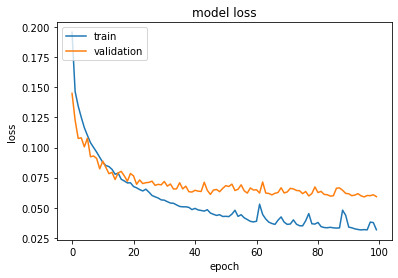

Model: "functional_881"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_293 (InputLayer)       [(None, 3, 3, 46)]        0         
_________________________________________________________________
conv2d_486 (Conv2D)          (None, 1, 1, 150)         62250     
_________________________________________________________________
conv2d_487 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_488 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_489 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_490 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_292 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:16:30.184818: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:16:30.184910: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:16:31.243737: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:16:31.284593: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:16:31.285097: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:16:31.286701: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_16_31
2022-03-20 19:16:31.287481: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_16_31/vw.trace.json.gz
2022-03-20 19:16:31.287618: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:16:31.288841: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

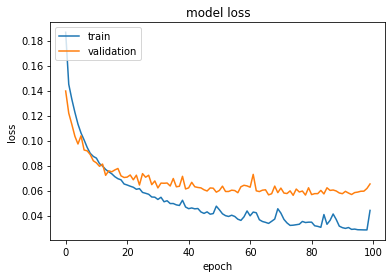

Model: "functional_885"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_294 (InputLayer)       [(None, 3, 3, 56)]        0         
_________________________________________________________________
conv2d_492 (Conv2D)          (None, 1, 1, 150)         75750     
_________________________________________________________________
conv2d_493 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_494 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_495 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_496 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_293 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:17:44.964445: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:17:44.964558: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:17:45.948536: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:17:45.990670: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:17:45.991161: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:17:45.992987: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_17_45
2022-03-20 19:17:45.993805: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_17_45/vw.trace.json.gz
2022-03-20 19:17:45.993960: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:17:45.995289: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

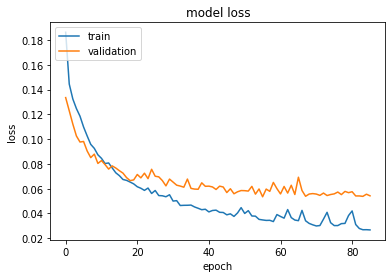

Model: "functional_889"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_295 (InputLayer)       [(None, 3, 3, 66)]        0         
_________________________________________________________________
conv2d_498 (Conv2D)          (None, 1, 1, 150)         89250     
_________________________________________________________________
conv2d_499 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_500 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_501 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_502 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_294 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:18:51.472604: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:18:51.472694: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:18:52.449573: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:18:52.483507: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:18:52.483921: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:18:52.485359: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_18_52
2022-03-20 19:18:52.486105: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_18_52/vw.trace.json.gz
2022-03-20 19:18:52.486236: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:18:52.487289: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

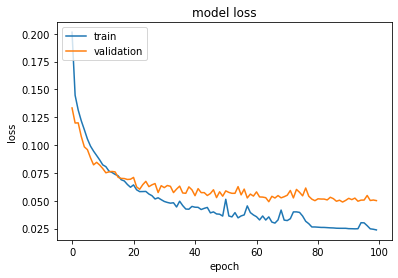

Model: "functional_893"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_296 (InputLayer)       [(None, 3, 3, 76)]        0         
_________________________________________________________________
conv2d_504 (Conv2D)          (None, 1, 1, 150)         102750    
_________________________________________________________________
conv2d_505 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_506 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_507 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_508 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_295 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:20:09.858219: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:20:09.858347: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:20:10.834579: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:20:10.865184: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:20:10.865673: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:20:10.867386: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_20_10
2022-03-20 19:20:10.868180: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_20_10/vw.trace.json.gz
2022-03-20 19:20:10.868343: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:20:10.869615: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

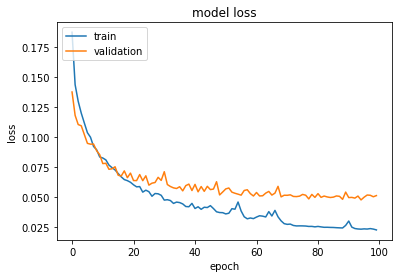

Model: "functional_897"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_297 (InputLayer)       [(None, 3, 3, 86)]        0         
_________________________________________________________________
conv2d_510 (Conv2D)          (None, 1, 1, 150)         116250    
_________________________________________________________________
conv2d_511 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_512 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_513 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_514 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_296 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:21:33.392710: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:21:33.392815: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:21:34.414266: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:21:34.440833: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:21:34.441242: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:21:34.442643: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_21_34
2022-03-20 19:21:34.443360: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_21_34/vw.trace.json.gz
2022-03-20 19:21:34.443472: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:21:34.444432: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

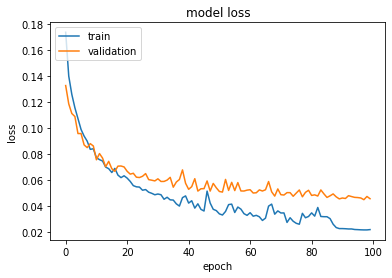

Model: "functional_901"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_298 (InputLayer)       [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_516 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_517 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_518 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_519 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_520 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_297 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:22:56.014898: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:22:56.014991: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:22:57.069432: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:22:57.096828: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:22:57.097184: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:22:57.098482: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_22_57
2022-03-20 19:22:57.099212: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_22_57/vw.trace.json.gz
2022-03-20 19:22:57.099319: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:22:57.100303: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

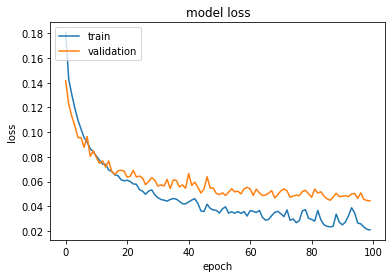

Model: "functional_905"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_299 (InputLayer)       [(None, 3, 3, 6)]         0         
_________________________________________________________________
conv2d_522 (Conv2D)          (None, 1, 1, 150)         8250      
_________________________________________________________________
conv2d_523 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_524 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_525 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_526 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_298 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:24:20.879542: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:24:20.879634: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:24:21.731364: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:24:21.760757: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:24:21.761114: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:24:21.762409: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_24_21
2022-03-20 19:24:21.763084: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_24_21/vw.trace.json.gz
2022-03-20 19:24:21.763188: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:24:21.764140: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

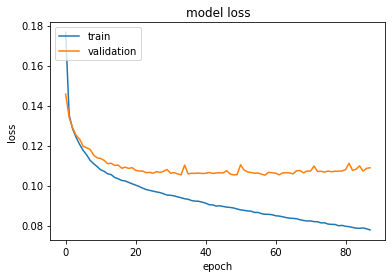

Model: "functional_909"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_300 (InputLayer)       [(None, 3, 3, 16)]        0         
_________________________________________________________________
conv2d_528 (Conv2D)          (None, 1, 1, 150)         21750     
_________________________________________________________________
conv2d_529 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_530 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_531 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_532 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_299 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:25:18.495254: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:25:18.495373: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:25:19.309961: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:25:19.334400: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:25:19.334754: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:25:19.336027: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_25_19
2022-03-20 19:25:19.336694: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_25_19/vw.trace.json.gz
2022-03-20 19:25:19.336783: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:25:19.337709: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

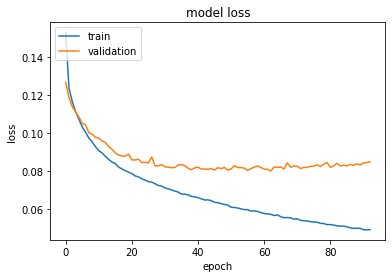

Model: "functional_913"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_301 (InputLayer)       [(None, 3, 3, 26)]        0         
_________________________________________________________________
conv2d_534 (Conv2D)          (None, 1, 1, 150)         35250     
_________________________________________________________________
conv2d_535 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_536 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_537 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_538 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_300 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:26:20.589885: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:26:20.589975: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:26:21.425088: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:26:21.449194: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:26:21.449532: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:26:21.450785: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_26_21
2022-03-20 19:26:21.451466: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_26_21/vw.trace.json.gz
2022-03-20 19:26:21.451564: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:26:21.452506: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

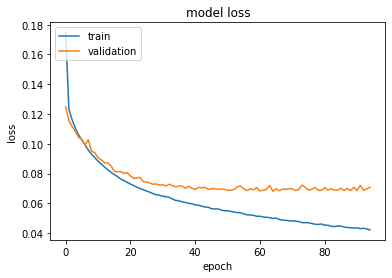

Model: "functional_917"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_302 (InputLayer)       [(None, 3, 3, 36)]        0         
_________________________________________________________________
conv2d_540 (Conv2D)          (None, 1, 1, 150)         48750     
_________________________________________________________________
conv2d_541 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_542 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_543 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_544 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_301 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:27:25.991455: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:27:25.991559: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:27:26.841958: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:27:26.867229: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:27:26.867587: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:27:26.868892: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_27_26
2022-03-20 19:27:26.869560: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_27_26/vw.trace.json.gz
2022-03-20 19:27:26.869657: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:27:26.870610: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

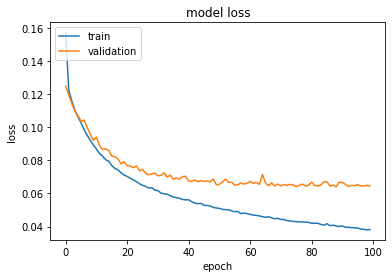

Model: "functional_921"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_303 (InputLayer)       [(None, 3, 3, 46)]        0         
_________________________________________________________________
conv2d_546 (Conv2D)          (None, 1, 1, 150)         62250     
_________________________________________________________________
conv2d_547 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_548 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_549 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_550 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_302 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:28:37.391643: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:28:37.391750: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:28:38.291096: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:28:38.320881: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:28:38.321264: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:28:38.322650: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_28_38
2022-03-20 19:28:38.323356: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_28_38/vw.trace.json.gz
2022-03-20 19:28:38.323455: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:28:38.324451: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

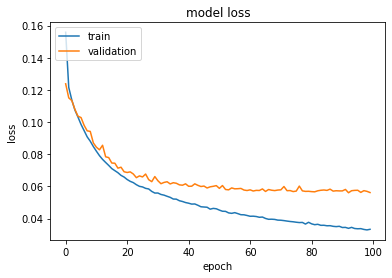

Model: "functional_925"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_304 (InputLayer)       [(None, 3, 3, 56)]        0         
_________________________________________________________________
conv2d_552 (Conv2D)          (None, 1, 1, 150)         75750     
_________________________________________________________________
conv2d_553 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_554 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_555 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_556 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_303 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:29:51.155601: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:29:51.155694: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:29:53.349064: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:29:53.421385: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:29:53.425409: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:29:53.427903: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_29_53
2022-03-20 19:29:53.428720: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_29_53/vw.trace.json.gz
2022-03-20 19:29:53.428992: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:29:53.431104: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

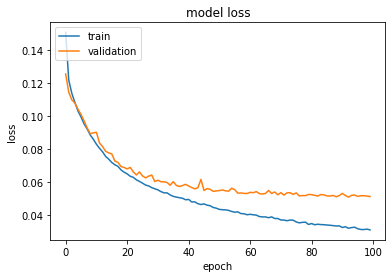

Model: "functional_929"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_305 (InputLayer)       [(None, 3, 3, 66)]        0         
_________________________________________________________________
conv2d_558 (Conv2D)          (None, 1, 1, 150)         89250     
_________________________________________________________________
conv2d_559 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_560 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_561 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_562 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_304 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:31:09.091713: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:31:09.091805: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:31:10.541508: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:31:10.614193: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:31:10.614940: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:31:10.617824: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_31_10
2022-03-20 19:31:10.618675: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_31_10/vw.trace.json.gz
2022-03-20 19:31:10.619181: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:31:10.621773: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

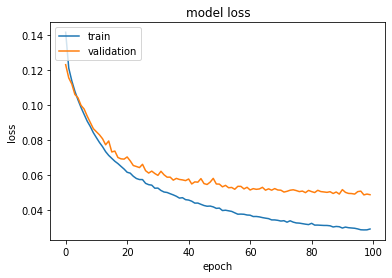

Model: "functional_933"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_306 (InputLayer)       [(None, 3, 3, 76)]        0         
_________________________________________________________________
conv2d_564 (Conv2D)          (None, 1, 1, 150)         102750    
_________________________________________________________________
conv2d_565 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_566 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_567 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_568 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_305 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:32:29.121575: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:32:29.121661: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:32:30.453161: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:32:30.540912: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:32:30.541542: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:32:30.543592: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_32_30
2022-03-20 19:32:30.544518: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_32_30/vw.trace.json.gz
2022-03-20 19:32:30.544787: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:32:30.546326: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

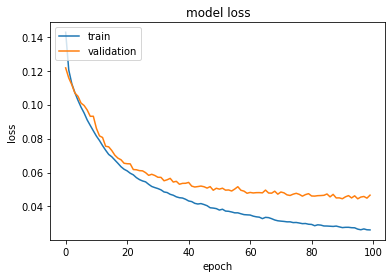

Model: "functional_937"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_307 (InputLayer)       [(None, 3, 3, 86)]        0         
_________________________________________________________________
conv2d_570 (Conv2D)          (None, 1, 1, 150)         116250    
_________________________________________________________________
conv2d_571 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_572 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_573 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_574 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_306 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:33:54.256680: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:33:54.256782: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:33:55.476940: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:33:55.530308: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:33:55.530856: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:33:55.532853: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_33_55
2022-03-20 19:33:55.533692: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_33_55/vw.trace.json.gz
2022-03-20 19:33:55.533906: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:33:55.535463: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

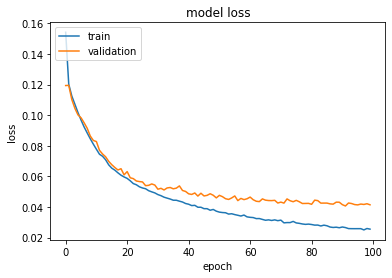

Model: "functional_941"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_308 (InputLayer)       [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_576 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_577 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_578 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_579 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_580 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_307 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:35:18.134294: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:35:18.134414: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:35:19.352573: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:35:19.395244: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:35:19.395698: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:35:19.397322: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_35_19
2022-03-20 19:35:19.398049: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_35_19/vw.trace.json.gz
2022-03-20 19:35:19.398191: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:35:19.399332: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

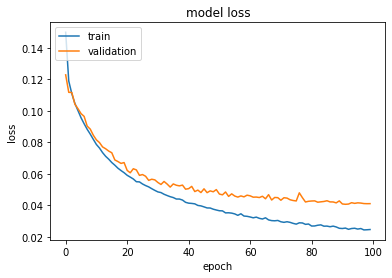

Model: "functional_945"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_309 (InputLayer)       [(None, 3, 3, 6)]         0         
_________________________________________________________________
conv2d_582 (Conv2D)          (None, 1, 1, 150)         8250      
_________________________________________________________________
conv2d_583 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_584 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_585 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_586 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_308 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:36:44.469850: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:36:44.469960: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:36:45.498815: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:36:45.536502: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:36:45.537000: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:36:45.538521: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_36_45
2022-03-20 19:36:45.539235: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_36_45/vw.trace.json.gz
2022-03-20 19:36:45.539406: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:36:45.540670: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

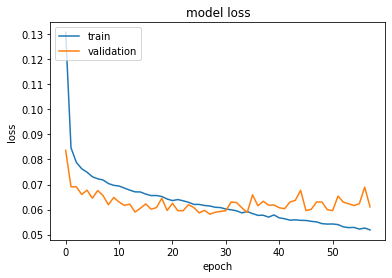

Model: "functional_949"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_310 (InputLayer)       [(None, 3, 3, 16)]        0         
_________________________________________________________________
conv2d_588 (Conv2D)          (None, 1, 1, 150)         21750     
_________________________________________________________________
conv2d_589 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_590 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_591 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_592 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_309 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:37:24.149147: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:37:24.149253: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:37:25.144658: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:37:25.180071: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:37:25.180483: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:37:25.182230: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_37_25
2022-03-20 19:37:25.182995: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_37_25/vw.trace.json.gz
2022-03-20 19:37:25.183170: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:37:25.184370: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

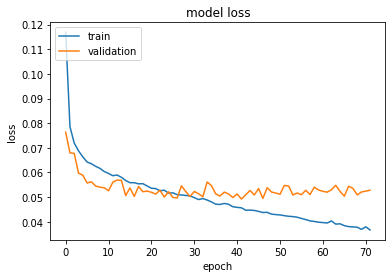

Model: "functional_953"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_311 (InputLayer)       [(None, 3, 3, 26)]        0         
_________________________________________________________________
conv2d_594 (Conv2D)          (None, 1, 1, 150)         35250     
_________________________________________________________________
conv2d_595 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_596 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_597 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_598 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_310 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:38:13.669939: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:38:13.670025: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:38:14.660599: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:38:14.694501: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:38:14.694876: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:38:14.696278: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_38_14
2022-03-20 19:38:14.697006: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_38_14/vw.trace.json.gz
2022-03-20 19:38:14.697273: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:38:14.698795: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

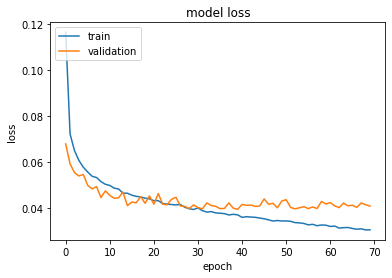

Model: "functional_957"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_312 (InputLayer)       [(None, 3, 3, 36)]        0         
_________________________________________________________________
conv2d_600 (Conv2D)          (None, 1, 1, 150)         48750     
_________________________________________________________________
conv2d_601 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_602 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_603 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_604 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_311 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:39:03.389415: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:39:03.389512: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:39:04.350768: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:39:04.380460: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:39:04.380829: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:39:04.382183: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_39_04
2022-03-20 19:39:04.382872: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_39_04/vw.trace.json.gz
2022-03-20 19:39:04.382979: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:39:04.384021: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

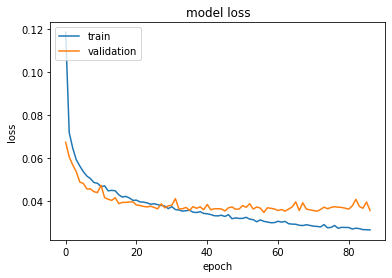

Model: "functional_961"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_313 (InputLayer)       [(None, 3, 3, 46)]        0         
_________________________________________________________________
conv2d_606 (Conv2D)          (None, 1, 1, 150)         62250     
_________________________________________________________________
conv2d_607 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_608 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_609 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_610 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_312 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:40:06.797348: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:40:06.797441: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:40:07.737004: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:40:07.766155: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:40:07.766522: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:40:07.767873: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_40_07
2022-03-20 19:40:07.768555: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_40_07/vw.trace.json.gz
2022-03-20 19:40:07.768652: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:40:07.769632: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

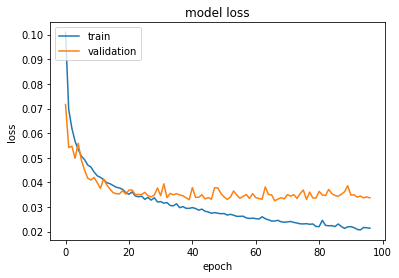

Model: "functional_965"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_314 (InputLayer)       [(None, 3, 3, 56)]        0         
_________________________________________________________________
conv2d_612 (Conv2D)          (None, 1, 1, 150)         75750     
_________________________________________________________________
conv2d_613 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_614 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_615 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_616 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_313 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:41:18.862976: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:41:18.863086: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:41:19.844715: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:41:19.873573: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:41:19.873984: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:41:19.875445: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_41_19
2022-03-20 19:41:19.876178: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_41_19/vw.trace.json.gz
2022-03-20 19:41:19.876284: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:41:19.877293: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

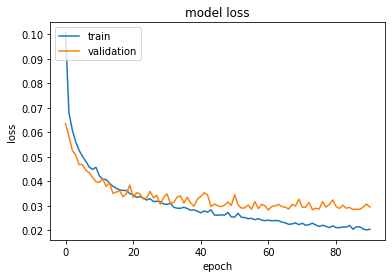

Model: "functional_969"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_315 (InputLayer)       [(None, 3, 3, 66)]        0         
_________________________________________________________________
conv2d_618 (Conv2D)          (None, 1, 1, 150)         89250     
_________________________________________________________________
conv2d_619 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_620 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_621 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_622 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_314 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:42:29.485123: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:42:29.485234: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:42:30.487034: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:42:30.513099: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:42:30.513467: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:42:30.514771: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_42_30
2022-03-20 19:42:30.515451: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_42_30/vw.trace.json.gz
2022-03-20 19:42:30.515544: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:42:30.516486: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

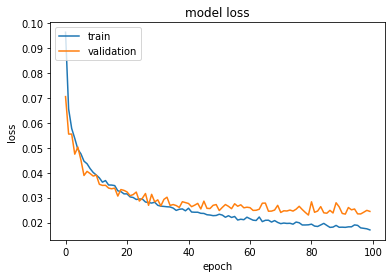

Model: "functional_973"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_316 (InputLayer)       [(None, 3, 3, 76)]        0         
_________________________________________________________________
conv2d_624 (Conv2D)          (None, 1, 1, 150)         102750    
_________________________________________________________________
conv2d_625 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_626 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_627 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_628 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_315 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:43:47.818641: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:43:47.818761: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:43:48.838888: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:43:48.866221: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:43:48.866615: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:43:48.868019: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_43_48
2022-03-20 19:43:48.868725: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_43_48/vw.trace.json.gz
2022-03-20 19:43:48.868837: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:43:48.869855: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

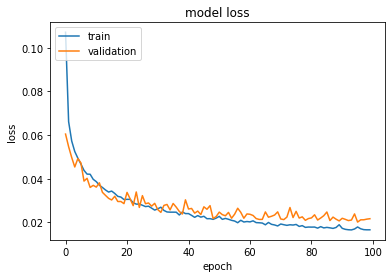

Model: "functional_977"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_317 (InputLayer)       [(None, 3, 3, 86)]        0         
_________________________________________________________________
conv2d_630 (Conv2D)          (None, 1, 1, 150)         116250    
_________________________________________________________________
conv2d_631 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_632 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_633 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_634 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_316 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:45:11.412555: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:45:11.412661: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:45:12.476762: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:45:12.506836: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:45:12.507192: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:45:12.508488: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_45_12
2022-03-20 19:45:12.509183: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_45_12/vw.trace.json.gz
2022-03-20 19:45:12.509274: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:45:12.510245: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

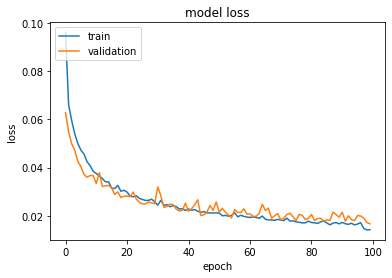

Model: "functional_981"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_318 (InputLayer)       [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_636 (Conv2D)          (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_637 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_638 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_639 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_640 (Conv2D)          (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_317 (Dropout)        (None, 1, 1, 150)      

2022-03-20 19:46:34.268986: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:46:34.269101: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:46:35.320624: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:46:35.351562: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:46:35.351999: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:46:35.353417: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_46_35
2022-03-20 19:46:35.354153: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_46_35/vw.trace.json.gz
2022-03-20 19:46:35.354258: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:46:35.355303: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

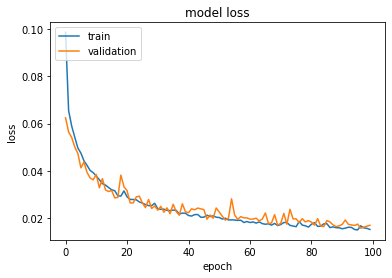

In [108]:
# define the list of parameters required to be trained and tested
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
# train
for param in params:
    # vary the input size; in this case becasue I know the max input size is 96
    for i in np.arange(start=6, stop=97, step=10):
        # specify the param to be trained and the size of the input
        train_cmd = "--train_subjects s01_still --model conv2d --layer 5 --train --label_type " + param[0] + " --DWI " + str(i)
        # for each training, plot the corresponding loss graph
        plot_loss(train_cmd)

In [109]:
# define the list of parameters required to be trained and tested
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
# test
for param in params:
    # vary the input size; in this case becasue I know the max input size is 96
    for i in np.arange(start=6, stop=97, step=10):
        # specify the param to be tested and the size of the test data
        test_cmd = "--test_subjects s02_still --model conv2d --layer 5 --label_type " + param[0] + " --DWI " + str(i)
        args = model_parser().parse_args(test_cmd.split())
        # test the trained model
        test_model(args)

6-conv2d-patch_3-base_1-layer_5-label_NDI
(84, 84, 6)
Model: "functional_985"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_319 (InputLayer)       [(None, 84, 84, 6)]       0         
_________________________________________________________________
conv2d_642 (Conv2D)          (None, 82, 82, 150)       8250      
_________________________________________________________________
conv2d_643 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_644 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_645 (Conv2D)          (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_646 (Conv2D)          (None, 82, 82, 150)       22650     
________________________________________________________________

3D CNN<br/>
repeat the same process as above

Model: "functional_1045"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_349 (InputLayer)       [(None, 3, 3, 3, 6)]      0         
_________________________________________________________________
conv3d_162 (Conv3D)          (None, 1, 1, 1, 150)      24450     
_________________________________________________________________
conv3d_163 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_164 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_165 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_348 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_166 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 19:48:26.538161: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:48:26.539206: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:48:27.520454: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.


2022-03-20 19:48:27.727148: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:48:27.736337: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:48:27.746665: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_48_27
2022-03-20 19:48:27.747260: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_48_27/vw.trace.json.gz
2022-03-20 19:48:27.747573: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:48:27.751383: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_48_27
2022-03-20 19:48:27.751476: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped 

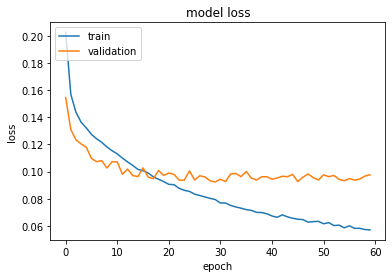

Model: "functional_1049"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_350 (InputLayer)       [(None, 3, 3, 3, 16)]     0         
_________________________________________________________________
conv3d_167 (Conv3D)          (None, 1, 1, 1, 150)      64950     
_________________________________________________________________
conv3d_168 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_169 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_170 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_349 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_171 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 19:49:00.249749: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:49:00.249836: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:49:01.211232: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:49:01.242621: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:49:01.243020: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:49:01.244553: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_49_01
2022-03-20 19:49:01.245104: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_49_01/vw.trace.json.gz
2022-03-20 19:49:01.245229: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:49:01.246346: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

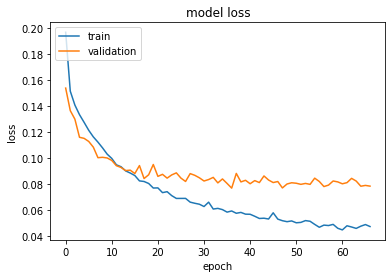

Model: "functional_1053"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_351 (InputLayer)       [(None, 3, 3, 3, 26)]     0         
_________________________________________________________________
conv3d_172 (Conv3D)          (None, 1, 1, 1, 150)      105450    
_________________________________________________________________
conv3d_173 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_174 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_175 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_350 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_176 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 19:49:41.349685: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:49:41.349808: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:49:42.353484: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:49:42.382657: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:49:42.382994: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:49:42.384182: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_49_42
2022-03-20 19:49:42.384739: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_49_42/vw.trace.json.gz
2022-03-20 19:49:42.384821: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:49:42.385932: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

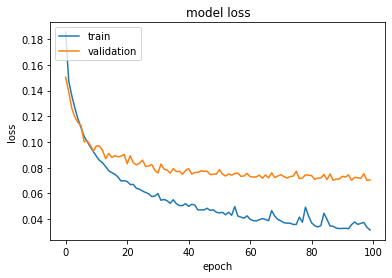

Model: "functional_1057"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_352 (InputLayer)       [(None, 3, 3, 3, 36)]     0         
_________________________________________________________________
conv3d_177 (Conv3D)          (None, 1, 1, 1, 150)      145950    
_________________________________________________________________
conv3d_178 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_179 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_180 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_351 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_181 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 19:50:49.449529: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:50:49.449649: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:50:50.369592: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:50:50.396053: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:50:50.396372: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:50:50.397520: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_50_50
2022-03-20 19:50:50.398107: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_50_50/vw.trace.json.gz
2022-03-20 19:50:50.398189: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:50:50.399063: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

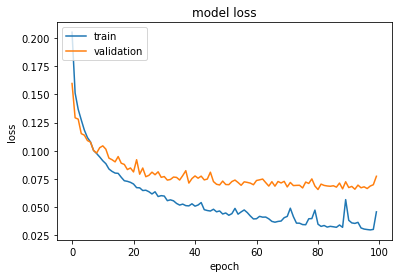

Model: "functional_1061"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_353 (InputLayer)       [(None, 3, 3, 3, 46)]     0         
_________________________________________________________________
conv3d_182 (Conv3D)          (None, 1, 1, 1, 150)      186450    
_________________________________________________________________
conv3d_183 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_184 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_185 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_352 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_186 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 19:52:03.377922: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:52:03.378020: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:52:04.274315: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:52:04.300079: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:52:04.300378: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:52:04.301564: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_52_04
2022-03-20 19:52:04.302145: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_52_04/vw.trace.json.gz
2022-03-20 19:52:04.302228: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:52:04.303107: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

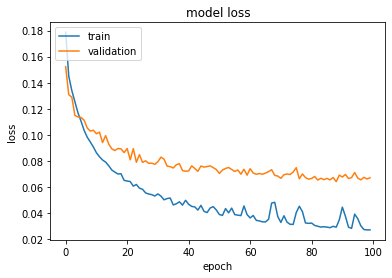

Model: "functional_1065"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_354 (InputLayer)       [(None, 3, 3, 3, 56)]     0         
_________________________________________________________________
conv3d_187 (Conv3D)          (None, 1, 1, 1, 150)      226950    
_________________________________________________________________
conv3d_188 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_189 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_190 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_353 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_191 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 19:53:24.266860: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:53:24.266950: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:53:25.160223: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:53:25.183582: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:53:25.183873: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:53:25.184985: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_53_25
2022-03-20 19:53:25.185541: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_53_25/vw.trace.json.gz
2022-03-20 19:53:25.185617: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:53:25.186485: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

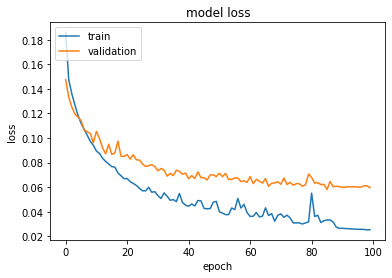

Model: "functional_1069"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_355 (InputLayer)       [(None, 3, 3, 3, 66)]     0         
_________________________________________________________________
conv3d_192 (Conv3D)          (None, 1, 1, 1, 150)      267450    
_________________________________________________________________
conv3d_193 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_194 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_195 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_354 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_196 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 19:54:52.891595: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:54:52.891691: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:54:53.775933: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:54:53.799377: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:54:53.799677: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:54:53.800827: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_54_53
2022-03-20 19:54:53.801428: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_54_53/vw.trace.json.gz
2022-03-20 19:54:53.801510: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:54:53.802413: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

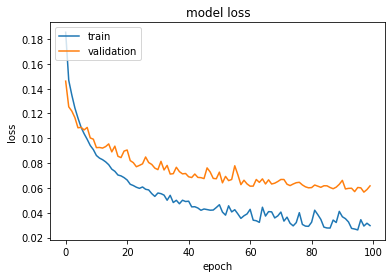

Model: "functional_1073"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_356 (InputLayer)       [(None, 3, 3, 3, 76)]     0         
_________________________________________________________________
conv3d_197 (Conv3D)          (None, 1, 1, 1, 150)      307950    
_________________________________________________________________
conv3d_198 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_199 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_200 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_355 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_201 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 19:56:29.333088: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:56:29.333187: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:56:30.240184: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:56:30.263028: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:56:30.263338: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:56:30.264543: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_56_30
2022-03-20 19:56:30.265154: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_56_30/vw.trace.json.gz
2022-03-20 19:56:30.265236: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:56:30.266155: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

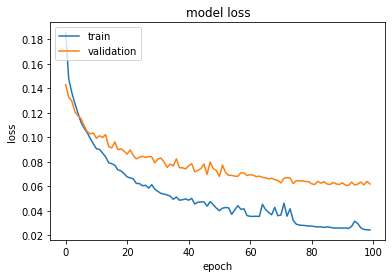

Model: "functional_1077"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_357 (InputLayer)       [(None, 3, 3, 3, 86)]     0         
_________________________________________________________________
conv3d_202 (Conv3D)          (None, 1, 1, 1, 150)      348450    
_________________________________________________________________
conv3d_203 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_204 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_205 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_356 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_206 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 19:58:16.477182: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:58:16.477274: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 19:58:17.350284: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 19:58:17.371792: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 19:58:17.372081: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 19:58:17.373206: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_19_58_17
2022-03-20 19:58:17.373791: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_19_58_17/vw.trace.json.gz
2022-03-20 19:58:17.373875: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 19:58:17.374768: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

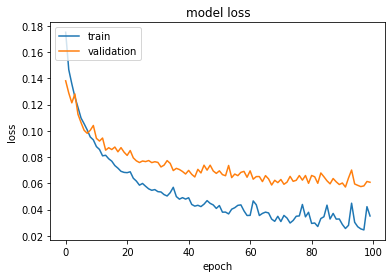

Model: "functional_1081"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_358 (InputLayer)       [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_207 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_208 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_209 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_210 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_357 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_211 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:00:16.054998: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:00:16.055093: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:00:16.977692: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:00:16.998841: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:00:16.999117: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:00:17.000204: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_00_16
2022-03-20 20:00:17.000774: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_00_16/vw.trace.json.gz
2022-03-20 20:00:17.000846: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:00:17.001695: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

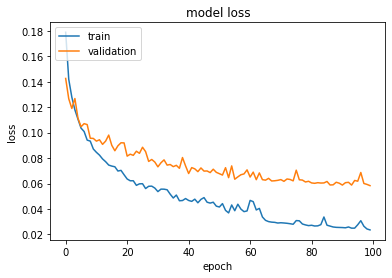

Model: "functional_1085"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_359 (InputLayer)       [(None, 3, 3, 3, 6)]      0         
_________________________________________________________________
conv3d_212 (Conv3D)          (None, 1, 1, 1, 150)      24450     
_________________________________________________________________
conv3d_213 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_214 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_215 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_358 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_216 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:02:23.079950: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:02:23.080113: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:02:23.841465: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:02:23.859776: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:02:23.860069: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:02:23.861113: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_02_23
2022-03-20 20:02:23.861673: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_02_23/vw.trace.json.gz
2022-03-20 20:02:23.861742: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:02:23.862533: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

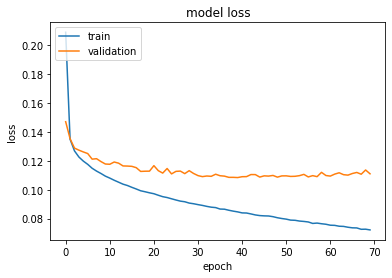

Model: "functional_1089"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_360 (InputLayer)       [(None, 3, 3, 3, 16)]     0         
_________________________________________________________________
conv3d_217 (Conv3D)          (None, 1, 1, 1, 150)      64950     
_________________________________________________________________
conv3d_218 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_219 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_220 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_359 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_221 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:03:00.361306: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:03:00.361419: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:03:01.164673: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:03:01.182873: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:03:01.183167: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:03:01.184199: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_03_01
2022-03-20 20:03:01.184734: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_03_01/vw.trace.json.gz
2022-03-20 20:03:01.184803: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:03:01.185575: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

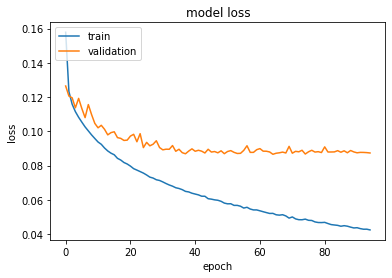

Model: "functional_1093"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_361 (InputLayer)       [(None, 3, 3, 3, 26)]     0         
_________________________________________________________________
conv3d_222 (Conv3D)          (None, 1, 1, 1, 150)      105450    
_________________________________________________________________
conv3d_223 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_224 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_225 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_360 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_226 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:03:55.036690: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:03:55.036823: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:03:55.840428: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:03:55.859598: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:03:55.859884: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:03:55.860934: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_03_55
2022-03-20 20:03:55.861492: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_03_55/vw.trace.json.gz
2022-03-20 20:03:55.861565: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:03:55.862394: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

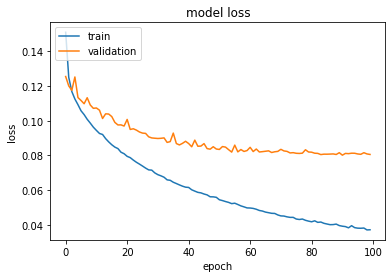

Model: "functional_1097"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_362 (InputLayer)       [(None, 3, 3, 3, 36)]     0         
_________________________________________________________________
conv3d_227 (Conv3D)          (None, 1, 1, 1, 150)      145950    
_________________________________________________________________
conv3d_228 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_229 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_230 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_361 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_231 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:05:00.923472: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:05:00.923564: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:05:02.388821: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:05:02.481269: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:05:02.485947: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:05:02.488160: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_05_02
2022-03-20 20:05:02.488802: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_05_02/vw.trace.json.gz
2022-03-20 20:05:02.489003: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:05:02.490749: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

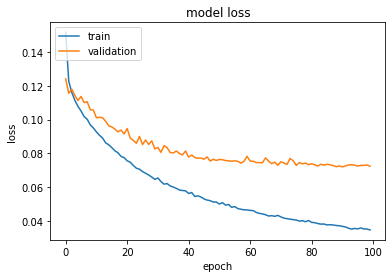

Model: "functional_1101"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_363 (InputLayer)       [(None, 3, 3, 3, 46)]     0         
_________________________________________________________________
conv3d_232 (Conv3D)          (None, 1, 1, 1, 150)      186450    
_________________________________________________________________
conv3d_233 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_234 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_235 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_362 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_236 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:06:14.134851: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:06:14.134931: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:06:15.334298: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:06:15.374280: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:06:15.375009: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:06:15.376620: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_06_15
2022-03-20 20:06:15.377215: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_06_15/vw.trace.json.gz
2022-03-20 20:06:15.377361: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:06:15.378696: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

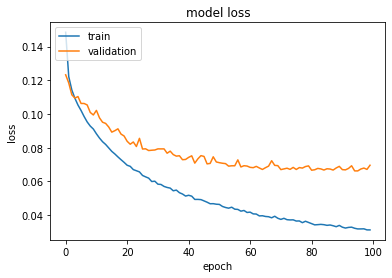

Model: "functional_1105"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_364 (InputLayer)       [(None, 3, 3, 3, 56)]     0         
_________________________________________________________________
conv3d_237 (Conv3D)          (None, 1, 1, 1, 150)      226950    
_________________________________________________________________
conv3d_238 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_239 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_240 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_363 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_241 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:07:36.088560: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:07:36.088655: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:07:37.240031: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:07:37.277331: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:07:37.277829: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:07:37.279315: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_07_37
2022-03-20 20:07:37.279892: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_07_37/vw.trace.json.gz
2022-03-20 20:07:37.280000: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:07:37.281014: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

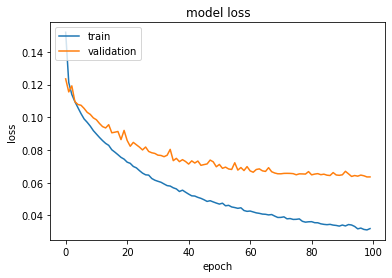

Model: "functional_1109"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_365 (InputLayer)       [(None, 3, 3, 3, 66)]     0         
_________________________________________________________________
conv3d_242 (Conv3D)          (None, 1, 1, 1, 150)      267450    
_________________________________________________________________
conv3d_243 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_244 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_245 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_364 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_246 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:09:04.937162: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:09:04.937247: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:09:06.041434: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:09:06.073944: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:09:06.074345: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:09:06.075566: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_09_06
2022-03-20 20:09:06.076143: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_09_06/vw.trace.json.gz
2022-03-20 20:09:06.076232: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:09:06.077186: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

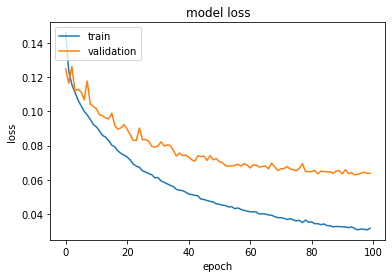

Model: "functional_1113"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_366 (InputLayer)       [(None, 3, 3, 3, 76)]     0         
_________________________________________________________________
conv3d_247 (Conv3D)          (None, 1, 1, 1, 150)      307950    
_________________________________________________________________
conv3d_248 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_249 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_250 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_365 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_251 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:10:42.851388: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:10:42.851501: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:10:43.907326: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:10:43.938016: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:10:43.938362: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:10:43.939623: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_10_43
2022-03-20 20:10:43.940199: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_10_43/vw.trace.json.gz
2022-03-20 20:10:43.940300: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:10:43.941196: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

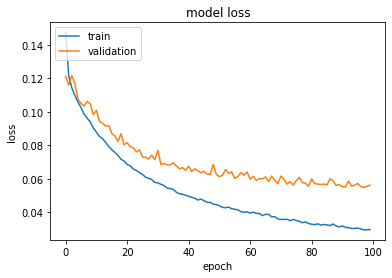

Model: "functional_1117"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_367 (InputLayer)       [(None, 3, 3, 3, 86)]     0         
_________________________________________________________________
conv3d_252 (Conv3D)          (None, 1, 1, 1, 150)      348450    
_________________________________________________________________
conv3d_253 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_254 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_255 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_366 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_256 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:12:33.178257: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:12:33.178349: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:12:34.218427: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:12:34.246348: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:12:34.246682: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:12:34.248099: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_12_34
2022-03-20 20:12:34.248671: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_12_34/vw.trace.json.gz
2022-03-20 20:12:34.248770: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:12:34.249693: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

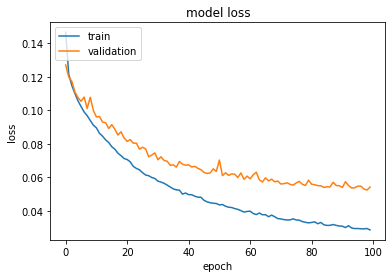

Model: "functional_1121"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_368 (InputLayer)       [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_257 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_258 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_259 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_260 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_367 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_261 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:14:33.865267: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:14:33.865349: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:14:34.879691: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:14:34.905833: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:14:34.906144: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:14:34.907270: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_14_34
2022-03-20 20:14:34.907827: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_14_34/vw.trace.json.gz
2022-03-20 20:14:34.907903: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:14:34.908766: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

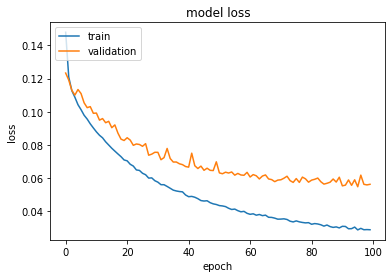

Model: "functional_1125"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_369 (InputLayer)       [(None, 3, 3, 3, 6)]      0         
_________________________________________________________________
conv3d_262 (Conv3D)          (None, 1, 1, 1, 150)      24450     
_________________________________________________________________
conv3d_263 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_264 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_265 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_368 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_266 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:16:43.773125: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:16:43.773281: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:16:44.640764: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:16:44.664331: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:16:44.664646: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:16:44.665800: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_16_44
2022-03-20 20:16:44.666411: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_16_44/vw.trace.json.gz
2022-03-20 20:16:44.666494: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:16:44.667410: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

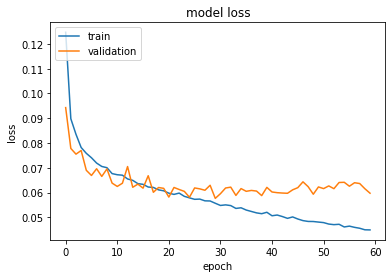

Model: "functional_1129"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_370 (InputLayer)       [(None, 3, 3, 3, 16)]     0         
_________________________________________________________________
conv3d_267 (Conv3D)          (None, 1, 1, 1, 150)      64950     
_________________________________________________________________
conv3d_268 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_269 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_270 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_369 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_271 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:17:16.851936: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:17:16.852116: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:17:17.680938: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:17:17.700424: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:17:17.700696: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:17:17.701728: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_17_17
2022-03-20 20:17:17.702314: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_17_17/vw.trace.json.gz
2022-03-20 20:17:17.702411: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:17:17.703258: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

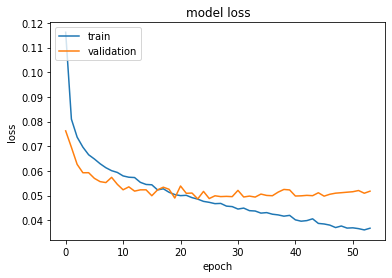

Model: "functional_1133"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_371 (InputLayer)       [(None, 3, 3, 3, 26)]     0         
_________________________________________________________________
conv3d_272 (Conv3D)          (None, 1, 1, 1, 150)      105450    
_________________________________________________________________
conv3d_273 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_274 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_275 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_370 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_276 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:17:50.154535: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:17:50.154640: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:17:51.003692: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:17:51.024375: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:17:51.024665: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:17:51.025742: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_17_51
2022-03-20 20:17:51.026323: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_17_51/vw.trace.json.gz
2022-03-20 20:17:51.026399: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:17:51.027245: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

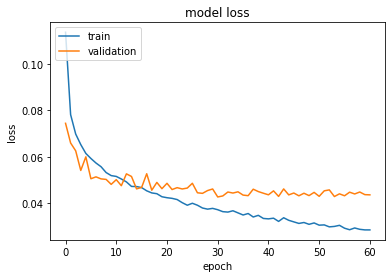

Model: "functional_1137"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_372 (InputLayer)       [(None, 3, 3, 3, 36)]     0         
_________________________________________________________________
conv3d_277 (Conv3D)          (None, 1, 1, 1, 150)      145950    
_________________________________________________________________
conv3d_278 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_279 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_280 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_371 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_281 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:18:32.299702: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:18:32.299881: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:18:33.159396: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:18:33.180025: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:18:33.180314: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:18:33.181399: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_18_33
2022-03-20 20:18:33.181983: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_18_33/vw.trace.json.gz
2022-03-20 20:18:33.182069: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:18:33.182949: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

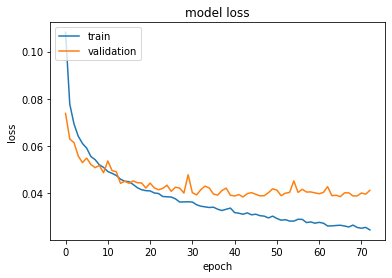

Model: "functional_1141"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_373 (InputLayer)       [(None, 3, 3, 3, 46)]     0         
_________________________________________________________________
conv3d_282 (Conv3D)          (None, 1, 1, 1, 150)      186450    
_________________________________________________________________
conv3d_283 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_284 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_285 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_372 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_286 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:19:27.130488: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:19:27.130576: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:19:27.987141: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:19:28.006646: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:19:28.006945: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:19:28.007996: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_19_28
2022-03-20 20:19:28.008551: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_19_28/vw.trace.json.gz
2022-03-20 20:19:28.008623: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:19:28.009424: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

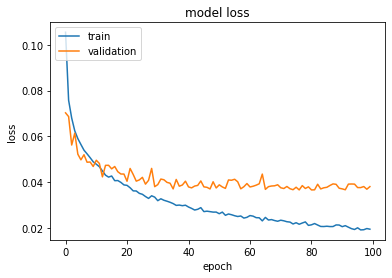

Model: "functional_1145"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_374 (InputLayer)       [(None, 3, 3, 3, 56)]     0         
_________________________________________________________________
conv3d_287 (Conv3D)          (None, 1, 1, 1, 150)      226950    
_________________________________________________________________
conv3d_288 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_289 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_290 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_373 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_291 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:20:48.209008: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:20:48.209145: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:20:49.076319: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:20:49.096387: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:20:49.096697: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:20:49.097813: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_20_49
2022-03-20 20:20:49.098399: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_20_49/vw.trace.json.gz
2022-03-20 20:20:49.098472: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:20:49.099304: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

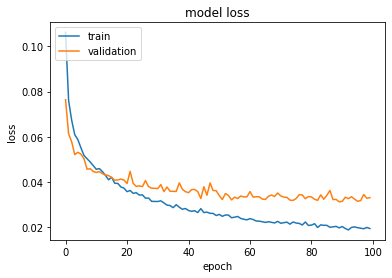

Model: "functional_1149"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_375 (InputLayer)       [(None, 3, 3, 3, 66)]     0         
_________________________________________________________________
conv3d_292 (Conv3D)          (None, 1, 1, 1, 150)      267450    
_________________________________________________________________
conv3d_293 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_294 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_295 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_374 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_296 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:22:15.971431: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:22:15.971541: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:22:16.854993: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:22:16.875013: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:22:16.875298: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:22:16.876365: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_22_16
2022-03-20 20:22:16.876943: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_22_16/vw.trace.json.gz
2022-03-20 20:22:16.877015: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:22:16.877814: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

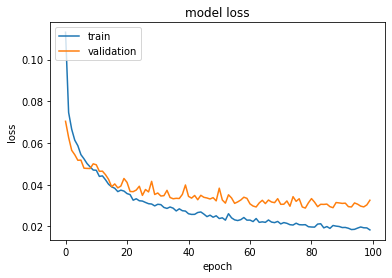

Model: "functional_1153"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_376 (InputLayer)       [(None, 3, 3, 3, 76)]     0         
_________________________________________________________________
conv3d_297 (Conv3D)          (None, 1, 1, 1, 150)      307950    
_________________________________________________________________
conv3d_298 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_299 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_300 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_375 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_301 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:23:52.543187: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:23:52.543372: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:23:53.411148: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:23:53.431051: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:23:53.431341: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:23:53.432406: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_23_53
2022-03-20 20:23:53.432969: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_23_53/vw.trace.json.gz
2022-03-20 20:23:53.433040: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:23:53.433848: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

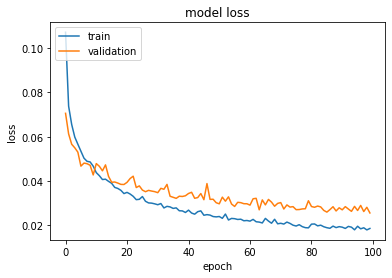

Model: "functional_1157"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_377 (InputLayer)       [(None, 3, 3, 3, 86)]     0         
_________________________________________________________________
conv3d_302 (Conv3D)          (None, 1, 1, 1, 150)      348450    
_________________________________________________________________
conv3d_303 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_304 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_305 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_376 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_306 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:25:39.175587: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:25:39.175703: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:25:40.073774: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:25:40.094504: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:25:40.094799: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:25:40.095916: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_25_40
2022-03-20 20:25:40.096486: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_25_40/vw.trace.json.gz
2022-03-20 20:25:40.096563: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:25:40.097377: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

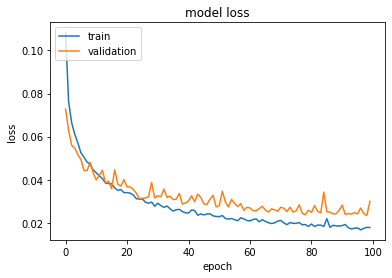

Model: "functional_1161"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_378 (InputLayer)       [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_307 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_308 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_309 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_310 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_377 (Dropout)        (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_311 (Conv3D)          (None, 1, 1, 1, 1)    

2022-03-20 20:27:36.451646: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:27:36.451751: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:27:37.375956: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:27:37.397243: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:27:37.397539: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:27:37.398605: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_27_37
2022-03-20 20:27:37.399157: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_27_37/vw.trace.json.gz
2022-03-20 20:27:37.399227: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:27:37.400033: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

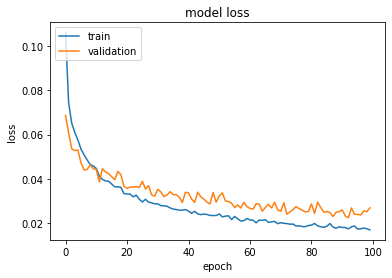

In [110]:
# define the list of parameters required to be trained and tested
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
# train
for param in params:
    # vary the input size; in this case becasue I know the max input size is 96
    for i in np.arange(start=6, stop=97, step=10):
        # specify the param to be trained and the size of the input
        train_cmd = "--train_subjects s01_still --model conv3d --layer 4 --train --label_type " + param[0] + " --DWI " + str(i)
        # for each training, plot the corresponding loss graph
        plot_loss(train_cmd)

In [111]:
# define the list of parameters required to be trained and tested
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
# test
for param in params:
    # vary the input size; in this case becasue I know the max input size is 96
    for i in np.arange(start=6, stop=97, step=10):
        # specify the param to be tested and the size of the test data
        test_cmd = "--test_subjects s02_still --model conv3d --layer 4 --label_type " + param[0] + " --DWI " + str(i)
        args = model_parser().parse_args(test_cmd.split())
        # test the trained model
        test_model(args)

6-conv3d-patch_3-base_1-layer_4-label_NDI
(84, 84, 50)
Model: "functional_1165"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_379 (InputLayer)       [(None, 84, 84, 50, 6)]   0         
_________________________________________________________________
conv3d_312 (Conv3D)          (None, 82, 82, 48, 150)   24450     
_________________________________________________________________
conv3d_313 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_314 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_315 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_378 (Dropout)        (None, 82, 82, 48, 150)   0         
______________________________________________________________

/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


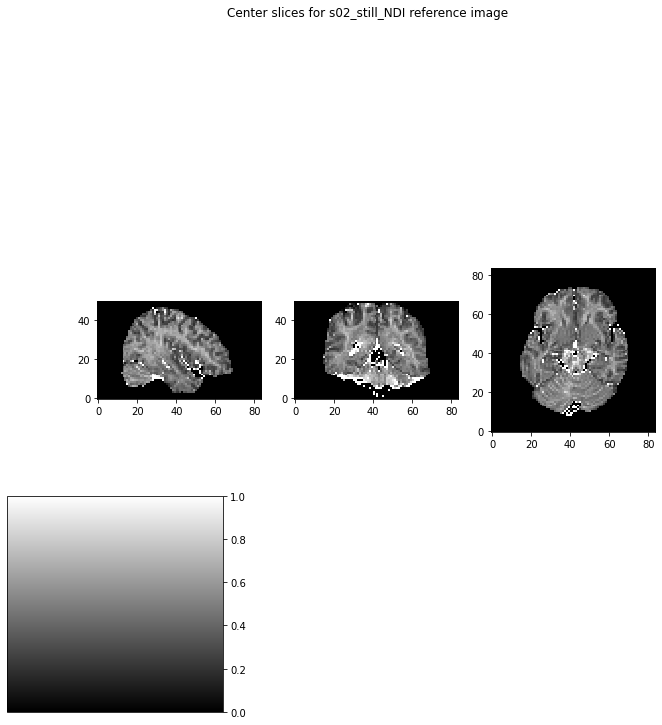

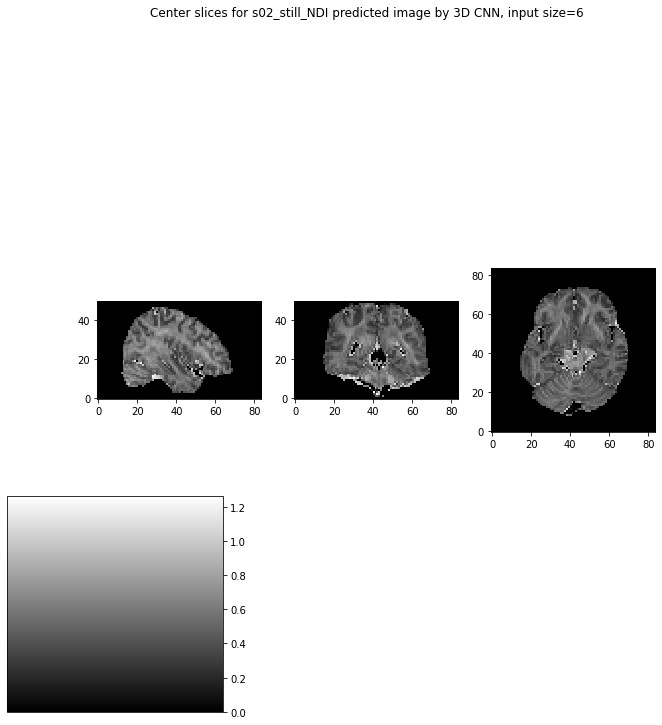

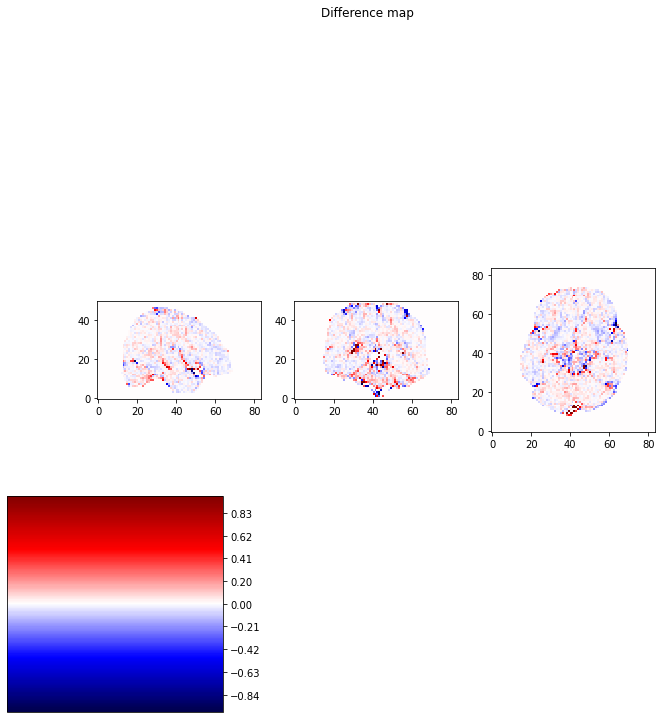

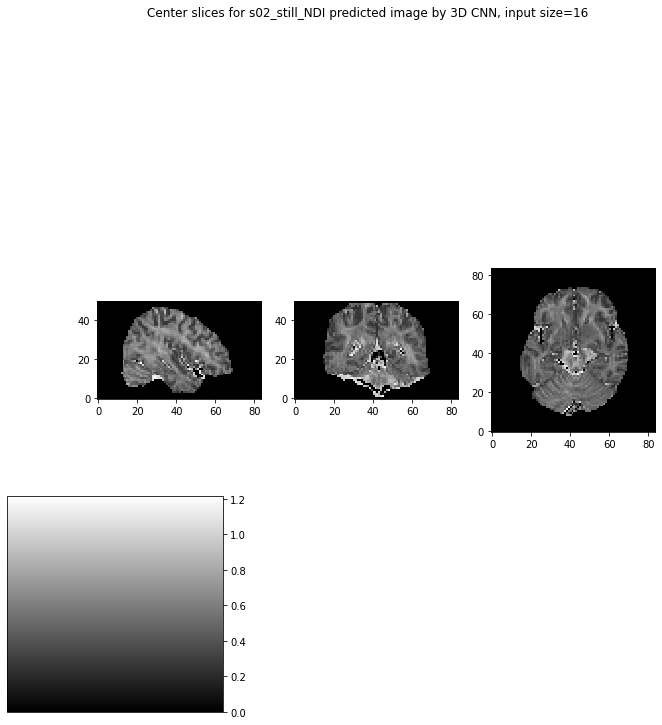

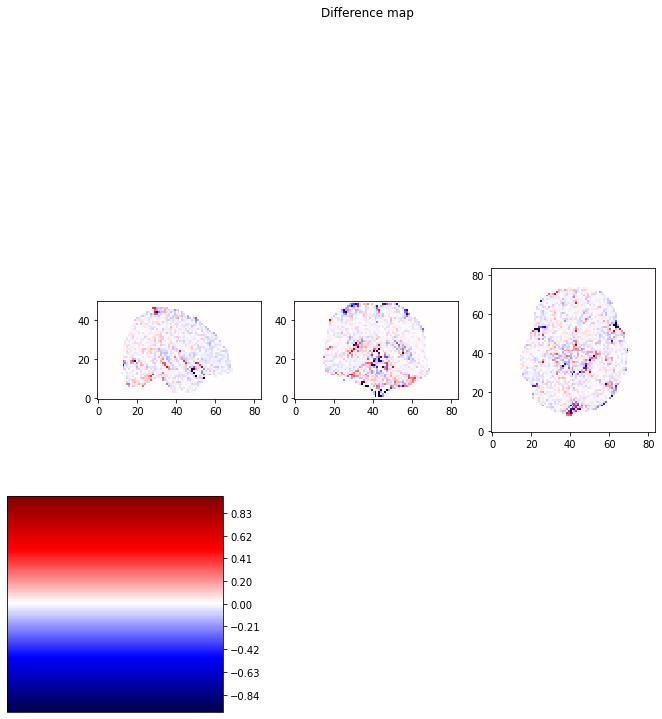

...

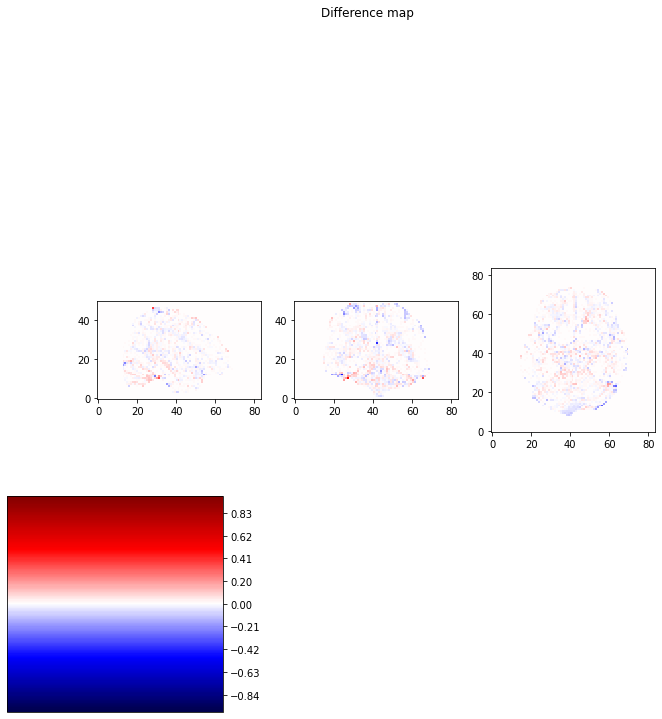

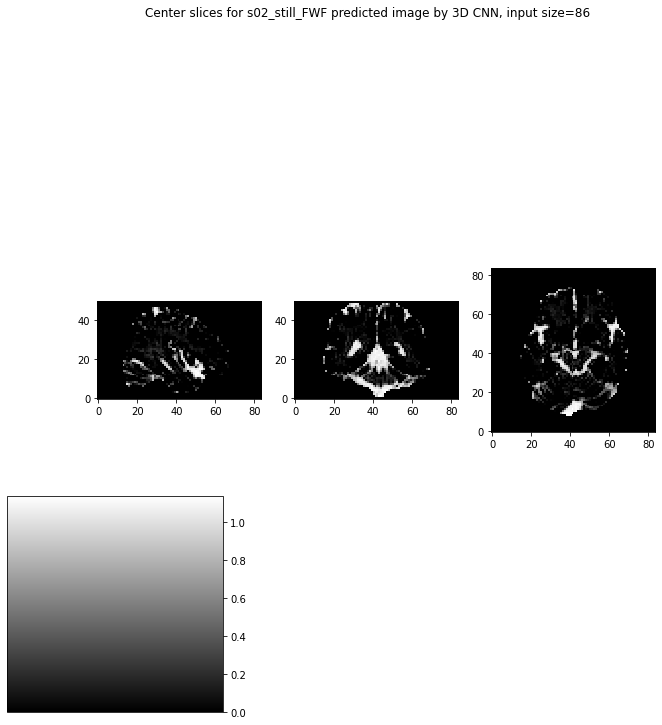

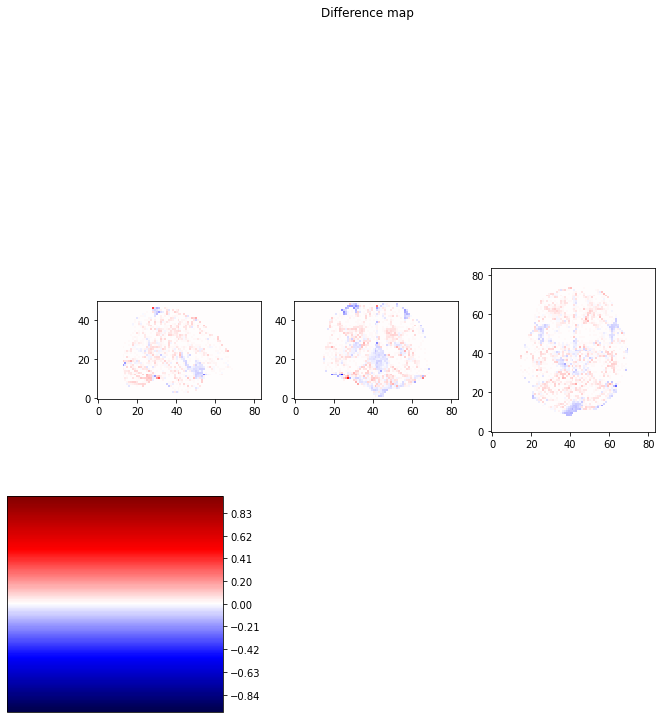

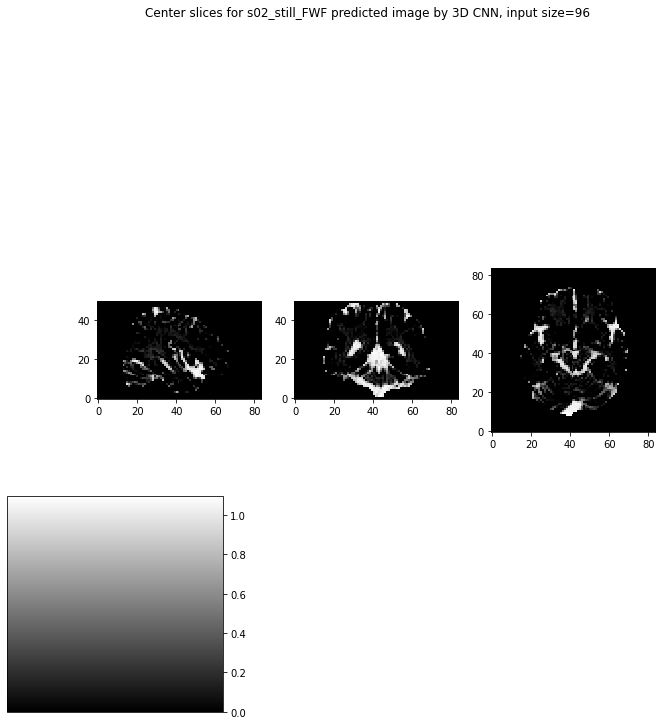

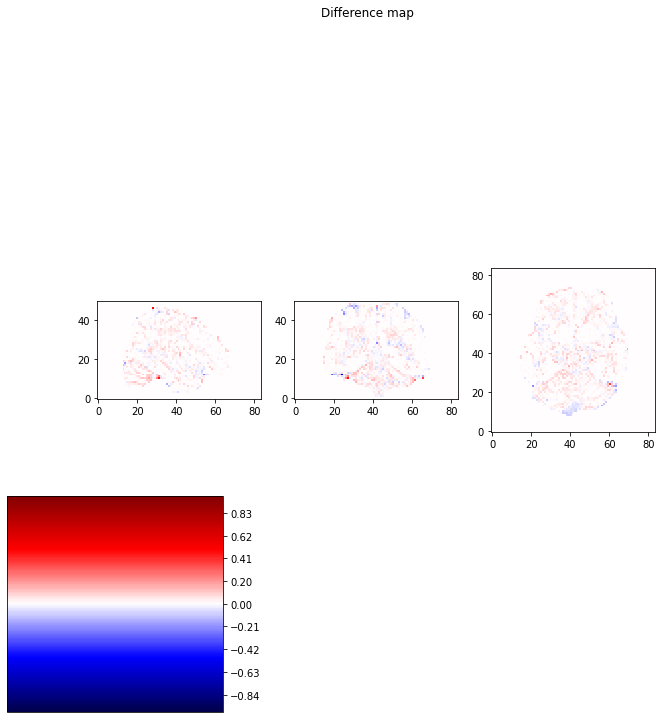

In [112]:
# plot each derived image
# specify the parameters
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
ref_img = [s02_NDI_img_data, s02_ODI_img_data, s02_FWF_img_data] # this is the ref img list
# iterate, so plot each param in order
for i in range (len(params)):
    # plot the reference img first
    ref_slice_0 = ref_img[i][26, :, :]
    ref_slice_1 = ref_img[i][:, 30, :]
    ref_slice_2 = ref_img[i][:, :, 16]
    show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
    plt.suptitle("Center slices for s02_still_" + params[i] + " reference image")
    
    for j in np.arange(start=6, stop=97, step=10):
        # plot the predicted imgs for different input size
        pred_path = '../Net/nii/s02_still-' + str(j)+'-conv3d-patch_3-base_1-layer_4-label_'+params[i]+'.nii'
        # load the img
        pred_img = nib.load(pred_path)
        # fetch the data
        pred_data = pred_img.get_fdata()

        # plot the pred img
        pred0 = pred_data[26, :, :]
        pred1 = pred_data[:, 30, :]
        pred2 = pred_data[:, :, 16]
        show_slices([pred0, pred1, pred2])
        plt.suptitle("Center slices for s02_still_" + params[i] + " predicted image by 3D CNN, input size="+str(j))

        # plot the difference img
        diff0 = ref_slice_0 - pred0
        diff1 = ref_slice_1 - pred1
        diff2 = ref_slice_2 - pred2
        show_slices([diff0, diff1, diff2], grayscale=False)
        plt.suptitle('Difference map')

5 Layer

Model: "functional_1225"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_409 (InputLayer)       [(None, 3, 3, 3, 6)]      0         
_________________________________________________________________
conv3d_462 (Conv3D)          (None, 1, 1, 1, 150)      24450     
_________________________________________________________________
conv3d_463 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_464 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_465 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_466 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_408 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:30:25.882068: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:30:25.882158: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:30:26.961350: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:30:27.149900: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:30:27.157007: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:30:27.158700: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_30_27
2022-03-20 20:30:27.159267: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_30_27/vw.trace.json.gz
2022-03-20 20:30:27.159409: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:30:27.160723: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

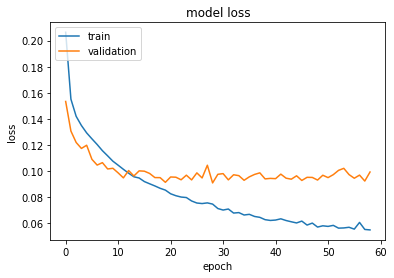

Model: "functional_1229"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_410 (InputLayer)       [(None, 3, 3, 3, 16)]     0         
_________________________________________________________________
conv3d_468 (Conv3D)          (None, 1, 1, 1, 150)      64950     
_________________________________________________________________
conv3d_469 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_470 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_471 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_472 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_409 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:31:02.550287: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:31:02.550428: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:31:03.692677: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:31:03.729454: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:31:03.729841: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:31:03.731244: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_31_03
2022-03-20 20:31:03.731823: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_31_03/vw.trace.json.gz
2022-03-20 20:31:03.731952: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:31:03.733057: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

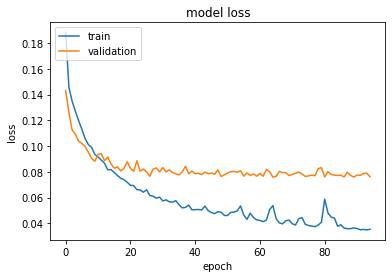

Model: "functional_1233"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_411 (InputLayer)       [(None, 3, 3, 3, 26)]     0         
_________________________________________________________________
conv3d_474 (Conv3D)          (None, 1, 1, 1, 150)      105450    
_________________________________________________________________
conv3d_475 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_476 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_477 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_478 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_410 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:32:04.455690: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:32:04.455779: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:32:05.540393: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:32:05.572795: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:32:05.573150: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:32:05.574413: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_32_05
2022-03-20 20:32:05.575004: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_32_05/vw.trace.json.gz
2022-03-20 20:32:05.575098: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:32:05.576007: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

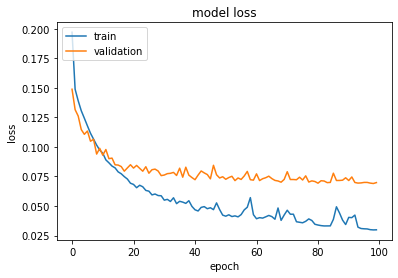

Model: "functional_1237"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_412 (InputLayer)       [(None, 3, 3, 3, 36)]     0         
_________________________________________________________________
conv3d_480 (Conv3D)          (None, 1, 1, 1, 150)      145950    
_________________________________________________________________
conv3d_481 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_482 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_483 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_484 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_411 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:33:17.613149: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:33:17.613268: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:33:18.667215: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:33:18.698547: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:33:18.698962: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:33:18.700233: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_33_18
2022-03-20 20:33:18.700806: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_33_18/vw.trace.json.gz
2022-03-20 20:33:18.700892: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:33:18.701749: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

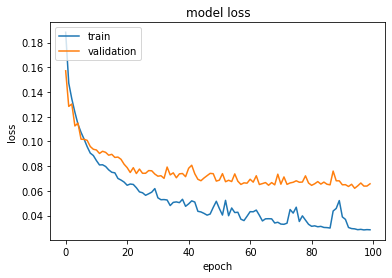

Model: "functional_1241"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_413 (InputLayer)       [(None, 3, 3, 3, 46)]     0         
_________________________________________________________________
conv3d_486 (Conv3D)          (None, 1, 1, 1, 150)      186450    
_________________________________________________________________
conv3d_487 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_488 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_489 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_490 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_412 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:34:37.335233: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:34:37.335398: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:34:38.371211: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:34:38.401867: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:34:38.402228: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:34:38.403483: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_34_38
2022-03-20 20:34:38.404075: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_34_38/vw.trace.json.gz
2022-03-20 20:34:38.404162: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:34:38.405034: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

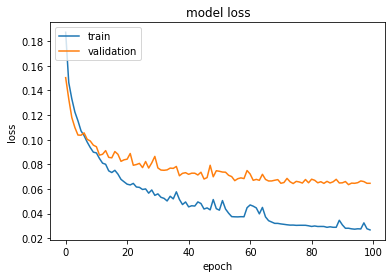

Model: "functional_1245"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_414 (InputLayer)       [(None, 3, 3, 3, 56)]     0         
_________________________________________________________________
conv3d_492 (Conv3D)          (None, 1, 1, 1, 150)      226950    
_________________________________________________________________
conv3d_493 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_494 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_495 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_496 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_413 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:36:05.457059: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:36:05.457177: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:36:06.467068: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:36:06.493542: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:36:06.493888: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:36:06.495141: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_36_06
2022-03-20 20:36:06.495724: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_36_06/vw.trace.json.gz
2022-03-20 20:36:06.495809: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:36:06.496697: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

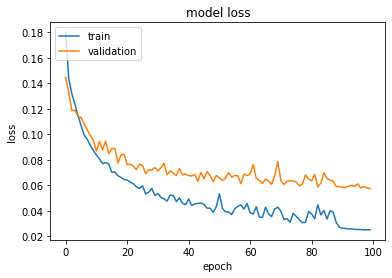

Model: "functional_1249"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_415 (InputLayer)       [(None, 3, 3, 3, 66)]     0         
_________________________________________________________________
conv3d_498 (Conv3D)          (None, 1, 1, 1, 150)      267450    
_________________________________________________________________
conv3d_499 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_500 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_501 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_502 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_414 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:37:41.231115: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:37:41.231199: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:37:42.222541: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:37:42.248156: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:37:42.248494: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:37:42.249630: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_37_42
2022-03-20 20:37:42.250229: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_37_42/vw.trace.json.gz
2022-03-20 20:37:42.250309: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:37:42.251149: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

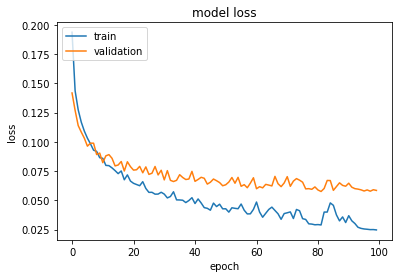

Model: "functional_1253"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_416 (InputLayer)       [(None, 3, 3, 3, 76)]     0         
_________________________________________________________________
conv3d_504 (Conv3D)          (None, 1, 1, 1, 150)      307950    
_________________________________________________________________
conv3d_505 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_506 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_507 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_508 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_415 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:39:24.764803: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:39:24.764935: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:39:25.753949: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:39:25.779290: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:39:25.779624: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:39:25.780753: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_39_25
2022-03-20 20:39:25.781346: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_39_25/vw.trace.json.gz
2022-03-20 20:39:25.781426: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:39:25.782288: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

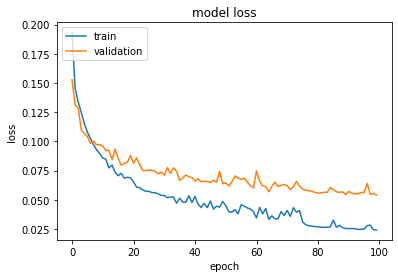

Model: "functional_1257"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_417 (InputLayer)       [(None, 3, 3, 3, 86)]     0         
_________________________________________________________________
conv3d_510 (Conv3D)          (None, 1, 1, 1, 150)      348450    
_________________________________________________________________
conv3d_511 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_512 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_513 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_514 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_416 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:41:18.606072: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:41:18.606215: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:41:19.575154: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:41:19.599630: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:41:19.600109: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:41:19.601451: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_41_19
2022-03-20 20:41:19.602018: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_41_19/vw.trace.json.gz
2022-03-20 20:41:19.602107: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:41:19.602943: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

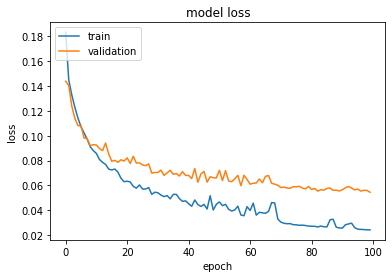

Model: "functional_1261"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_418 (InputLayer)       [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_516 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_517 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_518 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_519 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_520 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_417 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:43:22.460310: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:43:22.460416: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:43:23.438937: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:43:23.462163: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:43:23.462467: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:43:23.463586: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_43_23
2022-03-20 20:43:23.464192: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_43_23/vw.trace.json.gz
2022-03-20 20:43:23.464271: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:43:23.465146: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

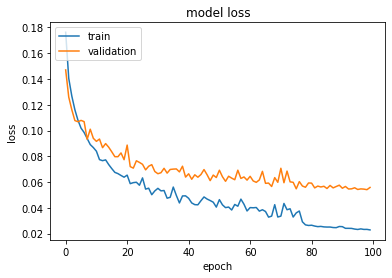

Model: "functional_1265"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_419 (InputLayer)       [(None, 3, 3, 3, 6)]      0         
_________________________________________________________________
conv3d_522 (Conv3D)          (None, 1, 1, 1, 150)      24450     
_________________________________________________________________
conv3d_523 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_524 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_525 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_526 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_418 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:45:37.259518: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:45:37.259637: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:45:38.111698: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:45:38.132274: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:45:38.132571: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:45:38.133661: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_45_38
2022-03-20 20:45:38.134254: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_45_38/vw.trace.json.gz
2022-03-20 20:45:38.134341: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:45:38.135197: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

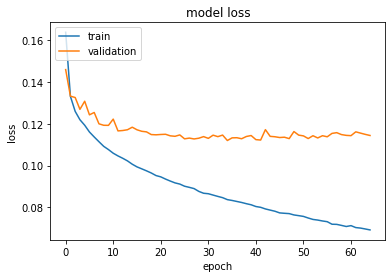

Model: "functional_1269"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_420 (InputLayer)       [(None, 3, 3, 3, 16)]     0         
_________________________________________________________________
conv3d_528 (Conv3D)          (None, 1, 1, 1, 150)      64950     
_________________________________________________________________
conv3d_529 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_530 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_531 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_532 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_419 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:46:16.964070: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:46:16.964189: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:46:17.826573: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:46:17.846300: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:46:17.846600: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:46:17.847697: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_46_17
2022-03-20 20:46:17.848263: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_46_17/vw.trace.json.gz
2022-03-20 20:46:17.848336: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:46:17.849162: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

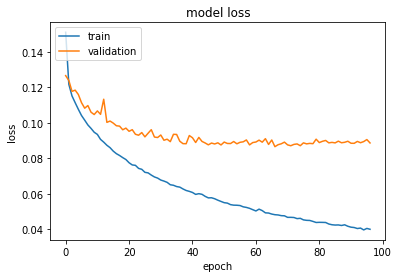

Model: "functional_1273"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_421 (InputLayer)       [(None, 3, 3, 3, 26)]     0         
_________________________________________________________________
conv3d_534 (Conv3D)          (None, 1, 1, 1, 150)      105450    
_________________________________________________________________
conv3d_535 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_536 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_537 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_538 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_420 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:47:19.717910: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:47:19.718036: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:47:20.607933: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:47:20.627760: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:47:20.628058: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:47:20.629142: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_47_20
2022-03-20 20:47:20.629719: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_47_20/vw.trace.json.gz
2022-03-20 20:47:20.629802: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:47:20.630677: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

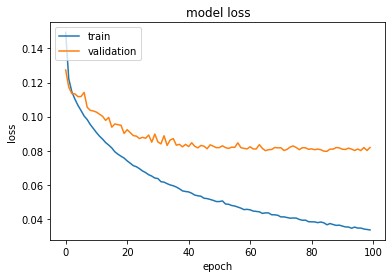

Model: "functional_1277"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_422 (InputLayer)       [(None, 3, 3, 3, 36)]     0         
_________________________________________________________________
conv3d_540 (Conv3D)          (None, 1, 1, 1, 150)      145950    
_________________________________________________________________
conv3d_541 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_542 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_543 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_544 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_421 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:48:32.801483: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:48:32.801566: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:48:33.699238: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:48:33.720073: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:48:33.720371: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:48:33.721458: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_48_33
2022-03-20 20:48:33.722032: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_48_33/vw.trace.json.gz
2022-03-20 20:48:33.722116: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:48:33.722945: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

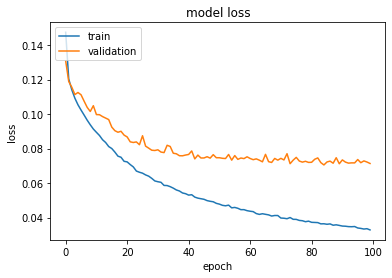

Model: "functional_1281"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_423 (InputLayer)       [(None, 3, 3, 3, 46)]     0         
_________________________________________________________________
conv3d_546 (Conv3D)          (None, 1, 1, 1, 150)      186450    
_________________________________________________________________
conv3d_547 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_548 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_549 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_550 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_422 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:49:52.768241: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:49:52.768328: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:49:53.685061: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:49:53.705795: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:49:53.706105: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:49:53.707226: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_49_53
2022-03-20 20:49:53.707832: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_49_53/vw.trace.json.gz
2022-03-20 20:49:53.707922: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:49:53.708786: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

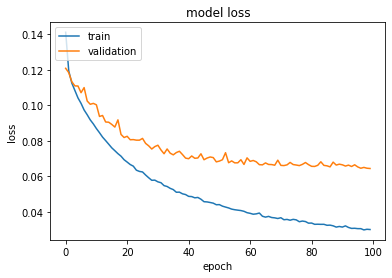

Model: "functional_1285"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_424 (InputLayer)       [(None, 3, 3, 3, 56)]     0         
_________________________________________________________________
conv3d_552 (Conv3D)          (None, 1, 1, 1, 150)      226950    
_________________________________________________________________
conv3d_553 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_554 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_555 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_556 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_423 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:51:20.899705: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:51:20.899801: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:51:21.834822: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:51:21.856589: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:51:21.856902: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:51:21.858040: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_51_21
2022-03-20 20:51:21.858660: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_51_21/vw.trace.json.gz
2022-03-20 20:51:21.858735: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:51:21.859598: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

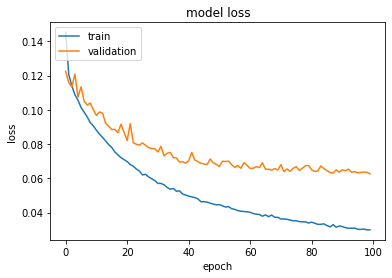

Model: "functional_1289"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_425 (InputLayer)       [(None, 3, 3, 3, 66)]     0         
_________________________________________________________________
conv3d_558 (Conv3D)          (None, 1, 1, 1, 150)      267450    
_________________________________________________________________
conv3d_559 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_560 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_561 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_562 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_424 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:52:57.023864: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:52:57.023976: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:52:59.194632: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:52:59.247275: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:52:59.251274: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:52:59.253431: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_52_59
2022-03-20 20:52:59.254041: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_52_59/vw.trace.json.gz
2022-03-20 20:52:59.254218: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:52:59.255770: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

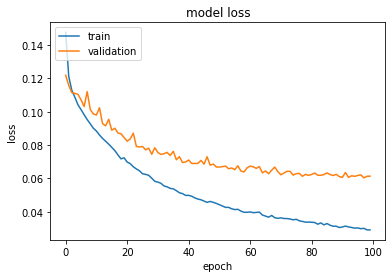

Model: "functional_1293"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_426 (InputLayer)       [(None, 3, 3, 3, 76)]     0         
_________________________________________________________________
conv3d_564 (Conv3D)          (None, 1, 1, 1, 150)      307950    
_________________________________________________________________
conv3d_565 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_566 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_567 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_568 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_425 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:54:43.614954: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:54:43.615041: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:54:45.028816: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:54:45.084655: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:54:45.085176: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:54:45.087052: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_54_45
2022-03-20 20:54:45.087683: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_54_45/vw.trace.json.gz
2022-03-20 20:54:45.087844: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:54:45.089253: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

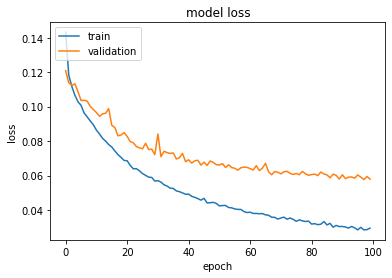

Model: "functional_1297"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_427 (InputLayer)       [(None, 3, 3, 3, 86)]     0         
_________________________________________________________________
conv3d_570 (Conv3D)          (None, 1, 1, 1, 150)      348450    
_________________________________________________________________
conv3d_571 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_572 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_573 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_574 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_426 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:56:40.422887: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:56:40.423026: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:56:41.753482: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:56:41.795746: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:56:41.796163: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:56:41.797797: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_56_41
2022-03-20 20:56:41.798423: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_56_41/vw.trace.json.gz
2022-03-20 20:56:41.798537: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:56:41.799649: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

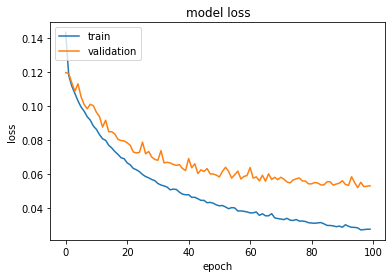

Model: "functional_1301"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_428 (InputLayer)       [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_576 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_577 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_578 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_579 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_580 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_427 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 20:58:47.034985: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:58:47.035104: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 20:58:48.342826: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 20:58:48.380994: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 20:58:48.381392: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 20:58:48.383384: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_20_58_48
2022-03-20 20:58:48.383995: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_20_58_48/vw.trace.json.gz
2022-03-20 20:58:48.384099: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 20:58:48.385127: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

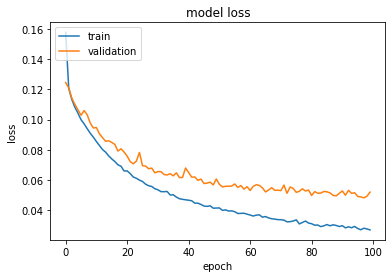

Model: "functional_1305"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_429 (InputLayer)       [(None, 3, 3, 3, 6)]      0         
_________________________________________________________________
conv3d_582 (Conv3D)          (None, 1, 1, 1, 150)      24450     
_________________________________________________________________
conv3d_583 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_584 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_585 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_586 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_428 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 21:01:02.787315: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:01:02.787427: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:01:03.890331: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:01:03.921922: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:01:03.922256: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:01:03.923572: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_01_03
2022-03-20 21:01:03.924174: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_01_03/vw.trace.json.gz
2022-03-20 21:01:03.924267: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:01:03.925295: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

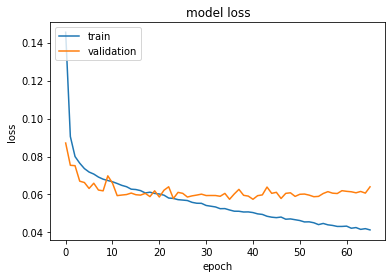

Model: "functional_1309"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_430 (InputLayer)       [(None, 3, 3, 3, 16)]     0         
_________________________________________________________________
conv3d_588 (Conv3D)          (None, 1, 1, 1, 150)      64950     
_________________________________________________________________
conv3d_589 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_590 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_591 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_592 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_429 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 21:01:43.953052: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:01:43.953142: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:01:45.033093: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:01:45.061735: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:01:45.062088: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:01:45.063399: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_01_45
2022-03-20 21:01:45.064039: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_01_45/vw.trace.json.gz
2022-03-20 21:01:45.064151: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:01:45.065154: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

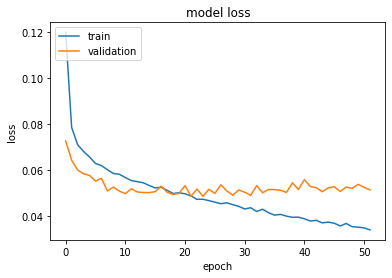

Model: "functional_1313"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_431 (InputLayer)       [(None, 3, 3, 3, 26)]     0         
_________________________________________________________________
conv3d_594 (Conv3D)          (None, 1, 1, 1, 150)      105450    
_________________________________________________________________
conv3d_595 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_596 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_597 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_598 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_430 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 21:02:20.737354: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:02:20.737438: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:02:21.793511: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:02:21.821480: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:02:21.821816: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:02:21.823049: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_02_21
2022-03-20 21:02:21.823686: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_02_21/vw.trace.json.gz
2022-03-20 21:02:21.823772: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:02:21.824716: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

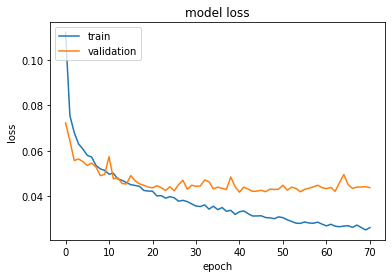

Model: "functional_1317"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_432 (InputLayer)       [(None, 3, 3, 3, 36)]     0         
_________________________________________________________________
conv3d_600 (Conv3D)          (None, 1, 1, 1, 150)      145950    
_________________________________________________________________
conv3d_601 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_602 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_603 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_604 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_431 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 21:03:14.968389: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:03:14.968548: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:03:16.026262: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:03:16.055382: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:03:16.055713: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:03:16.056952: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_03_16
2022-03-20 21:03:16.057591: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_03_16/vw.trace.json.gz
2022-03-20 21:03:16.057679: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:03:16.058695: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

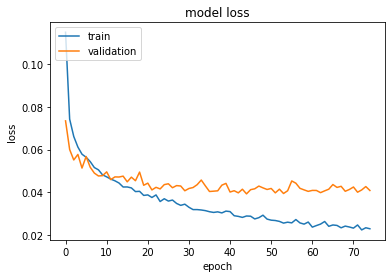

Model: "functional_1321"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_433 (InputLayer)       [(None, 3, 3, 3, 46)]     0         
_________________________________________________________________
conv3d_606 (Conv3D)          (None, 1, 1, 1, 150)      186450    
_________________________________________________________________
conv3d_607 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_608 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_609 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_610 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_432 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 21:04:16.921667: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:04:16.921750: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:04:17.948821: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:04:17.974953: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:04:17.975304: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:04:17.976527: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_04_17
2022-03-20 21:04:17.977159: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_04_17/vw.trace.json.gz
2022-03-20 21:04:17.977242: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:04:17.978198: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

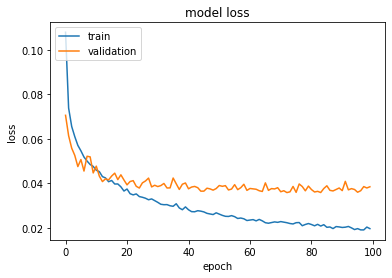

Model: "functional_1325"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_434 (InputLayer)       [(None, 3, 3, 3, 56)]     0         
_________________________________________________________________
conv3d_612 (Conv3D)          (None, 1, 1, 1, 150)      226950    
_________________________________________________________________
conv3d_613 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_614 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_615 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_616 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_433 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 21:05:46.683902: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:05:46.684016: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:05:47.753080: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:05:47.777399: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:05:47.777711: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:05:47.778902: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_05_47
2022-03-20 21:05:47.779521: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_05_47/vw.trace.json.gz
2022-03-20 21:05:47.779615: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:05:47.780557: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

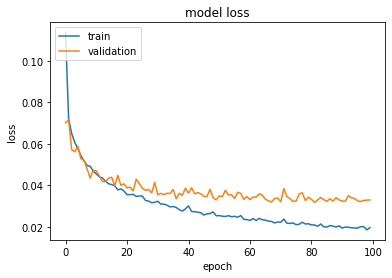

Model: "functional_1329"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_435 (InputLayer)       [(None, 3, 3, 3, 66)]     0         
_________________________________________________________________
conv3d_618 (Conv3D)          (None, 1, 1, 1, 150)      267450    
_________________________________________________________________
conv3d_619 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_620 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_621 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_622 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_434 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 21:07:23.430443: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:07:23.430522: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:07:24.453225: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:07:24.476433: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:07:24.476742: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:07:24.477894: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_07_24
2022-03-20 21:07:24.478530: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_07_24/vw.trace.json.gz
2022-03-20 21:07:24.478608: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:07:24.479504: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

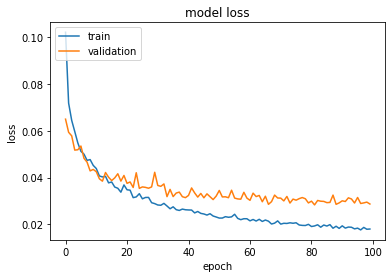

Model: "functional_1333"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_436 (InputLayer)       [(None, 3, 3, 3, 76)]     0         
_________________________________________________________________
conv3d_624 (Conv3D)          (None, 1, 1, 1, 150)      307950    
_________________________________________________________________
conv3d_625 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_626 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_627 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_628 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_435 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 21:09:08.602914: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:09:08.603054: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:09:09.615348: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:09:09.638712: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:09:09.639021: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:09:09.640215: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_09_09
2022-03-20 21:09:09.640857: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_09_09/vw.trace.json.gz
2022-03-20 21:09:09.640937: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:09:09.641837: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

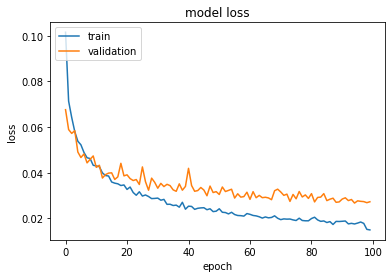

Model: "functional_1337"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_437 (InputLayer)       [(None, 3, 3, 3, 86)]     0         
_________________________________________________________________
conv3d_630 (Conv3D)          (None, 1, 1, 1, 150)      348450    
_________________________________________________________________
conv3d_631 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_632 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_633 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_634 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_436 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 21:11:04.136519: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:11:04.136617: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:11:05.159605: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:11:05.182932: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:11:05.183242: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:11:05.184409: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_11_05
2022-03-20 21:11:05.185056: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_11_05/vw.trace.json.gz
2022-03-20 21:11:05.185139: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:11:05.186026: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

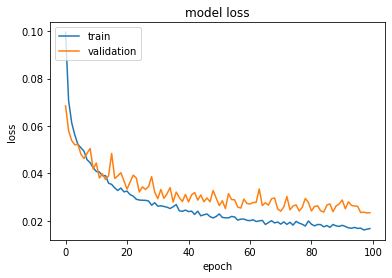

Model: "functional_1341"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_438 (InputLayer)       [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_636 (Conv3D)          (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_637 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_638 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_639 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_640 (Conv3D)          (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_437 (Dropout)        (None, 1, 1, 1, 150)  

2022-03-20 21:13:09.635320: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:13:09.635455: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:13:10.645918: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:13:10.670801: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:13:10.671106: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:13:10.672271: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_13_10
2022-03-20 21:13:10.672903: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_13_10/vw.trace.json.gz
2022-03-20 21:13:10.672983: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:13:10.673857: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

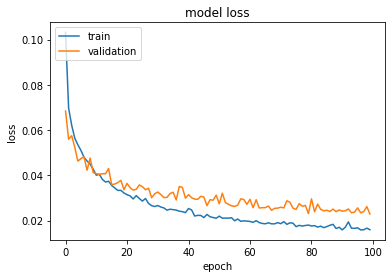

In [113]:
# define the list of parameters required to be trained and tested
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
# train
for param in params:
    # vary the input size; in this case becasue I know the max input size is 96
    for i in np.arange(start=6, stop=97, step=10):
        # specify the param to be trained and the size of the input
        train_cmd = "--train_subjects s01_still --model conv3d --layer 5 --train --label_type " + param[0] + " --DWI " + str(i)
        # for each training, plot the corresponding loss graph
        plot_loss(train_cmd)

In [114]:
# define the list of parameters required to be trained and tested
params = ['NDI', 'ODI', 'FWF'] # this is for NODDI
# test
for param in params:
    # vary the input size; in this case becasue I know the max input size is 96
    for i in np.arange(start=6, stop=97, step=10):
        # specify the param to be tested and the size of the test data
        test_cmd = "--test_subjects s02_still --model conv3d --layer 5 --label_type " + param[0] + " --DWI " + str(i)
        args = model_parser().parse_args(test_cmd.split())
        # test the trained model
        test_model(args)

6-conv3d-patch_3-base_1-layer_5-label_NDI
(84, 84, 50)
Model: "functional_1345"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_439 (InputLayer)       [(None, 84, 84, 50, 6)]   0         
_________________________________________________________________
conv3d_642 (Conv3D)          (None, 82, 82, 48, 150)   24450     
_________________________________________________________________
conv3d_643 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_644 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_645 (Conv3D)          (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_646 (Conv3D)          (None, 82, 82, 48, 150)   22650     
______________________________________________________________

___

<h3>Test the overall performance of each network with varied number of DWI images as input size</h3>

Each network would have 4 hidden layers. This choice is suggested from the obtained results from the experiments above. 4 hidden layer shows a promising result for each NODDI derived parameter.

<h4>Data Preprocessing</h4>

In [115]:
"""
Generate the base dataset all labels for s01_still and s02_still first.
"""
cmd = "--base --label_type A --subjects s01_still s02_still"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
base data dataset has shape: (84, 84, 50, 96)
base label dataset has shape: (84, 84, 50, 3)
Generating for s02_still ...
base data dataset has shape: (84, 84, 50, 96)
base label dataset has shape: (84, 84, 50, 3)


In [116]:
"""
Generate training dataset All labels for ANN.
"""
cmd = "--subjects s01_still --fc1d --label_type A"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (352800,)
data befor masking has shape: (352800, 96)
data after masking has shape: (82889, 96) the ratio of masked voxel is: 0.23494614512471657
training dataset has shape:(82889, 96)
mask has shape: (352800,)
data befor masking has shape: (352800, 3)
data after masking has shape: (82889, 3) the ratio of masked voxel is: 0.23494614512471657
training label has shape:(82889, 3)


In [117]:
"""
Generate training dataset All labels for 2D CNN.
"""
cmd = "--subjects s01_still --conv2d --label_type A"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (82, 82, 48)
data has shape: (84, 84, 48, 96)
label has shape: (82, 82, 48, 3)
(82641, 3, 3, 96)
saved patches has shape: (82641, 3, 3, 96)
(82641, 1, 1, 3)
svaed labels has shape: (82641, 1, 1, 3)


In [118]:
"""
Generate training dataset All labels for 3D CNN.
"""
cmd = "--subjects s01_still --conv3d --label_type A"
args = data_parser().parse_args(cmd.split())
generate_data(args)

Generating for s01_still ...
mask has shape: (82, 82, 48)
data has shape: (84, 84, 50, 96)
label has shape: (82, 82, 48, 3)
(84, 84, 50, 96) (82, 82, 48)
(82641, 3, 3, 3, 96)
saved patches has shape: (82641, 2592)
(82, 82, 48, 3) (82, 82, 48)
(82641, 1, 1, 1, 3)
svaed labels has shape: (82641, 1, 1, 1, 3)


ANN

Model: "functional_1405"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_469 (InputLayer)       [(None, 6)]               0         
_________________________________________________________________
dense_666 (Dense)            (None, 150)               1050      
_________________________________________________________________
dense_667 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_668 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_669 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_468 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-03-20 21:16:12.168073: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:16:12.168175: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:16:13.863818: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.


2022-03-20 21:16:14.080804: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:16:14.090923: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:16:14.099245: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_16_14
2022-03-20 21:16:14.099905: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_16_14/vw.trace.json.gz
2022-03-20 21:16:14.100152: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:16:14.101731: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_16_14
2022-03-20 21:16:14.101806: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped 

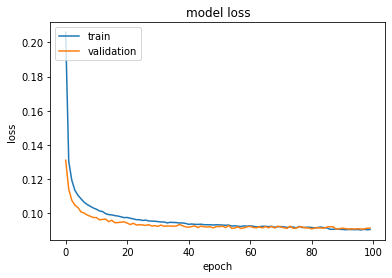

Model: "functional_1409"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_470 (InputLayer)       [(None, 16)]              0         
_________________________________________________________________
dense_670 (Dense)            (None, 150)               2550      
_________________________________________________________________
dense_671 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_672 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_673 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_469 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-03-20 21:16:44.398660: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:16:44.398736: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:16:45.827000: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:16:45.876543: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:16:45.877396: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:16:45.879492: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_16_45
2022-03-20 21:16:45.880084: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_16_45/vw.trace.json.gz
2022-03-20 21:16:45.880336: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:16:45.881779: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

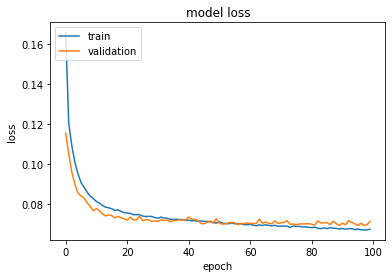

Model: "functional_1413"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_471 (InputLayer)       [(None, 26)]              0         
_________________________________________________________________
dense_674 (Dense)            (None, 150)               4050      
_________________________________________________________________
dense_675 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_676 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_677 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_470 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-03-20 21:17:17.773174: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:17:17.773258: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:17:19.201270: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:17:19.241451: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:17:19.242010: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:17:19.243976: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_17_19
2022-03-20 21:17:19.244588: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_17_19/vw.trace.json.gz
2022-03-20 21:17:19.244765: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:17:19.245956: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

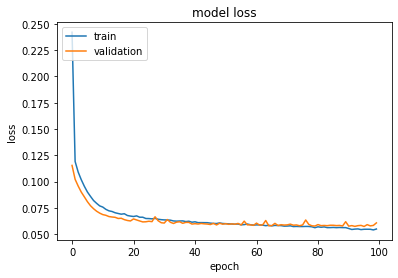

Model: "functional_1417"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_472 (InputLayer)       [(None, 36)]              0         
_________________________________________________________________
dense_678 (Dense)            (None, 150)               5550      
_________________________________________________________________
dense_679 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_680 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_681 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_471 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-03-20 21:17:51.796745: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:17:51.796853: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:17:53.112900: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:17:53.166841: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:17:53.167349: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:17:53.169246: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_17_53
2022-03-20 21:17:53.169960: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_17_53/vw.trace.json.gz
2022-03-20 21:17:53.170117: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:17:53.171524: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

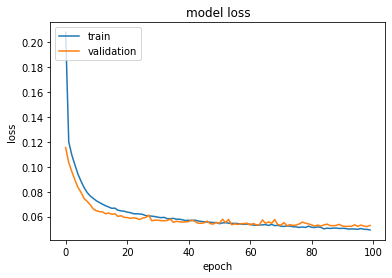

Model: "functional_1421"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_473 (InputLayer)       [(None, 46)]              0         
_________________________________________________________________
dense_682 (Dense)            (None, 150)               7050      
_________________________________________________________________
dense_683 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_684 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_685 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_472 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-03-20 21:18:26.221651: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:18:26.221755: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:18:27.455865: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:18:27.488127: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:18:27.488710: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:18:27.490198: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_18_27
2022-03-20 21:18:27.490752: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_18_27/vw.trace.json.gz
2022-03-20 21:18:27.490863: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:18:27.491806: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

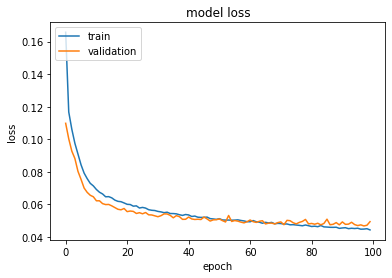

Model: "functional_1425"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_474 (InputLayer)       [(None, 56)]              0         
_________________________________________________________________
dense_686 (Dense)            (None, 150)               8550      
_________________________________________________________________
dense_687 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_688 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_689 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_473 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-03-20 21:19:00.475384: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:19:00.475485: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:19:01.688476: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:19:01.715433: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:19:01.715768: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:19:01.717093: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_19_01
2022-03-20 21:19:01.717665: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_19_01/vw.trace.json.gz
2022-03-20 21:19:01.717754: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:19:01.718686: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

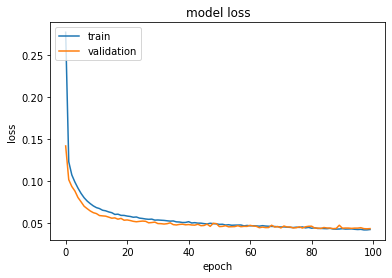

Model: "functional_1429"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_475 (InputLayer)       [(None, 66)]              0         
_________________________________________________________________
dense_690 (Dense)            (None, 150)               10050     
_________________________________________________________________
dense_691 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_692 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_693 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_474 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-03-20 21:19:34.841789: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:19:34.841883: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:19:36.130561: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:19:36.162201: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:19:36.162648: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:19:36.164156: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_19_36
2022-03-20 21:19:36.164778: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_19_36/vw.trace.json.gz
2022-03-20 21:19:36.164942: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:19:36.166144: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

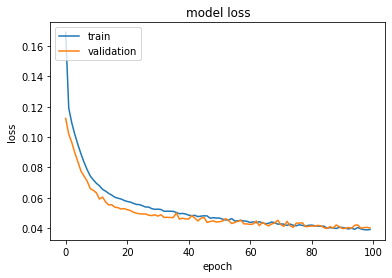

Model: "functional_1433"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_476 (InputLayer)       [(None, 76)]              0         
_________________________________________________________________
dense_694 (Dense)            (None, 150)               11550     
_________________________________________________________________
dense_695 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_696 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_697 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_475 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-03-20 21:20:09.625546: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:20:09.625643: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:20:10.764574: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:20:10.790904: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:20:10.791269: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:20:10.792499: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_20_10
2022-03-20 21:20:10.793014: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_20_10/vw.trace.json.gz
2022-03-20 21:20:10.793099: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:20:10.793990: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

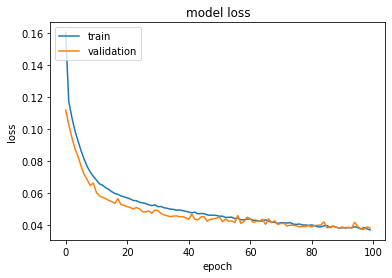

Model: "functional_1437"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_477 (InputLayer)       [(None, 86)]              0         
_________________________________________________________________
dense_698 (Dense)            (None, 150)               13050     
_________________________________________________________________
dense_699 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_700 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_701 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_476 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-03-20 21:20:44.031635: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:20:44.031742: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:20:45.121887: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:20:45.144967: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:20:45.145284: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:20:45.146444: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_20_45
2022-03-20 21:20:45.146978: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_20_45/vw.trace.json.gz
2022-03-20 21:20:45.147063: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:20:45.147968: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

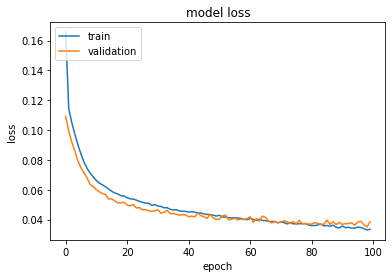

Model: "functional_1441"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_478 (InputLayer)       [(None, 96)]              0         
_________________________________________________________________
dense_702 (Dense)            (None, 150)               14550     
_________________________________________________________________
dense_703 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_704 (Dense)            (None, 150)               22650     
_________________________________________________________________
dense_705 (Dense)            (None, 150)               22650     
_________________________________________________________________
dropout_477 (Dropout)        (None, 150)               0         
_________________________________________________________________
output (Dense)               (None, 3)             

2022-03-20 21:21:18.841107: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:21:18.841237: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 21:21:19.913945: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 21:21:19.936139: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 21:21:19.936481: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 21:21:19.937633: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_21_21_19
2022-03-20 21:21:19.938163: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_21_21_19/vw.trace.json.gz
2022-03-20 21:21:19.938253: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 21:21:19.939117: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

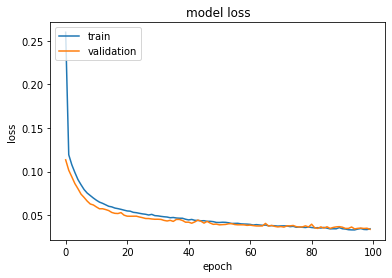

In [119]:
for i in np.arange(start=6, stop=97, step=10):
    # train the network with varied number of input size
    cmd = "--train_subjects s01_still --model fc1d --layer 4 --train --label_type A --DWI " + str(i)
    plot_loss(cmd)

In [8]:
for i in np.arange(start=6, stop=97, step=10):
    # test the trained network
    cmd = "--test_subjects s02_still --model fc1d --layer 4 --label_type A --DWI " + str(i)
    print(i)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

6
6-fc1d-patch_1-base_1-layer_4-label_NDIODIFWF
(84, 50, 6)
Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 6)]               0         
_________________________________________________________________
dense (Dense)                (None, 150)               1050      
_________________________________________________________________
dense_1 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_2 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_3 (Dense)              (None, 150)               22650     
_________________________________________________________________
dropout (Dropout)            (None, 150)               0         
____________________________________________________________

2022-03-20 22:46:37.752278: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2022-03-20 22:46:37.796998: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-20 22:46:37.797132: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce RTX 3060 computeCapability: 8.6
coreClock: 1.777GHz coreCount: 28 deviceMemorySize: 11.76GiB deviceMemoryBandwidth: 335.32GiB/s
2022-03-20 22:46:37.797327: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2022-03-20 22:46:37.813914: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2022-03-20 22:46:37.836120: I tensorflow/stream_executor/pl

testing data shape: (84, 84, 50, 6)
prediction has shape: (84, 84, 50, 3)
(84, 84, 50, 3)
prediction after repack has shape: (84, 84, 50, 3)
pred shape: (93643, 3)
gt has shape: (93643, 3)
the RMSE loss is: 0.10856578437104453
16
16-fc1d-patch_1-base_1-layer_4-label_NDIODIFWF
(84, 50, 16)
Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 16)]              0         
_________________________________________________________________
dense_4 (Dense)              (None, 150)               2550      
_________________________________________________________________
dense_5 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_6 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_7 (Dense)             

/home/vw/anaconda3/envs/project/lib/python3.7/site-packages/nipy/io/files.py:145: FutureWarning: Default `strict` currently False; this will change to True in a future version of nipy
  ni_img = nipy2nifti(img, data_dtype = io_dtype)


testing data shape: (84, 84, 50, 16)
prediction has shape: (84, 84, 50, 3)
(84, 84, 50, 3)
prediction after repack has shape: (84, 84, 50, 3)
pred shape: (93643, 3)
gt has shape: (93643, 3)
the RMSE loss is: 0.08823660449283345
26
26-fc1d-patch_1-base_1-layer_4-label_NDIODIFWF
(84, 50, 26)
Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 26)]              0         
_________________________________________________________________
dense_8 (Dense)              (None, 150)               4050      
_________________________________________________________________
dense_9 (Dense)              (None, 150)               22650     
_________________________________________________________________
dense_10 (Dense)             (None, 150)               22650     
_________________________________________________________________
dense_11 (Dense)           

In [9]:
# visualise the ref imgs
ref_slice_0 = s02_NDI_img_data[26, :, :]
ref_slice_1 = s02_NDI_img_data[:, 30, :]
ref_slice_2 = s02_NDI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_NDI reference image")

ref_slice_0 = s02_ODI_img_data[26, :, :]
ref_slice_1 = s02_ODI_img_data[:, 30, :]
ref_slice_2 = s02_ODI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_ODI reference image")

ref_slice_0 = s02_FWF_img_data[26, :, :]
ref_slice_1 = s02_FWF_img_data[:, 30, :]
ref_slice_2 = s02_FWF_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_FWF reference image")

# visualise the pred imgs produced at varied input size
for i in np.arange(start=6, stop=97, step=10):

    ndi_path = '../Net/nii/s02_still-'+str(i)+'-fc1d-patch_1-base_1-layer_4-label_NDI.nii'
    odi_path = '../Net/nii/s02_still-'+str(i)+'-fc1d-patch_1-base_1-layer_4-label_ODI.nii'
    fwf_path = '../Net/nii/s02_still-'+str(i)+'-fc1d-patch_1-base_1-layer_4-label_FWF.nii'
    ndi_img = nib.load(ndi_path)
    ndi_data = ndi_img.get_fdata()
    odi_img = nib.load(odi_path)
    odi_data = odi_img.get_fdata()
    fwf_img = nib.load(fwf_path)
    fwf_data = fwf_img.get_fdata()

    ndi0 = ndi_data[26, :, :]
    ndi1 = ndi_data[:, 30, :]
    ndi2 = ndi_data[:, :, 16]
    show_slices([ndi0, ndi1, ndi2])
    plt.suptitle("Center slices for s02_still_NDI predicted image by ANN, input size="+str(i))
    (score, ndidiff) = compare_ssim(ndi_data, s02_NDI_img_data, full=True)
    print(str(i)+'input size the ssim score for ndi is: ' + str(score))

    odi0 = odi_data[26, :, :]
    odi1 = odi_data[:, 30, :]
    odi2 = odi_data[:, :, 16]
    show_slices([odi0, odi1, odi2])
    plt.suptitle("Center slices for s02_still_ODI predicted image by ANN, input size="+str(i))
    (score, odidiff) = compare_ssim(odi_data, s02_ODI_img_data, full=True)
    print(str(i)+'input size the ssim score for odi is: ' + str(score))

    fwf0 = fwf_data[26, :, :]
    fwf1 = fwf_data[:, 30, :]
    fwf2 = fwf_data[:, :, 16]
    show_slices([fwf0, fwf1, fwf2])
    plt.suptitle("Center slices for s02_still_FWF predicted image by ANN, input size="+str(i))
    (score, fwfdiff) = compare_ssim(fwf_data, s02_FWF_img_data, full=True)
    print(str(i)+'input size the ssim score for fwf is: ' + str(score))

    # plot the difference map between the imgs by the lib
    ndidiff0 = ndidiff[26, :, :]
    ndidiff1 = ndidiff[:, 30, :]
    ndidiff2 = ndidiff[:, :, 16]
    show_slices([ndidiff0, ndidiff1, ndidiff2], grayscale=False)
    plt.suptitle("Difference map NDI input size="+str(i))

    odidiff0 = odidiff[26, :, :]
    odidiff1 = odidiff[:, 30, :]
    odidiff2 = odidiff[:, :, 16]
    show_slices([odidiff0, odidiff1, odidiff2], grayscale=False)
    plt.suptitle("Difference map ODI input size="+str(i))

    fwfdiff0 = fwfdiff[26, :, :]
    fwfdiff1 = fwfdiff[:, 30, :]
    fwfdiff2 = fwfdiff[:, :, 16]
    show_slices([fwfdiff0, fwfdiff1, fwfdiff2], grayscale=False)
    plt.suptitle("Difference map FWF input size="+str(i))

NameError: name 's02_NDI_img_data' is not defined

2D CNN

Model: "functional_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 3, 3, 6)]         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 1, 1, 150)         8250      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_10 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 1, 1, 3)         

2022-03-20 22:46:53.422718: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:46:53.422755: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1391] Profiler found 1 GPUs
2022-03-20 22:46:53.426592: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcupti.so.10.1
2022-03-20 22:46:53.428349: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


2022-03-20 22:46:53.841254: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:46:53.845060: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:46:53.845739: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:46:53.847352: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_46_53
2022-03-20 22:46:53.847879: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_46_53/vw.trace.json.gz
2022-03-20 22:46:53.847956: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:46:53.849549: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

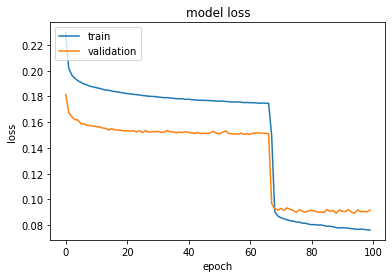

Model: "functional_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 3, 3, 16)]        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 1, 1, 150)         21750     
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_11 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 1, 1, 3)         

2022-03-20 22:47:36.076416: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:47:36.076558: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:47:36.366061: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:47:36.385973: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:47:36.386264: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:47:36.387355: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_47_36
2022-03-20 22:47:36.387917: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_47_36/vw.trace.json.gz
2022-03-20 22:47:36.387991: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:47:36.388801: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

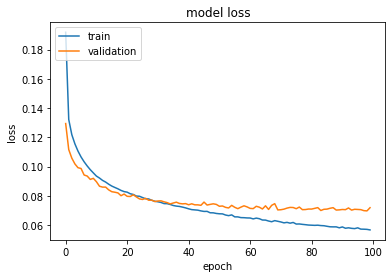

Model: "functional_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 3, 3, 26)]        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 1, 1, 150)         35250     
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_12 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 1, 1, 3)         

2022-03-20 22:48:18.814171: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:48:18.814284: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:48:19.115713: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:48:19.134156: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:48:19.134459: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:48:19.135652: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_48_19
2022-03-20 22:48:19.136240: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_48_19/vw.trace.json.gz
2022-03-20 22:48:19.136350: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:48:19.137309: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

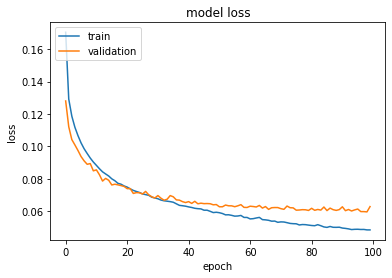

Model: "functional_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_14 (InputLayer)        [(None, 3, 3, 36)]        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 1, 1, 150)         48750     
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_13 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 1, 1, 3)         

2022-03-20 22:49:04.513895: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:49:04.513994: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:49:04.869029: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:49:04.889617: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:49:04.889929: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:49:04.891112: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_49_04
2022-03-20 22:49:04.891712: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_49_04/vw.trace.json.gz
2022-03-20 22:49:04.891797: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:49:04.892690: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

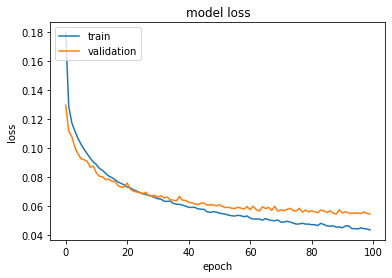

Model: "functional_37"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_15 (InputLayer)        [(None, 3, 3, 46)]        0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 1, 1, 150)         62250     
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_14 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 1, 1, 3)         

2022-03-20 22:49:58.423992: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:49:58.424095: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:49:58.727256: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:49:58.744504: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:49:58.744784: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:49:58.746367: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_49_58
2022-03-20 22:49:58.746890: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_49_58/vw.trace.json.gz
2022-03-20 22:49:58.746958: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:49:58.747698: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

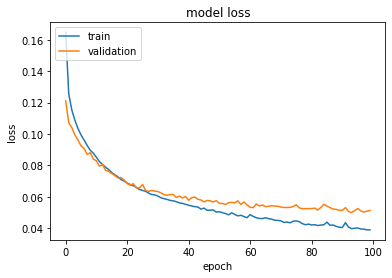

Model: "functional_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        [(None, 3, 3, 56)]        0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 1, 1, 150)         75750     
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_15 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 1, 1, 3)         

2022-03-20 22:50:54.549529: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:50:54.549611: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:50:54.948553: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:50:54.968269: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:50:54.968557: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:50:54.969668: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_50_54
2022-03-20 22:50:54.970249: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_50_54/vw.trace.json.gz
2022-03-20 22:50:54.970338: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:50:54.971169: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

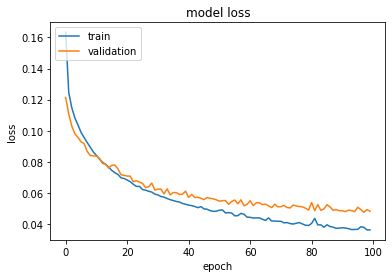

Model: "functional_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        [(None, 3, 3, 66)]        0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 1, 1, 150)         89250     
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_16 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_34 (Conv2D)           (None, 1, 1, 3)         

2022-03-20 22:51:53.173381: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:51:53.173508: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:51:53.718669: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:51:53.743689: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:51:53.743998: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:51:53.745206: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_51_53
2022-03-20 22:51:53.745779: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_51_53/vw.trace.json.gz
2022-03-20 22:51:53.745869: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:51:53.746747: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

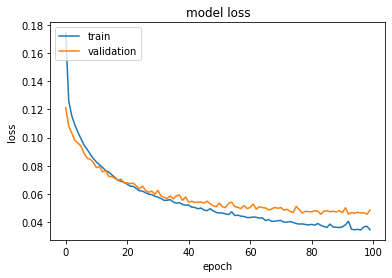

Model: "functional_49"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_18 (InputLayer)        [(None, 3, 3, 76)]        0         
_________________________________________________________________
conv2d_35 (Conv2D)           (None, 1, 1, 150)         102750    
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_17 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_39 (Conv2D)           (None, 1, 1, 3)         

2022-03-20 22:52:53.905798: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:52:53.905912: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:52:54.316187: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:52:54.337450: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:52:54.337747: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:52:54.338884: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_52_54
2022-03-20 22:52:54.339455: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_52_54/vw.trace.json.gz
2022-03-20 22:52:54.339532: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:52:54.340391: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

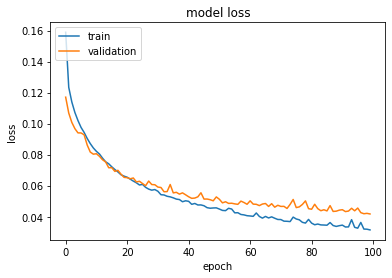

Model: "functional_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        [(None, 3, 3, 86)]        0         
_________________________________________________________________
conv2d_40 (Conv2D)           (None, 1, 1, 150)         116250    
_________________________________________________________________
conv2d_41 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_42 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_43 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_18 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 1, 1, 3)         

2022-03-20 22:53:59.836792: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:53:59.836867: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:54:00.262969: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:54:00.282306: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:54:00.282593: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:54:00.283703: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_54_00
2022-03-20 22:54:00.284306: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_54_00/vw.trace.json.gz
2022-03-20 22:54:00.284401: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:54:00.285263: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

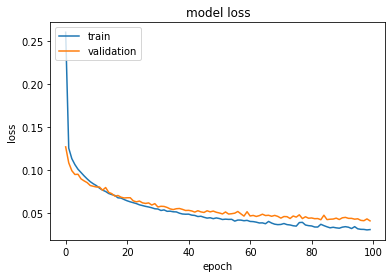

Model: "functional_57"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_20 (InputLayer)        [(None, 3, 3, 96)]        0         
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 1, 1, 150)         129750    
_________________________________________________________________
conv2d_46 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_47 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
conv2d_48 (Conv2D)           (None, 1, 1, 150)         22650     
_________________________________________________________________
dropout_19 (Dropout)         (None, 1, 1, 150)         0         
_________________________________________________________________
conv2d_49 (Conv2D)           (None, 1, 1, 3)         

2022-03-20 22:55:04.623411: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:55:04.623535: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:55:05.054277: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:55:05.074842: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:55:05.075136: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:55:05.076237: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_55_05
2022-03-20 22:55:05.076796: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_55_05/vw.trace.json.gz
2022-03-20 22:55:05.076869: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:55:05.077685: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

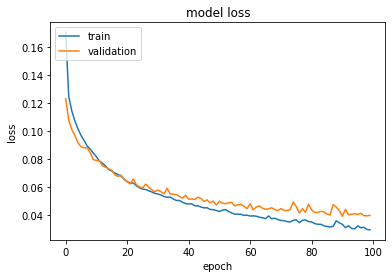

In [10]:
for i in np.arange(start=6, stop=97, step=10):
    # train the network with varied number of input size
    cmd = "--train_subjects s01_still --model conv2d --layer 4 --train --label_type A --DWI " + str(i)
    plot_loss(cmd)

In [11]:
for i in np.arange(start=6, stop=97, step=10):
    # test the trained network
    cmd = "--test_subjects s02_still --model conv2d --layer 4 --label_type A --DWI " + str(i)
    print(i)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

6
6-conv2d-patch_3-base_1-layer_4-label_NDIODIFWF
(84, 84, 6)
Model: "functional_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_21 (InputLayer)        [(None, 84, 84, 6)]       0         
_________________________________________________________________
conv2d_50 (Conv2D)           (None, 82, 82, 150)       8250      
_________________________________________________________________
conv2d_51 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_52 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
conv2d_53 (Conv2D)           (None, 82, 82, 150)       22650     
_________________________________________________________________
dropout_20 (Dropout)         (None, 82, 82, 150)       0         
_________________________________________________________

In [ ]:
# visualise the ref imgs
ref_slice_0 = s02_NDI_img_data[26, :, :]
ref_slice_1 = s02_NDI_img_data[:, 30, :]
ref_slice_2 = s02_NDI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_NDI reference image")

ref_slice_0 = s02_ODI_img_data[26, :, :]
ref_slice_1 = s02_ODI_img_data[:, 30, :]
ref_slice_2 = s02_ODI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_ODI reference image")

ref_slice_0 = s02_FWF_img_data[26, :, :]
ref_slice_1 = s02_FWF_img_data[:, 30, :]
ref_slice_2 = s02_FWF_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_FWF reference image")

# visualise the pred imgs produced at varied input size
for i in np.arange(start=6, stop=97, step=10):

    ndi_path = '../Net/nii/s02_still-'+str(i)+'-conv2d-patch_3-base_1-layer_4-label_NDI.nii'
    odi_path = '../Net/nii/s02_still-'+str(i)+'-conv2d-patch_3-base_1-layer_4-label_ODI.nii'
    fwf_path = '../Net/nii/s02_still-'+str(i)+'-conv2d-patch_3-base_1-layer_4-label_FWF.nii'
    ndi_data = ndi_img.get_fdata()
    odi_img = nib.load(odi_path)
    odi_data = odi_img.get_fdata()
    fwf_img = nib.load(fwf_path)
    fwf_data = fwf_img.get_fdata()

    ndi0 = ndi_data[26, :, :]
    ndi1 = ndi_data[:, 30, :]
    ndi2 = ndi_data[:, :, 16]
    show_slices([ndi0, ndi1, ndi2])
    plt.suptitle("Center slices for s02_still_NDI predicted image by 2D CNN, input size="+str(i))
    (score, ndidiff) = compare_ssim(ndi_data, s02_NDI_img_data, full=True)
    print(str(i)+'input size the ssim score for ndi is: ' + str(score))

    odi0 = odi_data[26, :, :]
    odi1 = odi_data[:, 30, :]
    odi2 = odi_data[:, :, 16]
    show_slices([odi0, odi1, odi2])
    plt.suptitle("Center slices for s02_still_ODI predicted image by 2D CNN, input size="+str(i))
    (score, odidiff) = compare_ssim(odi_data, s02_ODI_img_data, full=True)
    print(str(i)+'input size the ssim score for odi is: ' + str(score))

    fwf0 = fwf_data[26, :, :]
    fwf1 = fwf_data[:, 30, :]
    fwf2 = fwf_data[:, :, 16]
    show_slices([fwf0, fwf1, fwf2])
    plt.suptitle("Center slices for s02_still_FWF predicted image by 2D CNN, input size="+str(i))
    (score, fwfdiff) = compare_ssim(fwf_data, s02_FWF_img_data, full=True)
    print(str(i)+'input size the ssim score for fwf is: ' + str(score))

    # plot the difference map between the imgs by the lib
    ndidiff0 = ndidiff[26, :, :]
    ndidiff1 = ndidiff[:, 30, :]
    ndidiff2 = ndidiff[:, :, 16]
    show_slices([ndidiff0, ndidiff1, ndidiff2], grayscale=False)
    plt.suptitle("Difference map NDI input size="+str(i))

    odidiff0 = odidiff[26, :, :]
    odidiff1 = odidiff[:, 30, :]
    odidiff2 = odidiff[:, :, 16]
    show_slices([odidiff0, odidiff1, odidiff2], grayscale=False)
    plt.suptitle("Difference map ODI input size="+str(i))

    fwfdiff0 = fwfdiff[26, :, :]
    fwfdiff1 = fwfdiff[:, 30, :]
    fwfdiff2 = fwfdiff[:, :, 16]
    show_slices([fwfdiff0, fwfdiff1, fwfdiff2], grayscale=False)
    plt.suptitle("Difference map FWF input size="+str(i))

3D CNN

Model: "functional_81"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_31 (InputLayer)        [(None, 3, 3, 3, 6)]      0         
_________________________________________________________________
conv3d (Conv3D)              (None, 1, 1, 1, 150)      24450     
_________________________________________________________________
conv3d_1 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_2 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_3 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_30 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_4 (Conv3D)            (None, 1, 1, 1, 3)      

2022-03-20 22:56:19.838709: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:56:19.838860: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:56:20.129418: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:56:20.176234: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:56:20.176551: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:56:20.177762: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_56_20
2022-03-20 22:56:20.178322: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_56_20/vw.trace.json.gz
2022-03-20 22:56:20.178432: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:56:20.179334: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

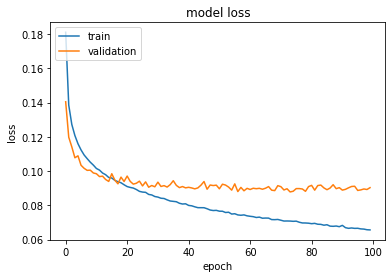

Model: "functional_85"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_32 (InputLayer)        [(None, 3, 3, 3, 16)]     0         
_________________________________________________________________
conv3d_5 (Conv3D)            (None, 1, 1, 1, 150)      64950     
_________________________________________________________________
conv3d_6 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_7 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_8 (Conv3D)            (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_31 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_9 (Conv3D)            (None, 1, 1, 1, 3)      

2022-03-20 22:57:10.431604: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:57:10.431700: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:57:10.771404: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:57:10.789595: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:57:10.789881: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:57:10.790976: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_57_10
2022-03-20 22:57:10.791537: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_57_10/vw.trace.json.gz
2022-03-20 22:57:10.791610: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:57:10.792434: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

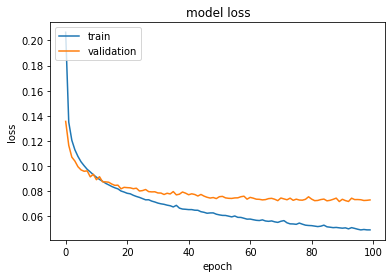

Model: "functional_89"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_33 (InputLayer)        [(None, 3, 3, 3, 26)]     0         
_________________________________________________________________
conv3d_10 (Conv3D)           (None, 1, 1, 1, 150)      105450    
_________________________________________________________________
conv3d_11 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_12 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_13 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_32 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_14 (Conv3D)           (None, 1, 1, 1, 3)      

2022-03-20 22:58:07.993912: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:58:07.993988: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:58:08.374299: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:58:08.397202: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:58:08.397494: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:58:08.398708: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_58_08
2022-03-20 22:58:08.399321: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_58_08/vw.trace.json.gz
2022-03-20 22:58:08.399418: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:58:08.400408: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

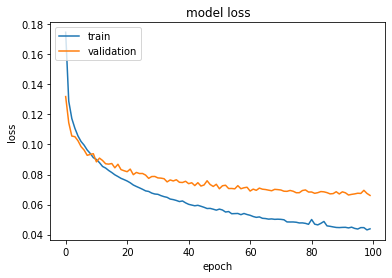

Model: "functional_93"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_34 (InputLayer)        [(None, 3, 3, 3, 36)]     0         
_________________________________________________________________
conv3d_15 (Conv3D)           (None, 1, 1, 1, 150)      145950    
_________________________________________________________________
conv3d_16 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_17 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_18 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_33 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_19 (Conv3D)           (None, 1, 1, 1, 3)      

2022-03-20 22:59:15.551203: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:59:15.551321: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 22:59:16.019132: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 22:59:16.041660: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 22:59:16.041969: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 22:59:16.043228: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_22_59_16
2022-03-20 22:59:16.043869: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_22_59_16/vw.trace.json.gz
2022-03-20 22:59:16.043959: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 22:59:16.044926: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

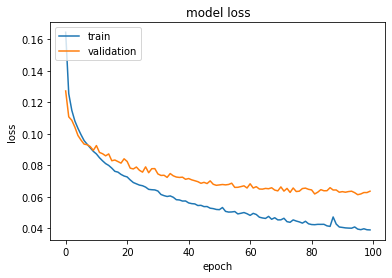

Model: "functional_97"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_35 (InputLayer)        [(None, 3, 3, 3, 46)]     0         
_________________________________________________________________
conv3d_20 (Conv3D)           (None, 1, 1, 1, 150)      186450    
_________________________________________________________________
conv3d_21 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_22 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_23 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_34 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_24 (Conv3D)           (None, 1, 1, 1, 3)      

2022-03-20 23:00:32.142130: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 23:00:32.142220: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 23:00:32.556155: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 23:00:32.579252: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 23:00:32.579574: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 23:00:32.580812: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_23_00_32
2022-03-20 23:00:32.581444: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_23_00_32/vw.trace.json.gz
2022-03-20 23:00:32.581557: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 23:00:32.582538: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

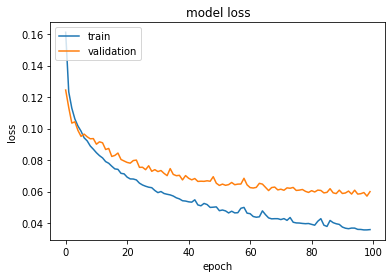

Model: "functional_101"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_36 (InputLayer)        [(None, 3, 3, 3, 56)]     0         
_________________________________________________________________
conv3d_25 (Conv3D)           (None, 1, 1, 1, 150)      226950    
_________________________________________________________________
conv3d_26 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_27 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_28 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_35 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_29 (Conv3D)           (None, 1, 1, 1, 3)     

2022-03-20 23:01:55.465709: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 23:01:55.465802: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 23:01:55.912194: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 23:01:55.938454: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 23:01:55.938767: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 23:01:55.939973: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_23_01_55
2022-03-20 23:01:55.940581: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_23_01_55/vw.trace.json.gz
2022-03-20 23:01:55.940673: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 23:01:55.941596: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

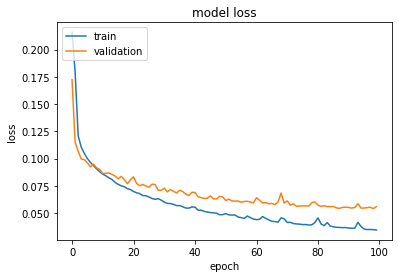

Model: "functional_105"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_37 (InputLayer)        [(None, 3, 3, 3, 66)]     0         
_________________________________________________________________
conv3d_30 (Conv3D)           (None, 1, 1, 1, 150)      267450    
_________________________________________________________________
conv3d_31 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_32 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_33 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_36 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_34 (Conv3D)           (None, 1, 1, 1, 3)     

2022-03-20 23:03:24.956200: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 23:03:24.956347: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 23:03:25.386380: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 23:03:25.408310: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 23:03:25.408620: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 23:03:25.409849: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_23_03_25
2022-03-20 23:03:25.410455: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_23_03_25/vw.trace.json.gz
2022-03-20 23:03:25.410543: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 23:03:25.411441: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

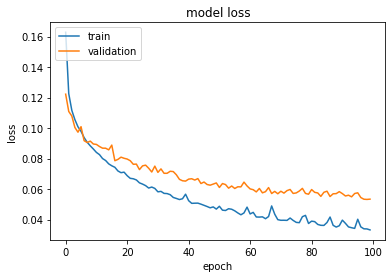

Model: "functional_109"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_38 (InputLayer)        [(None, 3, 3, 3, 76)]     0         
_________________________________________________________________
conv3d_35 (Conv3D)           (None, 1, 1, 1, 150)      307950    
_________________________________________________________________
conv3d_36 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_37 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_38 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_37 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_39 (Conv3D)           (None, 1, 1, 1, 3)     

2022-03-20 23:05:01.833936: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 23:05:01.834015: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 23:05:02.268254: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 23:05:02.290062: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 23:05:02.290367: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 23:05:02.291512: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_23_05_02
2022-03-20 23:05:02.292101: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_23_05_02/vw.trace.json.gz
2022-03-20 23:05:02.292176: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 23:05:02.293041: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

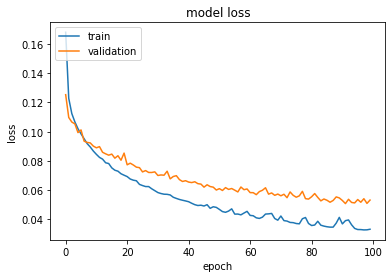

Model: "functional_113"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_39 (InputLayer)        [(None, 3, 3, 3, 86)]     0         
_________________________________________________________________
conv3d_40 (Conv3D)           (None, 1, 1, 1, 150)      348450    
_________________________________________________________________
conv3d_41 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_42 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_43 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_38 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_44 (Conv3D)           (None, 1, 1, 1, 3)     

2022-03-20 23:06:48.696942: W tensorflow/core/framework/cpu_allocator_impl.cc:81] Allocation of 767569608 exceeds 10% of free system memory.


Training start ...


2022-03-20 23:06:49.086294: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 23:06:49.086450: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed


2022-03-20 23:06:49.534995: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 23:06:49.558367: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 23:06:49.558682: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 23:06:49.559849: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_23_06_49
2022-03-20 23:06:49.560447: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_23_06_49/vw.trace.json.gz
2022-03-20 23:06:49.560524: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 23:06:49.561396: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022

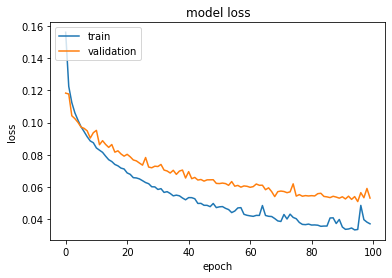

Model: "functional_117"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_40 (InputLayer)        [(None, 3, 3, 3, 96)]     0         
_________________________________________________________________
conv3d_45 (Conv3D)           (None, 1, 1, 1, 150)      388950    
_________________________________________________________________
conv3d_46 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_47 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
conv3d_48 (Conv3D)           (None, 1, 1, 1, 150)      22650     
_________________________________________________________________
dropout_39 (Dropout)         (None, 1, 1, 1, 150)      0         
_________________________________________________________________
conv3d_49 (Conv3D)           (None, 1, 1, 1, 3)     

2022-03-20 23:08:46.330855: W tensorflow/core/framework/cpu_allocator_impl.cc:81] Allocation of 856821888 exceeds 10% of free system memory.
2022-03-20 23:08:46.766689: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.


Training start ...


2022-03-20 23:08:46.766791: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 23:08:47.304670: I tensorflow/core/profiler/lib/profiler_session.cc:164] Profiler session started.
2022-03-20 23:08:47.333495: I tensorflow/core/profiler/internal/gpu/cupti_tracer.cc:1513] CUPTI activity buffer flushed
2022-03-20 23:08:47.333824: I tensorflow/core/profiler/internal/gpu/device_tracer.cc:223]  GpuTracer has collected 0 callback api events and 0 activity events. 
2022-03-20 23:08:47.335066: I tensorflow/core/profiler/rpc/client/save_profile.cc:176] Creating directory: logs/train/plugins/profile/2022_03_20_23_08_47
2022-03-20 23:08:47.335660: I tensorflow/core/profiler/rpc/client/save_profile.cc:182] Dumped gzipped tool data for trace.json.gz to logs/train/plugins/profile/2022_03_20_23_08_47/vw.trace.json.gz
2022-03-20 23:08:47.335743: E tensorflow/core/profiler/utils/hardware_type_utils.cc:61] Invalid GPU compute capability.
2022-03-20 23:08:4

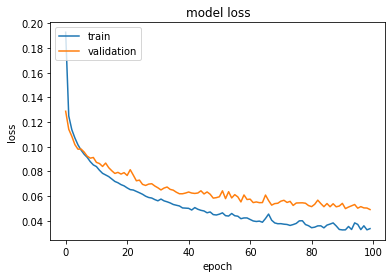

In [12]:
for i in np.arange(start=6, stop=97, step=10):
    # train the network with varied number of input size
    cmd = "--train_subjects s01_still --model conv3d --layer 4 --train --label_type A --DWI " + str(i)
    plot_loss(cmd)

In [13]:
for i in np.arange(start=6, stop=97, step=10):
    # test the trained network
    cmd = "--test_subjects s02_still --model conv3d --layer 4 --label_type A --DWI " + str(i)
    print(i)
    args = model_parser().parse_args(cmd.split())
    test_model(args)

6
6-conv3d-patch_3-base_1-layer_4-label_NDIODIFWF
(84, 84, 50)
Model: "functional_121"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_41 (InputLayer)        [(None, 84, 84, 50, 6)]   0         
_________________________________________________________________
conv3d_50 (Conv3D)           (None, 82, 82, 48, 150)   24450     
_________________________________________________________________
conv3d_51 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_52 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
conv3d_53 (Conv3D)           (None, 82, 82, 48, 150)   22650     
_________________________________________________________________
dropout_40 (Dropout)         (None, 82, 82, 48, 150)   0         
_______________________________________________________

In [ ]:
# visualise the ref imgs
ref_slice_0 = s02_NDI_img_data[26, :, :]
ref_slice_1 = s02_NDI_img_data[:, 30, :]
ref_slice_2 = s02_NDI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_NDI reference image")

ref_slice_0 = s02_ODI_img_data[26, :, :]
ref_slice_1 = s02_ODI_img_data[:, 30, :]
ref_slice_2 = s02_ODI_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_ODI reference image")

ref_slice_0 = s02_FWF_img_data[26, :, :]
ref_slice_1 = s02_FWF_img_data[:, 30, :]
ref_slice_2 = s02_FWF_img_data[:, :, 16]
show_slices([ref_slice_0, ref_slice_1, ref_slice_2])
plt.suptitle("Center slices for s02_still_FWF reference image")

# visualise the pred imgs produced at varied input size
for i in np.arange(start=6, stop=97, step=10):

    ndi_path = '../Net/nii/s02_still-'+str(i)+'-conv2d-patch_3-base_1-layer_4-label_NDI.nii'
    odi_path = '../Net/nii/s02_still-'+str(i)+'-conv2d-patch_3-base_1-layer_4-label_ODI.nii'
    fwf_path = '../Net/nii/s02_still-'+str(i)+'-conv2d-patch_3-base_1-layer_4-label_FWF.nii'
    ndi_img = nib.load(ndi_path)
    ndi_data = ndi_img.get_fdata()
    odi_img = nib.load(odi_path)
    odi_data = odi_img.get_fdata()
    fwf_img = nib.load(fwf_path)
    fwf_data = fwf_img.get_fdata()

    ndi0 = ndi_data[26, :, :]
    ndi1 = ndi_data[:, 30, :]
    ndi2 = ndi_data[:, :, 16]
    show_slices([ndi0, ndi1, ndi2])
    plt.suptitle("Center slices for s02_still_NDI predicted image by 3D CNN, input size="+str(i))
    (score, ndidiff) = compare_ssim(ndi_data, s02_NDI_img_data, full=True)
    print(str(i)+'input size the ssim score for ndi is: ' + str(score))

    odi0 = odi_data[26, :, :]
    odi1 = odi_data[:, 30, :]
    odi2 = odi_data[:, :, 16]
    show_slices([odi0, odi1, odi2])
    plt.suptitle("Center slices for s02_still_ODI predicted image by 3D CNN, input size="+str(i))
    (score, odidiff) = compare_ssim(odi_data, s02_ODI_img_data, full=True)
    print(str(i)+'input size the ssim score for odi is: ' + str(score))

    fwf0 = fwf_data[26, :, :]
    fwf1 = fwf_data[:, 30, :]
    fwf2 = fwf_data[:, :, 16]
    show_slices([fwf0, fwf1, fwf2])
    plt.suptitle("Center slices for s02_still_FWF predicted image by 3D CNN, input size="+str(i))
    (score, fwfdiff) = compare_ssim(fwf_data, s02_FWF_img_data, full=True)
    print(str(i)+'input size the ssim score for fwf is: ' + str(score))

    # plot the difference map between the imgs by the lib
    ndidiff0 = ndidiff[26, :, :]
    ndidiff1 = ndidiff[:, 30, :]
    ndidiff2 = ndidiff[:, :, 16]
    show_slices([ndidiff0, ndidiff1, ndidiff2], grayscale=False)
    plt.suptitle("Difference map NDI input size="+str(i))

    odidiff0 = odidiff[26, :, :]
    odidiff1 = odidiff[:, 30, :]
    odidiff2 = odidiff[:, :, 16]
    show_slices([odidiff0, odidiff1, odidiff2], grayscale=False)
    plt.suptitle("Difference map ODI input size="+str(i))

    fwfdiff0 = fwfdiff[26, :, :]
    fwfdiff1 = fwfdiff[:, 30, :]
    fwfdiff2 = fwfdiff[:, :, 16]
    show_slices([fwfdiff0, fwfdiff1, fwfdiff2], grayscale=False)
    plt.suptitle("Difference map FWF input size="+str(i))